### Overview
The goal of this competition is classification of mixed protein patterns. However, unlike most image labeling tasks, where binary or multiclass labeling is considered, in this competition each image can have multiple labels. Multiclass multilabel task has its own specific affecting the design of the model and the loss function. Moreover, the classified images are quite different from ImageNet; therefore, despite usage of a pretrained model is quite helpful, a substantial retraining of entire model is needed. An additional challenge is 4-chanel input to the model (RGBY), which is different from ones used in most of pretrained models (RGB input).

In this kernel I will show how to handle the above challenges and get started with this competition. I will begin with using a light ResNet34 model and low-resolution images to have a baseline that can be used later to select higher end models and explore the effect of image resolution on the prediction accuracy. **The validation F1 score of the model is ~0.65-0.7**, and I was able to get 0.460 public LB score in V11 of the kernel. Though reuslts are slightly different from one run to another because F1 macro metric is unstable, and sevral items of rear classes contribute in the same way as as thousands items of common classes, 1/28.

The problem of low public LB score of the model, which mentioned in the first versions of the kernel, is resulted by a bug in the evaluation metric (https://www.kaggle.com/c/human-protein-atlas-image-classification/discussion/69366#409041) that relies on the order of records in the submission file rather than IDs.

In [1]:
from fastai.conv_learner import *
from fastai.dataset import *

import pandas as pd
import numpy as np
import os
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
import scipy.optimize as opt

In [2]:
PATH = './'
TRAIN = '../input/train-all/'
TEST = '../input/test/'
LABELS = '../input/train_hpav18.csv'
SAMPLE = '../input/sample_submission.csv'

In [3]:
name_label_dict = {
0:  'Nucleoplasm',
1:  'Nuclear membrane',
2:  'Nucleoli',   
3:  'Nucleoli fibrillar center',
4:  'Nuclear speckles',
5:  'Nuclear bodies',
6:  'Endoplasmic reticulum',   
7:  'Golgi apparatus',
8:  'Peroxisomes',
9:  'Endosomes',
10:  'Lysosomes',
11:  'Intermediate filaments',
12:  'Actin filaments',
13:  'Focal adhesion sites',   
14:  'Microtubules',
15:  'Microtubule ends',  
16:  'Cytokinetic bridge',   
17:  'Mitotic spindle',
18:  'Microtubule organizing center',  
19:  'Centrosome',
20:  'Lipid droplets',
21:  'Plasma membrane',   
22:  'Cell junctions', 
23:  'Mitochondria',
24:  'Aggresome',
25:  'Cytosol',
26:  'Cytoplasmic bodies',   
27:  'Rods & rings' }

In [4]:
nw = 2   #number of workers for data loader
arch = resnet18 #specify target architecture

### Data

In [5]:
train_names = list({f for f in os.listdir(TRAIN)})
train_names = list({f.split('_green')[0] for f in train_names})
train_names = list({f.split('_yellow')[0] for f in train_names})
train_names = list({f.split('_blue')[0] for f in train_names})
train_names = list({f.split('_red')[0] for f in train_names})
# train_names_f = list({f for f in os.listdir(TRAIN)})
test_names = list({f[:36] for f in os.listdir(TEST)})
tr_n, val_n = train_test_split(train_names, test_size=0.1, random_state=42)
len(train_names)
# len(train_names_f)
# for train_name in train_names:
#     count = 0
#     for f in train_names_f:
#         if train_name in f:
#             count += 1
#             if count == 4:
#                 break
# #     print(count, train_name)
#     if count < 4:
#         print(count, train_name)
# 3 30088_402_G8_2
# 1 6123_967_C5_1
# 2 52188_790_E11_1
# 3 3256_34_B1_2
# 1 38546_435_B2_2
# 2 38690_455_A9_3
# 3 40866_480_G7_1
# 2 55007_1182_E5_2
# 3 2162_668_H1_2
# 1 43550_805_E2_2
# 1 46693_964_F7_1
# 2 39075_488_G12_1
# 1 38716_1116_G2_2
# 3 18071_205_H4_1
# 2 25690_257_F2_2
# 3 12185_617_D7_4
# 3 34012_932_A12_2
# 3 40412_539_D5_3
# 2 38197_1216_G7_2
# 1 44143_558_F1_7
# 2 63634_1401_A12_3
# 2 43666_555_D7_1
# 3 44255_527_H7_2
# 2 78061_1700_C4_17_cr57eba921ea68e
# 2 5579_659_D2_2
# 2 1164_30_B1_1
# 1 7393_38_B12_2

74833

In [6]:
def open_rgby(path,id): #a function that reads RGBY image
    colors = ['red','green','blue','yellow']
    flags = cv2.IMREAD_GRAYSCALE
    img = [cv2.imread(os.path.join(path, id+'_'+color+'.png'), flags).astype(np.float32)/255
           for color in colors]
    return np.stack(img, axis=-1)

Since a multiclass multilabel task is considered, there are several things about the model that should be pointed out. First, the SOFTMAX MUST NOT BE USED as an output layer because it encourages a single label prediction. The common output function for multilabel tasks is sigmoid. However, combining the sigmoid with the loss function (like in BCE with logits loss or in Focal loss used in this kernel) allows log(sigmoid) optimization of the numerical stability of the loss function. Therefore, sigmoid is also removed.

In [7]:
class pdFilesDataset(FilesDataset):
    def __init__(self, fnames, path, transform):
        self.labels = pd.read_csv(LABELS).set_index('Id')
        self.labels['Target'] = [[int(i) for i in s.split()] for s in self.labels['Target']]
        super().__init__(fnames, transform, path)
    
    def get_x(self, i):
        img = open_rgby(self.path,self.fnames[i])
        if self.sz == 512: return img 
        else: return cv2.resize(img, (self.sz, self.sz),cv2.INTER_AREA)
    
    def get_y(self, i):
        if(self.path == TEST): return np.zeros(len(name_label_dict),dtype=np.int)
        else:
            labels = self.labels.loc[self.fnames[i]]['Target']
            return np.eye(len(name_label_dict),dtype=np.float)[labels].sum(axis=0)
        
    @property
    def is_multi(self): return True
    @property
    def is_reg(self):return True
    #this flag is set to remove the output sigmoid that allows log(sigmoid) optimization
    #of the numerical stability of the loss function
    
    def get_c(self): return len(name_label_dict) #number of classes

In [8]:
def get_data(sz,bs):
    #data augmentation
    #add max_zoom=1.2
    aug_tfms = [RandomRotateZoom(deg=45, zoom=0.05, stretch=0, tfm_y=TfmType.NO),
                RandomDihedral(tfm_y=TfmType.NO),
                RandomLighting(0.02, 0.02, tfm_y=TfmType.NO)]
    #mean and std in of each channel in the train set
    stats = A([0.08069, 0.05258, 0.05487, 0.08282], [0.13704, 0.10145, 0.15313, 0.13814])
    tfms = tfms_from_stats(stats, sz, crop_type=CropType.NO, tfm_y=TfmType.NO, 
                aug_tfms=aug_tfms)
    ds = ImageData.get_ds(pdFilesDataset, (tr_n[:-(len(tr_n)%bs)],TRAIN), 
                (val_n,TRAIN), tfms, test=(test_names,TEST))
    md = ImageData(PATH, ds, bs, num_workers=nw, classes=None)
    return md

In [9]:
bs = 40
sz = 512
md = get_data(sz,bs)

x,y = next(iter(md.trn_dl))
x.shape, y.shape

(torch.Size([40, 4, 512, 512]), torch.Size([40, 28]))

Plot several examples of input images.

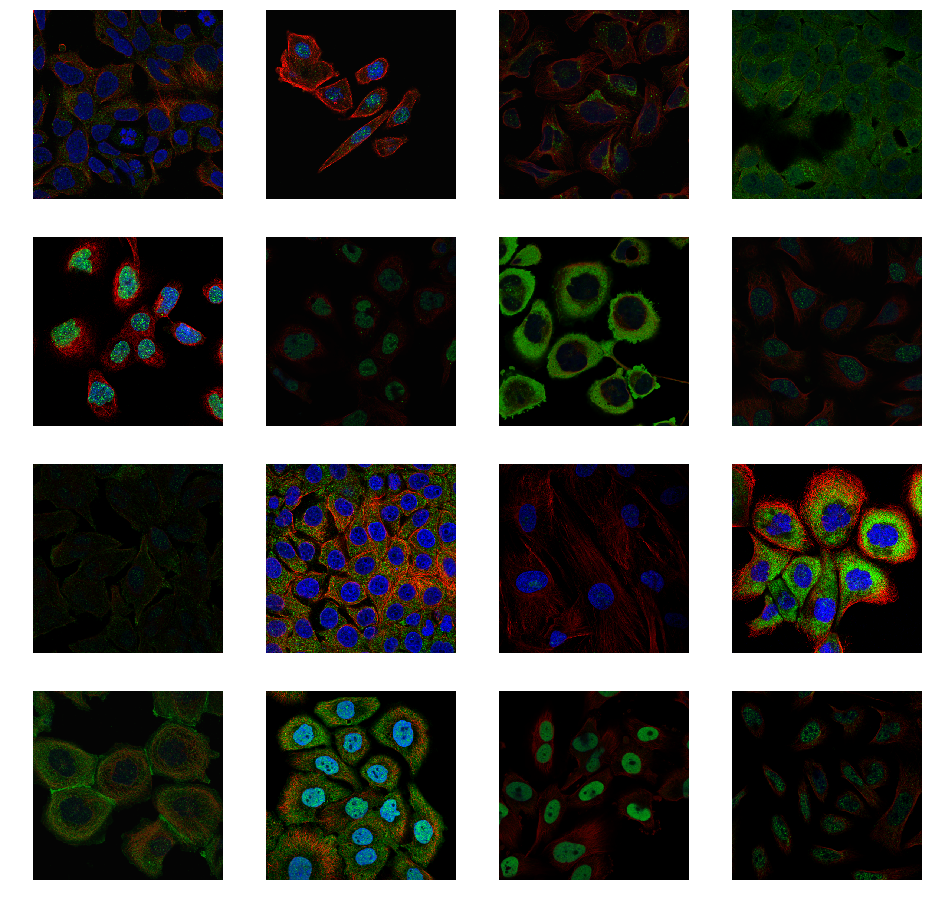

In [10]:
def display_imgs(x):
    columns = 4
    bs = x.shape[0]
    rows = min((bs+3)//4,4)
    fig=plt.figure(figsize=(columns*4, rows*4))
    for i in range(rows):
        for j in range(columns):
            idx = i+j*columns
            fig.add_subplot(rows, columns, idx+1)
            plt.axis('off')
            plt.imshow((x[idx,:,:,:3]*255).astype(np.int))
    plt.show()
    
display_imgs(np.asarray(md.trn_ds.denorm(x)))

Computing image statistics in the train set. The values listed below are computed without augmentation, therefore the result of the next cell may be a little bit different.
1. train: (array([0.08069, 0.05258, 0.05487, 0.08282]), array([0.13704, 0.10145, 0.15313, 0.13814]))
1. test: (array([0.05913, 0.0454 , 0.04066, 0.05928]),  array([0.11734, 0.09503, 0.129  , 0.11528]))

In [11]:
# x_tot = np.zeros(4)
# x2_tot = np.zeros(4)
# for x,y in iter(md.trn_dl):
#     tmp =  md.trn_ds.denorm(x).reshape(16,-1)
#     x = md.trn_ds.denorm(x).reshape(-1,4)
#     x_tot += x.mean(axis=0)
#     x2_tot += (x**2).mean(axis=0)

# channel_avr = x_tot/len(md.trn_dl)
# channel_std = np.sqrt(x2_tot/len(md.trn_dl) - channel_avr**2)
# channel_avr,channel_std
channel_avr=[0.05696, 0.04871, 0.03119, 0.09069]
channel_std=[0.10383, 0.08966, 0.10284, 0.14568]

### Loss function and metrics

One of the challenges of this competition is strong data imbalance. Some classes, like "Nucleoplasm", are very common, while there is a number of rare classes, like "Endosomes", "Lysosomes", and "Rods & rings". In addition, in tasks of multiclass, and especially in multilabel, classification there is always an issue with data imbalance: if you predict 1 class out of 10, given the same number of examples per each class, you have 1 positive vs. 9 negative examples. So, it is crucial to use a loss function that accounts for it. Recently proposed focal loss (https://arxiv.org/pdf/1708.02002.pdf) has revolutionized one stage object localization method in 2017. It is design to address the issue of strong data imbalance, demonstrating amazing results on datasets with imbalance level 1:10-1000. In particular, it works quite well for image segmentation task in "Airbus Ship Detection Challenge": https://www.kaggle.com/iafoss/unet34-dice-0-87 .  The implementation of focal loss is borrowed from https://becominghuman.ai/investigating-focal-and-dice-loss-for-the-kaggle-2018-data-science-bowl-65fb9af4f36c .

In [12]:
# class FocalLoss(nn.Module):
#     def __init__(self, gamma=2):
#         super().__init__()
#         self.gamma = gamma
        
#     def forward(self, input, target):
#         if not (target.size() == input.size()):
#             raise ValueError("Target size ({}) must be the same as input size ({})"
#                              .format(target.size(), input.size()))

#         max_val = (-input).clamp(min=0)
#         loss = input - input * target + max_val + \
#             ((-max_val).exp() + (-input - max_val).exp()).log()

#         invprobs = F.logsigmoid(-input * (target * 2.0 - 1.0))
#         loss = (invprobs * self.gamma).exp() * loss
        
#         return loss.sum(dim=1).mean()
class FocalLoss(nn.Module):
    def __init__(self, gamma=2 , weight = None):
        super(type(self),self).__init__()
        self.gamma = gamma
        self.weight = weight
        if self.weight is not None:
            self.normalized_weight = nn.Parameter( self.weight / weight.sum() , requires_grad = False )
        
    def forward(self, input, target):
        if not (target.size() == input.size()):
            raise ValueError("Target size ({}) must be the same as input size ({})" .format(target.size(), input.size()))

        max_val = (-input).clamp(min=0)
        loss = input - input * target + max_val + ((-max_val).exp() + (-input - max_val).exp()).log()

        invprobs = F.logsigmoid(-input * ((target > 0.5).float() * 2.0 - 1.0))
        loss = (invprobs * self.gamma).exp() * loss
        
        if self.weight is None:
            loss = 1.0 / loss.shape[1] * loss
        else:
#             loss = loss * self.normalized_weight.view(1,-1)
            loss = loss * self.normalized_weight
        return loss.sum(dim=1).mean()

In [13]:
def acc(preds,targs,th=0.0):
    preds = (preds > th).int()
    targs = targs.int()
    return (preds==targs).float().mean()

### Training

One of the challenges in this competition is 4-chanel input (RGBY) that limits usage of ImageNet pretrained models taking RGB input. However, the input dataset is too tiny to train even a low capacity model like ResNet34 from scratch. I propose to use the following way to walk around this limitation. The most common way to convert RGBY to RGB is just dropping Y channel while keeping RGB without modification. Therefore, I replace the first convolution layer from 7x7 3->64 to 7x7 **4->64** while keeping weights from 3->64 and setting new initial weighs for Y channel to be zero. It allows using the original weights to initialize the network while giving the opportunity to the model to incorporate Y channel into prediction during the following training (when the first layers of the model are unfreezed). In the following hiden cell I put a code from fast.ai library with adding several lines for the replacment of the first convolutional layer.

In [14]:
class ConvnetBuilder_custom():
    def __init__(self, f, c, is_multi, is_reg, ps=None, xtra_fc=None, xtra_cut=0, 
                 custom_head=None, pretrained=True):
        self.f,self.c,self.is_multi,self.is_reg,self.xtra_cut = f,c,is_multi,is_reg,xtra_cut
        if xtra_fc is None: xtra_fc = [512]
        if ps is None: ps = [0.25]*len(xtra_fc) + [0.5]
        self.ps,self.xtra_fc = ps,xtra_fc

        if f in model_meta: cut,self.lr_cut = model_meta[f]
        else: cut,self.lr_cut = 0,0
        cut-=xtra_cut
        layers = cut_model(f(pretrained), cut)
        
        #replace first convolutional layer by 4->64 while keeping corresponding weights
        #and initializing new weights with zeros
        w = layers[0].weight
        layers[0] = nn.Conv2d(4,64,kernel_size=(7,7),stride=(2,2),padding=(3, 3), bias=False)
        #layers[0].weight = torch.nn.Parameter(torch.cat((w,torch.zeros(64,1,7,7)),dim=1))
        layers[0].weight = torch.nn.Parameter(torch.cat((w,w[:,:1,:,:]),dim=1))
        
        self.nf = model_features[f] if f in model_features else (num_features(layers)*2)
        if not custom_head: layers += [AdaptiveConcatPool2d(), Flatten()]
        self.top_model = nn.Sequential(*layers)

        n_fc = len(self.xtra_fc)+1
        if not isinstance(self.ps, list): self.ps = [self.ps]*n_fc

        if custom_head: fc_layers = [custom_head]
        else: fc_layers = self.get_fc_layers()
        self.n_fc = len(fc_layers)
        self.fc_model = to_gpu(nn.Sequential(*fc_layers))
        if not custom_head: apply_init(self.fc_model, kaiming_normal)
        self.model = to_gpu(nn.Sequential(*(layers+fc_layers)))

    @property
    def name(self): return f'{self.f.__name__}_{self.xtra_cut}'

    def create_fc_layer(self, ni, nf, p, actn=None):
        res=[nn.BatchNorm1d(num_features=ni)]
        if p: res.append(nn.Dropout(p=p))
        res.append(nn.Linear(in_features=ni, out_features=nf))
        if actn: res.append(actn)
        return res

    def get_fc_layers(self):
        res=[]
        ni=self.nf
        for i,nf in enumerate(self.xtra_fc):
            res += self.create_fc_layer(ni, nf, p=self.ps[i], actn=nn.ReLU())
            ni=nf
        final_actn = nn.Sigmoid() if self.is_multi else nn.LogSoftmax()
        if self.is_reg: final_actn = None
        res += self.create_fc_layer(ni, self.c, p=self.ps[-1], actn=final_actn)
        return res

    def get_layer_groups(self, do_fc=False):
        if do_fc:
            return [self.fc_model]
        idxs = [self.lr_cut]
        c = children(self.top_model)
        if len(c)==3: c = children(c[0])+c[1:]
        lgs = list(split_by_idxs(c,idxs))
        return lgs+[self.fc_model]
    
class ConvLearner(Learner):
    def __init__(self, data, models, precompute=False, **kwargs):
        self.precompute = False
        super().__init__(data, models, **kwargs)
        if hasattr(data, 'is_multi') and not data.is_reg and self.metrics is None:
            self.metrics = [accuracy_thresh(0.5)] if self.data.is_multi else [accuracy]
        if precompute: self.save_fc1()
        self.freeze()
        self.precompute = precompute

    def _get_crit(self, data):
        if not hasattr(data, 'is_multi'): return super()._get_crit(data)

        return F.l1_loss if data.is_reg else F.binary_cross_entropy if data.is_multi else F.nll_loss

    @classmethod
    def pretrained(cls, f, data, ps=None, xtra_fc=None, xtra_cut=0, custom_head=None, precompute=False,
                   pretrained=True, **kwargs):
        models = ConvnetBuilder_custom(f, data.c, data.is_multi, data.is_reg,
            ps=ps, xtra_fc=xtra_fc, xtra_cut=xtra_cut, custom_head=custom_head, pretrained=pretrained)
        return cls(data, models, precompute, **kwargs)

    @classmethod
    def lsuv_learner(cls, f, data, ps=None, xtra_fc=None, xtra_cut=0, custom_head=None, precompute=False,
                  needed_std=1.0, std_tol=0.1, max_attempts=10, do_orthonorm=False, **kwargs):
        models = ConvnetBuilder(f, data.c, data.is_multi, data.is_reg,
            ps=ps, xtra_fc=xtra_fc, xtra_cut=xtra_cut, custom_head=custom_head, pretrained=False)
        convlearn=cls(data, models, precompute, **kwargs)
        convlearn.lsuv_init()
        return convlearn
    
    @property
    def model(self): return self.models.fc_model if self.precompute else self.models.model
    
    def half(self):
        if self.fp16: return
        self.fp16 = True
        if type(self.model) != FP16: self.models.model = FP16(self.model)
        if not isinstance(self.models.fc_model, FP16): self.models.fc_model = FP16(self.models.fc_model)
    def float(self):
        if not self.fp16: return
        self.fp16 = False
        if type(self.models.model) == FP16: self.models.model = self.model.module.float()
        if type(self.models.fc_model) == FP16: self.models.fc_model = self.models.fc_model.module.float()

    @property
    def data(self): return self.fc_data if self.precompute else self.data_

    def create_empty_bcolz(self, n, name):
        return bcolz.carray(np.zeros((0,n), np.float32), chunklen=1, mode='w', rootdir=name)

    def set_data(self, data, precompute=False):
        super().set_data(data)
        if precompute:
            self.unfreeze()
            self.save_fc1()
            self.freeze()
            self.precompute = True
        else:
            self.freeze()

    def get_layer_groups(self):
        return self.models.get_layer_groups(self.precompute)

    def summary(self):
        precompute = self.precompute
        self.precompute = False
        res = super().summary()
        self.precompute = precompute
        return res

    def get_activations(self, force=False):
        tmpl = f'_{self.models.name}_{self.data.sz}.bc'
        # TODO: Somehow check that directory names haven't changed (e.g. added test set)
        names = [os.path.join(self.tmp_path, p+tmpl) for p in ('x_act', 'x_act_val', 'x_act_test')]
        if os.path.exists(names[0]) and not force:
            self.activations = [bcolz.open(p) for p in names]
        else:
            self.activations = [self.create_empty_bcolz(self.models.nf,n) for n in names]

    def save_fc1(self):
        self.get_activations()
        act, val_act, test_act = self.activations
        m=self.models.top_model
        if len(self.activations[0])!=len(self.data.trn_ds):
            predict_to_bcolz(m, self.data.fix_dl, act)
        if len(self.activations[1])!=len(self.data.val_ds):
            predict_to_bcolz(m, self.data.val_dl, val_act)
        if self.data.test_dl and (len(self.activations[2])!=len(self.data.test_ds)):
            if self.data.test_dl: predict_to_bcolz(m, self.data.test_dl, test_act)

        self.fc_data = ImageClassifierData.from_arrays(self.data.path,
                (act, self.data.trn_y), (val_act, self.data.val_y), self.data.bs, classes=self.data.classes,
                test = test_act if self.data.test_dl else None, num_workers=8)

    def freeze(self):
        self.freeze_to(-1)

    def unfreeze(self):
        self.freeze_to(0)
        self.precompute = False

    def predict_array(self, arr):
        precompute = self.precompute
        self.precompute = False
        pred = super().predict_array(arr)
        self.precompute = precompute
        return pred

In [15]:
def distribution(df):
    count = np.zeros(28)
    temp = df.Target.apply( lambda x : np.array( x.split(' ') , np.uint8 )  )
    for tg in temp:
        for v in tg:
            count[v] += 1 
    return count

def get_class_weight(train_distribution,dampening='log'):
    total_labels = np.sum( train_distribution )

    if dampening == None:
        return None
    elif dampening == 'log':
        mu = 0.5
        weight = np.log( mu * total_labels / train_distribution ) 
        weight[weight<1.0] = 1.0
#         weight = torch.cuda.FloatTensor( weight )
        weight = torch.Tensor( weight )
    else :
        raise ValueError("dampening type '{}' not supported".format( dampening ))
    return weight

df = pd.read_csv(LABELS, index_col = 0 )
train_distribution = distribution(df)
class_weight = get_class_weight(train_distribution)
class_weight

tensor([1.0000, 3.2899, 2.0262, 3.2096, 2.7772, 2.6309, 3.0972, 2.1710, 5.9401,
        6.0368, 6.1160, 3.6265, 3.6089, 4.0352, 3.4220, 7.1769, 4.1576, 5.2197,
        3.7741, 3.1115, 5.2378, 1.7870, 3.4083, 2.0758, 5.2609, 1.0000, 4.7604,
        6.4758])

In [16]:
sz = 512 #image size
bs = 62  #batch size

md = get_data(sz,bs)
learner = ConvLearner.pretrained(arch, md, ps=0.5) #dropout 50%
learner.opt_fn = optim.Adam
learner.clip = 1.0 #gradient clipping
learner.crit = FocalLoss(weight=class_weight).cuda()
learner.metrics = [acc]

/home/admin1/.local/lib/python3.6/site-packages/fastai/initializers.py:6: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  if hasattr(m, 'weight'): init_fn(m.weight)
/home/admin1/.local/lib/python3.6/site-packages/fastai/initializers.py:6: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  if hasattr(m, 'weight'): init_fn(m.weight)


In [17]:
learner.summary

<bound method ConvLearner.summary of Sequential(
  (0): Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inpla

I begin with finding the optimal learning rate. The following function runs training with different lr and records the loss. Increase of the loss indicates onset of divergence of training. The optimal lr lies in the vicinity of the minimum of the curve but before the onset of divergence. Based on the following plot, for the current setup the divergence starts at ~0.1, and the recommended learning rate is ~0.02.

  0%|          | 1/1086 [00:03<1:09:00,  3.82s/it, loss=0.398]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:04<51:56,  2.88s/it, loss=0.408]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:05<40:01,  2.22s/it, loss=0.419]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<31:46,  1.76s/it, loss=0.419]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<25:47,  1.43s/it, loss=0.417]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<21:31,  1.20s/it, loss=0.416]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:07<18:39,  1.04s/it, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<19:40,  1.09s/it, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:09<17:14,  1.04it/s, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<19:19,  1.08s/it, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:11<16:54,  1.06it/s, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<19:26,  1.09s/it, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:13<16:59,  1.05it/s, loss=0.413]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:14<17:24,  1.03it/s, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:15<15:34,  1.15it/s, loss=0.413]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:16<17:06,  1.04it/s, loss=0.414]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:17<15:31,  1.15it/s, loss=0.413]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:18<17:01,  1.05it/s, loss=0.413]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:19<15:21,  1.16it/s, loss=0.413]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:20<17:19,  1.03it/s, loss=0.414]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:22<25:52,  1.46s/it, loss=0.413]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:23<21:41,  1.22s/it, loss=0.414]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:24<20:57,  1.18s/it, loss=0.414]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:25<18:03,  1.02s/it, loss=0.414]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:26<18:13,  1.03s/it, loss=0.414]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:27<17:09,  1.03it/s, loss=0.414]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:28<16:59,  1.04it/s, loss=0.413]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:29<16:38,  1.06it/s, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:29<16:42,  1.05it/s, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:30<16:44,  1.05it/s, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:31<15:49,  1.11it/s, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:32<16:50,  1.04it/s, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:33<15:04,  1.16it/s, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:34<18:11,  1.04s/it, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:35<16:09,  1.08it/s, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:36<18:16,  1.04s/it, loss=0.413]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:37<16:05,  1.09it/s, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:38<17:44,  1.02s/it, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:39<15:35,  1.12it/s, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:40<15:54,  1.10it/s, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:42<23:48,  1.37s/it, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:43<19:54,  1.14s/it, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:44<20:18,  1.17s/it, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:45<17:25,  1.00s/it, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:46<19:53,  1.15s/it, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:47<17:40,  1.02s/it, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:48<19:58,  1.15s/it, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:49<17:24,  1.01s/it, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:50<19:05,  1.10s/it, loss=0.412]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:51<16:36,  1.04it/s, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:52<18:31,  1.07s/it, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:53<16:18,  1.06it/s, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:54<18:13,  1.06s/it, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:55<16:00,  1.07it/s, loss=0.411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:56<18:22,  1.07s/it, loss=0.41] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [00:57<16:08,  1.06it/s, loss=0.41]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [00:58<18:36,  1.09s/it, loss=0.41]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [00:59<16:11,  1.06it/s, loss=0.41]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:00<17:58,  1.05s/it, loss=0.409]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:01<15:42,  1.09it/s, loss=0.409]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:03<24:00,  1.41s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:04<20:12,  1.18s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:05<21:07,  1.24s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:06<17:53,  1.05s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:07<19:05,  1.12s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:08<16:31,  1.03it/s, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:09<18:18,  1.08s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:10<16:18,  1.04it/s, loss=0.409]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:11<18:14,  1.08s/it, loss=0.409]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:12<15:59,  1.06it/s, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:13<17:29,  1.03s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:14<15:28,  1.09it/s, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:15<18:31,  1.10s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:16<16:07,  1.05it/s, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:17<18:16,  1.08s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:18<15:54,  1.06it/s, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:19<17:32,  1.04s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:20<15:31,  1.08it/s, loss=0.407]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:21<17:23,  1.04s/it, loss=0.407]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:22<15:21,  1.09it/s, loss=0.406]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:24<23:40,  1.41s/it, loss=0.407]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:25<19:50,  1.19s/it, loss=0.406]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:26<20:21,  1.22s/it, loss=0.406]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:27<17:26,  1.04s/it, loss=0.405]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:29<19:34,  1.17s/it, loss=0.406]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:29<16:47,  1.01s/it, loss=0.405]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:31<18:58,  1.14s/it, loss=0.405]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:31<16:19,  1.02it/s, loss=0.405]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:33<18:15,  1.10s/it, loss=0.405]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:33<15:56,  1.04it/s, loss=0.405]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:35<17:55,  1.08s/it, loss=0.404]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:35<15:47,  1.05it/s, loss=0.404]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:37<18:26,  1.11s/it, loss=0.404]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:37<16:07,  1.03it/s, loss=0.404]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:39<18:17,  1.11s/it, loss=0.404]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:39<15:59,  1.03it/s, loss=0.404]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:41<17:33,  1.06s/it, loss=0.403]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:41<15:59,  1.03it/s, loss=0.403]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:43<17:43,  1.08s/it, loss=0.403]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:44<15:58,  1.03it/s, loss=0.403]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:46<23:12,  1.41s/it, loss=0.402]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:47<19:44,  1.20s/it, loss=0.402]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:48<20:18,  1.24s/it, loss=0.402]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:49<17:17,  1.06s/it, loss=0.402]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:50<18:17,  1.12s/it, loss=0.402]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:51<16:05,  1.01it/s, loss=0.402]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:52<17:38,  1.08s/it, loss=0.402]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:53<15:24,  1.06it/s, loss=0.401]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:54<17:18,  1.06s/it, loss=0.401]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:55<15:16,  1.06it/s, loss=0.4]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:56<17:10,  1.06s/it, loss=0.4]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [01:57<15:17,  1.06it/s, loss=0.4]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [01:58<17:22,  1.07s/it, loss=0.4]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [01:59<15:10,  1.07it/s, loss=0.399]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:00<17:05,  1.06s/it, loss=0.399]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:00<14:57,  1.08it/s, loss=0.399]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:02<17:38,  1.09s/it, loss=0.399]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:03<15:32,  1.04it/s, loss=0.398]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:04<17:07,  1.06s/it, loss=0.398]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:05<15:10,  1.06it/s, loss=0.398]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:07<22:48,  1.42s/it, loss=0.397]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:08<19:05,  1.19s/it, loss=0.397]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:09<19:59,  1.25s/it, loss=0.397]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:10<17:08,  1.07s/it, loss=0.396]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:11<18:25,  1.15s/it, loss=0.396]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:12<15:57,  1.00it/s, loss=0.396]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:13<18:27,  1.15s/it, loss=0.395]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:14<15:59,  1.00s/it, loss=0.395]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:15<17:33,  1.10s/it, loss=0.395]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:16<15:23,  1.04it/s, loss=0.395]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:17<17:28,  1.10s/it, loss=0.394]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:18<15:11,  1.05it/s, loss=0.394]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:19<16:43,  1.05s/it, loss=0.394]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:20<16:30,  1.04s/it, loss=0.394]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:21<17:19,  1.09s/it, loss=0.394]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:22<15:05,  1.05it/s, loss=0.393]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:23<17:03,  1.08s/it, loss=0.393]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:24<14:56,  1.06it/s, loss=0.393]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:26<17:29,  1.11s/it, loss=0.393]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:26<15:02,  1.05it/s, loss=0.393]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:29<22:40,  1.44s/it, loss=0.392]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:30<20:31,  1.30s/it, loss=0.392]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:31<19:23,  1.23s/it, loss=0.391]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:31<16:34,  1.06s/it, loss=0.391]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:33<17:51,  1.14s/it, loss=0.391]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:33<15:27,  1.01it/s, loss=0.391]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:35<16:36,  1.06s/it, loss=0.391]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:35<14:31,  1.08it/s, loss=0.391]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:37<17:45,  1.14s/it, loss=0.39] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:38<15:36,  1.00s/it, loss=0.39]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:39<17:01,  1.09s/it, loss=0.389]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:39<14:46,  1.05it/s, loss=0.389]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:41<17:10,  1.10s/it, loss=0.389]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:42<15:25,  1.01it/s, loss=0.388]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:43<16:30,  1.06s/it, loss=0.388]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:44<14:27,  1.07it/s, loss=0.387]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:45<15:39,  1.01s/it, loss=0.387]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:45<13:49,  1.12it/s, loss=0.386]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:47<16:00,  1.04s/it, loss=0.386]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:47<14:01,  1.10it/s, loss=0.386]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:50<20:50,  1.35s/it, loss=0.385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:50<17:51,  1.16s/it, loss=0.385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:52<18:37,  1.21s/it, loss=0.385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:52<15:53,  1.03s/it, loss=0.384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:54<18:21,  1.20s/it, loss=0.384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:55<15:40,  1.02s/it, loss=0.383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:56<17:11,  1.12s/it, loss=0.383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [02:57<14:54,  1.03it/s, loss=0.383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [02:58<16:46,  1.10s/it, loss=0.383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [02:59<14:33,  1.05it/s, loss=0.382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:00<16:41,  1.09s/it, loss=0.382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:01<14:38,  1.04it/s, loss=0.382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:02<16:38,  1.09s/it, loss=0.382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:03<15:15,  1.00s/it, loss=0.382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:04<17:20,  1.14s/it, loss=0.382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:05<15:11,  1.00s/it, loss=0.381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:06<16:51,  1.11s/it, loss=0.381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:07<14:44,  1.03it/s, loss=0.381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:08<16:58,  1.12s/it, loss=0.381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:09<14:39,  1.03it/s, loss=0.38] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:12<21:53,  1.45s/it, loss=0.38]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:12<18:09,  1.21s/it, loss=0.379]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:14<18:45,  1.25s/it, loss=0.379]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:14<15:55,  1.06s/it, loss=0.379]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:16<17:02,  1.13s/it, loss=0.378]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:16<14:44,  1.02it/s, loss=0.378]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:18<16:50,  1.12s/it, loss=0.377]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:18<14:34,  1.03it/s, loss=0.377]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:20<16:10,  1.08s/it, loss=0.376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:20<14:02,  1.06it/s, loss=0.377]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:22<16:02,  1.08s/it, loss=0.376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:22<13:56,  1.07it/s, loss=0.376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:24<16:26,  1.10s/it, loss=0.375]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:24<14:31,  1.02it/s, loss=0.374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:26<16:40,  1.12s/it, loss=0.374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:26<14:26,  1.03it/s, loss=0.373]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:28<16:05,  1.09s/it, loss=0.373]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:28<14:10,  1.04it/s, loss=0.372]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:30<16:27,  1.11s/it, loss=0.372]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:31<14:22,  1.03it/s, loss=0.371]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:33<21:24,  1.45s/it, loss=0.371]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:34<18:00,  1.22s/it, loss=0.37] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:35<19:16,  1.31s/it, loss=0.369]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:36<16:16,  1.11s/it, loss=0.369]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:37<17:35,  1.20s/it, loss=0.369]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:38<15:20,  1.05s/it, loss=0.368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:40<17:28,  1.19s/it, loss=0.367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:40<15:07,  1.03s/it, loss=0.367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:41<15:42,  1.07s/it, loss=0.367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:42<13:41,  1.07it/s, loss=0.366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:43<15:36,  1.07s/it, loss=0.366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:44<13:51,  1.05it/s, loss=0.365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:46<16:04,  1.11s/it, loss=0.365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:46<13:57,  1.04it/s, loss=0.365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:47<15:10,  1.04s/it, loss=0.365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:48<13:25,  1.08it/s, loss=0.364]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:49<15:16,  1.05s/it, loss=0.363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:50<13:39,  1.06it/s, loss=0.363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:51<15:00,  1.04s/it, loss=0.362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:52<13:08,  1.10it/s, loss=0.362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:55<20:16,  1.41s/it, loss=0.362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:55<16:51,  1.17s/it, loss=0.361]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [03:56<17:17,  1.20s/it, loss=0.36] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [03:57<14:44,  1.03s/it, loss=0.36]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [03:58<16:14,  1.13s/it, loss=0.359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [03:59<14:01,  1.02it/s, loss=0.359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:00<15:31,  1.08s/it, loss=0.358]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:01<13:30,  1.06it/s, loss=0.357]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:02<14:54,  1.04s/it, loss=0.356]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:03<13:03,  1.09it/s, loss=0.355]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:04<14:44,  1.03s/it, loss=0.354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:05<12:57,  1.10it/s, loss=0.354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:07<16:59,  1.19s/it, loss=0.353]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:07<14:31,  1.02s/it, loss=0.352]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:08<14:40,  1.04s/it, loss=0.352]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:09<12:53,  1.10it/s, loss=0.352]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:10<14:48,  1.05s/it, loss=0.351]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:11<13:01,  1.08it/s, loss=0.35] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:12<14:31,  1.03s/it, loss=0.35]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:13<12:48,  1.10it/s, loss=0.349]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:15<19:19,  1.37s/it, loss=0.348]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:16<16:06,  1.14s/it, loss=0.348]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:17<16:27,  1.17s/it, loss=0.347]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:18<14:05,  1.00s/it, loss=0.346]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:19<15:47,  1.13s/it, loss=0.346]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:20<13:38,  1.03it/s, loss=0.345]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:21<15:16,  1.09s/it, loss=0.344]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:22<13:17,  1.05it/s, loss=0.343]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:23<14:57,  1.07s/it, loss=0.343]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:24<13:21,  1.04it/s, loss=0.342]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:25<14:54,  1.07s/it, loss=0.341]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:26<14:06,  1.02s/it, loss=0.34] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:27<14:58,  1.08s/it, loss=0.339]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:28<14:06,  1.02s/it, loss=0.338]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:29<14:29,  1.05s/it, loss=0.338]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:30<14:34,  1.05s/it, loss=0.337]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:32<14:39,  1.06s/it, loss=0.336]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:32<14:05,  1.02s/it, loss=0.335]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:33<14:12,  1.03s/it, loss=0.335]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:34<13:57,  1.01s/it, loss=0.334]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:37<20:10,  1.47s/it, loss=0.333]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:38<17:01,  1.24s/it, loss=0.333]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:39<17:43,  1.29s/it, loss=0.332]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:40<15:02,  1.10s/it, loss=0.331]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:41<16:05,  1.18s/it, loss=0.33] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:42<13:55,  1.02s/it, loss=0.329]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:43<14:59,  1.10s/it, loss=0.329]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:44<12:59,  1.05it/s, loss=0.328]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:45<14:30,  1.07s/it, loss=0.326]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:46<12:38,  1.08it/s, loss=0.325]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:47<14:19,  1.05s/it, loss=0.324]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:48<12:30,  1.08it/s, loss=0.323]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:49<14:08,  1.04s/it, loss=0.322]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:50<12:44,  1.06it/s, loss=0.32] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:51<14:20,  1.06s/it, loss=0.319]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:52<12:31,  1.08it/s, loss=0.318]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:53<14:13,  1.06s/it, loss=0.317]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:54<12:24,  1.08it/s, loss=0.316]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:55<14:51,  1.10s/it, loss=0.315]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:56<12:54,  1.04it/s, loss=0.314]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [04:58<18:43,  1.40s/it, loss=0.312]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [04:59<15:43,  1.17s/it, loss=0.311]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:00<16:21,  1.22s/it, loss=0.31] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:01<14:08,  1.06s/it, loss=0.309]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:02<15:22,  1.15s/it, loss=0.308]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:03<13:13,  1.01it/s, loss=0.306]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:04<14:24,  1.08s/it, loss=0.305]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:05<12:53,  1.03it/s, loss=0.304]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:06<14:09,  1.07s/it, loss=0.303]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:07<12:22,  1.07it/s, loss=0.301]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:08<13:47,  1.04s/it, loss=0.3]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:09<12:26,  1.06it/s, loss=0.298]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:10<13:53,  1.05s/it, loss=0.297]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:11<12:33,  1.05it/s, loss=0.296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:12<13:58,  1.06s/it, loss=0.294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:13<12:19,  1.07it/s, loss=0.293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:14<13:53,  1.06s/it, loss=0.292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:15<13:37,  1.04s/it, loss=0.29] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:16<14:10,  1.08s/it, loss=0.289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:17<12:16,  1.07it/s, loss=0.288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:19<18:24,  1.41s/it, loss=0.286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:20<15:31,  1.19s/it, loss=0.285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:21<16:09,  1.24s/it, loss=0.283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:22<14:02,  1.08s/it, loss=0.282]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:23<15:28,  1.19s/it, loss=0.28] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:24<13:14,  1.02s/it, loss=0.279]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:26<15:09,  1.17s/it, loss=0.277]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:26<13:01,  1.00s/it, loss=0.275]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:28<14:52,  1.15s/it, loss=0.274]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:28<12:54,  1.00it/s, loss=0.272]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:30<14:44,  1.14s/it, loss=0.27] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:30<12:43,  1.01it/s, loss=0.268]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:32<14:02,  1.09s/it, loss=0.267]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:32<12:12,  1.05it/s, loss=0.265]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:34<13:36,  1.06s/it, loss=0.263]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:34<11:59,  1.07it/s, loss=0.261]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:36<13:33,  1.06s/it, loss=0.259]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:36<11:57,  1.07it/s, loss=0.257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:38<13:44,  1.08s/it, loss=0.255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:38<11:58,  1.07it/s, loss=0.253]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:41<17:58,  1.41s/it, loss=0.251]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:42<15:00,  1.18s/it, loss=0.25] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:43<15:54,  1.25s/it, loss=0.248]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:44<13:29,  1.06s/it, loss=0.245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:45<14:57,  1.18s/it, loss=0.243]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:46<12:57,  1.02s/it, loss=0.241]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:47<14:04,  1.11s/it, loss=0.239]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:48<12:12,  1.04it/s, loss=0.237]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:49<13:31,  1.07s/it, loss=0.235]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:50<12:57,  1.03s/it, loss=0.233]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:51<13:07,  1.04s/it, loss=0.231]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:52<11:36,  1.08it/s, loss=0.229]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:53<13:06,  1.04s/it, loss=0.227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:54<11:37,  1.08it/s, loss=0.225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [05:55<13:27,  1.08s/it, loss=0.222]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [05:56<11:43,  1.07it/s, loss=0.22] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [05:57<13:09,  1.05s/it, loss=0.218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [05:58<11:31,  1.08it/s, loss=0.216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [05:59<13:28,  1.08s/it, loss=0.213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:00<11:39,  1.07it/s, loss=0.211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:02<18:24,  1.48s/it, loss=0.209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:03<15:15,  1.23s/it, loss=0.207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:04<14:47,  1.19s/it, loss=0.205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:05<12:39,  1.02s/it, loss=0.202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:06<13:48,  1.12s/it, loss=0.2]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:07<11:55,  1.03it/s, loss=0.198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:08<13:07,  1.07s/it, loss=0.196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:09<11:34,  1.06it/s, loss=0.193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:10<12:47,  1.04s/it, loss=0.191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:11<11:28,  1.07it/s, loss=0.189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:12<13:12,  1.08s/it, loss=0.187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:13<11:35,  1.06it/s, loss=0.184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:14<13:05,  1.07s/it, loss=0.182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:15<11:25,  1.07it/s, loss=0.18] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:16<13:09,  1.08s/it, loss=0.178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:17<12:45,  1.05s/it, loss=0.176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:18<13:02,  1.07s/it, loss=0.173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:19<11:22,  1.07it/s, loss=0.171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:20<13:00,  1.07s/it, loss=0.169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:21<11:31,  1.05it/s, loss=0.167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:23<17:39,  1.46s/it, loss=0.165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:24<14:39,  1.21s/it, loss=0.163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:25<14:06,  1.17s/it, loss=0.161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:26<12:24,  1.03s/it, loss=0.159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:27<13:53,  1.16s/it, loss=0.157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:28<12:06,  1.01s/it, loss=0.155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:29<13:23,  1.12s/it, loss=0.153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:30<11:53,  1.01it/s, loss=0.151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:31<12:45,  1.07s/it, loss=0.149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:32<11:08,  1.07it/s, loss=0.147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:33<12:30,  1.05s/it, loss=0.145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:34<10:59,  1.08it/s, loss=0.144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:36<13:36,  1.15s/it, loss=0.142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:36<11:43,  1.01it/s, loss=0.14] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:38<12:57,  1.09s/it, loss=0.138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:38<11:16,  1.05it/s, loss=0.136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:39<12:35,  1.07s/it, loss=0.135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:40<10:59,  1.07it/s, loss=0.133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:41<12:33,  1.07s/it, loss=0.131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:42<10:55,  1.08it/s, loss=0.13] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:45<16:29,  1.40s/it, loss=0.128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:45<13:56,  1.19s/it, loss=0.127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:47<15:00,  1.28s/it, loss=0.125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:47<12:38,  1.08s/it, loss=0.124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:49<13:46,  1.18s/it, loss=0.122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:49<11:47,  1.01s/it, loss=0.12] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:51<12:24,  1.07s/it, loss=0.119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:51<10:52,  1.07it/s, loss=0.117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:53<12:39,  1.09s/it, loss=0.116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:53<11:01,  1.05it/s, loss=0.115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [06:55<12:21,  1.07s/it, loss=0.113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [06:55<10:47,  1.07it/s, loss=0.112]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [06:57<12:12,  1.06s/it, loss=0.11] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [06:57<10:43,  1.08it/s, loss=0.109]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [06:59<12:23,  1.08s/it, loss=0.108]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [06:59<10:49,  1.06it/s, loss=0.106]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:01<12:17,  1.07s/it, loss=0.105]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:01<10:43,  1.07it/s, loss=0.104]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:03<11:51,  1.04s/it, loss=0.103]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:03<10:21,  1.10it/s, loss=0.101]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:06<15:52,  1.39s/it, loss=0.1]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:06<13:29,  1.18s/it, loss=0.099]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:08<14:00,  1.23s/it, loss=0.0977]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:08<11:55,  1.05s/it, loss=0.0966]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:10<12:56,  1.14s/it, loss=0.0955]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:10<11:27,  1.01s/it, loss=0.0944]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:12<12:35,  1.11s/it, loss=0.0933]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:12<10:55,  1.03it/s, loss=0.0922]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:14<11:41,  1.04s/it, loss=0.0911]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:14<10:27,  1.08it/s, loss=0.0904]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:16<11:41,  1.04s/it, loss=0.0894]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:16<11:02,  1.02it/s, loss=0.0885]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:18<11:47,  1.05s/it, loss=0.0875]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:18<10:25,  1.08it/s, loss=0.0865]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:19<11:27,  1.02s/it, loss=0.0857]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:20<10:09,  1.10it/s, loss=0.0847]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:21<11:29,  1.03s/it, loss=0.0839]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:22<10:40,  1.04it/s, loss=0.0829]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:24<12:11,  1.10s/it, loss=0.0822]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:24<11:00,  1.01it/s, loss=0.0815]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:27<15:47,  1.42s/it, loss=0.0807]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:28<13:15,  1.20s/it, loss=0.08]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:29<13:58,  1.26s/it, loss=0.0792]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:30<11:56,  1.08s/it, loss=0.0784]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:31<13:04,  1.19s/it, loss=0.0777]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:32<11:11,  1.02s/it, loss=0.077] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:33<12:15,  1.12s/it, loss=0.0762]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:34<10:37,  1.03it/s, loss=0.0754]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:35<11:35,  1.06s/it, loss=0.0747]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:36<10:08,  1.08it/s, loss=0.074] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:37<11:33,  1.06s/it, loss=0.0733]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:38<10:18,  1.06it/s, loss=0.0725]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:39<11:50,  1.09s/it, loss=0.072] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:40<11:18,  1.04s/it, loss=0.0713]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:41<12:16,  1.13s/it, loss=0.0707]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:42<10:36,  1.02it/s, loss=0.07]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:43<11:33,  1.07s/it, loss=0.0694]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:44<10:20,  1.04it/s, loss=0.0688]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:45<11:29,  1.07s/it, loss=0.0682]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:46<10:00,  1.08it/s, loss=0.0677]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:48<15:21,  1.43s/it, loss=0.0671]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:49<12:50,  1.20s/it, loss=0.0664]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:50<13:02,  1.22s/it, loss=0.0657]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:51<11:18,  1.06s/it, loss=0.0651]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:52<12:15,  1.15s/it, loss=0.0644]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [07:53<10:34,  1.01it/s, loss=0.064] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [07:54<11:56,  1.12s/it, loss=0.0635]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [07:55<10:19,  1.03it/s, loss=0.0629]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [07:56<11:17,  1.06s/it, loss=0.0623]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [07:57<09:53,  1.07it/s, loss=0.0619]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [07:58<11:02,  1.04s/it, loss=0.0616]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [07:59<09:42,  1.09it/s, loss=0.061] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:00<10:47,  1.02s/it, loss=0.0604]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:01<09:31,  1.11it/s, loss=0.0599]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:02<11:09,  1.06s/it, loss=0.0594]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:03<09:57,  1.05it/s, loss=0.0589]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:04<10:52,  1.04s/it, loss=0.0584]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:05<09:49,  1.07it/s, loss=0.058] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:06<10:32,  1.01s/it, loss=0.0576]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:07<09:30,  1.10it/s, loss=0.0573]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:09<14:10,  1.36s/it, loss=0.057] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:10<11:50,  1.14s/it, loss=0.0566]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:11<12:16,  1.18s/it, loss=0.0562]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:12<10:30,  1.01s/it, loss=0.0556]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:13<11:09,  1.08s/it, loss=0.0552]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:13<09:44,  1.06it/s, loss=0.0548]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:15<10:54,  1.06s/it, loss=0.0543]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:15<09:32,  1.08it/s, loss=0.0539]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:17<10:48,  1.05s/it, loss=0.0535]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:17<09:29,  1.08it/s, loss=0.0532]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:19<10:37,  1.04s/it, loss=0.0527]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:19<09:19,  1.10it/s, loss=0.0524]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:20<10:15,  1.00s/it, loss=0.052] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:21<09:12,  1.11it/s, loss=0.0517]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:23<10:56,  1.07s/it, loss=0.0516]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:23<10:03,  1.01it/s, loss=0.0512]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:25<10:23,  1.02s/it, loss=0.0508]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:25<09:36,  1.05it/s, loss=0.0504]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:26<10:16,  1.02s/it, loss=0.0502]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:27<09:20,  1.08it/s, loss=0.0498]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:30<14:04,  1.40s/it, loss=0.0495]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:30<11:49,  1.17s/it, loss=0.0491]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:32<12:20,  1.23s/it, loss=0.0487]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:32<10:30,  1.05s/it, loss=0.0483]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:34<11:37,  1.16s/it, loss=0.0481]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:34<09:59,  1.00it/s, loss=0.0477]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:36<10:46,  1.08s/it, loss=0.0476]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:36<09:30,  1.05it/s, loss=0.0473]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:38<10:33,  1.06s/it, loss=0.047] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:39<10:22,  1.04s/it, loss=0.0468]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:40<10:31,  1.06s/it, loss=0.0466]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:40<09:11,  1.08it/s, loss=0.0464]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:42<10:16,  1.04s/it, loss=0.0461]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:42<09:01,  1.09it/s, loss=0.046] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:43<09:53,  1.00s/it, loss=0.0458]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:44<08:44,  1.12it/s, loss=0.0456]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:45<09:56,  1.01s/it, loss=0.0455]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:46<08:46,  1.12it/s, loss=0.0454]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:47<10:08,  1.04s/it, loss=0.0452]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:48<08:56,  1.09it/s, loss=0.045] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [08:51<13:37,  1.40s/it, loss=0.0449]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [08:51<11:25,  1.17s/it, loss=0.0447]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [08:52<11:40,  1.20s/it, loss=0.0446]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [08:53<10:02,  1.04s/it, loss=0.0443]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [08:55<11:18,  1.17s/it, loss=0.0443]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [08:55<09:51,  1.02s/it, loss=0.0443]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [08:57<10:50,  1.12s/it, loss=0.0442]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [08:57<09:32,  1.01it/s, loss=0.0441]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [08:59<10:09,  1.06s/it, loss=0.0439]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [08:59<08:53,  1.08it/s, loss=0.0437]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:00<09:56,  1.04s/it, loss=0.0434]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:01<09:27,  1.01it/s, loss=0.0432]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:02<09:58,  1.04s/it, loss=0.0431]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:03<08:44,  1.09it/s, loss=0.0428]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:05<10:11,  1.07s/it, loss=0.0427]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:05<08:53,  1.07it/s, loss=0.0427]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:07<10:14,  1.08s/it, loss=0.0428]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:07<09:02,  1.05it/s, loss=0.0425]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:08<09:53,  1.05s/it, loss=0.0424]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:09<08:35,  1.10it/s, loss=0.0423]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:12<13:10,  1.40s/it, loss=0.0419]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:12<11:01,  1.17s/it, loss=0.0418]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:14<11:31,  1.23s/it, loss=0.0415]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:14<10:09,  1.08s/it, loss=0.0413]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:16<10:31,  1.13s/it, loss=0.0411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:16<09:05,  1.03it/s, loss=0.041] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:17<09:52,  1.06s/it, loss=0.0408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:18<08:37,  1.08it/s, loss=0.0406]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:19<09:48,  1.06s/it, loss=0.0404]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:20<08:40,  1.07it/s, loss=0.0403]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:22<10:01,  1.08s/it, loss=0.0401]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:22<08:42,  1.06it/s, loss=0.04]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:23<09:37,  1.04s/it, loss=0.0398]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:24<08:53,  1.03it/s, loss=0.0397]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:26<09:50,  1.07s/it, loss=0.0396]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:26<08:36,  1.07it/s, loss=0.0394]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:28<09:43,  1.06s/it, loss=0.0392]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:28<08:31,  1.07it/s, loss=0.039] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:29<09:39,  1.06s/it, loss=0.0389]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:30<08:32,  1.06it/s, loss=0.0387]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:33<12:34,  1.39s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:33<10:34,  1.17s/it, loss=0.0383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:35<11:06,  1.23s/it, loss=0.038] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:35<09:27,  1.05s/it, loss=0.038]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:37<10:16,  1.14s/it, loss=0.0378]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:37<08:56,  1.01it/s, loss=0.0377]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:38<09:24,  1.05s/it, loss=0.0376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:39<08:40,  1.03it/s, loss=0.0375]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:40<09:15,  1.03s/it, loss=0.0374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:41<08:27,  1.06it/s, loss=0.0372]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:43<10:14,  1.15s/it, loss=0.0371]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:43<08:54,  1.00s/it, loss=0.0369]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:45<09:14,  1.04s/it, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:45<08:37,  1.03it/s, loss=0.0366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:46<08:53,  1.00s/it, loss=0.0367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:47<08:41,  1.02it/s, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:49<09:19,  1.06s/it, loss=0.0366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [09:49<08:28,  1.04it/s, loss=0.0365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [09:51<09:13,  1.05s/it, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [09:51<08:10,  1.07it/s, loss=0.0361]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [09:54<12:27,  1.42s/it, loss=0.036] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [09:54<10:25,  1.19s/it, loss=0.0361]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [09:56<10:27,  1.20s/it, loss=0.036] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [09:56<09:12,  1.06s/it, loss=0.036]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [09:58<09:33,  1.10s/it, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [09:58<08:18,  1.04it/s, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [09:59<08:59,  1.04s/it, loss=0.0358]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:00<07:55,  1.09it/s, loss=0.0358]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:02<09:11,  1.07s/it, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:02<08:01,  1.07it/s, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:04<09:11,  1.07s/it, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:04<08:07,  1.05it/s, loss=0.036] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:06<09:33,  1.12s/it, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:06<08:23,  1.02it/s, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:08<09:29,  1.12s/it, loss=0.0358]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:08<08:12,  1.03it/s, loss=0.0358]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:10<09:22,  1.11s/it, loss=0.0357]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:10<08:08,  1.04it/s, loss=0.0356]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:12<09:05,  1.08s/it, loss=0.0357]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:12<07:52,  1.07it/s, loss=0.0356]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:15<11:40,  1.39s/it, loss=0.0356]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:16<09:46,  1.16s/it, loss=0.0355]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:17<10:06,  1.21s/it, loss=0.0356]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:17<08:43,  1.04s/it, loss=0.0355]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:19<09:27,  1.13s/it, loss=0.0354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:19<08:10,  1.02it/s, loss=0.0354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:21<09:11,  1.11s/it, loss=0.0353]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:21<07:58,  1.04it/s, loss=0.0353]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:23<08:54,  1.08s/it, loss=0.0352]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:23<07:53,  1.05it/s, loss=0.0351]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:25<08:48,  1.07s/it, loss=0.0349]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:25<07:45,  1.06it/s, loss=0.0348]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:27<08:36,  1.05s/it, loss=0.0349]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:27<07:36,  1.08it/s, loss=0.0348]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:29<08:34,  1.05s/it, loss=0.0347]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:29<07:30,  1.09it/s, loss=0.0349]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:31<08:29,  1.04s/it, loss=0.035] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:31<07:33,  1.08it/s, loss=0.035]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:33<08:47,  1.08s/it, loss=0.0353]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:33<07:45,  1.05it/s, loss=0.0353]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:36<11:27,  1.42s/it, loss=0.0354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:37<09:30,  1.18s/it, loss=0.0354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:38<09:53,  1.23s/it, loss=0.0354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:39<08:30,  1.06s/it, loss=0.0353]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:40<09:02,  1.13s/it, loss=0.0354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:41<07:59,  1.00it/s, loss=0.0354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:42<09:04,  1.14s/it, loss=0.0355]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:43<07:56,  1.00it/s, loss=0.0355]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:44<08:38,  1.09s/it, loss=0.0356]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:45<07:35,  1.05it/s, loss=0.0355]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:46<08:22,  1.06s/it, loss=0.0355]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:47<07:27,  1.06it/s, loss=0.0357]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [10:48<08:58,  1.14s/it, loss=0.0357]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [10:49<07:50,  1.00it/s, loss=0.0357]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [10:50<08:33,  1.09s/it, loss=0.0358]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [10:51<07:26,  1.05it/s, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [10:52<08:18,  1.06s/it, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [10:53<07:15,  1.08it/s, loss=0.036] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [10:54<08:19,  1.07s/it, loss=0.036]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [10:55<07:14,  1.07it/s, loss=0.036]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [10:57<11:02,  1.42s/it, loss=0.0361]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [10:58<09:08,  1.18s/it, loss=0.0361]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [10:59<09:24,  1.22s/it, loss=0.0362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:00<08:00,  1.04s/it, loss=0.0362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:01<08:40,  1.13s/it, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:02<07:28,  1.03it/s, loss=0.0362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:03<08:00,  1.05s/it, loss=0.0362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:04<07:00,  1.09it/s, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:05<08:07,  1.07s/it, loss=0.0365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:06<07:07,  1.07it/s, loss=0.0365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:07<07:55,  1.04s/it, loss=0.0366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:08<07:04,  1.07it/s, loss=0.0366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:09<08:01,  1.06s/it, loss=0.0366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:10<07:01,  1.07it/s, loss=0.0367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:11<08:06,  1.08s/it, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:12<07:04,  1.06it/s, loss=0.0369]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:13<08:22,  1.12s/it, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:14<07:15,  1.03it/s, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:15<07:58,  1.07s/it, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:16<06:55,  1.07it/s, loss=0.0369]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:18<10:20,  1.39s/it, loss=0.037] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:19<08:41,  1.18s/it, loss=0.0373]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:20<09:10,  1.24s/it, loss=0.0374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:21<07:56,  1.08s/it, loss=0.0374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:22<08:24,  1.14s/it, loss=0.0376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:23<07:15,  1.01it/s, loss=0.0376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:24<07:38,  1.04s/it, loss=0.0376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:25<06:43,  1.08it/s, loss=0.0377]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:26<07:51,  1.08s/it, loss=0.038] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:27<06:51,  1.06it/s, loss=0.0379]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:28<07:52,  1.09s/it, loss=0.0378]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:29<07:11,  1.01it/s, loss=0.0379]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:30<07:56,  1.10s/it, loss=0.038] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:31<06:59,  1.03it/s, loss=0.0381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:32<07:59,  1.11s/it, loss=0.0381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:33<06:53,  1.04it/s, loss=0.0382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:34<07:41,  1.08s/it, loss=0.0381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:35<06:42,  1.06it/s, loss=0.038] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:36<07:43,  1.09s/it, loss=0.038]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:37<06:39,  1.07it/s, loss=0.038]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:40<10:28,  1.48s/it, loss=0.0382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:40<08:38,  1.22s/it, loss=0.0381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:42<08:20,  1.18s/it, loss=0.0381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:42<07:08,  1.02s/it, loss=0.0383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:43<07:46,  1.11s/it, loss=0.0383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:44<06:43,  1.04it/s, loss=0.0383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [11:46<07:49,  1.12s/it, loss=0.0383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [11:46<06:45,  1.03it/s, loss=0.0383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [11:47<07:05,  1.02s/it, loss=0.0383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [11:48<06:26,  1.08it/s, loss=0.0382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [11:49<07:23,  1.07s/it, loss=0.0382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [11:50<06:37,  1.04it/s, loss=0.0381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [11:51<07:22,  1.07s/it, loss=0.0382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [11:52<06:29,  1.06it/s, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [11:53<07:14,  1.06s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [11:54<06:20,  1.08it/s, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [11:56<07:51,  1.15s/it, loss=0.0383]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [11:56<06:51,  1.01s/it, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [11:57<06:54,  1.02s/it, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [11:58<06:02,  1.12it/s, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:01<09:15,  1.37s/it, loss=0.0386]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:01<07:47,  1.16s/it, loss=0.0386]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:03<08:47,  1.31s/it, loss=0.0386]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:04<07:37,  1.14s/it, loss=0.0386]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:05<07:39,  1.15s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:05<06:40,  1.00s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:07<07:04,  1.06s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:07<06:21,  1.04it/s, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:09<07:09,  1.08s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:09<06:13,  1.06it/s, loss=0.0386]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:11<06:42,  1.02s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:11<05:55,  1.11it/s, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:13<07:29,  1.14s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:14<06:44,  1.03s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:15<06:50,  1.05s/it, loss=0.0385]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:15<05:59,  1.09it/s, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:17<06:50,  1.06s/it, loss=0.0382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:17<05:59,  1.08it/s, loss=0.0381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:19<06:36,  1.02s/it, loss=0.038] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:19<05:48,  1.11it/s, loss=0.0377]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:22<08:42,  1.36s/it, loss=0.0376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:22<07:24,  1.16s/it, loss=0.0376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:24<07:44,  1.21s/it, loss=0.0375]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:24<06:35,  1.03s/it, loss=0.0376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:26<06:57,  1.09s/it, loss=0.0374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:26<06:03,  1.05it/s, loss=0.0374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:28<06:48,  1.08s/it, loss=0.0374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:28<05:57,  1.06it/s, loss=0.0373]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:30<06:44,  1.07s/it, loss=0.0373]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:31<06:31,  1.04s/it, loss=0.0374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:32<06:57,  1.11s/it, loss=0.0373]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:32<06:02,  1.03it/s, loss=0.0372]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:34<06:36,  1.06s/it, loss=0.0371]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:34<05:45,  1.08it/s, loss=0.0371]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:36<06:32,  1.06s/it, loss=0.0369]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:36<05:43,  1.08it/s, loss=0.037] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:38<06:22,  1.04s/it, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:38<05:35,  1.10it/s, loss=0.0367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:40<06:19,  1.03s/it, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:40<05:34,  1.09it/s, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:43<08:28,  1.39s/it, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [12:43<07:07,  1.17s/it, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [12:45<07:26,  1.23s/it, loss=0.0367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [12:45<06:19,  1.05s/it, loss=0.0366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [12:47<06:58,  1.16s/it, loss=0.0365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [12:47<05:59,  1.00it/s, loss=0.0364]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [12:49<06:32,  1.09s/it, loss=0.0365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [12:49<05:40,  1.05it/s, loss=0.0364]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [12:51<06:19,  1.06s/it, loss=0.0362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [12:51<05:30,  1.08it/s, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [12:53<06:17,  1.06s/it, loss=0.0364]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [12:53<05:29,  1.07it/s, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [12:55<06:21,  1.08s/it, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [12:55<05:37,  1.04it/s, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [12:57<06:17,  1.08s/it, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [12:57<05:30,  1.06it/s, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [12:59<06:26,  1.11s/it, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [12:59<05:39,  1.03it/s, loss=0.0362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:01<06:13,  1.08s/it, loss=0.0362]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:01<05:24,  1.07it/s, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:04<07:56,  1.38s/it, loss=0.0364]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:05<06:43,  1.17s/it, loss=0.0365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:06<06:53,  1.21s/it, loss=0.0366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:06<05:51,  1.03s/it, loss=0.0367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:08<06:13,  1.10s/it, loss=0.0367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:08<05:24,  1.05it/s, loss=0.0367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:10<05:55,  1.05s/it, loss=0.0366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:10<05:11,  1.09it/s, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:12<06:02,  1.07s/it, loss=0.0368]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:12<05:16,  1.06it/s, loss=0.0371]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:14<05:55,  1.06s/it, loss=0.037] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:14<05:10,  1.08it/s, loss=0.0372]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:16<05:46,  1.04s/it, loss=0.0374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:16<05:03,  1.09it/s, loss=0.0374]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:17<05:44,  1.04s/it, loss=0.0375]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:18<05:01,  1.09it/s, loss=0.0376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:19<05:45,  1.05s/it, loss=0.0378]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:20<05:02,  1.08it/s, loss=0.038] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:21<05:42,  1.05s/it, loss=0.0382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:22<04:57,  1.09it/s, loss=0.0382]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:25<07:35,  1.40s/it, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:25<06:20,  1.17s/it, loss=0.0386]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:26<06:30,  1.21s/it, loss=0.0387]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:27<05:32,  1.03s/it, loss=0.0389]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:28<05:56,  1.11s/it, loss=0.0392]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:29<05:13,  1.02it/s, loss=0.0397]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:30<05:53,  1.11s/it, loss=0.0402]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:31<05:10,  1.03it/s, loss=0.0405]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:32<05:43,  1.08s/it, loss=0.041] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:33<04:58,  1.06it/s, loss=0.0416]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:35<06:04,  1.16s/it, loss=0.042] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:35<05:15,  1.01s/it, loss=0.0428]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:37<05:47,  1.11s/it, loss=0.0434]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:37<05:00,  1.04it/s, loss=0.0438]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:39<05:32,  1.07s/it, loss=0.0443]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:39<04:49,  1.07it/s, loss=0.045] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:41<05:46,  1.12s/it, loss=0.0453]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:41<04:58,  1.03it/s, loss=0.0464]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [13:43<05:17,  1.04s/it, loss=0.0477]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [13:43<04:38,  1.10it/s, loss=0.0487]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [13:46<07:15,  1.43s/it, loss=0.0497]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [13:47<06:14,  1.23s/it, loss=0.0508]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [13:48<06:09,  1.22s/it, loss=0.0517]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [13:49<05:14,  1.04s/it, loss=0.0534]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [13:50<05:45,  1.15s/it, loss=0.0557]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [13:51<04:56,  1.01it/s, loss=0.0584]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [13:52<05:28,  1.10s/it, loss=0.061] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [13:53<04:46,  1.04it/s, loss=0.0643]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [13:54<05:21,  1.08s/it, loss=0.0688]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [13:55<04:38,  1.06it/s, loss=0.0736]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [13:56<05:16,  1.07s/it, loss=0.0765]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [13:57<04:40,  1.05it/s, loss=0.0791]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [13:58<04:59,  1.02s/it, loss=0.083] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [13:58<04:32,  1.07it/s, loss=0.0871]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:00<05:03,  1.04s/it, loss=0.092] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:01<04:35,  1.05it/s, loss=0.0979]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:02<05:16,  1.10s/it, loss=0.104] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:03<04:39,  1.03it/s, loss=0.111]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:04<05:08,  1.08s/it, loss=0.119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:05<04:31,  1.05it/s, loss=0.129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:07<06:47,  1.43s/it, loss=0.138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:08<06:47,  1.43s/it, loss=0.145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


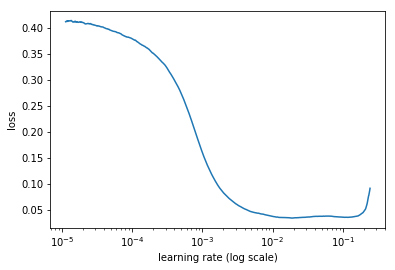

In [18]:
learner.lr_find()
learner.sched.plot()

First, I train only the head of the model while keeping the rest frozen. It allows to avoid corruption of the pretrained weights at the initial stage of training due to random initialization of the head layers. So the power of transfer learning is fully utilized when the training is continued.

In [19]:
lr = 2e-2
learner.fit(lr,1)

  0%|          | 1/1086 [00:02<51:05,  2.83s/it, loss=0.408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<39:20,  2.18s/it, loss=0.436]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<34:39,  1.92s/it, loss=0.384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<27:50,  1.54s/it, loss=0.351]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<27:16,  1.51s/it, loss=0.308]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<22:26,  1.25s/it, loss=0.268]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<23:26,  1.30s/it, loss=0.238]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<19:44,  1.10s/it, loss=0.215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:11<22:07,  1.23s/it, loss=0.198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:59,  1.06s/it, loss=0.185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<19:24,  1.08s/it, loss=0.172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<16:55,  1.06it/s, loss=0.163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:20,  1.03s/it, loss=0.156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<16:37,  1.07it/s, loss=0.15] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:06,  1.01s/it, loss=0.146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:12,  1.04it/s, loss=0.142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:59,  1.01s/it, loss=0.138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<18:20,  1.03s/it, loss=0.134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<18:14,  1.03s/it, loss=0.13] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<18:28,  1.04s/it, loss=0.127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<25:29,  1.44s/it, loss=0.123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:24<21:08,  1.19s/it, loss=0.12] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<22:06,  1.25s/it, loss=0.118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:26<18:45,  1.06s/it, loss=0.114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:54,  1.13s/it, loss=0.111]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:28<17:18,  1.02it/s, loss=0.11] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:57,  1.07s/it, loss=0.107]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:30<16:36,  1.06it/s, loss=0.105]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:51,  1.07s/it, loss=0.103]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:32<16:31,  1.06it/s, loss=0.101]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:33<17:57,  1.02s/it, loss=0.0992]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:34<15:50,  1.11it/s, loss=0.0976]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:35<17:32,  1.00it/s, loss=0.0958]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:36<15:40,  1.12it/s, loss=0.0936]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:37<17:38,  1.01s/it, loss=0.0917]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:38<15:34,  1.12it/s, loss=0.0904]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:39<17:14,  1.01it/s, loss=0.0888]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:40<15:18,  1.14it/s, loss=0.0873]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:41<17:44,  1.02s/it, loss=0.0859]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:42<15:35,  1.12it/s, loss=0.0842]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:44<23:15,  1.34s/it, loss=0.0832]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:45<19:30,  1.12s/it, loss=0.0815]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:46<20:01,  1.15s/it, loss=0.0798]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:46<17:14,  1.01it/s, loss=0.0796]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:48<18:19,  1.06s/it, loss=0.0787]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:48<16:04,  1.08it/s, loss=0.0776]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:49<17:21,  1.00s/it, loss=0.0768]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:50<15:24,  1.12it/s, loss=0.076] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:51<17:16,  1.00it/s, loss=0.0748]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:52<15:18,  1.13it/s, loss=0.0737]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:53<18:30,  1.07s/it, loss=0.0726]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:54<16:18,  1.06it/s, loss=0.0715]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:55<17:38,  1.02s/it, loss=0.0705]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:56<15:33,  1.11it/s, loss=0.0696]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:57<17:42,  1.03s/it, loss=0.0685]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [00:58<15:32,  1.11it/s, loss=0.0678]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [00:59<17:26,  1.02s/it, loss=0.0672]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:00<15:33,  1.10it/s, loss=0.0667]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:01<17:07,  1.00s/it, loss=0.066] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:02<15:18,  1.12it/s, loss=0.0654]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:04<24:28,  1.43s/it, loss=0.0644]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:05<20:22,  1.19s/it, loss=0.0639]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:06<20:00,  1.17s/it, loss=0.063] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:07<17:11,  1.01s/it, loss=0.0623]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:08<18:37,  1.09s/it, loss=0.0615]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:09<16:31,  1.03it/s, loss=0.0607]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:10<18:24,  1.08s/it, loss=0.0602]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:11<16:14,  1.04it/s, loss=0.0594]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:12<16:45,  1.01it/s, loss=0.0587]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:13<15:47,  1.07it/s, loss=0.0581]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:14<15:59,  1.06it/s, loss=0.0577]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:15<16:14,  1.04it/s, loss=0.0571]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:15<15:55,  1.06it/s, loss=0.0564]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:16<16:09,  1.04it/s, loss=0.056] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:17<15:11,  1.11it/s, loss=0.0553]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:18<16:07,  1.04it/s, loss=0.055] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:19<14:58,  1.12it/s, loss=0.0547]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:20<16:27,  1.02it/s, loss=0.054] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:21<14:39,  1.14it/s, loss=0.0534]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:22<16:23,  1.02it/s, loss=0.053] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:24<23:49,  1.42s/it, loss=0.0524]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:25<19:50,  1.19s/it, loss=0.052] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:26<20:26,  1.22s/it, loss=0.0517]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:27<17:26,  1.04s/it, loss=0.0511]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:28<16:55,  1.01s/it, loss=0.0506]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:29<15:02,  1.11it/s, loss=0.05]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:30<15:57,  1.04it/s, loss=0.0494]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:30<14:20,  1.16it/s, loss=0.0488]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:32<16:04,  1.03it/s, loss=0.0484]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:32<15:01,  1.10it/s, loss=0.0479]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:34<16:59,  1.02s/it, loss=0.0475]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:34<15:20,  1.08it/s, loss=0.0472]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:36<17:32,  1.06s/it, loss=0.0469]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:36<15:19,  1.08it/s, loss=0.0466]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:38<19:19,  1.17s/it, loss=0.0463]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:39<16:48,  1.02s/it, loss=0.0461]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:40<19:00,  1.15s/it, loss=0.0457]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:41<16:26,  1.00it/s, loss=0.0454]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:42<18:09,  1.10s/it, loss=0.0451]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:43<15:42,  1.05it/s, loss=0.0448]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:46<25:15,  1.54s/it, loss=0.0444]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:46<20:46,  1.27s/it, loss=0.0442]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:47<19:33,  1.19s/it, loss=0.0437]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:48<16:41,  1.02s/it, loss=0.0434]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:49<18:41,  1.14s/it, loss=0.0431]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:50<16:04,  1.02it/s, loss=0.0427]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:51<17:54,  1.10s/it, loss=0.0425]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:52<15:42,  1.04it/s, loss=0.0423]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:53<17:44,  1.09s/it, loss=0.0421]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:54<16:12,  1.00it/s, loss=0.0418]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:55<17:34,  1.08s/it, loss=0.0416]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [01:56<16:45,  1.03s/it, loss=0.0414]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [01:58<17:11,  1.06s/it, loss=0.0411]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [01:58<16:36,  1.03s/it, loss=0.041] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:00<16:53,  1.04s/it, loss=0.0408]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:01<16:44,  1.04s/it, loss=0.0406]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:02<17:02,  1.06s/it, loss=0.0405]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:03<17:59,  1.11s/it, loss=0.0402]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:04<16:10,  1.00s/it, loss=0.04]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:05<16:59,  1.06s/it, loss=0.0398]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:07<24:00,  1.49s/it, loss=0.0397]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:08<19:54,  1.24s/it, loss=0.0394]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:09<20:54,  1.30s/it, loss=0.0393]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:10<17:58,  1.12s/it, loss=0.0392]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:11<18:50,  1.18s/it, loss=0.039] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:12<16:13,  1.01s/it, loss=0.0387]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:14<18:22,  1.15s/it, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:14<15:51,  1.01it/s, loss=0.0384]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:15<17:18,  1.09s/it, loss=0.0381]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:16<15:12,  1.05it/s, loss=0.0378]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:18<17:12,  1.08s/it, loss=0.0379]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:18<15:11,  1.05it/s, loss=0.0377]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:19<16:48,  1.06s/it, loss=0.0376]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:20<15:22,  1.03it/s, loss=0.0375]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:22<16:57,  1.07s/it, loss=0.0373]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:22<15:06,  1.05it/s, loss=0.0372]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:24<16:56,  1.07s/it, loss=0.0371]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:24<15:23,  1.03it/s, loss=0.0369]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:26<17:20,  1.10s/it, loss=0.0367]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:26<15:07,  1.04it/s, loss=0.0366]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:29<22:13,  1.41s/it, loss=0.0365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:29<18:37,  1.18s/it, loss=0.0365]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:31<20:17,  1.29s/it, loss=0.0363]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:32<17:29,  1.11s/it, loss=0.0361]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:33<18:47,  1.20s/it, loss=0.0359]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:34<16:20,  1.04s/it, loss=0.0357]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:35<17:20,  1.11s/it, loss=0.0355]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:36<15:02,  1.04it/s, loss=0.0354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:37<16:51,  1.08s/it, loss=0.0354]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:38<15:55,  1.02s/it, loss=0.0352]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:39<17:46,  1.14s/it, loss=0.0351]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:40<15:18,  1.02it/s, loss=0.035] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:41<17:02,  1.10s/it, loss=0.0348]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:42<14:48,  1.05it/s, loss=0.0347]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:43<16:37,  1.07s/it, loss=0.0344]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:44<14:42,  1.05it/s, loss=0.0343]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:45<16:11,  1.05s/it, loss=0.0343]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:46<15:05,  1.02it/s, loss=0.0343]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:47<16:19,  1.06s/it, loss=0.0342]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:48<15:02,  1.03it/s, loss=0.0341]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:51<22:02,  1.43s/it, loss=0.034] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:51<18:27,  1.20s/it, loss=0.034]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:53<19:19,  1.26s/it, loss=0.0339]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:53<16:29,  1.07s/it, loss=0.0338]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:55<17:44,  1.16s/it, loss=0.0337]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:55<15:19,  1.00it/s, loss=0.0336]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:56<16:39,  1.09s/it, loss=0.0335]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [02:57<14:32,  1.05it/s, loss=0.0335]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [02:58<16:29,  1.08s/it, loss=0.0335]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [02:59<14:57,  1.02it/s, loss=0.0334]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:01<16:30,  1.08s/it, loss=0.0333]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:01<15:12,  1.00it/s, loss=0.0332]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:03<15:55,  1.05s/it, loss=0.033] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:03<14:56,  1.02it/s, loss=0.0329]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:05<16:19,  1.08s/it, loss=0.0326]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:06<15:28,  1.02s/it, loss=0.0326]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:07<16:41,  1.10s/it, loss=0.0325]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:08<15:58,  1.06s/it, loss=0.0325]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:09<15:51,  1.05s/it, loss=0.0322]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:10<15:31,  1.03s/it, loss=0.0322]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:12<22:06,  1.47s/it, loss=0.0321]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:13<18:30,  1.23s/it, loss=0.0321]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:14<18:52,  1.25s/it, loss=0.032] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:15<16:02,  1.07s/it, loss=0.032]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:16<18:00,  1.20s/it, loss=0.0319]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:17<15:24,  1.03s/it, loss=0.0317]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:18<16:57,  1.13s/it, loss=0.0317]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:19<14:48,  1.01it/s, loss=0.0316]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:20<16:30,  1.10s/it, loss=0.0317]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:21<14:42,  1.02it/s, loss=0.0317]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:23<16:36,  1.11s/it, loss=0.0316]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:23<14:38,  1.02it/s, loss=0.0316]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:25<16:14,  1.09s/it, loss=0.0315]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:25<14:40,  1.01it/s, loss=0.0315]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:27<15:45,  1.06s/it, loss=0.0314]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:28<15:13,  1.03s/it, loss=0.0313]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:29<15:11,  1.02s/it, loss=0.0312]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:30<17:34,  1.19s/it, loss=0.0312]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:31<15:15,  1.03s/it, loss=0.0312]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:32<15:30,  1.05s/it, loss=0.0311]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:34<21:42,  1.47s/it, loss=0.0309]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:35<18:00,  1.22s/it, loss=0.0309]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:36<18:27,  1.25s/it, loss=0.0308]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:37<15:40,  1.07s/it, loss=0.0307]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:38<16:59,  1.16s/it, loss=0.0307]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:39<14:37,  1.00it/s, loss=0.0307]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:40<16:03,  1.10s/it, loss=0.0306]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:41<14:33,  1.00it/s, loss=0.0305]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:42<16:16,  1.11s/it, loss=0.0305]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:43<14:16,  1.02it/s, loss=0.0304]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:44<16:09,  1.11s/it, loss=0.0304]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:45<14:02,  1.04it/s, loss=0.0304]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:46<15:51,  1.09s/it, loss=0.0304]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:47<13:48,  1.05it/s, loss=0.0303]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:49<15:48,  1.09s/it, loss=0.0303]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:49<14:03,  1.03it/s, loss=0.0302]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:51<15:33,  1.07s/it, loss=0.0303]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:51<13:36,  1.06it/s, loss=0.0303]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:52<15:13,  1.05s/it, loss=0.0304]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:53<14:18,  1.01it/s, loss=0.0303]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:56<21:03,  1.46s/it, loss=0.0302]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:57<17:35,  1.22s/it, loss=0.0302]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [03:58<18:03,  1.26s/it, loss=0.0303]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [03:58<15:18,  1.07s/it, loss=0.0302]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:00<16:30,  1.15s/it, loss=0.0301]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:00<14:10,  1.01it/s, loss=0.0301]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:02<15:58,  1.12s/it, loss=0.03]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:02<13:53,  1.03it/s, loss=0.03]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:04<16:07,  1.13s/it, loss=0.03]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:05<14:04,  1.01it/s, loss=0.03]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:06<15:50,  1.11s/it, loss=0.03]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:07<13:53,  1.02it/s, loss=0.03]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:08<15:52,  1.12s/it, loss=0.03]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:09<14:00,  1.01it/s, loss=0.0299]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:10<16:09,  1.14s/it, loss=0.0299]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:11<13:58,  1.01it/s, loss=0.0298]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:12<15:48,  1.12s/it, loss=0.0298]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:13<13:47,  1.02it/s, loss=0.0299]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:14<15:09,  1.07s/it, loss=0.0299]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:15<13:14,  1.06it/s, loss=0.0298]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:17<19:49,  1.41s/it, loss=0.0298]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:18<16:41,  1.19s/it, loss=0.0297]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:19<16:55,  1.20s/it, loss=0.0297]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:20<14:30,  1.03s/it, loss=0.0297]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:21<15:48,  1.13s/it, loss=0.0297]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:22<13:40,  1.02it/s, loss=0.0297]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:23<15:51,  1.13s/it, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:24<13:50,  1.01it/s, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:26<15:26,  1.11s/it, loss=0.0295]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:26<13:44,  1.01it/s, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:28<15:53,  1.14s/it, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:28<13:56,  1.00s/it, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:30<15:10,  1.09s/it, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:30<13:28,  1.03it/s, loss=0.0298]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:32<14:37,  1.06s/it, loss=0.0297]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:32<13:06,  1.05it/s, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:34<14:34,  1.05s/it, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:34<13:06,  1.05it/s, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:36<14:31,  1.05s/it, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:36<12:58,  1.06it/s, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:39<20:15,  1.47s/it, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:40<16:50,  1.23s/it, loss=0.0296]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:41<15:53,  1.16s/it, loss=0.0295]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:41<13:46,  1.01s/it, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:43<15:09,  1.11s/it, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:43<13:33,  1.01it/s, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:45<15:24,  1.13s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:46<13:40,  1.00s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:47<14:47,  1.09s/it, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:48<14:13,  1.05s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:49<14:14,  1.05s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:50<12:53,  1.05it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:51<14:10,  1.05s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:52<12:55,  1.05it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:53<14:17,  1.06s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:54<13:09,  1.03it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:55<13:55,  1.03s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:56<13:39,  1.01s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:57<13:47,  1.03s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:58<13:06,  1.02it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:01<20:26,  1.52s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:01<17:06,  1.28s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:03<17:18,  1.29s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:03<14:46,  1.11s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:05<15:43,  1.18s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:05<13:30,  1.01s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:07<14:52,  1.12s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:08<14:22,  1.08s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:09<14:14,  1.07s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:09<12:26,  1.07it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:11<14:03,  1.06s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:11<12:18,  1.08it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:13<14:31,  1.10s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:13<12:38,  1.04it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:15<14:22,  1.09s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:15<12:42,  1.04it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:17<14:20,  1.09s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:17<12:29,  1.05it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:19<14:09,  1.08s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:19<12:21,  1.06it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:22<18:59,  1.45s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:23<15:50,  1.21s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:24<16:17,  1.25s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:25<13:51,  1.06s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:26<14:59,  1.15s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:27<12:54,  1.01it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:28<14:06,  1.09s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:29<12:16,  1.06it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:30<13:55,  1.08s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:31<12:09,  1.06it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:32<14:11,  1.10s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:33<12:20,  1.05it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:34<14:41,  1.14s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:35<12:40,  1.02it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:36<14:22,  1.12s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:37<12:26,  1.03it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:38<14:05,  1.10s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:39<12:16,  1.04it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:40<13:22,  1.05s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:41<11:46,  1.08it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:43<17:49,  1.40s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:44<15:08,  1.19s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:45<15:49,  1.24s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:46<13:26,  1.06s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:47<14:29,  1.14s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:48<12:40,  1.00s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:49<14:19,  1.13s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:50<12:22,  1.02it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:51<13:43,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:52<11:56,  1.06it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:53<13:16,  1.05s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:54<11:50,  1.06it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:55<13:27,  1.07s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:56<11:45,  1.07it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [05:57<13:25,  1.07s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [05:58<11:47,  1.06it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [05:59<13:06,  1.05s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:00<11:31,  1.08it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:01<13:17,  1.07s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:02<11:34,  1.07it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:05<17:53,  1.44s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:05<14:58,  1.21s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:07<15:25,  1.25s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:07<13:06,  1.06s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:09<14:03,  1.14s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:09<12:08,  1.02it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:11<13:30,  1.10s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:11<11:42,  1.05it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:13<13:12,  1.08s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:13<11:31,  1.06it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:14<12:49,  1.05s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:15<11:30,  1.06it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:16<12:39,  1.04s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:17<11:40,  1.04it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:18<12:25,  1.02s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:19<12:23,  1.02s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:20<12:06,  1.00it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:21<12:21,  1.02s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:22<11:59,  1.01it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:23<12:08,  1.00s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:26<17:42,  1.47s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:27<14:43,  1.22s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:28<15:46,  1.31s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:29<13:21,  1.11s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:30<14:10,  1.18s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:31<12:09,  1.01s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:32<13:50,  1.16s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:33<12:05,  1.01s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:34<14:17,  1.20s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:35<12:26,  1.04s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:37<13:41,  1.15s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:37<11:56,  1.00s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:39<13:01,  1.10s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:39<11:32,  1.03it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:41<12:44,  1.08s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:41<11:07,  1.06it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:43<14:20,  1.21s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:44<12:30,  1.06s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:45<12:18,  1.04s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:45<10:44,  1.09it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:48<16:14,  1.38s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:48<13:42,  1.17s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:50<14:26,  1.23s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:51<13:01,  1.11s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:52<13:47,  1.18s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:53<11:52,  1.02s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:54<13:14,  1.14s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:55<11:35,  1.00it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:56<12:49,  1.10s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:57<11:48,  1.02s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [06:58<12:18,  1.06s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [06:59<11:27,  1.01it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:00<12:14,  1.06s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:01<11:31,  1.00it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:02<11:42,  1.02s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:03<11:15,  1.02it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:04<11:53,  1.04s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:05<11:26,  1.00it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:06<11:49,  1.03s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:07<11:00,  1.04it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:09<16:18,  1.43s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:10<14:00,  1.23s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:12<14:38,  1.29s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:12<12:22,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:14<13:06,  1.15s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:14<11:17,  1.00it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:16<12:33,  1.11s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:16<10:52,  1.04it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:18<12:07,  1.07s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:18<10:40,  1.06it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:20<12:18,  1.09s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:20<11:22,  1.01s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:22<12:54,  1.15s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:23<11:29,  1.03s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:24<12:28,  1.12s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:25<11:59,  1.07s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:26<11:57,  1.07s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:27<12:10,  1.09s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:28<11:19,  1.02s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:29<11:25,  1.03s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:32<16:30,  1.49s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:32<13:51,  1.25s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:34<14:03,  1.27s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:34<11:54,  1.08s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:36<12:48,  1.16s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:36<11:00,  1.00s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:38<11:53,  1.08s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:38<10:35,  1.04it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:40<11:53,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:40<10:21,  1.06it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:41<11:23,  1.04s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:42<10:12,  1.07it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:43<11:19,  1.04s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:44<10:54,  1.00s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:46<11:29,  1.06s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:46<10:58,  1.01s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:47<11:04,  1.02s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:48<11:00,  1.02s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:49<10:54,  1.01s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:50<10:32,  1.02it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:53<15:26,  1.44s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:54<12:49,  1.19s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:55<13:15,  1.24s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:55<11:17,  1.05s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:57<12:23,  1.16s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [07:58<10:48,  1.01s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [07:59<12:03,  1.13s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:00<10:39,  1.00s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:01<11:35,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:02<10:05,  1.05it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:03<11:26,  1.08s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:04<10:11,  1.04it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:05<12:15,  1.16s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:06<11:04,  1.05s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:08<12:59,  1.23s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:08<11:10,  1.06s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:10<12:29,  1.19s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:11<10:42,  1.02s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:12<12:27,  1.19s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:13<10:49,  1.04s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:16<16:13,  1.56s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:16<13:31,  1.30s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:18<14:43,  1.42s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:19<12:28,  1.20s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:20<12:58,  1.25s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:21<11:35,  1.12s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:22<12:36,  1.22s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:23<10:49,  1.05s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:25<12:24,  1.21s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:25<10:40,  1.04s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:26<11:23,  1.11s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:27<09:51,  1.04it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:28<11:06,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:29<09:38,  1.06it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:30<10:56,  1.07s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:31<09:54,  1.03it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:33<12:02,  1.19s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:34<11:14,  1.11s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:35<10:31,  1.04s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:36<10:30,  1.04s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:38<15:07,  1.50s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:39<12:33,  1.25s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:40<12:37,  1.26s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:41<11:10,  1.11s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:42<12:04,  1.21s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:43<10:23,  1.04s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:45<11:45,  1.18s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:45<10:05,  1.01s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:47<11:09,  1.12s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:47<09:39,  1.03it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:49<11:26,  1.15s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:49<09:56,  1.00s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:51<10:49,  1.09s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:51<09:25,  1.05it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:53<10:33,  1.07s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:53<09:14,  1.06it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:55<10:37,  1.08s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:55<09:17,  1.06it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:57<10:25,  1.07s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:57<09:06,  1.07it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:00<13:38,  1.40s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:01<11:26,  1.17s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:02<12:22,  1.27s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:03<10:27,  1.08s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:04<11:14,  1.16s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:05<09:39,  1.00it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:06<11:02,  1.14s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:07<09:45,  1.01s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:08<10:55,  1.14s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:09<09:35,  1.00it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:10<10:31,  1.10s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:11<09:09,  1.04it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:12<10:54,  1.14s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:13<09:25,  1.01it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:14<09:51,  1.04s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:15<08:42,  1.09it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:16<09:51,  1.04s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:17<08:47,  1.08it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:18<09:51,  1.04s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:19<08:38,  1.09it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:21<13:28,  1.43s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:22<11:21,  1.21s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:23<11:44,  1.25s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:24<10:05,  1.08s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:25<10:55,  1.17s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:26<09:24,  1.01s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:27<10:11,  1.09s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:28<08:53,  1.05it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:29<10:11,  1.10s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:30<09:03,  1.02it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:32<09:59,  1.08s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:32<08:50,  1.05it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:34<09:56,  1.08s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:34<08:47,  1.05it/s, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:36<09:48,  1.07s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:36<08:36,  1.07it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:38<09:49,  1.07s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:38<08:36,  1.06it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:40<09:39,  1.06s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:40<08:26,  1.08it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:43<13:14,  1.46s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:43<11:00,  1.21s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:45<10:47,  1.19s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:45<09:14,  1.02s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:47<10:25,  1.16s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:47<09:05,  1.01s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:49<10:31,  1.17s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:50<09:16,  1.03s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:51<09:56,  1.11s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:52<08:41,  1.03it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:53<09:56,  1.12s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:54<08:43,  1.02it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:55<09:51,  1.11s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:56<08:45,  1.01it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:57<09:32,  1.08s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:58<08:25,  1.05it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:59<09:48,  1.11s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:00<08:37,  1.02it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:01<09:36,  1.09s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:02<08:20,  1.05it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:05<12:46,  1.46s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:05<10:45,  1.23s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:06<10:34,  1.21s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:07<08:59,  1.03s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:08<09:45,  1.12s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:09<08:26,  1.03it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:11<10:46,  1.25s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:12<09:11,  1.07s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:13<09:36,  1.11s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:13<08:18,  1.04it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:15<09:32,  1.11s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:15<08:14,  1.04it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:17<09:31,  1.11s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:18<08:41,  1.02s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:19<09:22,  1.10s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:20<08:08,  1.04it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:21<09:16,  1.09s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:22<08:04,  1.05it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:23<09:00,  1.07s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:24<07:49,  1.08it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:26<11:53,  1.41s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:27<10:06,  1.20s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:28<10:33,  1.26s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:29<09:01,  1.08s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:30<09:38,  1.15s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:31<08:16,  1.01it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:32<09:31,  1.15s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:33<08:12,  1.01it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:34<08:59,  1.09s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:35<07:49,  1.06it/s, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:36<08:50,  1.07s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:37<07:42,  1.07it/s, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:38<08:52,  1.08s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:39<07:54,  1.04it/s, loss=0.0282]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:40<08:49,  1.08s/it, loss=0.0281]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:41<07:42,  1.06it/s, loss=0.0281]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:42<08:38,  1.06s/it, loss=0.0281]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:43<07:37,  1.07it/s, loss=0.0282]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:44<08:33,  1.05s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:45<07:33,  1.07it/s, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:48<11:31,  1.43s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:48<09:33,  1.19s/it, loss=0.0282]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:49<09:54,  1.23s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:50<08:36,  1.07s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:52<09:25,  1.18s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:52<08:05,  1.01s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:53<08:40,  1.09s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:54<07:34,  1.05it/s, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:55<08:28,  1.07s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:56<07:24,  1.07it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:57<08:20,  1.05s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:58<07:18,  1.08it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [10:59<08:32,  1.08s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:00<07:28,  1.05it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:01<08:24,  1.07s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:02<07:30,  1.04it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:04<08:28,  1.08s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:04<07:31,  1.04it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:06<08:12,  1.06s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:06<07:19,  1.06it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:09<11:03,  1.43s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:09<09:25,  1.22s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:11<09:33,  1.24s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:11<08:08,  1.06s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:13<08:46,  1.14s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:13<07:33,  1.01it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:15<08:28,  1.11s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:15<07:28,  1.02it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:17<08:39,  1.14s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:18<07:32,  1.01it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:19<08:18,  1.10s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:20<07:13,  1.05it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:21<08:17,  1.10s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:22<07:16,  1.04it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:23<08:10,  1.09s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:24<07:11,  1.04it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:25<08:14,  1.10s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:26<07:24,  1.01it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:27<08:06,  1.09s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:28<06:59,  1.06it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:30<10:49,  1.46s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:31<08:56,  1.21s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:32<08:49,  1.20s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:33<07:32,  1.02s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:34<08:12,  1.12s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:35<07:05,  1.03it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:36<07:59,  1.09s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:37<07:03,  1.03it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:38<07:53,  1.08s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:39<07:13,  1.01it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:40<08:12,  1.13s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:41<07:26,  1.03s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:43<08:00,  1.11s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:43<07:28,  1.04s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:45<07:55,  1.10s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:45<07:10,  1.00s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:47<07:36,  1.06s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:47<06:58,  1.02it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:49<07:55,  1.11s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:49<06:52,  1.03it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:52<10:18,  1.45s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:53<08:38,  1.22s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:54<08:41,  1.23s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:55<07:26,  1.06s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:56<07:54,  1.13s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:57<06:54,  1.01it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [11:58<07:36,  1.09s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [11:59<06:37,  1.05it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:00<07:27,  1.07s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:01<06:30,  1.06it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:02<07:17,  1.05s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:03<06:28,  1.07it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:04<07:07,  1.03s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:05<06:44,  1.02it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:06<07:00,  1.02s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:07<06:34,  1.04it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:08<07:10,  1.05s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:09<06:40,  1.02it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:10<07:36,  1.12s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:11<06:35,  1.03it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:13<09:48,  1.45s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:14<08:12,  1.22s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:15<08:25,  1.25s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:16<07:11,  1.07s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:17<08:02,  1.20s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:18<06:50,  1.03s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:20<07:38,  1.15s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:20<06:39,  1.00s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:22<07:47,  1.18s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:22<06:42,  1.02s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:24<07:22,  1.12s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:24<06:23,  1.03it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:26<06:46,  1.03s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:26<06:04,  1.08it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:28<06:59,  1.07s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:28<06:06,  1.07it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:30<07:03,  1.09s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:30<06:16,  1.03it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:32<06:56,  1.08s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:32<06:02,  1.07it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:35<09:11,  1.43s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:36<07:44,  1.21s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:37<08:05,  1.27s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:38<06:51,  1.08s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:39<07:32,  1.19s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:40<06:27,  1.02s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:41<06:58,  1.10s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:42<06:28,  1.03s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:43<06:51,  1.09s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:44<06:01,  1.04it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:45<07:01,  1.12s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:46<06:03,  1.03it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:47<06:52,  1.10s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:48<05:57,  1.04it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:49<06:32,  1.06s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:50<05:45,  1.07it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:51<06:28,  1.05s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:52<05:40,  1.08it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:53<06:45,  1.11s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:54<05:53,  1.04it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:57<08:52,  1.46s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [12:57<07:27,  1.23s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [12:59<07:30,  1.24s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [12:59<06:24,  1.06s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:00<06:44,  1.12s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:01<05:49,  1.03it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:03<06:54,  1.15s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:04<06:38,  1.11s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:05<06:34,  1.10s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:05<05:44,  1.03it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:07<06:32,  1.11s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:07<05:39,  1.04it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:09<06:30,  1.11s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:10<05:37,  1.04it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:11<06:16,  1.07s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:11<05:27,  1.07it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:13<06:18,  1.08s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:14<05:29,  1.06it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:15<06:12,  1.07s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:16<05:41,  1.01it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:18<08:28,  1.47s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:19<07:01,  1.23s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:20<07:21,  1.29s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:21<06:16,  1.10s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:23<06:55,  1.22s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:23<05:57,  1.05s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:25<06:24,  1.13s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:25<05:31,  1.02it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:27<06:17,  1.12s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:27<05:26,  1.03it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:29<06:08,  1.10s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:29<05:20,  1.04it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:31<06:03,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:31<05:15,  1.05it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:33<05:47,  1.05s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:33<05:13,  1.05it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:35<05:47,  1.06s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:35<05:03,  1.08it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:37<05:44,  1.05s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:37<04:59,  1.09it/s, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:40<07:39,  1.41s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:40<06:19,  1.17s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:42<06:35,  1.23s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:42<05:36,  1.05s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:44<06:28,  1.21s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:45<05:30,  1.03s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:46<05:41,  1.07s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:46<05:00,  1.06it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:48<06:00,  1.14s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:49<05:09,  1.02it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:50<05:41,  1.08s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:51<05:00,  1.05it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:52<05:39,  1.08s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:53<04:55,  1.06it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:54<05:29,  1.06s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:54<04:48,  1.08it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:56<05:31,  1.07s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:57<04:53,  1.05it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [13:58<05:36,  1.10s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [13:59<04:51,  1.05it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:01<07:05,  1.39s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:02<05:53,  1.16s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:03<06:28,  1.28s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:04<05:27,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:05<05:24,  1.08s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:06<04:45,  1.05it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:07<05:18,  1.06s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:08<04:38,  1.07it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:09<05:36,  1.13s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:10<04:52,  1.01it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:11<05:16,  1.07s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:12<04:35,  1.07it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:13<05:12,  1.07s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:14<04:40,  1.04it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:15<05:14,  1.08s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:16<04:34,  1.06it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:17<05:07,  1.06s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:18<04:28,  1.07it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:19<05:01,  1.05s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:20<04:25,  1.08it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:22<06:43,  1.42s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:23<05:36,  1.18s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:24<05:47,  1.23s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:25<04:54,  1.04s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:26<05:21,  1.15s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:27<04:36,  1.01it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:28<05:23,  1.16s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:29<04:36,  1.01it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:30<05:06,  1.11s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:31<04:25,  1.04it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:32<05:03,  1.10s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:33<04:22,  1.04it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:34<04:59,  1.10s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:35<04:20,  1.05it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:37<05:01,  1.11s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:37<04:23,  1.02it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:39<04:55,  1.10s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:39<04:15,  1.05it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:41<04:50,  1.09s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:41<04:11,  1.06it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:44<06:16,  1.42s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:44<05:17,  1.20s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:46<05:41,  1.30s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:47<04:47,  1.10s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:48<05:07,  1.18s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:49<04:26,  1.03s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:50<04:43,  1.09s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:51<04:05,  1.05it/s, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:52<04:41,  1.10s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:53<04:12,  1.01it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:54<04:34,  1.08s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:55<04:15,  1.01s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:56<04:28,  1.06s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [14:57<04:05,  1.03it/s, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [14:58<04:18,  1.03s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [14:59<04:15,  1.02s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:00<04:18,  1.04s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:01<04:11,  1.01s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:02<04:16,  1.04s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:03<04:03,  1.01it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:05<05:54,  1.45s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:06<04:57,  1.22s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:07<05:02,  1.25s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:08<04:18,  1.07s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:09<04:32,  1.13s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:10<03:55,  1.02it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:11<04:29,  1.13s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:12<03:55,  1.01it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:14<04:27,  1.13s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:14<03:53,  1.01it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:16<04:12,  1.07s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:16<03:41,  1.06it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:17<04:02,  1.04s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:18<03:46,  1.02it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:20<04:04,  1.06s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:20<03:54,  1.02s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:22<03:59,  1.05s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:22<03:49,  1.01s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:23<03:47,  1.00s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:24<03:37,  1.04it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:27<05:22,  1.43s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:28<04:28,  1.20s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:29<04:37,  1.25s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:30<04:22,  1.18s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:31<04:08,  1.13s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:32<03:36,  1.01it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:33<03:57,  1.08s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:34<03:26,  1.06it/s, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:35<04:00,  1.11s/it, loss=0.0295]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:36<03:32,  1.02it/s, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:37<04:03,  1.13s/it, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:38<03:32,  1.01it/s, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:39<03:54,  1.10s/it, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:40<03:23,  1.04it/s, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:41<03:44,  1.06s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:42<03:15,  1.07it/s, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:43<03:44,  1.07s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:44<03:19,  1.04it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:45<03:44,  1.09s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:46<03:13,  1.06it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:48<04:43,  1.38s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:49<03:58,  1.17s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:50<04:06,  1.21s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:51<03:33,  1.06s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:52<03:52,  1.16s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:53<03:25,  1.03s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:54<03:35,  1.08s/it, loss=0.0294]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [15:55<03:07,  1.06it/s, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [15:56<03:26,  1.05s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [15:57<03:06,  1.05it/s, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [15:58<03:22,  1.04s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [15:59<03:02,  1.06it/s, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:00<03:29,  1.08s/it, loss=0.0293]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:01<03:05,  1.03it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:02<03:27,  1.09s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:03<03:02,  1.04it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:04<03:16,  1.04s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:05<03:03,  1.03it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:06<03:12,  1.03s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:07<03:02,  1.02it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:10<04:32,  1.47s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:10<03:45,  1.22s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:12<03:55,  1.29s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:12<03:18,  1.09s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:14<03:30,  1.16s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:14<03:02,  1.01s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:16<03:14,  1.09s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:16<02:49,  1.05it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:18<03:08,  1.07s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:18<02:44,  1.07it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:20<03:11,  1.10s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:20<02:46,  1.05it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:22<03:09,  1.09s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:22<02:46,  1.03it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:24<03:07,  1.10s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:24<02:42,  1.05it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:26<03:01,  1.08s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:26<02:37,  1.06it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:28<02:59,  1.07s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:28<02:35,  1.07it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:31<03:48,  1.38s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:32<03:12,  1.17s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:33<03:20,  1.23s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:34<02:52,  1.06s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:35<03:10,  1.18s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:36<02:43,  1.02s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:37<03:00,  1.14s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:38<02:35,  1.02it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:39<02:56,  1.12s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:40<02:32,  1.03it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:41<02:49,  1.09s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:42<02:27,  1.05it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:43<02:41,  1.06s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:44<02:21,  1.07it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:45<02:42,  1.08s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:46<02:26,  1.02it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:47<02:40,  1.08s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:48<02:22,  1.04it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:49<02:37,  1.07s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:50<02:18,  1.06it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:52<03:24,  1.41s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:53<02:52,  1.20s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [16:54<03:00,  1.26s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [16:55<02:32,  1.08s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [16:57<02:44,  1.17s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [16:57<02:20,  1.00s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [16:58<02:30,  1.09s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [16:59<02:10,  1.05it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:00<02:26,  1.07s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:01<02:10,  1.04it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:02<02:18,  1.03s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:03<02:04,  1.07it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:04<02:23,  1.08s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:05<02:11,  1.00it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:06<02:20,  1.08s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:07<02:09,  1.00it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:08<02:13,  1.03s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:09<02:06,  1.01it/s, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:10<02:10,  1.03s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:11<02:01,  1.03it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:14<02:59,  1.44s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:15<02:32,  1.23s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:16<02:32,  1.24s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:16<02:08,  1.05s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:18<02:14,  1.11s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:18<01:56,  1.03it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:20<02:10,  1.09s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:20<01:52,  1.05it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:22<02:07,  1.09s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:22<01:51,  1.04it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:24<02:06,  1.10s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:24<01:50,  1.03it/s, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:26<02:02,  1.09s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:27<01:48,  1.03it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:28<02:09,  1.17s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:29<01:52,  1.02s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:30<01:52,  1.03s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:31<01:43,  1.04it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:32<01:49,  1.02s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:33<01:39,  1.07it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:35<02:33,  1.46s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:36<02:05,  1.21s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:37<02:01,  1.18s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:38<01:43,  1.01s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:39<01:53,  1.13s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:40<01:37,  1.02it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:41<01:49,  1.11s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:42<01:35,  1.03it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:43<01:46,  1.10s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:44<01:33,  1.03it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:45<01:42,  1.08s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:46<01:33,  1.01it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:47<01:37,  1.05s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:48<01:28,  1.04it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:49<01:34,  1.04s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:50<01:27,  1.03it/s, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:51<01:31,  1.03s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:52<01:27,  1.01it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:53<01:27,  1.01s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [17:54<01:21,  1.06it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [17:56<02:01,  1.44s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [17:57<01:41,  1.21s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [17:58<01:42,  1.23s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [17:59<01:25,  1.05s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:00<01:34,  1.16s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:01<01:20,  1.00s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:02<01:26,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:03<01:14,  1.05it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:04<01:21,  1.06s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:05<01:10,  1.07it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:06<01:24,  1.13s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:07<01:12,  1.02it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:08<01:16,  1.05s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:09<01:09,  1.04it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:10<01:14,  1.05s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:11<01:07,  1.04it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:12<01:11,  1.03s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:13<01:05,  1.03it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:14<01:08,  1.02s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:15<01:01,  1.08it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:17<01:31,  1.41s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:18<01:15,  1.18s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:19<01:16,  1.22s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:20<01:05,  1.06s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:21<01:09,  1.14s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:22<00:59,  1.01it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:23<01:02,  1.06s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:24<00:53,  1.08it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:25<01:01,  1.08s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:26<00:52,  1.06it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:27<00:59,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:28<00:51,  1.05it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:30<00:58,  1.10s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:30<00:50,  1.02it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:32<00:55,  1.10s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:32<00:48,  1.03it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:34<00:54,  1.12s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:34<00:46,  1.03it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:36<00:53,  1.13s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:36<00:45,  1.02it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:39<01:03,  1.41s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:40<00:52,  1.20s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:41<00:54,  1.27s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:42<00:45,  1.08s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:43<00:48,  1.19s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:44<00:41,  1.03s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:45<00:43,  1.12s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:46<00:37,  1.00it/s, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:47<00:41,  1.11s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:48<00:34,  1.04it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:49<00:37,  1.07s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:50<00:31,  1.07it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:51<00:34,  1.05s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:52<00:29,  1.08it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [18:53<00:33,  1.09s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [18:54<00:29,  1.03it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [18:55<00:31,  1.08s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [18:56<00:26,  1.05it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [18:57<00:29,  1.10s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [18:58<00:24,  1.05it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:01<00:36,  1.46s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:01<00:29,  1.24s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:03<00:28,  1.26s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:03<00:23,  1.07s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:05<00:24,  1.18s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:05<00:20,  1.01s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:07<00:21,  1.11s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:07<00:17,  1.04it/s, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:09<00:18,  1.08s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:09<00:15,  1.07it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:11<00:16,  1.09s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:11<00:13,  1.04it/s, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:13<00:14,  1.15s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:14<00:12,  1.00s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:15<00:12,  1.11s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:16<00:09,  1.03it/s, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:17<00:10,  1.12s/it, loss=0.0289]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:18<00:07,  1.02it/s, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:19<00:07,  1.08s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:20<00:05,  1.07it/s, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:22<00:07,  1.41s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:23<00:04,  1.20s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:24<00:03,  1.22s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:25<00:02,  1.04s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:26<00:01,  1.17s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


epoch      trn_loss   val_loss   acc        
    0      0.028746   0.026786   0.949316  


[0.026785792915308814, 0.9493156834313858]

Next, I unfreeze all weights and allow training of entire model. One trick that I use is differential learning rate: the lr of the head part is still lr, while the middle layers of the model are trained with lr/3, and the base is trained with even smaller lr/10. Despite the low-level detectors do not vary much from one image data set to another much, the yellow channel should be trained, and also the images are quite different from ImageNet; therefore, the I decrease the learning rate for first layers only by 10 times. If there was no necessity to train an additional channel and the images were more similar to ImageNet, the learning rates could be [lr/100,lr/10,lr]. Another trick is learning rate annealing. Periodic lr increase followed by slow decrease drives the system out of steep minima (when lr is high) towards broader ones (which are explored when lr decreases) that enhances the ability of the model to generalize and reduces overfitting. The length of the cycles gradually increases during training.

In [20]:
learner.unfreeze()
lrs=np.array([lr/10,lr/3,lr])

In [21]:
learner.fit(lrs/4,4,cycle_len=2,use_clr=(10,20))

  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:03<54:48,  3.03s/it, loss=0.034]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<43:34,  2.41s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:05<36:05,  2.00s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:06<30:59,  1.72s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:07<26:42,  1.48s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:40,  1.32s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:01,  1.23s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:24,  1.14s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<20:11,  1.12s/it, loss=0.0292]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<19:03,  1.06s/it, loss=0.029]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:39,  1.04s/it, loss=0.0291]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:57,  1.00s/it, loss=0.029] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:43,  1.05s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<18:18,  1.02s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:21,  1.03s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<18:06,  1.02s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:19<20:52,  1.17s/it, loss=0.0286]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:20<19:55,  1.12s/it, loss=0.0284]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:21<19:03,  1.07s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:22<18:04,  1.02s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:25<28:29,  1.61s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:26<25:07,  1.42s/it, loss=0.0288]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:27<23:03,  1.30s/it, loss=0.0287]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:28<20:59,  1.19s/it, loss=0.0285]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:29<20:08,  1.14s/it, loss=0.0282]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:30<19:13,  1.09s/it, loss=0.0282]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:31<19:36,  1.11s/it, loss=0.0281]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:32<19:25,  1.10s/it, loss=0.0283]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:33<18:31,  1.05s/it, loss=0.0281]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:34<17:58,  1.02s/it, loss=0.0282]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:35<17:46,  1.01s/it, loss=0.0279]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:36<17:16,  1.02it/s, loss=0.0276]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:37<17:31,  1.00it/s, loss=0.0276]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:38<17:05,  1.03it/s, loss=0.0277]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:39<17:46,  1.01s/it, loss=0.0277]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:40<17:13,  1.02it/s, loss=0.0276]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:41<18:02,  1.03s/it, loss=0.0277]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:42<17:25,  1.00it/s, loss=0.0278]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:43<18:05,  1.04s/it, loss=0.0277]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:44<17:25,  1.00it/s, loss=0.0277]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:47<27:01,  1.55s/it, loss=0.0279]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:48<24:03,  1.38s/it, loss=0.0277]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:49<23:16,  1.34s/it, loss=0.0278]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:50<21:07,  1.22s/it, loss=0.0277]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:51<21:41,  1.25s/it, loss=0.0278]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:52<20:32,  1.19s/it, loss=0.0278]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:53<20:18,  1.17s/it, loss=0.0279]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:54<19:17,  1.12s/it, loss=0.028] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:55<19:19,  1.12s/it, loss=0.0279]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:57<18:52,  1.09s/it, loss=0.0279]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:58<19:04,  1.11s/it, loss=0.0278]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:59<18:02,  1.05s/it, loss=0.0277]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [01:00<18:05,  1.05s/it, loss=0.0275]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [01:01<17:52,  1.04s/it, loss=0.0275]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [01:02<18:52,  1.10s/it, loss=0.0275]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:03<18:12,  1.06s/it, loss=0.0274]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:04<18:11,  1.06s/it, loss=0.0273]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:05<17:26,  1.02s/it, loss=0.0273]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:06<17:34,  1.03s/it, loss=0.0273]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:07<16:51,  1.01it/s, loss=0.0273]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:10<26:23,  1.54s/it, loss=0.0273]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:11<23:32,  1.38s/it, loss=0.0272]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:12<21:57,  1.29s/it, loss=0.0273]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:13<20:04,  1.18s/it, loss=0.0272]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:14<19:55,  1.17s/it, loss=0.0272]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:15<18:51,  1.11s/it, loss=0.0272]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:16<19:58,  1.18s/it, loss=0.0271]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:17<18:46,  1.11s/it, loss=0.027] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:18<18:12,  1.07s/it, loss=0.0269]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:19<17:42,  1.05s/it, loss=0.0269]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:20<18:39,  1.10s/it, loss=0.0268]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:21<18:01,  1.07s/it, loss=0.0269]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:22<18:59,  1.12s/it, loss=0.0269]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:24<18:44,  1.11s/it, loss=0.0269]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:25<19:19,  1.15s/it, loss=0.0269]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:26<18:42,  1.11s/it, loss=0.0269]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:27<19:18,  1.15s/it, loss=0.0268]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:28<18:53,  1.12s/it, loss=0.0266]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:29<18:57,  1.13s/it, loss=0.0267]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:30<17:46,  1.06s/it, loss=0.0266]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:33<27:23,  1.64s/it, loss=0.0267]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:34<24:32,  1.47s/it, loss=0.0267]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:35<23:41,  1.42s/it, loss=0.0268]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:36<21:27,  1.29s/it, loss=0.0268]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:38<21:24,  1.28s/it, loss=0.0267]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:39<19:49,  1.19s/it, loss=0.0267]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:40<20:18,  1.22s/it, loss=0.0266]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:41<19:21,  1.16s/it, loss=0.0266]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:42<20:01,  1.20s/it, loss=0.0266]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:43<18:53,  1.14s/it, loss=0.0265]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:45<19:27,  1.17s/it, loss=0.0265]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:46<18:46,  1.13s/it, loss=0.0264]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:47<19:17,  1.17s/it, loss=0.0264]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:48<18:19,  1.11s/it, loss=0.0264]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:49<19:07,  1.16s/it, loss=0.0263]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:50<18:09,  1.10s/it, loss=0.0262]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:51<18:18,  1.11s/it, loss=0.0262]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:52<17:46,  1.08s/it, loss=0.0262]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:53<18:03,  1.10s/it, loss=0.0262]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:54<17:39,  1.08s/it, loss=0.0262]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:57<27:08,  1.65s/it, loss=0.0262]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:58<23:26,  1.43s/it, loss=0.0262]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:59<21:28,  1.31s/it, loss=0.0262]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [02:00<19:46,  1.21s/it, loss=0.0261]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [02:02<19:59,  1.22s/it, loss=0.026] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [02:02<18:39,  1.14s/it, loss=0.026]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [02:04<19:17,  1.18s/it, loss=0.0259]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [02:05<18:17,  1.12s/it, loss=0.026] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [02:06<18:51,  1.16s/it, loss=0.026]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [02:07<17:59,  1.11s/it, loss=0.0259]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:08<18:46,  1.15s/it, loss=0.0258]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:09<18:05,  1.11s/it, loss=0.0258]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:11<19:12,  1.18s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:12<18:11,  1.12s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:13<19:27,  1.20s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:14<18:24,  1.14s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:15<19:09,  1.19s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:16<18:09,  1.13s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:17<17:49,  1.11s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:18<16:48,  1.04s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:21<25:33,  1.59s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:22<23:01,  1.43s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:23<21:16,  1.33s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:24<19:34,  1.22s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:25<18:57,  1.18s/it, loss=0.0253]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:26<17:39,  1.10s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:27<17:35,  1.10s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:28<16:48,  1.05s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:29<17:16,  1.08s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:30<16:42,  1.05s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:32<17:09,  1.08s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:32<16:43,  1.05s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:34<16:52,  1.06s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:35<16:22,  1.03s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:36<16:36,  1.05s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:37<16:16,  1.03s/it, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:38<17:07,  1.08s/it, loss=0.0256]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:39<16:24,  1.04s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:40<16:55,  1.07s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:41<16:19,  1.04s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:44<24:47,  1.57s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:45<21:44,  1.38s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:46<20:29,  1.30s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:47<19:06,  1.22s/it, loss=0.0256]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:48<18:36,  1.19s/it, loss=0.0256]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:49<17:20,  1.11s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:50<17:49,  1.14s/it, loss=0.0256]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:51<16:41,  1.07s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:52<16:07,  1.03s/it, loss=0.0256]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:53<15:33,  1.00it/s, loss=0.0257]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:54<15:57,  1.02s/it, loss=0.0256]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:55<15:42,  1.01s/it, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:56<16:12,  1.04s/it, loss=0.0256]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:57<15:43,  1.01s/it, loss=0.0256]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:58<16:10,  1.04s/it, loss=0.0256]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:59<15:38,  1.01s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [03:00<16:11,  1.05s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [03:01<15:27,  1.00it/s, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [03:02<15:24,  1.00it/s, loss=0.0255]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [03:03<15:20,  1.01it/s, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [03:06<23:58,  1.55s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [03:07<21:07,  1.37s/it, loss=0.0253]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [03:08<20:31,  1.33s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [03:09<18:59,  1.24s/it, loss=0.0253]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [03:10<18:40,  1.22s/it, loss=0.0253]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:11<17:35,  1.15s/it, loss=0.0252]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:12<17:16,  1.13s/it, loss=0.0253]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:13<16:21,  1.07s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:14<15:47,  1.03s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:15<15:20,  1.00s/it, loss=0.0254]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:16<15:15,  1.00s/it, loss=0.0253]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:17<14:56,  1.02it/s, loss=0.0252]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:18<14:59,  1.02it/s, loss=0.0252]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:19<15:01,  1.01it/s, loss=0.0252]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:20<15:44,  1.04s/it, loss=0.0252]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:21<15:18,  1.01s/it, loss=0.0251]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:22<15:32,  1.03s/it, loss=0.025] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:23<15:01,  1.01it/s, loss=0.025]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:24<15:10,  1.00s/it, loss=0.025]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:25<14:41,  1.03it/s, loss=0.025]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:28<23:26,  1.55s/it, loss=0.025]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:29<20:48,  1.38s/it, loss=0.025]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:30<18:59,  1.26s/it, loss=0.0249]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:31<17:25,  1.16s/it, loss=0.0249]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:32<17:12,  1.15s/it, loss=0.0248]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:33<16:06,  1.07s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:34<15:55,  1.06s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:35<15:13,  1.02s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:36<15:27,  1.03s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:37<14:50,  1.01it/s, loss=0.0246]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:38<15:03,  1.01s/it, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:39<14:56,  1.00s/it, loss=0.0246]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:40<15:18,  1.03s/it, loss=0.0246]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:41<14:47,  1.01it/s, loss=0.0246]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:42<15:14,  1.03s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:43<14:42,  1.01it/s, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:44<15:15,  1.03s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:45<14:46,  1.00it/s, loss=0.0246]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:46<14:22,  1.03it/s, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:47<14:05,  1.05it/s, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:49<22:01,  1.49s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:50<20:12,  1.37s/it, loss=0.0246]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:52<19:07,  1.30s/it, loss=0.0246]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:53<17:24,  1.18s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:54<16:45,  1.14s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:54<15:43,  1.07s/it, loss=0.0248]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:56<15:44,  1.07s/it, loss=0.0248]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:56<14:58,  1.02s/it, loss=0.0249]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:58<15:14,  1.04s/it, loss=0.0248]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:58<14:42,  1.01s/it, loss=0.0248]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [04:00<14:49,  1.02s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [04:00<14:24,  1.01it/s, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [04:01<14:27,  1.01it/s, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [04:02<14:03,  1.03it/s, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [04:03<14:37,  1.01s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [04:04<14:12,  1.02it/s, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [04:05<14:25,  1.00it/s, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [04:06<14:21,  1.01it/s, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [04:07<14:31,  1.01s/it, loss=0.0248]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [04:08<14:02,  1.03it/s, loss=0.0249]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [04:11<22:27,  1.56s/it, loss=0.0249]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:12<19:57,  1.39s/it, loss=0.0248]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:13<19:04,  1.33s/it, loss=0.0248]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:15<18:49,  1.31s/it, loss=0.0247]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:16<17:03,  1.19s/it, loss=0.0246]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:16<15:50,  1.11s/it, loss=0.0246]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:18<15:36,  1.09s/it, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:18<14:48,  1.04s/it, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:20<15:32,  1.09s/it, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:21<14:53,  1.04s/it, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:22<14:52,  1.04s/it, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:23<14:19,  1.01s/it, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:24<14:32,  1.02s/it, loss=0.0244]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:25<14:04,  1.01it/s, loss=0.0244]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:26<14:37,  1.03s/it, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:27<14:05,  1.01it/s, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:28<14:23,  1.02s/it, loss=0.0245]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:29<14:14,  1.01s/it, loss=0.0244]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:30<15:24,  1.09s/it, loss=0.0243]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:31<14:37,  1.04s/it, loss=0.0243]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:34<22:12,  1.58s/it, loss=0.0243]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:35<19:22,  1.38s/it, loss=0.0242]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:36<17:49,  1.27s/it, loss=0.0242]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:37<16:40,  1.19s/it, loss=0.0242]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:38<16:19,  1.16s/it, loss=0.0242]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:39<15:33,  1.11s/it, loss=0.0241]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:40<15:25,  1.10s/it, loss=0.0241]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:41<14:55,  1.07s/it, loss=0.024] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:42<15:23,  1.10s/it, loss=0.0241]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:43<14:55,  1.07s/it, loss=0.024] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:44<14:37,  1.05s/it, loss=0.0239]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:45<14:21,  1.03s/it, loss=0.0238]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:46<14:13,  1.02s/it, loss=0.0238]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:47<13:44,  1.01it/s, loss=0.0239]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:48<14:08,  1.02s/it, loss=0.024] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:49<13:41,  1.01it/s, loss=0.0239]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:50<14:01,  1.02s/it, loss=0.0239]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:51<14:13,  1.03s/it, loss=0.0238]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:52<13:47,  1.00s/it, loss=0.0237]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:53<13:22,  1.03it/s, loss=0.0237]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:56<20:57,  1.52s/it, loss=0.0236]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:57<18:44,  1.36s/it, loss=0.0235]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:58<17:13,  1.26s/it, loss=0.0236]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:59<15:50,  1.16s/it, loss=0.0235]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [05:00<16:20,  1.19s/it, loss=0.0235]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [05:01<15:15,  1.12s/it, loss=0.0234]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [05:02<14:28,  1.06s/it, loss=0.0236]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [05:03<14:16,  1.05s/it, loss=0.0235]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [05:04<13:45,  1.01s/it, loss=0.0236]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [05:05<13:19,  1.02it/s, loss=0.0235]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [05:06<14:02,  1.03s/it, loss=0.0234]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [05:07<14:14,  1.05s/it, loss=0.0234]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [05:08<13:49,  1.02s/it, loss=0.0235]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [05:09<13:21,  1.01it/s, loss=0.0234]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [05:10<13:25,  1.01it/s, loss=0.0234]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [05:11<13:04,  1.03it/s, loss=0.0234]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [05:12<13:27,  1.00it/s, loss=0.0234]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:13<13:05,  1.03it/s, loss=0.0234]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:14<13:48,  1.03s/it, loss=0.0233]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:15<13:16,  1.01it/s, loss=0.0232]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:17<20:18,  1.51s/it, loss=0.0233]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:18<17:52,  1.33s/it, loss=0.0232]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:19<16:40,  1.25s/it, loss=0.0232]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:20<15:24,  1.15s/it, loss=0.0233]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:21<15:20,  1.15s/it, loss=0.0233]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:22<14:21,  1.08s/it, loss=0.0232]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:23<14:35,  1.10s/it, loss=0.0233]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:24<14:06,  1.06s/it, loss=0.0232]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:25<14:00,  1.05s/it, loss=0.0231]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:26<13:27,  1.01s/it, loss=0.0232]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:27<13:29,  1.02s/it, loss=0.0232]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:28<13:03,  1.01it/s, loss=0.023] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:29<13:11,  1.00it/s, loss=0.023]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:30<12:48,  1.03it/s, loss=0.0231]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:31<13:05,  1.01it/s, loss=0.0229]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:33<14:18,  1.09s/it, loss=0.0229]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:34<13:44,  1.05s/it, loss=0.0229]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:34<13:11,  1.00s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:36<13:23,  1.02s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:36<12:54,  1.01it/s, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:39<20:03,  1.53s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:40<17:56,  1.37s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:41<16:47,  1.29s/it, loss=0.0229]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:42<15:41,  1.20s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:44<16:03,  1.23s/it, loss=0.0229]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:45<14:45,  1.13s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:46<14:48,  1.14s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:47<13:53,  1.07s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:48<14:36,  1.13s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:49<13:46,  1.07s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:50<13:46,  1.07s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:51<13:09,  1.02s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:52<13:19,  1.03s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:53<12:51,  1.00it/s, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:54<13:30,  1.05s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:55<12:56,  1.01s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:56<13:43,  1.07s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:57<13:25,  1.05s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:58<13:05,  1.02s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:59<12:40,  1.01it/s, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [06:02<19:32,  1.53s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [06:03<17:27,  1.37s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [06:04<16:21,  1.29s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [06:05<15:06,  1.19s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [06:06<14:36,  1.15s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [06:07<14:11,  1.12s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [06:08<13:51,  1.10s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [06:09<13:08,  1.04s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [06:10<13:32,  1.07s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [06:11<12:53,  1.02s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [06:12<12:49,  1.02s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [06:13<12:24,  1.01it/s, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:14<12:40,  1.01s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:15<12:16,  1.02it/s, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:16<12:37,  1.01s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:17<12:30,  1.00s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:18<12:42,  1.02s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:19<12:20,  1.01it/s, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:20<12:44,  1.02s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:21<12:14,  1.02it/s, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:24<19:05,  1.54s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:25<17:04,  1.38s/it, loss=0.0222]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:26<16:24,  1.33s/it, loss=0.0222]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:27<14:51,  1.20s/it, loss=0.0222]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:28<14:17,  1.16s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:29<13:24,  1.09s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:30<13:20,  1.08s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:31<12:42,  1.03s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:32<12:45,  1.04s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:33<12:26,  1.01s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:34<12:38,  1.03s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:35<12:11,  1.00it/s, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:36<12:38,  1.04s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:37<12:17,  1.01s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:38<12:36,  1.04s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:39<12:08,  1.00it/s, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:40<12:26,  1.02s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:41<12:02,  1.01it/s, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:42<12:42,  1.05s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:43<12:10,  1.01s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:46<18:51,  1.56s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:47<16:34,  1.37s/it, loss=0.0228]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:48<15:38,  1.30s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:49<14:14,  1.18s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:50<13:48,  1.15s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:51<12:57,  1.08s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:52<13:00,  1.09s/it, loss=0.0227]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:53<12:22,  1.03s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:54<12:29,  1.05s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:55<12:00,  1.01s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:56<12:18,  1.03s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:57<11:50,  1.00it/s, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:58<12:38,  1.06s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:59<12:03,  1.02s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [07:00<12:08,  1.02s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [07:01<11:45,  1.01it/s, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [07:02<12:02,  1.02s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [07:03<12:51,  1.09s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [07:04<12:14,  1.04s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [07:05<11:43,  1.00it/s, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [07:08<18:11,  1.55s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [07:09<16:12,  1.38s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [07:10<15:18,  1.31s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [07:11<13:53,  1.19s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [07:12<13:27,  1.15s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [07:13<12:44,  1.09s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [07:14<12:55,  1.11s/it, loss=0.0226]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:15<12:30,  1.07s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:16<12:32,  1.08s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:17<12:07,  1.05s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:18<12:26,  1.07s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:19<11:53,  1.03s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:20<12:19,  1.07s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:21<12:00,  1.04s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:22<12:29,  1.09s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:23<12:12,  1.06s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:24<12:05,  1.05s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:25<11:40,  1.02s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:27<12:07,  1.06s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:27<11:36,  1.01s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:30<18:15,  1.60s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:31<15:53,  1.39s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:32<14:54,  1.31s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:34<13:57,  1.23s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:35<13:38,  1.20s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:36<12:46,  1.13s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:37<13:22,  1.18s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:38<12:37,  1.12s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:39<12:18,  1.09s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:40<12:39,  1.12s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:41<12:33,  1.12s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:42<12:00,  1.07s/it, loss=0.0225]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:43<11:57,  1.07s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:44<11:36,  1.04s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:45<11:48,  1.06s/it, loss=0.0224]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:46<11:31,  1.03s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:47<11:51,  1.06s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:48<11:20,  1.02s/it, loss=0.0223]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:49<11:29,  1.03s/it, loss=0.0222]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:50<11:00,  1.01it/s, loss=0.0222]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:53<17:16,  1.56s/it, loss=0.0221]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:54<15:23,  1.39s/it, loss=0.0222]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:55<14:19,  1.30s/it, loss=0.0221]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:56<13:14,  1.20s/it, loss=0.0221]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:57<12:51,  1.17s/it, loss=0.022] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:58<12:07,  1.10s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:59<12:02,  1.10s/it, loss=0.022] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [08:00<11:25,  1.04s/it, loss=0.022]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [08:01<11:52,  1.08s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [08:02<11:34,  1.06s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [08:04<11:41,  1.07s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [08:04<11:10,  1.03s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [08:06<11:19,  1.04s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [08:06<10:56,  1.01s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [08:08<11:23,  1.05s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [08:09<10:56,  1.01s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [08:10<11:13,  1.04s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [08:11<10:50,  1.00s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [08:12<11:04,  1.03s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [08:13<10:46,  1.00s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [08:16<17:20,  1.61s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [08:17<15:05,  1.41s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:17<13:33,  1.27s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:18<12:30,  1.17s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:20<12:16,  1.15s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:20<11:33,  1.08s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:22<11:29,  1.08s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:23<11:12,  1.05s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:23<10:50,  1.02s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:24<10:29,  1.01it/s, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:26<10:55,  1.03s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:26<10:32,  1.00it/s, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:27<10:43,  1.02s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:28<10:23,  1.01it/s, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:29<10:39,  1.01s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:30<10:19,  1.02it/s, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:32<10:47,  1.03s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:32<10:24,  1.01it/s, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:34<10:55,  1.05s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:35<10:28,  1.00s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:38<16:38,  1.60s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:38<14:37,  1.41s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:39<13:25,  1.29s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:40<12:28,  1.20s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:42<12:33,  1.21s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:43<11:40,  1.13s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:44<11:51,  1.15s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:45<11:07,  1.08s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:46<10:54,  1.06s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:47<10:27,  1.02s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:48<10:39,  1.04s/it, loss=0.022] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:49<10:15,  1.00s/it, loss=0.022]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:50<10:40,  1.04s/it, loss=0.022]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:51<10:34,  1.04s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:52<10:48,  1.06s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:53<10:27,  1.03s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:54<10:33,  1.04s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:55<10:09,  1.00s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:56<10:21,  1.02s/it, loss=0.0219]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:57<09:58,  1.01it/s, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [09:00<15:28,  1.54s/it, loss=0.0218]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [09:01<13:47,  1.37s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [09:02<13:04,  1.30s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [09:03<11:55,  1.19s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [09:04<11:22,  1.14s/it, loss=0.0217]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [09:05<10:52,  1.09s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [09:06<11:00,  1.10s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [09:07<10:35,  1.06s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [09:08<10:58,  1.10s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [09:09<10:48,  1.09s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [09:10<11:15,  1.13s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [09:11<10:40,  1.08s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [09:12<10:38,  1.08s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [09:13<10:22,  1.05s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [09:14<10:20,  1.05s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [09:15<09:55,  1.01s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [09:16<10:05,  1.03s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [09:17<10:00,  1.02s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:18<10:07,  1.03s/it, loss=0.0216]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:19<09:47,  1.00s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:22<15:30,  1.59s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:23<13:43,  1.41s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:24<12:29,  1.29s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:26<12:34,  1.30s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:27<11:28,  1.19s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:28<10:40,  1.10s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:29<10:28,  1.09s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:30<10:13,  1.06s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:31<10:35,  1.10s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:32<10:13,  1.06s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:33<10:22,  1.08s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:34<09:53,  1.03s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:35<10:27,  1.09s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:36<10:30,  1.10s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:37<10:41,  1.12s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:38<10:12,  1.07s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:39<10:37,  1.12s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:40<10:13,  1.08s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:42<10:34,  1.12s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:43<09:58,  1.06s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:45<15:02,  1.60s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:46<13:12,  1.40s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:47<12:13,  1.30s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:49<11:30,  1.23s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:50<11:18,  1.21s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:51<10:29,  1.12s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:52<10:14,  1.10s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:53<09:54,  1.07s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:54<10:25,  1.12s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:55<09:50,  1.06s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:56<09:44,  1.05s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:57<09:19,  1.01s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:58<09:24,  1.02s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:59<09:05,  1.01it/s, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [10:00<09:09,  1.00it/s, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [10:01<08:55,  1.03it/s, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [10:02<09:14,  1.01s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [10:03<09:13,  1.01s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [10:04<09:12,  1.01s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [10:05<08:53,  1.02it/s, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [10:08<14:17,  1.57s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [10:09<12:29,  1.38s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [10:10<11:24,  1.26s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [10:10<10:28,  1.16s/it, loss=0.0215]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [10:12<10:10,  1.13s/it, loss=0.0214]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [10:12<09:34,  1.06s/it, loss=0.0213]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [10:14<09:40,  1.08s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [10:14<09:15,  1.03s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [10:16<09:35,  1.07s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [10:17<09:15,  1.04s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [10:18<09:28,  1.06s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [10:19<09:12,  1.04s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [10:20<09:16,  1.04s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:21<08:58,  1.01s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:22<09:19,  1.05s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:23<09:03,  1.03s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:24<09:16,  1.05s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:25<09:08,  1.04s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:26<08:51,  1.01s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:27<08:32,  1.03it/s, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:30<13:24,  1.53s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:31<11:46,  1.35s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:32<11:07,  1.28s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:33<10:20,  1.19s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:34<10:37,  1.22s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:35<10:01,  1.16s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:36<09:57,  1.15s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:37<09:19,  1.08s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:38<09:18,  1.08s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:39<08:53,  1.03s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:40<09:06,  1.06s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:41<08:41,  1.02s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:42<08:51,  1.04s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:43<08:32,  1.00s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:44<08:47,  1.03s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:45<08:28,  1.00it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:46<08:33,  1.01s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:47<08:27,  1.00it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:48<08:51,  1.05s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:49<08:31,  1.01s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:52<13:38,  1.62s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:53<12:01,  1.43s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:54<11:20,  1.35s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:55<10:22,  1.24s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:56<10:06,  1.21s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:57<09:30,  1.14s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:59<09:35,  1.15s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [11:00<09:08,  1.10s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [11:01<09:10,  1.11s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [11:02<08:48,  1.07s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [11:03<08:53,  1.08s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [11:04<08:29,  1.03s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [11:05<08:57,  1.09s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [11:06<08:32,  1.04s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [11:07<09:04,  1.11s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [11:08<08:46,  1.07s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [11:09<08:50,  1.09s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [11:10<08:24,  1.03s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [11:11<08:17,  1.02s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [11:12<07:57,  1.02it/s, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [11:15<12:27,  1.54s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [11:16<11:06,  1.38s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [11:17<10:12,  1.27s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [11:18<10:12,  1.27s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [11:19<09:27,  1.18s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [11:20<08:48,  1.10s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [11:21<08:51,  1.11s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [11:22<08:22,  1.05s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:23<08:18,  1.05s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:24<07:59,  1.01s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:25<08:02,  1.02s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:26<07:47,  1.01it/s, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:27<08:00,  1.02s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:28<07:44,  1.02it/s, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:29<07:51,  1.00s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:30<07:39,  1.02it/s, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:31<07:47,  1.00it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:32<07:34,  1.03it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:33<07:43,  1.01it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:34<07:29,  1.04it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:37<12:05,  1.56s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:38<10:35,  1.37s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:39<09:47,  1.27s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:40<09:17,  1.21s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:41<09:00,  1.17s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:42<08:23,  1.09s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:43<08:24,  1.10s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:44<07:58,  1.04s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:45<07:52,  1.03s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:46<07:35,  1.00it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:47<07:42,  1.02s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:48<07:38,  1.01s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:49<08:02,  1.07s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:50<07:41,  1.02s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:51<07:44,  1.03s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:52<07:39,  1.02s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:53<07:49,  1.05s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:54<08:16,  1.11s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:55<07:50,  1.05s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:56<07:29,  1.01s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:59<11:42,  1.58s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [12:00<10:16,  1.39s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [12:01<09:33,  1.29s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [12:02<08:47,  1.19s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [12:03<08:28,  1.15s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [12:04<08:06,  1.10s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [12:05<07:51,  1.07s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [12:06<07:31,  1.03s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [12:07<07:56,  1.09s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [12:08<07:31,  1.04s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [12:09<07:34,  1.04s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [12:10<07:17,  1.01s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [12:11<07:25,  1.03s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [12:12<07:08,  1.01it/s, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [12:13<07:27,  1.04s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [12:14<07:09,  1.00it/s, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [12:15<07:06,  1.01it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [12:16<06:53,  1.03it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [12:17<06:55,  1.03it/s, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [12:18<06:46,  1.05it/s, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [12:21<10:55,  1.54s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [12:22<09:42,  1.37s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:23<09:14,  1.31s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:24<08:26,  1.20s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:25<08:09,  1.16s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:26<07:46,  1.11s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:27<08:01,  1.15s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:28<07:36,  1.09s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:29<07:38,  1.10s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:30<07:14,  1.05s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:31<07:22,  1.07s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:32<07:01,  1.02s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:33<07:10,  1.04s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:34<06:54,  1.01s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:36<07:24,  1.08s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:37<07:13,  1.06s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:38<07:20,  1.08s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:39<06:58,  1.03s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:40<07:12,  1.06s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:41<06:52,  1.02s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:44<10:51,  1.61s/it, loss=0.0212]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:45<09:29,  1.41s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:46<08:30,  1.27s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:46<07:46,  1.16s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:48<07:35,  1.14s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:48<07:08,  1.07s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:50<07:19,  1.10s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:51<06:59,  1.05s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:52<06:53,  1.04s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:52<06:37,  1.00s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:54<06:42,  1.02s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:54<06:29,  1.01it/s, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:56<06:41,  1.02s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:56<06:29,  1.01it/s, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:58<06:42,  1.03s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:59<06:27,  1.01it/s, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [13:00<06:44,  1.04s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [13:01<06:28,  1.00s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [13:02<06:35,  1.02s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [13:03<06:20,  1.02it/s, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [13:05<10:06,  1.57s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [13:06<08:53,  1.39s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [13:07<08:12,  1.29s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [13:08<07:30,  1.18s/it, loss=0.0211]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [13:10<07:22,  1.16s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [13:11<07:03,  1.11s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [13:12<07:06,  1.12s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [13:13<06:51,  1.09s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [13:14<06:51,  1.09s/it, loss=0.021] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [13:15<06:29,  1.04s/it, loss=0.021]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [13:16<06:26,  1.03s/it, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [13:17<06:12,  1.00it/s, loss=0.0209]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [13:18<06:16,  1.01s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [13:19<06:05,  1.02it/s, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [13:20<06:14,  1.01s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [13:21<06:05,  1.01it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [13:22<06:14,  1.02s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [13:23<06:13,  1.02s/it, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:24<06:04,  1.01it/s, loss=0.0208]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:25<05:53,  1.04it/s, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:28<09:42,  1.60s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:29<08:32,  1.41s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:30<07:42,  1.27s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:31<07:10,  1.19s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:32<07:04,  1.17s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:33<06:34,  1.10s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:34<06:22,  1.07s/it, loss=0.0207]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:35<06:05,  1.02s/it, loss=0.0206]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:36<06:06,  1.03s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:37<06:02,  1.02s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:38<06:13,  1.05s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:39<05:57,  1.01s/it, loss=0.0204]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:40<06:00,  1.02s/it, loss=0.0204]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:41<06:12,  1.06s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:42<06:18,  1.08s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:43<06:00,  1.03s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:44<06:00,  1.03s/it, loss=0.0205]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:45<05:47,  1.00it/s, loss=0.0204]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:46<05:58,  1.03s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:47<05:43,  1.01it/s, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:50<08:42,  1.51s/it, loss=0.0202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:50<07:38,  1.33s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:51<07:06,  1.24s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:52<06:43,  1.18s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:54<06:36,  1.16s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:55<06:10,  1.09s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:56<06:13,  1.10s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:57<06:03,  1.07s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:58<06:03,  1.08s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:59<05:46,  1.03s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [14:00<05:52,  1.05s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [14:01<05:41,  1.02s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [14:02<05:57,  1.07s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [14:03<05:41,  1.03s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [14:04<05:54,  1.07s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [14:05<05:39,  1.03s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [14:06<05:47,  1.06s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [14:07<05:33,  1.02s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [14:08<05:33,  1.02s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [14:09<05:20,  1.02it/s, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [14:12<08:31,  1.57s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [14:13<07:33,  1.40s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [14:14<06:52,  1.28s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [14:15<06:16,  1.17s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [14:16<06:11,  1.16s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [14:17<05:47,  1.08s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [14:18<05:49,  1.10s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [14:19<05:31,  1.04s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [14:20<05:45,  1.09s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [14:21<05:31,  1.05s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [14:22<05:19,  1.01s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [14:23<05:09,  1.01it/s, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:24<05:18,  1.02s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:25<05:08,  1.01it/s, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:26<05:25,  1.05s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:27<05:11,  1.01s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:28<05:18,  1.03s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:29<05:53,  1.15s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:30<05:33,  1.09s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:31<05:15,  1.03s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:34<08:06,  1.59s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:35<07:02,  1.39s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:36<06:19,  1.25s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:37<05:52,  1.17s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:38<05:44,  1.15s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:39<05:23,  1.08s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:40<05:21,  1.07s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:41<05:06,  1.03s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:42<05:09,  1.04s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:43<04:57,  1.00s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:44<04:58,  1.01s/it, loss=0.0202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:45<04:50,  1.01it/s, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:46<05:03,  1.04s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:47<04:59,  1.03s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:48<05:07,  1.06s/it, loss=0.0204]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:49<04:54,  1.01s/it, loss=0.0204]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:50<05:12,  1.08s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:51<04:56,  1.03s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:53<05:08,  1.08s/it, loss=0.0202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:53<04:52,  1.02s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:56<07:19,  1.54s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:57<06:24,  1.35s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:58<06:09,  1.30s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:59<05:37,  1.20s/it, loss=0.0202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [15:00<05:30,  1.17s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [15:01<05:10,  1.11s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [15:02<05:07,  1.10s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [15:03<04:50,  1.05s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [15:04<04:49,  1.05s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [15:05<04:38,  1.01s/it, loss=0.0202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [15:06<04:43,  1.03s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [15:07<04:39,  1.02s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [15:08<04:36,  1.01s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [15:09<04:27,  1.02it/s, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [15:10<04:33,  1.01s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [15:11<04:24,  1.02it/s, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [15:12<04:32,  1.01s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [15:13<04:23,  1.02it/s, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [15:14<04:34,  1.03s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [15:15<04:25,  1.00it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [15:18<06:53,  1.56s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [15:19<06:01,  1.37s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [15:20<05:28,  1.25s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [15:21<05:10,  1.19s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [15:22<05:17,  1.22s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [15:23<04:59,  1.15s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [15:25<04:54,  1.14s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [15:25<04:36,  1.07s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:26<04:31,  1.06s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:27<04:20,  1.02s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:28<04:19,  1.02s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:29<04:14,  1.00s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:30<04:18,  1.02s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:31<04:10,  1.01it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:33<04:23,  1.05s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:33<04:11,  1.01s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:34<04:07,  1.01it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:35<03:59,  1.03it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:36<04:10,  1.01s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:37<04:01,  1.02it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:40<06:32,  1.60s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:42<06:07,  1.50s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:43<05:22,  1.33s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:44<04:54,  1.22s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:44<04:31,  1.13s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:45<04:15,  1.06s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:46<04:04,  1.02s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:47<04:01,  1.02s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:48<03:57,  1.00s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:49<03:50,  1.02it/s, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:50<03:53,  1.01it/s, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:51<03:47,  1.03it/s, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:52<03:51,  1.01it/s, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:53<03:45,  1.03it/s, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:54<03:54,  1.01s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:55<03:46,  1.01it/s, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:56<03:56,  1.03s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:57<03:49,  1.01s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:58<03:46,  1.00it/s, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:59<03:39,  1.03it/s, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [16:02<05:46,  1.54s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [16:03<05:09,  1.38s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [16:04<04:39,  1.25s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [16:05<04:17,  1.16s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [16:06<04:12,  1.14s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [16:07<04:01,  1.10s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [16:08<04:04,  1.12s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [16:09<03:50,  1.06s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [16:10<03:47,  1.05s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [16:11<03:38,  1.01s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [16:12<03:39,  1.02s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [16:13<03:37,  1.02s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [16:14<03:36,  1.02s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [16:15<03:29,  1.01it/s, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [16:16<03:35,  1.02s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [16:17<03:28,  1.01it/s, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [16:18<03:31,  1.01s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [16:19<03:24,  1.02it/s, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [16:20<03:34,  1.03s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [16:21<03:24,  1.01it/s, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [16:24<05:14,  1.54s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [16:25<04:38,  1.37s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:26<04:14,  1.25s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:27<03:52,  1.15s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:28<03:45,  1.12s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:29<03:41,  1.11s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:30<03:38,  1.10s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:31<03:26,  1.04s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:32<03:25,  1.05s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:33<03:17,  1.01s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:34<03:22,  1.04s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:35<03:14,  1.00s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:36<03:17,  1.02s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:37<03:10,  1.01it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:38<03:13,  1.01s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:39<03:12,  1.01s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:40<03:12,  1.02s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:41<03:05,  1.01it/s, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:42<03:06,  1.00it/s, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:43<03:04,  1.01it/s, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:46<04:49,  1.57s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:47<04:15,  1.39s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:48<03:56,  1.29s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:49<03:34,  1.18s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:50<03:29,  1.16s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:51<03:19,  1.11s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:52<03:18,  1.11s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:53<03:14,  1.09s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:54<03:15,  1.10s/it, loss=0.0202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:55<03:04,  1.05s/it, loss=0.0202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:56<03:07,  1.07s/it, loss=0.0202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:57<02:58,  1.02s/it, loss=0.0203]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:58<03:00,  1.05s/it, loss=0.0202]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:59<02:53,  1.01s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [17:00<02:58,  1.04s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [17:01<02:51,  1.01s/it, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [17:02<02:52,  1.02s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [17:03<02:46,  1.01it/s, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [17:04<02:48,  1.01s/it, loss=0.0201]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [17:05<02:44,  1.01it/s, loss=0.02]  

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [17:08<04:15,  1.55s/it, loss=0.02]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [17:09<03:42,  1.36s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [17:10<03:26,  1.27s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [17:11<03:08,  1.16s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [17:12<03:03,  1.14s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [17:13<02:52,  1.08s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [17:14<02:53,  1.09s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [17:15<02:44,  1.04s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [17:16<02:43,  1.04s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [17:17<02:37,  1.01s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [17:18<02:36,  1.01s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [17:19<02:31,  1.02it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [17:20<02:34,  1.01s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [17:21<02:29,  1.02it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [17:22<02:29,  1.01it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [17:23<02:25,  1.03it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [17:24<02:27,  1.01it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [17:25<02:23,  1.03it/s, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [17:26<02:28,  1.01s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:27<02:22,  1.03it/s, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:30<03:55,  1.62s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:31<03:24,  1.42s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:32<03:03,  1.28s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:33<02:46,  1.17s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:34<02:44,  1.17s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:35<02:32,  1.09s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:36<02:33,  1.10s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:37<02:25,  1.06s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:38<02:26,  1.07s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:39<02:19,  1.02s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:40<02:16,  1.01s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:41<02:11,  1.02it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:42<02:12,  1.01it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:43<02:11,  1.01it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:44<02:15,  1.03s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:45<02:10,  1.00s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:46<02:15,  1.05s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:47<02:24,  1.13s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:48<02:15,  1.07s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:49<02:08,  1.02s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:52<03:16,  1.57s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:53<02:51,  1.38s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:54<02:42,  1.32s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:55<02:26,  1.20s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:56<02:19,  1.16s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:57<02:11,  1.09s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:58<02:07,  1.07s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:59<02:00,  1.03s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [18:00<02:03,  1.05s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [18:01<01:57,  1.01s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [18:02<01:56,  1.01s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [18:03<01:51,  1.02it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [18:04<01:54,  1.01s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [18:05<01:50,  1.02it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [18:06<01:52,  1.02s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [18:07<01:48,  1.01it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [18:08<01:52,  1.04s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [18:09<01:50,  1.02s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [18:10<01:54,  1.07s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [18:11<01:48,  1.03s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [18:14<02:47,  1.60s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [18:15<02:24,  1.39s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [18:16<02:12,  1.29s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [18:17<02:06,  1.24s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [18:18<01:57,  1.16s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [18:19<01:48,  1.09s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [18:20<01:47,  1.09s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [18:21<01:44,  1.07s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [18:22<01:46,  1.10s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [18:23<01:41,  1.06s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [18:24<01:40,  1.06s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [18:25<01:35,  1.02s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [18:26<01:37,  1.05s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [18:27<01:32,  1.00s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:28<01:33,  1.03s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:29<01:31,  1.01s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:30<01:33,  1.05s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:31<01:28,  1.01s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:32<01:30,  1.04s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:33<01:25,  1.01it/s, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:36<02:12,  1.55s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:37<01:55,  1.38s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:38<01:44,  1.25s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:39<01:35,  1.16s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:40<01:31,  1.13s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:41<01:25,  1.07s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:42<01:27,  1.11s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:43<01:23,  1.07s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:44<01:24,  1.09s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:45<01:19,  1.04s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:46<01:20,  1.07s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:47<01:16,  1.04s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:48<01:16,  1.05s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:49<01:12,  1.01s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:50<01:13,  1.03s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:51<01:09,  1.00it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:53<01:13,  1.06s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:54<01:09,  1.02s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:55<01:07,  1.01s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:55<01:04,  1.02it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:58<01:43,  1.59s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:59<01:29,  1.39s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [19:00<01:19,  1.26s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [19:01<01:11,  1.16s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [19:02<01:10,  1.16s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [19:03<01:05,  1.09s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [19:04<01:03,  1.08s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [19:05<01:01,  1.06s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [19:06<00:59,  1.05s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [19:07<00:56,  1.01s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [19:08<00:57,  1.04s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [19:09<00:55,  1.02s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [19:11<00:55,  1.05s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [19:11<00:52,  1.01s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [19:13<00:54,  1.08s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [19:14<00:52,  1.05s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [19:15<00:51,  1.05s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [19:16<00:48,  1.01s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [19:17<00:47,  1.01s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [19:18<00:45,  1.02it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [19:20<01:07,  1.50s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [19:21<00:59,  1.35s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [19:22<00:54,  1.26s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [19:23<00:51,  1.22s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [19:25<00:49,  1.21s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [19:26<00:44,  1.12s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [19:27<00:43,  1.10s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [19:28<00:39,  1.05s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:29<00:39,  1.06s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:30<00:38,  1.07s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:31<00:37,  1.06s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:32<00:34,  1.02s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:33<00:34,  1.04s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:34<00:31,  1.00it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:35<00:31,  1.02s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:36<00:29,  1.01it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:37<00:29,  1.03s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:38<00:27,  1.01it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:39<00:27,  1.02s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:40<00:25,  1.01it/s, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:43<00:38,  1.54s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:43<00:32,  1.36s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:45<00:29,  1.28s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:45<00:25,  1.17s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:47<00:23,  1.13s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:48<00:22,  1.14s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:49<00:20,  1.10s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:50<00:18,  1.05s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:51<00:18,  1.07s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:52<00:16,  1.03s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:53<00:15,  1.05s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:54<00:14,  1.01s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:55<00:13,  1.00s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:56<00:11,  1.02it/s, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:57<00:11,  1.01s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:58<00:09,  1.02it/s, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:59<00:08,  1.02it/s, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:59<00:07,  1.04it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [20:01<00:07,  1.01s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [20:02<00:05,  1.01it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [20:04<00:07,  1.58s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [20:05<00:05,  1.40s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [20:07<00:03,  1.30s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [20:07<00:02,  1.19s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [20:08<00:01,  1.12s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


epoch      trn_loss   val_loss   acc                            
    0      0.018928   0.018612   0.963866  
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<52:32,  2.91s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<41:49,  2.32s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<34:21,  1.90s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:05,  1.61s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<25:24,  1.41s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<22:49,  1.27s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<21:32,  1.20s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<19:58,  1.11s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<20:16,  1.13s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<19:32,  1.09s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<19:48,  1.11s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<18:46,  1.05s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:20,  1.03s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:44,  1.01it/s, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:26,  1.03s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:57,  1.01s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:49,  1.00s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:49,  1.00s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:53,  1.01s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:27,  1.02it/s, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<27:55,  1.57s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<24:41,  1.39s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<23:21,  1.32s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<21:13,  1.20s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<20:22,  1.15s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<19:05,  1.08s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:46,  1.06s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:57,  1.02s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:19,  1.04s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:38,  1.00s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<18:02,  1.03s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:25,  1.01it/s, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<17:37,  1.00s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<17:10,  1.02it/s, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:53,  1.02s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:21,  1.01it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<18:03,  1.03s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<17:34,  1.01s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<18:05,  1.04s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<17:22,  1.00it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<28:02,  1.61s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<24:53,  1.43s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<22:39,  1.30s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:49<20:36,  1.19s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<19:41,  1.14s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:51<18:32,  1.07s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:52<18:42,  1.08s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:53<17:50,  1.03s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:54<17:57,  1.04s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:55<17:16,  1.00s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:56<17:21,  1.01s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:57<16:51,  1.02it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:58<17:14,  1.00s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:59<16:46,  1.03it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [01:00<17:06,  1.00it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:01<16:39,  1.03it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:02<17:17,  1.01s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:03<16:47,  1.02it/s, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:04<16:45,  1.02it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:05<16:25,  1.04it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:08<25:49,  1.51s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:09<22:48,  1.34s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:10<21:34,  1.27s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:11<19:46,  1.16s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:12<19:54,  1.17s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:13<18:59,  1.12s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:14<18:35,  1.09s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:15<17:39,  1.04s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:16<17:50,  1.05s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:17<17:25,  1.03s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:18<17:12,  1.02s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:19<17:09,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:20<17:11,  1.02s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:21<16:38,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:22<16:48,  1.00it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:23<16:24,  1.03it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:24<16:50,  1.00s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:25<16:25,  1.02it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:26<16:22,  1.03it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<15:59,  1.05it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:29<25:36,  1.53s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:30<22:42,  1.36s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:31<20:44,  1.24s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:32<19:20,  1.16s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:33<19:00,  1.14s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:34<17:52,  1.07s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:35<17:37,  1.06s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:36<16:52,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:37<17:16,  1.04s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:38<16:44,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:39<17:18,  1.04s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:40<16:36,  1.00s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:41<16:32,  1.00it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:42<16:06,  1.03it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:43<17:06,  1.04s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:44<16:26,  1.00it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:45<16:41,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:46<16:11,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:47<16:10,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:48<15:47,  1.04it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:51<24:59,  1.52s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:52<22:06,  1.35s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:53<20:17,  1.24s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:54<18:48,  1.15s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:55<17:44,  1.09s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:56<16:53,  1.03s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:57<17:04,  1.05s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:58<16:24,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:59<16:46,  1.03s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [02:00<16:12,  1.00it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:01<16:31,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:02<16:00,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:03<16:22,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:04<15:53,  1.02it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:05<16:13,  1.00s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:06<15:49,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:07<16:17,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:08<16:15,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:09<16:39,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:10<16:01,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:13<25:17,  1.57s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:13<22:05,  1.38s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:15<20:35,  1.28s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:15<18:49,  1.17s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:17<18:13,  1.14s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:17<17:07,  1.07s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:18<16:59,  1.06s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:19<16:15,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:20<16:30,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:21<15:54,  1.00it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:22<16:05,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:23<15:36,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:24<15:54,  1.00s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:25<15:28,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:26<16:23,  1.03s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:27<15:49,  1.00it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:28<16:02,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:29<15:53,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:31<16:38,  1.05s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:31<15:52,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:34<24:49,  1.58s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:35<22:16,  1.42s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:36<20:19,  1.29s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:37<18:30,  1.18s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:38<18:17,  1.17s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:39<17:09,  1.10s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:40<16:54,  1.08s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:41<16:15,  1.04s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:42<16:04,  1.03s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:43<15:42,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:44<15:48,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:45<15:22,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:46<15:51,  1.02s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:47<15:19,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:48<15:47,  1.02s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:49<15:18,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:50<15:41,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:51<15:12,  1.02it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:52<15:33,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:53<15:05,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:56<23:31,  1.53s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:57<20:55,  1.36s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:58<19:00,  1.24s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:59<17:56,  1.17s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [03:00<17:24,  1.13s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:01<16:26,  1.07s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:02<16:40,  1.09s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:03<15:52,  1.04s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:04<16:02,  1.05s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:05<15:26,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:06<15:27,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:07<15:01,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:08<15:20,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:09<14:55,  1.02it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:10<15:26,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:11<14:58,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:12<15:06,  1.00it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:13<14:42,  1.03it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:14<14:58,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:15<14:31,  1.04it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:18<22:48,  1.51s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:19<20:08,  1.34s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:20<19:14,  1.28s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:21<17:51,  1.19s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:22<17:08,  1.14s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:23<16:07,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:24<16:26,  1.10s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:25<15:45,  1.05s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:26<16:01,  1.07s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:27<15:21,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:28<15:17,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:29<14:47,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:30<15:09,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:31<14:41,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:32<15:00,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:33<14:34,  1.02it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:34<15:15,  1.03s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:35<14:40,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:36<15:02,  1.02s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:37<14:28,  1.02it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:40<23:21,  1.58s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:41<20:36,  1.40s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:42<19:11,  1.30s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:43<17:28,  1.19s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:44<16:30,  1.12s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:45<15:35,  1.06s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:46<15:38,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:47<14:57,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:48<15:21,  1.05s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:49<14:44,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:50<15:01,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:51<14:30,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:52<14:51,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:53<14:21,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:54<14:37,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:55<14:16,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:56<14:38,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:57<14:23,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:58<14:52,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:59<14:20,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [04:02<22:44,  1.58s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:02<19:55,  1.38s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:03<17:58,  1.25s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:04<16:37,  1.16s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:05<15:38,  1.09s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:06<14:52,  1.04s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:07<15:24,  1.08s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:08<14:55,  1.04s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:10<15:26,  1.08s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:10<14:42,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:12<15:21,  1.08s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:13<14:52,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:14<14:30,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:15<14:27,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:16<14:51,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:17<14:17,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:18<14:31,  1.03s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:19<14:01,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:20<14:54,  1.06s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:21<14:17,  1.01s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:23<21:42,  1.54s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:24<19:08,  1.36s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:25<17:27,  1.24s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:26<16:03,  1.14s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:27<15:48,  1.13s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:28<14:54,  1.07s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:29<15:07,  1.08s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:30<14:23,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:31<14:41,  1.05s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:32<14:04,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:34<14:40,  1.05s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:34<14:04,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:35<14:06,  1.02s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:36<13:41,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:37<13:58,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:38<13:34,  1.02it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:39<14:00,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:40<13:45,  1.00it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:41<13:59,  1.01s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:42<13:29,  1.02it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:45<21:46,  1.58s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:46<19:15,  1.40s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:47<17:33,  1.28s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:48<16:03,  1.17s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:49<15:53,  1.16s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:50<14:51,  1.09s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:51<14:35,  1.07s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:52<13:57,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:53<14:12,  1.04s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:54<13:37,  1.00s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:55<13:49,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:56<13:21,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:57<13:50,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:58<13:24,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:59<13:42,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [05:00<13:16,  1.02it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [05:01<13:20,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:02<13:01,  1.03it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:03<13:10,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:04<12:51,  1.04it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:07<20:34,  1.53s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:08<18:01,  1.35s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:09<16:28,  1.23s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:10<15:11,  1.14s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:11<15:21,  1.15s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:12<14:23,  1.08s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:13<14:19,  1.08s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:14<13:38,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:15<13:41,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:16<13:18,  1.00s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:17<13:29,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:18<13:03,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:19<13:09,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:20<12:48,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:21<13:12,  1.00s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:22<12:49,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:23<13:14,  1.01s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:24<12:50,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:25<12:56,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:26<12:34,  1.04it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:28<20:17,  1.55s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:29<18:02,  1.38s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:30<16:37,  1.27s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:31<15:15,  1.17s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:32<14:53,  1.14s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:33<14:22,  1.11s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:35<14:14,  1.10s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:35<13:29,  1.04s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:36<13:20,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:37<12:50,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:39<13:18,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:39<12:50,  1.00it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:40<13:09,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:41<12:42,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:42<12:48,  1.00it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:43<12:28,  1.03it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:44<12:40,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:45<12:22,  1.03it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:46<12:36,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:47<12:17,  1.04it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:50<20:12,  1.58s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:51<17:35,  1.38s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:52<15:50,  1.25s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:53<14:34,  1.15s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:54<13:43,  1.08s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:55<13:05,  1.03s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:56<12:57,  1.02s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:57<12:39,  1.00s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:58<12:50,  1.02s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:59<12:25,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [06:00<13:02,  1.04s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [06:01<12:44,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:02<12:23,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:03<12:28,  1.00it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:04<12:41,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:05<12:17,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:06<12:20,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:07<12:02,  1.04it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:08<12:17,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:09<12:01,  1.03it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:12<19:15,  1.55s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:12<16:48,  1.36s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:14<16:08,  1.30s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:15<14:45,  1.19s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:16<14:09,  1.15s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:17<13:19,  1.08s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:18<13:13,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:19<13:16,  1.08s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:20<12:58,  1.06s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:21<12:25,  1.01s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:22<12:32,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:23<12:06,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:24<12:26,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:25<12:01,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:26<12:23,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:27<12:01,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:28<12:12,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:29<11:49,  1.03it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:30<12:08,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:31<11:45,  1.03it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:33<18:18,  1.52s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:34<16:06,  1.33s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:35<15:03,  1.25s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:36<13:50,  1.15s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:37<13:36,  1.13s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:38<12:48,  1.07s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:39<13:07,  1.10s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:40<12:34,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:41<13:00,  1.09s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:42<12:24,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:43<12:32,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:44<12:01,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:45<12:12,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:46<11:47,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:47<12:05,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:48<11:42,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:49<12:05,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:50<11:58,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:52<12:17,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:52<11:46,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:55<18:30,  1.57s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:56<16:26,  1.40s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:57<15:06,  1.29s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:58<14:03,  1.20s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:59<13:28,  1.15s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [07:00<12:36,  1.08s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [07:01<12:41,  1.09s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:02<12:02,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:03<12:01,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:04<11:36,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:05<12:00,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:06<11:34,  1.00s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:07<11:47,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:08<11:45,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:10<11:54,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:10<11:29,  1.00it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:12<11:48,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:12<11:25,  1.00it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:14<12:16,  1.07s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:15<11:41,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:18<18:26,  1.62s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:19<16:18,  1.43s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:20<14:38,  1.29s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:21<13:34,  1.19s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:22<12:47,  1.13s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:22<12:03,  1.06s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:24<12:07,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:24<11:36,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:26<11:53,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:27<11:27,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:28<12:18,  1.09s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:29<11:40,  1.04s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:30<11:39,  1.04s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:31<11:13,  1.00s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:32<11:30,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:33<11:17,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:34<11:27,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:35<11:42,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:36<11:30,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:37<11:00,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:40<17:39,  1.59s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:41<15:19,  1.39s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:42<13:47,  1.25s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:43<12:40,  1.15s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:43<11:59,  1.09s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:44<11:25,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:45<11:32,  1.05s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:46<11:04,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:47<11:10,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:48<10:50,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:49<11:02,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:50<10:41,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:51<11:02,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:52<10:42,  1.02it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:53<10:53,  1.00s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:54<10:36,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:55<11:09,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:56<10:46,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:57<10:49,  1.00s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:58<10:40,  1.01it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [08:01<16:56,  1.58s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [08:02<14:45,  1.37s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:03<13:44,  1.28s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:04<12:34,  1.17s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:05<12:21,  1.16s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:06<11:34,  1.08s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:07<11:47,  1.11s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:08<11:10,  1.05s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:09<11:14,  1.06s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:10<10:45,  1.02s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:11<10:42,  1.01s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:12<10:23,  1.02it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:13<10:34,  1.00s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:14<10:16,  1.03it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:15<10:27,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:16<10:11,  1.03it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:17<10:21,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:18<10:26,  1.00it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:19<10:41,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:20<10:21,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:23<16:25,  1.58s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:24<14:22,  1.38s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:25<13:49,  1.33s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:26<12:30,  1.21s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:27<11:42,  1.13s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:28<11:01,  1.07s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:29<10:59,  1.07s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:30<10:32,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:31<10:43,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:32<10:27,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:33<10:23,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:34<10:04,  1.02it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:35<10:22,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:36<10:03,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:37<10:12,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:38<09:59,  1.02it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:39<10:39,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:40<10:38,  1.05s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:41<10:13,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:42<09:52,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:45<15:52,  1.57s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:46<14:01,  1.39s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:47<12:58,  1.29s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:48<12:06,  1.21s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:49<11:27,  1.14s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:50<10:45,  1.08s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:51<10:40,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:52<10:11,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:53<10:17,  1.04s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:54<09:54,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:55<09:57,  1.00s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:56<09:40,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:57<09:43,  1.02it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:58<09:44,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:59<09:50,  1.00it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [09:00<09:34,  1.03it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [09:01<09:44,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [09:02<09:28,  1.03it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:03<09:35,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:04<09:28,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:06<14:51,  1.52s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:08<13:22,  1.37s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:09<13:13,  1.36s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:10<12:25,  1.28s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:11<11:20,  1.17s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:12<10:34,  1.09s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:13<10:05,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:14<09:55,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:15<09:50,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:16<09:30,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:17<09:32,  1.00it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:18<09:31,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:19<09:37,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:20<09:19,  1.02it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:21<09:29,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:22<09:13,  1.03it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:23<09:34,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:24<09:17,  1.02it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:25<09:26,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:25<09:10,  1.03it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:28<14:39,  1.56s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:29<13:00,  1.38s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:30<11:51,  1.26s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:31<10:51,  1.16s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:32<10:30,  1.12s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:33<09:54,  1.06s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:34<10:00,  1.07s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:35<09:57,  1.07s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:36<09:41,  1.04s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:37<09:18,  1.00s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:38<09:03,  1.02it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:39<09:06,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:40<09:03,  1.02it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:41<08:50,  1.04it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:42<08:59,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:43<08:49,  1.04it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:44<09:13,  1.01s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:45<09:05,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:46<09:11,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:47<08:53,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:50<13:56,  1.53s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:51<12:33,  1.39s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:52<11:57,  1.32s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:53<10:53,  1.21s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:54<10:27,  1.16s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:55<09:47,  1.09s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:56<09:40,  1.08s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:57<09:12,  1.03s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:58<09:16,  1.04s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:59<08:55,  1.00it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [10:00<09:20,  1.05s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [10:01<09:10,  1.03s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [10:02<09:50,  1.11s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:03<09:34,  1.08s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:04<09:09,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:05<08:50,  1.00s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:06<08:54,  1.01s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:07<08:38,  1.02it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:08<08:52,  1.01s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:09<08:41,  1.01it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:12<13:45,  1.57s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:13<11:59,  1.37s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:14<11:05,  1.27s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:15<10:19,  1.19s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:16<10:11,  1.17s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:17<09:29,  1.09s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:18<09:26,  1.09s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:19<08:58,  1.04s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:20<08:56,  1.04s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:21<08:35,  1.00it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:22<08:49,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:23<08:31,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:24<08:49,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:25<08:29,  1.00it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:26<08:41,  1.02s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:27<08:23,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:28<08:27,  1.00it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:29<08:13,  1.03it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:30<08:23,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:31<08:22,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:34<13:18,  1.58s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:35<11:37,  1.38s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:36<10:52,  1.30s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:37<09:54,  1.18s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:38<09:24,  1.13s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:39<08:53,  1.07s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:40<09:14,  1.11s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:41<08:53,  1.07s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:42<08:56,  1.08s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:43<08:33,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:44<08:39,  1.05s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:45<08:30,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:46<08:26,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:47<08:12,  1.00s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:48<08:25,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:49<08:08,  1.00it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:50<08:19,  1.02s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:51<08:13,  1.01s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:52<08:18,  1.02s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:53<08:01,  1.01it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:56<12:30,  1.55s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:57<10:58,  1.36s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:58<10:08,  1.26s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:59<09:26,  1.17s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [11:00<09:06,  1.14s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [11:01<08:33,  1.07s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [11:02<08:21,  1.05s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [11:03<08:07,  1.02s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:04<08:16,  1.04s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:05<07:57,  1.00s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:06<08:09,  1.03s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:07<07:51,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:08<08:02,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:09<07:46,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:10<08:00,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:11<07:48,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:12<07:58,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:13<07:49,  1.00s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:14<07:54,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:15<07:38,  1.02it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:18<12:10,  1.57s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:19<10:46,  1.39s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:20<09:41,  1.26s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:21<09:10,  1.19s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:22<08:57,  1.17s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:23<08:24,  1.10s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:24<08:01,  1.05s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:25<07:41,  1.01s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:26<07:41,  1.01s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:27<07:26,  1.02it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:28<07:35,  1.00s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:29<07:23,  1.02it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:30<07:36,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:31<07:23,  1.02it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:32<07:35,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:33<07:24,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:34<07:43,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:35<07:27,  1.00it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:36<07:46,  1.04s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:37<07:26,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:40<11:27,  1.55s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:40<10:03,  1.36s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:42<09:23,  1.27s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:42<08:35,  1.17s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:44<08:21,  1.14s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:44<07:50,  1.07s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:46<07:55,  1.08s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:46<07:33,  1.04s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:48<07:37,  1.05s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:49<07:34,  1.04s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:50<07:32,  1.04s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:51<07:26,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:52<07:30,  1.04s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:53<07:24,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:54<07:40,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:55<07:22,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:56<07:09,  1.00s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:57<07:08,  1.00s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:58<07:13,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:59<06:57,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [12:02<11:19,  1.60s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [12:03<09:54,  1.40s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:04<08:57,  1.27s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:05<08:16,  1.18s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:06<07:56,  1.13s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:07<07:37,  1.09s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:08<07:29,  1.07s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:09<07:06,  1.02s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:10<07:07,  1.03s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:11<07:22,  1.06s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:12<07:04,  1.02s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:13<06:49,  1.01it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:14<06:50,  1.01it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:14<06:39,  1.03it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:16<06:46,  1.01it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:16<06:36,  1.03it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:18<07:03,  1.04s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:19<06:46,  1.00it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:20<06:47,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:20<06:39,  1.02it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:23<10:35,  1.57s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:24<09:21,  1.39s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:25<08:33,  1.27s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:26<07:48,  1.17s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:27<07:32,  1.13s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:28<07:13,  1.08s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:29<07:12,  1.08s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:30<06:58,  1.05s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:31<06:51,  1.04s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:32<06:36,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:33<06:38,  1.01s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:34<06:26,  1.02it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:35<06:28,  1.01it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:36<06:22,  1.03it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:37<06:29,  1.00it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:38<06:29,  1.00it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:39<06:38,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:40<06:30,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:41<06:50,  1.06s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:42<06:29,  1.01s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:45<09:59,  1.56s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:46<08:41,  1.36s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:47<08:21,  1.31s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:48<07:45,  1.22s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:49<07:37,  1.20s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:50<07:04,  1.12s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:51<06:50,  1.08s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:52<06:30,  1.03s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:54<06:47,  1.08s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:55<06:43,  1.07s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:56<06:41,  1.07s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:57<06:23,  1.03s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:58<06:27,  1.04s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:59<06:12,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [13:00<06:21,  1.03s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [13:01<06:08,  1.00it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [13:02<06:14,  1.01s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [13:03<06:02,  1.02it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:04<06:01,  1.01it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:04<05:51,  1.04it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:07<09:09,  1.51s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:08<08:03,  1.33s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:09<07:31,  1.24s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:10<06:54,  1.14s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:11<06:48,  1.13s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:12<06:23,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:13<06:21,  1.06s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:14<06:04,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:15<06:08,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:16<06:18,  1.06s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:17<06:17,  1.06s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:18<06:02,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:19<06:18,  1.07s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:20<06:06,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:22<06:12,  1.06s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:22<05:56,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:23<05:57,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:24<05:44,  1.01it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:25<05:47,  1.00s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:26<05:37,  1.02it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:29<08:48,  1.53s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:30<07:51,  1.37s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:31<07:26,  1.30s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:32<07:00,  1.23s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:33<06:46,  1.19s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:34<06:16,  1.11s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:35<06:13,  1.10s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:36<06:03,  1.08s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:38<06:11,  1.10s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:39<05:51,  1.05s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:40<05:53,  1.05s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:41<05:37,  1.01s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:42<05:46,  1.04s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:43<05:33,  1.01s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:44<05:51,  1.06s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:45<05:42,  1.04s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:46<05:42,  1.04s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:47<05:28,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:48<05:38,  1.04s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:49<05:23,  1.01it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:52<08:26,  1.56s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:53<07:32,  1.40s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:54<06:58,  1.30s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:55<06:20,  1.18s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:56<06:18,  1.18s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:57<05:51,  1.10s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:58<05:44,  1.08s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:59<05:36,  1.06s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [14:00<05:43,  1.08s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [14:01<05:26,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [14:02<05:27,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [14:03<05:14,  1.00s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:04<05:19,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:05<05:08,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:06<05:13,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:07<05:04,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:08<05:07,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:09<04:58,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:10<05:04,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:11<04:57,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:13<07:53,  1.55s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:14<07:01,  1.39s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:15<06:19,  1.25s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:16<05:55,  1.18s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:18<05:59,  1.19s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:19<05:42,  1.14s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:20<05:43,  1.15s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:21<05:20,  1.08s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:22<05:08,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:23<05:04,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:24<05:13,  1.06s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:25<05:05,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:26<05:14,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:27<04:58,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:28<05:00,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:29<04:49,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:30<04:49,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:31<04:40,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:32<04:42,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:33<04:33,  1.04it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:36<07:18,  1.54s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:36<06:23,  1.35s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:37<05:46,  1.23s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:38<05:19,  1.13s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:39<05:13,  1.12s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:40<05:04,  1.09s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:41<04:59,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:42<04:45,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:43<04:46,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:44<04:35,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:45<04:38,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:47<05:08,  1.13s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:48<04:52,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:49<04:38,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:50<04:29,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:50<04:21,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:52<04:32,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:53<04:23,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:54<04:38,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:55<04:26,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:57<06:49,  1.55s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:58<05:58,  1.36s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:59<05:37,  1.28s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [15:00<05:06,  1.17s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [15:01<04:55,  1.13s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [15:02<04:37,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [15:03<04:34,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [15:04<04:22,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:05<04:23,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:06<04:14,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:07<04:19,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:08<04:11,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:09<04:20,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:10<04:10,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:11<04:15,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:12<04:06,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:13<04:14,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:14<04:05,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:15<04:13,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:16<04:03,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:19<06:13,  1.53s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:20<05:26,  1.34s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:21<05:07,  1.26s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:22<04:41,  1.16s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:23<04:41,  1.17s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:24<04:22,  1.09s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:25<04:24,  1.11s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:26<04:10,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:27<04:07,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:28<03:56,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:29<03:59,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:30<03:50,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:31<03:53,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:32<03:46,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:33<03:55,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:34<03:46,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:35<03:54,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:36<03:46,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:37<03:50,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:38<03:40,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:41<05:44,  1.53s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:42<05:11,  1.39s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:43<04:42,  1.27s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:44<04:17,  1.16s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:45<04:08,  1.13s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:46<03:54,  1.06s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:47<03:50,  1.05s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:48<03:41,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:49<03:45,  1.04s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:50<03:36,  1.00s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:51<03:44,  1.04s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:52<03:35,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:53<03:36,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:54<03:28,  1.01it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:55<03:37,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:56<03:29,  1.00it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:57<03:32,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:58<03:24,  1.01it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:59<03:28,  1.00s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [16:00<03:20,  1.03it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [16:03<05:25,  1.59s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [16:04<04:47,  1.41s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:05<04:21,  1.29s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:06<03:58,  1.18s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:07<03:57,  1.18s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:08<03:39,  1.10s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:09<03:37,  1.09s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:10<03:25,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:11<03:24,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:12<03:15,  1.00it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:13<03:15,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:14<03:12,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:15<03:20,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:16<03:16,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:17<03:25,  1.08s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:18<03:15,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:19<03:20,  1.06s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:20<03:11,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:21<03:15,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:22<03:08,  1.01s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:25<04:57,  1.61s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:26<04:17,  1.40s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:27<03:54,  1.28s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:28<03:32,  1.17s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:29<03:27,  1.15s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:30<03:14,  1.08s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:31<03:12,  1.08s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:32<03:07,  1.05s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:33<03:01,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:34<02:55,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:35<03:04,  1.05s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:36<02:57,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:37<02:52,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:38<02:46,  1.03it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:39<02:49,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:40<02:59,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:41<02:55,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:42<02:52,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:43<02:49,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:44<02:44,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:47<04:18,  1.56s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:48<03:44,  1.37s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:49<03:21,  1.24s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:50<03:04,  1.14s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:51<02:56,  1.10s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:52<02:46,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:53<02:47,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:54<02:44,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:55<02:41,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:56<02:35,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:57<02:43,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:58<02:38,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:59<02:39,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [17:00<02:35,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [17:01<02:32,  1.01s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [17:02<02:33,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [17:03<02:36,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [17:04<02:29,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [17:05<02:27,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:06<02:22,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:09<03:43,  1.54s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:10<03:18,  1.38s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:11<03:08,  1.32s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:12<02:52,  1.21s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:13<02:44,  1.17s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:14<02:32,  1.09s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:15<02:48,  1.21s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:16<02:41,  1.17s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:17<02:29,  1.09s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:18<02:21,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:19<02:19,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:20<02:17,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:21<02:15,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:22<02:10,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:23<02:11,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:24<02:07,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:25<02:11,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:26<02:08,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:27<02:09,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:28<02:04,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:31<03:15,  1.56s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:32<02:52,  1.39s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:33<02:33,  1.25s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:34<02:20,  1.15s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:35<02:12,  1.09s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:36<02:04,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:37<02:06,  1.07s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:38<02:00,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:39<02:01,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:40<01:59,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:41<01:59,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:42<01:54,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:43<01:54,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:44<01:50,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:45<01:54,  1.03s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:46<01:52,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:47<01:54,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:48<01:51,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:49<01:53,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:50<01:47,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:53<02:47,  1.60s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:54<02:27,  1.42s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:55<02:14,  1.30s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:56<02:00,  1.19s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:57<01:54,  1.13s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:58<01:46,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:59<01:50,  1.11s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [18:00<01:46,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [18:01<01:46,  1.10s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [18:02<01:40,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [18:03<01:39,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [18:04<01:34,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [18:05<01:34,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [18:06<01:33,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:07<01:35,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:08<01:30,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:09<01:32,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:10<01:28,  1.00s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:11<01:28,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:12<01:24,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:15<02:12,  1.55s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:16<01:54,  1.36s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:17<01:45,  1.27s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:18<01:35,  1.17s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:19<01:35,  1.18s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:20<01:27,  1.10s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:21<01:23,  1.06s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:22<01:18,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:23<01:22,  1.07s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:24<01:19,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:25<01:18,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:26<01:14,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:27<01:14,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:28<01:10,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:29<01:12,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:30<01:09,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:31<01:09,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:32<01:06,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:33<01:07,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:34<01:04,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:37<01:42,  1.58s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:38<01:28,  1.39s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:39<01:22,  1.31s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:40<01:14,  1.20s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:41<01:08,  1.13s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:42<01:05,  1.08s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:43<01:04,  1.09s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:44<01:01,  1.06s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:45<01:01,  1.08s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:46<00:57,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:47<00:58,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:48<00:54,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:49<00:54,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:50<00:51,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:51<00:51,  1.01s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:52<00:49,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:53<00:48,  1.00it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:54<00:47,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:55<00:50,  1.07s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:56<00:47,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:59<01:12,  1.60s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [19:00<01:01,  1.39s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [19:01<00:53,  1.25s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [19:02<00:48,  1.17s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [19:03<00:46,  1.12s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [19:04<00:42,  1.06s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [19:05<00:43,  1.12s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [19:06<00:40,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:07<00:38,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:08<00:36,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:09<00:38,  1.09s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:10<00:35,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:11<00:35,  1.06s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:12<00:32,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:13<00:31,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:14<00:29,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:15<00:29,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:16<00:27,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:17<00:27,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:18<00:25,  1.00it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:21<00:39,  1.57s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:22<00:33,  1.38s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:23<00:29,  1.27s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:24<00:25,  1.18s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:25<00:23,  1.14s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:26<00:21,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:27<00:19,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:28<00:18,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:29<00:17,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:30<00:15,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:31<00:16,  1.10s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:32<00:15,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:33<00:13,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:34<00:11,  1.00it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:35<00:11,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:36<00:09,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:37<00:09,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:38<00:08,  1.00s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:39<00:07,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:40<00:05,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:43<00:08,  1.62s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:44<00:05,  1.41s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:45<00:03,  1.26s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:46<00:02,  1.17s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:47<00:01,  1.10s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    1      0.017251   0.015601   0.968461                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<50:23,  2.79s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<40:14,  2.23s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:05<35:17,  1.96s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:46,  1.65s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:03,  1.45s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:17,  1.29s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:09,  1.23s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:10<21:04,  1.17s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<20:06,  1.12s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<19:10,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:28,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:58,  1.00s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:28,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:59,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:09,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:44,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:37,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:34,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:19,  1.03it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:18,  1.03it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:52,  1.51s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:45,  1.34s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<22:46,  1.29s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:54,  1.18s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:50,  1.12s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:47,  1.06s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:06,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:36,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<17:36,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:18,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:03,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<16:53,  1.04it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<16:40,  1.05it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<16:31,  1.06it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:37<16:36,  1.05it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:38<16:24,  1.07it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:39<16:16,  1.07it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:40<16:08,  1.08it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:41<16:01,  1.09it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:42<15:51,  1.10it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<24:51,  1.43s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<22:14,  1.28s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<20:39,  1.19s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:47<19:17,  1.11s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:48<18:20,  1.06s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:49<17:40,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:50<17:13,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:51<16:51,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:52<16:40,  1.04it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:53<16:38,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:54<16:41,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:55<16:28,  1.05it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:56<16:19,  1.05it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:57<16:14,  1.06it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:58<16:11,  1.06it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [00:59<16:06,  1.07it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:00<16:06,  1.06it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:01<16:10,  1.06it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:02<16:01,  1.07it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:02<15:52,  1.08it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:05<24:55,  1.46s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:06<22:10,  1.30s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:07<20:15,  1.19s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:08<18:54,  1.11s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:09<17:59,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:10<17:20,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:11<16:53,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:12<16:35,  1.02it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:13<16:24,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:14<16:15,  1.04it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:15<16:12,  1.04it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:15<16:14,  1.04it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:16<16:09,  1.05it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:17<15:54,  1.06it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:18<16:04,  1.05it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:19<15:49,  1.06it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:20<16:36,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:21<16:20,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:22<17:31,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:23<16:51,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:26<26:21,  1.57s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:27<23:12,  1.39s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:28<20:56,  1.25s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:29<19:32,  1.17s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:30<18:36,  1.12s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:31<17:38,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:32<17:33,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:33<17:05,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:34<17:28,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:35<17:02,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:36<17:13,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:37<16:59,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:38<16:41,  1.01s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:39<16:21,  1.01it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:40<16:15,  1.02it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:41<15:59,  1.03it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:42<16:41,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:43<16:21,  1.01it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:44<16:47,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:45<16:13,  1.01it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:48<25:03,  1.53s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:49<22:07,  1.35s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:50<20:41,  1.26s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:51<19:01,  1.16s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:52<18:52,  1.15s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:53<17:39,  1.08s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:54<17:23,  1.07s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:55<16:35,  1.02s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:56<17:18,  1.06s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:57<16:33,  1.02s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:58<16:07,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [01:59<15:42,  1.03it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:00<16:29,  1.02s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:01<16:08,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:02<15:50,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:03<15:48,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:04<16:01,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:05<15:35,  1.03it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:06<15:58,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:07<15:28,  1.04it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:10<25:18,  1.57s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:11<22:14,  1.38s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:11<20:09,  1.26s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:12<18:49,  1.17s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:13<17:49,  1.11s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:14<17:14,  1.08s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:16<17:25,  1.09s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:16<16:34,  1.04s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:17<16:01,  1.00s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:18<15:33,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:19<15:39,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:20<15:18,  1.04it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:21<15:32,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:22<15:35,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:23<15:55,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:24<16:12,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:25<15:46,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:26<15:26,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:27<15:04,  1.05it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:28<15:54,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:31<24:06,  1.53s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:32<21:06,  1.34s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:33<19:37,  1.25s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:34<18:22,  1.17s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:35<17:38,  1.12s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:36<16:36,  1.06s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:37<16:38,  1.06s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:38<15:53,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:39<15:52,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:40<15:50,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:41<16:00,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:42<15:46,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:43<15:53,  1.02s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:44<16:11,  1.04s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:45<15:33,  1.00s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:46<15:53,  1.03s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:47<15:26,  1.00it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:48<16:21,  1.06s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:49<15:38,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:50<15:54,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:53<24:23,  1.58s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:54<21:32,  1.40s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:55<19:41,  1.28s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:56<17:58,  1.17s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:57<17:19,  1.13s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:58<16:16,  1.06s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:59<16:02,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:00<15:42,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:01<16:00,  1.05s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:02<15:32,  1.02s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:03<15:14,  1.00it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:04<14:55,  1.02it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:05<14:54,  1.02it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:06<14:44,  1.03it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:07<14:32,  1.04it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:08<14:22,  1.05it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:09<14:38,  1.03it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:09<14:27,  1.05it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:10<14:28,  1.04it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:11<14:11,  1.06it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:14<23:08,  1.53s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:15<20:22,  1.35s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:16<18:37,  1.24s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:17<17:15,  1.15s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:18<16:45,  1.12s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:19<15:48,  1.05s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:20<15:56,  1.06s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:21<15:18,  1.02s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:22<16:04,  1.08s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:23<15:31,  1.04s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:24<15:45,  1.06s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:25<15:13,  1.02s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:26<15:34,  1.05s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:27<14:59,  1.01s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:28<14:42,  1.01it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:29<14:21,  1.03it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:30<14:33,  1.02it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:31<14:22,  1.03it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:32<15:29,  1.05s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:33<14:51,  1.01s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:36<22:24,  1.52s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:37<19:47,  1.34s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:38<18:21,  1.25s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:39<16:57,  1.15s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:40<15:59,  1.09s/it, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:41<15:18,  1.04s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:42<15:00,  1.02s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:43<14:34,  1.00it/s, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:44<14:43,  1.01s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:45<14:21,  1.02it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:46<14:33,  1.00it/s, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:47<14:17,  1.02it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:48<14:14,  1.02it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:48<14:02,  1.04it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:49<14:13,  1.02it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:50<14:00,  1.04it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:51<14:25,  1.00it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:52<14:09,  1.02it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:53<14:12,  1.02it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:54<13:48,  1.05it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:57<21:49,  1.51s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:58<19:23,  1.35s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [03:59<17:47,  1.24s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:00<16:45,  1.17s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:01<15:43,  1.10s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:02<14:53,  1.04s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:03<14:44,  1.03s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:04<14:12,  1.01it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:05<14:36,  1.02s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:06<14:05,  1.01it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:07<14:20,  1.01s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:08<13:53,  1.02it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:09<14:01,  1.01it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:10<13:39,  1.04it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:11<13:45,  1.03it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:12<14:15,  1.01s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:13<13:48,  1.02it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:14<14:54,  1.05s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:15<14:16,  1.01s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:16<14:39,  1.04s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:19<22:07,  1.57s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:20<19:27,  1.38s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:21<17:46,  1.26s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:22<16:20,  1.16s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:23<15:47,  1.13s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:24<14:58,  1.07s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:25<15:07,  1.08s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:26<14:27,  1.04s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:27<14:24,  1.03s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:28<14:13,  1.02s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:29<14:24,  1.03s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:30<13:49,  1.01it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:31<14:03,  1.01s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:32<13:36,  1.02it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:33<13:44,  1.01it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:33<13:26,  1.03it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:35<14:15,  1.03s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:36<13:50,  1.00s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:37<13:51,  1.01s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:38<13:26,  1.02it/s, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:40<21:22,  1.55s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:41<18:55,  1.38s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:42<17:22,  1.27s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:43<16:14,  1.19s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:44<15:40,  1.15s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:45<15:00,  1.10s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:46<14:40,  1.08s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:47<14:04,  1.03s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:48<13:59,  1.03s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:49<13:36,  1.00s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:50<14:02,  1.03s/it, loss=0.0199]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:51<13:34,  1.00s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:52<13:39,  1.01s/it, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:53<13:23,  1.01it/s, loss=0.0198]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:55<14:11,  1.05s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:56<13:50,  1.03s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:56<13:27,  1.00it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:57<13:04,  1.03it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:58<13:03,  1.03it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:59<12:47,  1.05it/s, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:02<20:28,  1.53s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:03<18:02,  1.35s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:04<17:00,  1.27s/it, loss=0.0197]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:05<15:54,  1.19s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:06<15:09,  1.14s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:07<14:19,  1.07s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:08<14:14,  1.07s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:09<13:44,  1.03s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:10<13:22,  1.01s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:11<12:57,  1.02it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:12<13:38,  1.03s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:13<13:29,  1.02s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:14<13:12,  1.00it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:15<12:56,  1.02it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:16<13:15,  1.01s/it, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:17<12:52,  1.02it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:18<12:46,  1.03it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:19<12:36,  1.04it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:20<12:34,  1.04it/s, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:21<12:22,  1.06it/s, loss=0.0196]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:24<19:50,  1.52s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:24<17:33,  1.34s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:26<16:22,  1.25s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:26<15:03,  1.16s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:28<15:06,  1.16s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:29<14:25,  1.11s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:30<13:55,  1.07s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:31<13:16,  1.02s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:32<13:27,  1.04s/it, loss=0.0195]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:32<12:56,  1.00s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:34<13:22,  1.04s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:35<13:04,  1.01s/it, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:36<12:48,  1.01it/s, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:36<12:35,  1.02it/s, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:37<12:33,  1.02it/s, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:38<12:24,  1.03it/s, loss=0.0194]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:39<12:36,  1.02it/s, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:40<12:33,  1.02it/s, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:41<12:24,  1.03it/s, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:42<12:31,  1.02it/s, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:45<20:24,  1.60s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:46<18:05,  1.42s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:47<16:15,  1.28s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:48<14:56,  1.18s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:49<14:18,  1.13s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:50<13:28,  1.06s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:51<13:29,  1.07s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:52<13:11,  1.04s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:53<13:30,  1.07s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:54<12:55,  1.03s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:55<13:26,  1.07s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:56<13:00,  1.03s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:57<12:58,  1.03s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:58<12:34,  1.00s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:00<13:14,  1.06s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:01<13:02,  1.04s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:02<13:08,  1.05s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:03<12:39,  1.02s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:04<12:32,  1.01s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:05<12:15,  1.01it/s, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:07<19:03,  1.53s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:08<16:49,  1.36s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:09<15:53,  1.28s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:10<15:00,  1.21s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:11<14:14,  1.15s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:12<13:19,  1.08s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:13<13:08,  1.07s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:14<12:35,  1.02s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:15<12:35,  1.03s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:16<12:11,  1.01it/s, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:17<12:25,  1.01s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:18<12:03,  1.02it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:19<12:25,  1.02s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:20<12:01,  1.01it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:21<12:11,  1.00s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:22<11:52,  1.03it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:23<12:19,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:24<12:03,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:25<11:57,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:26<11:39,  1.04it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:29<18:29,  1.53s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:30<16:19,  1.35s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:31<14:57,  1.24s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:32<13:51,  1.15s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:33<13:06,  1.09s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:34<12:31,  1.04s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:35<12:34,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:36<12:14,  1.02s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:37<11:58,  1.00s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:38<11:37,  1.03it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:39<11:52,  1.00it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:40<11:33,  1.03it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:41<11:49,  1.01it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:42<11:30,  1.03it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:43<12:04,  1.02s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:44<11:57,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:45<12:00,  1.02s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:46<11:44,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:47<11:44,  1.00it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:48<11:26,  1.03it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:50<17:46,  1.51s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:51<15:43,  1.34s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:52<14:26,  1.23s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:53<13:32,  1.16s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:54<12:52,  1.10s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:55<12:12,  1.05s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:56<11:58,  1.03s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:57<11:31,  1.01it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:58<11:35,  1.00it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:59<11:17,  1.03it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:00<11:28,  1.01it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:01<11:43,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:02<11:55,  1.03s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:03<12:09,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:04<11:50,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:05<12:08,  1.06s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:06<11:47,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:07<12:06,  1.06s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:08<11:32,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:09<11:10,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:12<17:41,  1.55s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:13<15:29,  1.36s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:14<14:30,  1.28s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:15<13:33,  1.19s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:16<13:08,  1.16s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:17<12:23,  1.09s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:18<12:38,  1.12s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:19<12:16,  1.09s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:20<11:56,  1.06s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:21<11:38,  1.03s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:22<11:47,  1.05s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:23<11:25,  1.02s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:24<11:49,  1.05s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:25<11:30,  1.03s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:26<11:42,  1.05s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:27<11:23,  1.02s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:29<11:36,  1.04s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:30<11:27,  1.03s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:31<11:18,  1.02s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:32<11:13,  1.01s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:34<17:44,  1.60s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:35<15:30,  1.40s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:36<14:13,  1.29s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:37<13:10,  1.19s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:39<12:52,  1.17s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:39<12:00,  1.09s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:40<11:28,  1.04s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:41<11:21,  1.04s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:43<11:54,  1.09s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:44<11:23,  1.04s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:45<11:09,  1.02s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:45<10:50,  1.01it/s, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:47<11:16,  1.04s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:48<11:00,  1.01s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:49<10:52,  1.00s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:49<10:35,  1.02it/s, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:50<10:41,  1.01it/s, loss=0.0193]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:51<10:43,  1.01it/s, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:52<10:38,  1.01it/s, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:53<10:48,  1.00s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:56<16:13,  1.51s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:57<14:22,  1.34s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:58<13:03,  1.22s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:59<12:16,  1.15s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:00<11:50,  1.11s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:01<11:24,  1.07s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:02<11:07,  1.04s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:03<10:45,  1.01s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:04<11:08,  1.05s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:05<10:41,  1.01s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:06<11:28,  1.08s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:07<11:00,  1.04s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:08<10:56,  1.04s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:09<10:32,  1.00s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:10<10:43,  1.02s/it, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:11<10:22,  1.01it/s, loss=0.0192]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:12<10:52,  1.04s/it, loss=0.0191]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:13<10:29,  1.00s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:14<10:31,  1.01s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:15<10:10,  1.02it/s, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:18<15:45,  1.51s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:19<13:57,  1.34s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:20<12:51,  1.24s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:21<11:52,  1.15s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:22<11:31,  1.11s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:23<10:52,  1.05s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:24<11:02,  1.07s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:25<10:36,  1.03s/it, loss=0.019]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:26<10:54,  1.06s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:27<10:23,  1.01s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:28<10:23,  1.01s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:29<10:01,  1.02it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:30<10:19,  1.01s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:31<10:19,  1.01s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:32<11:29,  1.13s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:33<10:57,  1.08s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:34<11:01,  1.09s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:35<10:28,  1.03s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:36<10:39,  1.05s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:37<10:18,  1.02s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:40<15:53,  1.58s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:41<13:51,  1.38s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:42<12:34,  1.25s/it, loss=0.019] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:43<11:30,  1.15s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:44<11:10,  1.12s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:45<10:48,  1.08s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:46<10:34,  1.06s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:47<10:06,  1.01s/it, loss=0.0189]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:48<10:11,  1.02s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:49<09:50,  1.01it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:50<10:14,  1.03s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:51<10:11,  1.03s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:52<10:11,  1.03s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:53<09:49,  1.00it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:54<10:06,  1.03s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:55<09:44,  1.01it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:56<10:16,  1.05s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:57<09:51,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:58<09:59,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:59<09:37,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:02<15:43,  1.61s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:03<13:50,  1.42s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:04<12:35,  1.30s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:05<11:38,  1.20s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:06<10:47,  1.11s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:07<10:26,  1.08s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:08<10:07,  1.05s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:09<10:01,  1.04s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:10<10:07,  1.05s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:11<09:44,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:12<09:48,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:13<09:30,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:14<09:43,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:15<09:52,  1.04s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:16<09:48,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:17<09:26,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:18<09:33,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:19<09:16,  1.02it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:20<09:40,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:21<09:25,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:24<14:41,  1.56s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:25<13:00,  1.38s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:26<11:57,  1.27s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:27<11:13,  1.20s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:28<10:46,  1.15s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:29<10:06,  1.08s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:30<10:15,  1.10s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:31<09:53,  1.06s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:32<09:36,  1.04s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:33<09:14,  1.00it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:34<09:45,  1.05s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:35<09:20,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:36<09:39,  1.05s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:37<09:17,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:38<09:35,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:39<10:12,  1.11s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:40<09:36,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:41<09:13,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:42<09:00,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:43<08:45,  1.04it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:46<14:04,  1.55s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:47<12:26,  1.37s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:48<11:58,  1.32s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:49<11:04,  1.23s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:50<10:32,  1.17s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:51<09:57,  1.11s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:52<10:09,  1.13s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:53<09:32,  1.06s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:54<09:09,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:55<09:01,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:56<08:47,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:57<08:36,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:58<08:46,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:59<08:34,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:00<09:07,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:01<08:54,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:02<09:26,  1.07s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:03<09:00,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:04<09:04,  1.03s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:05<08:48,  1.01s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:08<13:38,  1.56s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:09<12:02,  1.38s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:10<11:15,  1.29s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:11<10:15,  1.18s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:12<09:51,  1.13s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:13<09:24,  1.09s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:14<09:14,  1.07s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:15<09:13,  1.07s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:16<09:04,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:17<08:43,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:18<08:43,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:19<08:26,  1.02it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:20<08:41,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:21<08:24,  1.02it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:22<08:28,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:23<08:14,  1.03it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:24<08:24,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:25<08:11,  1.03it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:26<08:39,  1.03s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:27<08:19,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:30<13:13,  1.57s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:31<11:31,  1.37s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:32<10:54,  1.30s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:33<09:55,  1.19s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:34<09:45,  1.17s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:35<09:05,  1.09s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:36<08:56,  1.08s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:37<08:41,  1.05s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:38<08:29,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:39<08:10,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:40<08:13,  1.00it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:41<08:01,  1.03it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:42<08:15,  1.00s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:43<07:59,  1.03it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:44<08:00,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:45<07:49,  1.04it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:46<08:06,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:47<07:52,  1.03it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:48<08:06,  1.00it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:49<07:55,  1.02it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:51<12:21,  1.53s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:52<11:01,  1.37s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:53<10:13,  1.27s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:55<10:18,  1.28s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:56<09:27,  1.18s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:57<08:48,  1.10s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:58<08:33,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:58<08:09,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:00<08:23,  1.06s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:01<08:01,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:02<08:07,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:02<07:49,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:04<08:03,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:04<07:45,  1.01it/s, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:06<07:51,  1.00s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:06<07:37,  1.03it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:07<07:42,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:08<07:30,  1.04it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:09<07:52,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:10<07:36,  1.02it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:13<11:59,  1.55s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:14<10:34,  1.37s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:15<09:41,  1.26s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:16<09:00,  1.17s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:17<09:10,  1.19s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:18<08:29,  1.11s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:19<08:26,  1.10s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:20<08:01,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:21<08:02,  1.06s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:22<07:41,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:23<07:46,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:24<07:41,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:25<07:37,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:26<07:25,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:27<07:34,  1.01s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:28<07:20,  1.02it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:30<07:55,  1.06s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:30<07:36,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:31<07:29,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:32<07:16,  1.02it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:35<11:34,  1.56s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:36<10:14,  1.38s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:37<09:16,  1.26s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:38<08:31,  1.16s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:39<08:16,  1.13s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:40<07:47,  1.06s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:41<07:40,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:42<07:28,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:43<07:49,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:44<07:31,  1.04s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:45<07:24,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:46<07:09,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:47<07:17,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:48<07:03,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:49<07:11,  1.00s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:50<07:14,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:51<07:14,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:52<07:01,  1.02it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:53<06:56,  1.03it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:54<06:47,  1.05it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:57<11:00,  1.55s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:58<09:46,  1.38s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:59<08:54,  1.26s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:00<08:08,  1.16s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:01<08:15,  1.18s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:02<07:50,  1.12s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:03<07:25,  1.06s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:04<07:17,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:05<07:09,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:06<07:44,  1.12s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:07<07:27,  1.08s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:08<07:05,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:09<06:52,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:10<06:40,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:11<06:51,  1.00s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:12<06:50,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:13<07:02,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:14<06:46,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:15<07:03,  1.04s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:16<06:45,  1.00it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:19<10:48,  1.60s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:20<09:25,  1.40s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:21<08:28,  1.26s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:22<07:55,  1.18s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:23<07:41,  1.15s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:24<07:28,  1.12s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:25<07:30,  1.13s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:26<07:11,  1.08s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:27<06:52,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:28<06:37,  1.00s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:29<06:42,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:30<06:34,  1.00s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:31<06:52,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:32<06:35,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:33<06:45,  1.04s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:34<06:41,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:35<06:40,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:36<06:33,  1.01s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:37<06:34,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:38<06:21,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:41<10:11,  1.59s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:42<08:58,  1.40s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:43<08:20,  1.31s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:44<07:35,  1.19s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:45<07:17,  1.15s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:46<06:49,  1.08s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:47<06:37,  1.05s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:48<06:20,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:49<06:27,  1.03s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:50<06:13,  1.01it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:51<06:19,  1.01s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:52<06:07,  1.02it/s, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:53<06:19,  1.02s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:54<06:06,  1.01it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:55<06:12,  1.00s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:56<06:03,  1.02it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:57<06:35,  1.07s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:58<06:16,  1.02s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:59<06:19,  1.03s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:00<06:05,  1.00it/s, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:03<09:28,  1.56s/it, loss=0.0188]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:04<08:16,  1.36s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:05<07:51,  1.30s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:06<07:18,  1.21s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:07<07:11,  1.19s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:08<06:46,  1.13s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:09<06:30,  1.09s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:10<06:10,  1.04s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:11<06:20,  1.07s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:12<06:12,  1.05s/it, loss=0.0187]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:13<06:20,  1.07s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:14<06:12,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:16<06:21,  1.08s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:16<06:03,  1.03s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:17<05:57,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:18<05:46,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:20<06:07,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:21<05:57,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:22<06:01,  1.04s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:23<05:45,  1.00it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:25<08:48,  1.53s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:26<07:43,  1.35s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:27<07:10,  1.26s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:28<06:34,  1.15s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:29<06:24,  1.13s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:30<06:02,  1.07s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:31<06:10,  1.09s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:32<05:50,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:33<05:56,  1.06s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:34<05:51,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:35<05:54,  1.06s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:36<05:38,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:37<05:45,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:38<05:32,  1.00s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:39<05:34,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:40<05:34,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:42<05:40,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:42<05:26,  1.00it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:44<05:45,  1.06s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:45<05:28,  1.01s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:48<08:41,  1.60s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:48<07:33,  1.40s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:49<06:57,  1.29s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:50<06:19,  1.18s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:52<06:13,  1.16s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:52<05:48,  1.09s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:54<05:50,  1.10s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:55<05:36,  1.06s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:56<05:37,  1.07s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:57<05:22,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:58<05:37,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:59<05:21,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:00<05:30,  1.06s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:01<05:16,  1.01s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:02<05:12,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:03<05:11,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:04<05:09,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:05<05:00,  1.02it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:06<05:06,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:07<04:56,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:09<07:42,  1.52s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:10<06:46,  1.34s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:11<06:19,  1.25s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:12<05:47,  1.15s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:13<05:46,  1.15s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:14<05:25,  1.08s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:15<05:30,  1.11s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:16<05:15,  1.06s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:18<05:26,  1.10s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:18<05:08,  1.04s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:20<05:29,  1.12s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:21<05:11,  1.06s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:22<05:12,  1.07s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:23<05:06,  1.05s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:24<05:04,  1.05s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:25<04:55,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:26<05:01,  1.04s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:27<04:49,  1.00s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:28<05:01,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:29<04:51,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:32<07:46,  1.64s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:33<06:49,  1.44s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:34<06:04,  1.29s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:35<05:31,  1.18s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:36<05:12,  1.11s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:37<04:54,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:38<04:49,  1.04s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:39<04:38,  1.00s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:40<04:44,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:41<04:33,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:42<04:35,  1.00s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:43<04:27,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:44<04:35,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:45<04:27,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:46<04:29,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:46<04:22,  1.03it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:48<04:27,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:49<04:25,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:50<04:31,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:51<04:21,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:53<06:58,  1.58s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:54<06:10,  1.40s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:55<05:31,  1.26s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:56<05:02,  1.16s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:57<04:54,  1.13s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:58<04:40,  1.08s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [15:00<04:51,  1.13s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [15:01<04:43,  1.10s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:02<04:34,  1.07s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:03<04:21,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:04<04:33,  1.07s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:05<04:20,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:06<04:24,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:07<04:12,  1.00s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:08<04:13,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:09<04:05,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:10<04:15,  1.03s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:11<04:06,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:12<04:02,  1.02it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:12<03:57,  1.03it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:15<06:09,  1.51s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:16<05:23,  1.33s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:17<05:12,  1.29s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:18<04:43,  1.17s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:19<04:33,  1.14s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:20<04:16,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:21<04:20,  1.09s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:22<04:11,  1.06s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:23<04:11,  1.06s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:24<04:01,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:25<04:07,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:26<03:56,  1.01s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:28<04:04,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:29<03:59,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:30<03:59,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:30<03:50,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:32<03:57,  1.04s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:33<03:49,  1.01s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:34<03:52,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:35<03:43,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:38<06:03,  1.62s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:39<05:21,  1.43s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:40<04:45,  1.28s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:40<04:19,  1.17s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:42<04:13,  1.15s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:42<03:56,  1.08s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:43<03:53,  1.07s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:44<03:43,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:46<03:53,  1.08s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:47<03:41,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:48<03:44,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:49<03:36,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:50<03:45,  1.06s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:51<03:34,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:52<03:36,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:53<03:28,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:54<03:29,  1.00s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:55<03:22,  1.03it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:56<03:28,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:57<03:20,  1.03it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:59<05:08,  1.51s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [16:00<04:48,  1.42s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:01<04:17,  1.27s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:02<03:54,  1.16s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:03<03:42,  1.11s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:04<03:29,  1.05s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:05<03:31,  1.06s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:06<03:21,  1.02s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:07<03:24,  1.04s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:08<03:16,  1.00s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:09<03:17,  1.01s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:10<03:10,  1.02it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:11<03:14,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:12<03:10,  1.01it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:13<03:14,  1.02s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:14<03:07,  1.01it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:15<03:20,  1.06s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:16<03:12,  1.02s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:18<03:25,  1.10s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:19<03:13,  1.04s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:21<04:51,  1.58s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:22<04:18,  1.40s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:23<03:59,  1.31s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:24<03:39,  1.20s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:25<03:26,  1.14s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:26<03:12,  1.07s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:27<03:09,  1.06s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:28<03:00,  1.02s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:29<03:04,  1.04s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:30<02:58,  1.01s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:31<03:02,  1.04s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:32<02:54,  1.00s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:33<02:52,  1.00it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:34<02:47,  1.03it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:35<02:50,  1.00it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:36<02:50,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:37<02:53,  1.03s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:38<02:50,  1.01s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:39<02:52,  1.04s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:40<02:45,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:43<04:21,  1.58s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:44<03:48,  1.39s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:45<03:26,  1.27s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:46<03:08,  1.16s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:47<03:01,  1.13s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:48<02:50,  1.06s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:49<02:48,  1.06s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:50<02:40,  1.01s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:51<02:43,  1.04s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:52<02:36,  1.00s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:53<02:37,  1.02s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:54<02:31,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:55<02:37,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:56<02:36,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:57<02:41,  1.07s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:58<02:34,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:59<02:40,  1.08s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [17:00<02:36,  1.06s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [17:02<02:40,  1.09s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:03<02:31,  1.04s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:05<03:50,  1.59s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:06<03:24,  1.42s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:07<03:02,  1.27s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:08<02:45,  1.17s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:09<02:34,  1.09s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:10<02:25,  1.04s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:11<02:30,  1.08s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:12<02:22,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:13<02:21,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:14<02:15,  1.00it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:15<02:19,  1.04s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:16<02:14,  1.00s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:17<02:22,  1.07s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:18<02:14,  1.02s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:19<02:14,  1.03s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:20<02:09,  1.01it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:21<02:10,  1.01s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:22<02:05,  1.02it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:23<02:09,  1.02s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:24<02:04,  1.01it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:27<03:15,  1.56s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:28<02:50,  1.38s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:29<02:32,  1.24s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:30<02:23,  1.17s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:31<02:15,  1.12s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:32<02:20,  1.17s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:33<02:10,  1.09s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:34<02:03,  1.04s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:35<02:02,  1.04s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:36<01:57,  1.01s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:37<02:01,  1.06s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:38<01:55,  1.01s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:39<01:51,  1.01it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:40<01:47,  1.04it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:41<01:49,  1.01it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:42<01:46,  1.04it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:43<01:52,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:44<01:48,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:45<01:50,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:46<01:45,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:49<02:42,  1.55s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:50<02:23,  1.38s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:51<02:12,  1.28s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:52<01:59,  1.17s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:53<01:55,  1.15s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:54<01:47,  1.08s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:55<01:47,  1.09s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:56<01:42,  1.05s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:57<01:44,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:58<01:38,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:59<01:39,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [18:00<01:34,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [18:01<01:35,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [18:02<01:31,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:03<01:32,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:04<01:31,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:05<01:29,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:06<01:25,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:07<01:27,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:08<01:23,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:11<02:14,  1.59s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:12<01:57,  1.40s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:13<01:47,  1.30s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:14<01:37,  1.18s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:15<01:33,  1.15s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:16<01:26,  1.08s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:17<01:24,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:18<01:19,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:19<01:17,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:20<01:14,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:21<01:17,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:22<01:13,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:23<01:13,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:24<01:10,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:25<01:11,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:26<01:08,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:27<01:09,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:28<01:06,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:29<01:08,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:30<01:04,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:33<01:41,  1.57s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:34<01:28,  1.38s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:35<01:20,  1.27s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:36<01:12,  1.17s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:37<01:09,  1.14s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:38<01:04,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:39<01:03,  1.08s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:40<00:59,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:41<01:00,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:42<00:57,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:43<00:59,  1.09s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:44<00:56,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:45<00:55,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:46<00:52,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:47<00:53,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:48<00:51,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:49<00:49,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:50<00:47,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:51<00:48,  1.03s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:52<00:45,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:55<01:10,  1.57s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:56<01:00,  1.37s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:57<00:54,  1.27s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:58<00:49,  1.17s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:59<00:49,  1.20s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [19:00<00:46,  1.16s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [19:01<00:43,  1.11s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [19:02<00:39,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:03<00:39,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:04<00:36,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:05<00:36,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:06<00:34,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:07<00:33,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:08<00:31,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:09<00:31,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:10<00:29,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:11<00:28,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:12<00:26,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:13<00:26,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:14<00:25,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:17<00:38,  1.52s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:18<00:32,  1.34s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:19<00:28,  1.25s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:20<00:25,  1.18s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:21<00:23,  1.14s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:22<00:21,  1.09s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:23<00:21,  1.11s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:24<00:19,  1.07s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:25<00:18,  1.08s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:26<00:16,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:27<00:15,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:28<00:14,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:29<00:13,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:30<00:12,  1.03s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:31<00:11,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:32<00:09,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:33<00:09,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:34<00:07,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:35<00:07,  1.00s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:36<00:05,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:39<00:07,  1.55s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:40<00:05,  1.37s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:41<00:03,  1.30s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:42<00:02,  1.19s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:43<00:01,  1.14s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    2      0.016954   0.016115   0.96807                        
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<47:42,  2.64s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<38:20,  2.12s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<32:05,  1.78s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<27:28,  1.52s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<25:01,  1.39s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<22:31,  1.25s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<20:48,  1.16s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<19:37,  1.09s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:40,  1.10s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:46,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:28,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:55,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:21,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:51,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<19:01,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<18:15,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<18:22,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:46,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:45,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:11,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:15,  1.48s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:24<23:24,  1.32s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:25<21:42,  1.23s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:26<20:08,  1.14s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:27<19:02,  1.08s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:28<18:23,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:29<18:08,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:30<17:31,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:31<17:35,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:32<17:05,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:33<17:59,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:34<17:20,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:35<17:47,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:36<17:17,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:37<17:23,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:38<17:04,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:39<16:59,  1.03it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:40<16:45,  1.04it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:41<16:54,  1.03it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:42<16:30,  1.06it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<26:04,  1.50s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<22:59,  1.32s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<21:00,  1.21s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:47<19:23,  1.12s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:48<18:52,  1.09s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:49<17:56,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:50<18:17,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:51<17:37,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:52<17:58,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<18:53,  1.09s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:56,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<17:22,  1.01s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:56<16:50,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:57<16:26,  1.05it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:58<16:10,  1.06it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [00:59<16:17,  1.05it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:00<16:21,  1.05it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:01<17:51,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:02<17:06,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:03<17:40,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:06<26:15,  1.54s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:07<23:13,  1.36s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:08<20:55,  1.23s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:09<19:17,  1.13s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:10<18:35,  1.09s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:11<17:38,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:12<17:28,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:13<16:49,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:14<17:26,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:15<16:50,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:16<16:29,  1.03it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:17<16:15,  1.04it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:18<16:04,  1.05it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:19<15:57,  1.06it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:19<15:58,  1.06it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:20<15:42,  1.07it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:21<16:11,  1.04it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:22<16:27,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:23<16:49,  1.00s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:25<17:00,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:27<25:47,  1.54s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:28<22:39,  1.35s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:29<20:39,  1.24s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:30<19:14,  1.15s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:31<19:11,  1.15s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:32<18:02,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:33<17:13,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:34<16:53,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:35<16:44,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:36<16:18,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:37<16:33,  1.00it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:38<16:07,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:39<15:51,  1.04it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:40<15:58,  1.04it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:41<16:26,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:42<16:02,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:43<15:47,  1.04it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:44<15:31,  1.06it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:45<15:24,  1.07it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:46<15:11,  1.08it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:48<23:48,  1.45s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:49<21:11,  1.29s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:50<19:22,  1.18s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:51<18:01,  1.10s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:52<17:08,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:53<16:27,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:54<16:00,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:55<15:37,  1.04it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:56<15:25,  1.06it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:56<15:13,  1.07it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:57<15:04,  1.08it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [01:58<15:09,  1.07it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [01:59<15:04,  1.08it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:00<15:20,  1.06it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:01<15:11,  1.07it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:02<15:35,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:03<15:19,  1.05it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:04<16:01,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:05<15:42,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:06<16:01,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:09<24:36,  1.53s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:10<21:49,  1.36s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:11<20:10,  1.26s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:12<18:26,  1.15s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:13<17:42,  1.11s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:14<17:00,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:15<16:16,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:16<15:46,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:17<15:44,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:17<15:20,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:18<15:07,  1.05it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:19<14:56,  1.06it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:20<14:47,  1.07it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:21<14:45,  1.08it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:22<14:42,  1.08it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:23<14:59,  1.06it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:24<14:48,  1.07it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:25<15:22,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:26<15:16,  1.03it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:27<15:06,  1.04it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:30<23:41,  1.50s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:31<20:59,  1.33s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:32<19:09,  1.22s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:33<17:57,  1.14s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:33<17:01,  1.09s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:34<16:07,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:35<16:11,  1.04s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:36<15:50,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:37<15:23,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:38<15:25,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:39<15:00,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:40<14:44,  1.06it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:41<14:53,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:42<14:58,  1.04it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:43<14:47,  1.05it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:44<14:34,  1.06it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:45<14:35,  1.06it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:46<14:51,  1.04it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:47<14:38,  1.05it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:48<15:33,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:51<22:49,  1.48s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:51<20:06,  1.31s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:52<18:32,  1.20s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:53<17:07,  1.11s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:54<16:35,  1.08s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:55<15:42,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:56<15:11,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [02:57<14:48,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [02:58<14:33,  1.05it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [02:59<14:46,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:00<14:31,  1.05it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:01<15:09,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:02<14:48,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:03<15:29,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:04<15:01,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:05<15:06,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:06<14:42,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:07<14:49,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:08<14:34,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:09<14:15,  1.06it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:11<22:11,  1.47s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:12<19:49,  1.32s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:13<17:58,  1.19s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:14<16:39,  1.11s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:15<15:49,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:16<15:07,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:17<14:42,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:18<14:20,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:19<14:06,  1.06it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:20<13:54,  1.07it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:21<13:49,  1.08it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:21<13:43,  1.09it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:22<13:39,  1.09it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:23<13:36,  1.09it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:24<13:34,  1.09it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:25<13:30,  1.10it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:26<13:28,  1.10it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:27<14:05,  1.05it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:28<14:08,  1.05it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:29<14:38,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:32<21:59,  1.49s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:33<19:35,  1.33s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:34<17:56,  1.22s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:35<16:38,  1.13s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:36<15:47,  1.08s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:36<15:09,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:37<15:08,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:38<14:37,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:39<14:55,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:40<14:25,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:41<14:05,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:42<13:48,  1.05it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:43<13:45,  1.06it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:44<13:41,  1.06it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:45<14:14,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:46<14:00,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:47<14:06,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:48<13:54,  1.04it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:49<13:43,  1.05it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:50<13:32,  1.07it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:53<21:19,  1.48s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:54<18:59,  1.32s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [03:55<17:49,  1.24s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [03:56<16:27,  1.15s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [03:56<15:36,  1.09s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [03:57<14:54,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [03:58<14:27,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [03:59<14:08,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:00<13:55,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:01<13:44,  1.04it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:02<13:40,  1.04it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:03<13:32,  1.05it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:04<13:30,  1.05it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:05<13:25,  1.06it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:06<13:33,  1.05it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:07<13:27,  1.05it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:08<13:15,  1.07it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:09<13:20,  1.06it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:10<14:10,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:11<13:42,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:14<21:40,  1.54s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:15<19:08,  1.36s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:16<19:05,  1.36s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:17<17:20,  1.24s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:18<16:07,  1.15s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:19<15:15,  1.09s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:20<15:01,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:21<14:29,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:22<15:12,  1.09s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:23<14:36,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:24<14:59,  1.08s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:25<14:32,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:26<14:46,  1.06s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:27<14:21,  1.04s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:28<14:23,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:29<14:11,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:30<14:15,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:31<13:57,  1.01s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:32<14:43,  1.07s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:33<14:05,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:36<21:13,  1.54s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:37<18:51,  1.37s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:38<17:45,  1.29s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:39<16:12,  1.18s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:40<15:52,  1.16s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:41<15:02,  1.10s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:42<15:05,  1.11s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:43<14:37,  1.07s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:44<14:19,  1.05s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:45<14:05,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:46<14:26,  1.06s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:47<14:01,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:48<14:10,  1.05s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:49<13:37,  1.01s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:50<13:22,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:51<13:03,  1.03it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:52<13:24,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:53<13:27,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:54<13:38,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:55<13:10,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [04:58<20:18,  1.51s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [04:59<18:07,  1.35s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:00<17:15,  1.29s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:01<15:42,  1.17s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:02<14:51,  1.11s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:03<14:15,  1.07s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:04<14:22,  1.08s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:05<13:45,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:06<14:05,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:07<13:40,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:08<14:06,  1.07s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:09<13:44,  1.04s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:10<13:51,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:11<13:34,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:12<13:05,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:13<12:45,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:14<13:06,  1.00it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:15<12:48,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:16<12:36,  1.04it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:17<12:21,  1.06it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:20<19:05,  1.46s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:21<17:21,  1.33s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:22<16:04,  1.23s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:22<14:48,  1.14s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:24<14:49,  1.14s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:24<13:54,  1.07s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:26<13:43,  1.06s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:26<13:09,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:28<13:19,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:28<12:51,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:29<12:43,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:30<12:24,  1.04it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:31<13:07,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:32<12:42,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:33<13:03,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:34<12:38,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:35<12:49,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:36<12:49,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:37<13:02,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:38<12:45,  1.00it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:41<19:36,  1.54s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:42<17:35,  1.38s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:43<16:42,  1.31s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:44<15:09,  1.19s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:45<14:31,  1.15s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:46<13:41,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:47<13:41,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:48<13:10,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:49<13:01,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:50<12:33,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:51<13:02,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:52<12:33,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:53<12:41,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:54<12:17,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [05:55<12:43,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [05:56<12:19,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [05:57<12:38,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [05:58<12:15,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [05:59<12:39,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:00<12:23,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:03<18:52,  1.52s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:04<16:31,  1.33s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:05<15:19,  1.24s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:06<14:06,  1.14s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:07<13:51,  1.12s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:08<13:04,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:09<13:34,  1.10s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:10<12:58,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:11<13:30,  1.10s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:12<12:49,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:13<12:54,  1.05s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:14<12:37,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:15<12:48,  1.05s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:16<12:15,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:17<12:13,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:18<12:02,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:19<12:10,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:20<11:49,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:21<12:19,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:22<11:56,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:25<18:47,  1.56s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:26<16:35,  1.38s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:27<15:43,  1.30s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:28<14:23,  1.20s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:29<13:27,  1.12s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:30<12:41,  1.06s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:31<12:32,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:32<12:02,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:33<12:24,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:34<12:11,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:35<12:34,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:36<12:17,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:37<13:02,  1.10s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:38<12:33,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:39<13:00,  1.10s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:40<12:31,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:42<12:56,  1.10s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:43<12:32,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:44<12:58,  1.10s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:45<12:14,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:48<18:51,  1.61s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:48<16:23,  1.40s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:49<14:42,  1.26s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:50<13:30,  1.15s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:51<13:03,  1.12s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:52<12:20,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:53<12:13,  1.05s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:54<11:43,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:55<11:37,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:56<11:18,  1.03it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [06:57<11:53,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [06:58<11:40,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [06:59<11:55,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:00<11:29,  1.00it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:01<11:20,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:02<11:04,  1.04it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:03<11:25,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:04<11:06,  1.03it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:05<11:25,  1.00it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:06<11:04,  1.03it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:09<17:08,  1.50s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:10<15:03,  1.32s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:11<13:55,  1.22s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:12<13:11,  1.16s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:13<12:45,  1.12s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:14<12:09,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:15<12:14,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:16<11:39,  1.03s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:17<11:45,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:18<11:17,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:19<11:24,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:20<11:03,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:21<11:41,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:22<11:14,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:23<11:18,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:24<10:57,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:25<11:05,  1.00it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:26<10:48,  1.03it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:27<11:11,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:28<10:51,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:30<17:01,  1.54s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:31<14:58,  1.35s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:32<13:54,  1.26s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:34<13:44,  1.24s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:35<12:38,  1.15s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:35<11:51,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:36<11:42,  1.07s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:37<11:10,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:38<11:23,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:39<11:11,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:41<11:25,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:41<10:59,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:43<11:11,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:43<10:47,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:44<10:55,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:45<10:36,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:46<10:45,  1.00it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:47<10:28,  1.03it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:48<10:37,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:49<10:20,  1.04it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:52<16:21,  1.52s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:53<14:22,  1.34s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:54<13:30,  1.26s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:55<12:32,  1.17s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:56<12:04,  1.13s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [07:57<11:20,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [07:58<11:22,  1.07s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [07:59<10:50,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:00<11:04,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:01<10:39,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:02<10:47,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:03<10:54,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:04<10:41,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:05<10:20,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:06<10:39,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:07<10:18,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:08<10:30,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:09<10:24,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:10<10:33,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:11<10:10,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:14<16:02,  1.54s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:15<14:12,  1.37s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:16<13:33,  1.31s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:17<12:17,  1.19s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:18<11:55,  1.15s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:19<11:26,  1.11s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:20<11:34,  1.12s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:21<10:55,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:22<10:45,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:23<10:26,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:24<10:52,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:25<10:23,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:26<10:18,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:27<10:00,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:28<10:01,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:29<09:49,  1.04it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:30<10:02,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:31<09:47,  1.04it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:32<10:08,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:33<09:50,  1.03it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:36<16:14,  1.61s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:37<14:40,  1.46s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:38<13:01,  1.30s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:39<11:50,  1.18s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:40<11:02,  1.10s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:41<10:27,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:42<10:31,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:43<10:05,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:44<10:10,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:45<10:06,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:46<10:24,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:47<09:58,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:48<10:04,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:49<09:44,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:50<10:13,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:51<09:50,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:52<10:14,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:53<09:50,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:54<09:53,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:55<09:31,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [08:58<15:22,  1.58s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [08:59<13:23,  1.38s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:00<12:05,  1.24s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:00<11:05,  1.14s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:01<10:43,  1.11s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:03<10:37,  1.10s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:04<10:27,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:05<09:56,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:06<10:05,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:07<09:41,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:08<10:06,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:09<09:40,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:10<09:40,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:11<09:21,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:12<09:25,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:12<09:12,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:14<09:22,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:14<09:09,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:15<09:21,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:16<09:04,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:19<14:24,  1.53s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:20<12:38,  1.34s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:21<11:43,  1.25s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:22<10:46,  1.15s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:23<10:14,  1.10s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:24<09:42,  1.04s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:25<09:48,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:26<09:23,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:27<09:34,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:28<09:12,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:29<09:26,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:30<09:07,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:31<09:07,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:32<08:52,  1.04it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:33<09:16,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:34<08:58,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:35<09:15,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:36<08:58,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:37<09:12,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:38<08:56,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:41<14:03,  1.55s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:42<12:31,  1.38s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:43<11:37,  1.28s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:44<10:35,  1.17s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:45<10:26,  1.16s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:46<09:45,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:47<09:43,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:48<09:25,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:49<09:30,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:50<09:06,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:51<09:11,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:52<08:52,  1.00it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:53<09:06,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:54<08:46,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:55<08:53,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:56<08:36,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:57<08:43,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [09:58<08:30,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [09:59<08:49,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:00<08:41,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:03<13:48,  1.58s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:04<12:00,  1.37s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:05<11:19,  1.30s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:06<10:18,  1.18s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:06<09:36,  1.11s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:07<09:04,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:08<09:07,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:09<08:43,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:10<08:53,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:11<08:42,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:13<08:52,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:13<08:39,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:15<08:58,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:16<08:39,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:17<08:53,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:18<08:32,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:19<08:23,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:19<08:11,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:21<08:23,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:21<08:08,  1.04it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:24<13:06,  1.56s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:26<12:19,  1.47s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:27<10:54,  1.30s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:27<09:54,  1.18s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:29<09:48,  1.17s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:29<09:08,  1.10s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:31<09:01,  1.09s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:31<08:34,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:33<08:36,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:34<08:28,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:35<08:33,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:35<08:14,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:37<08:39,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:38<09:16,  1.13s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:39<08:46,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:40<08:39,  1.06s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:41<08:31,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:42<08:11,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:43<08:16,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:44<07:57,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:47<12:49,  1.59s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:48<11:18,  1.40s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:49<10:07,  1.26s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:50<09:16,  1.15s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:51<08:42,  1.09s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:51<08:15,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:52<08:12,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:53<08:08,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:55<08:10,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:55<07:53,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:57<08:10,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:57<07:54,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [10:59<08:03,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:00<08:00,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:01<08:11,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:02<07:52,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:03<07:47,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:04<07:48,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:05<07:40,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:05<07:31,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:09<12:21,  1.59s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:09<10:53,  1.41s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:10<09:45,  1.26s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:11<08:57,  1.16s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:12<08:40,  1.13s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:13<08:17,  1.08s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:14<07:58,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:15<07:40,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:16<07:42,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:17<07:29,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:18<07:37,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:19<07:28,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:20<07:44,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:21<07:28,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:22<07:36,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:23<07:33,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:24<07:43,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:25<07:27,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:26<07:44,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:27<07:23,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:30<11:21,  1.53s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:31<10:01,  1.36s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:32<09:14,  1.25s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:33<08:28,  1.15s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:34<08:22,  1.14s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:35<07:50,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:36<07:58,  1.09s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:37<07:32,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:38<07:47,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:39<07:26,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:40<07:40,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:41<07:21,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:42<07:33,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:43<07:15,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:44<07:20,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:45<07:17,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:46<07:38,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:47<07:20,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:48<07:11,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:49<06:56,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:52<11:01,  1.56s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:53<09:41,  1.37s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:54<08:53,  1.26s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:55<08:09,  1.16s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:56<08:12,  1.17s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:57<07:38,  1.09s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [11:58<07:43,  1.11s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [11:59<07:18,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:00<07:28,  1.08s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:01<07:07,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:02<07:13,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:03<06:55,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:04<07:09,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:05<06:52,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:06<06:50,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:07<06:40,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:08<06:52,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:09<06:48,  1.00s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:10<06:57,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:11<06:41,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:14<10:20,  1.53s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:15<09:05,  1.35s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:16<08:22,  1.25s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:17<07:41,  1.15s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:18<07:25,  1.11s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:19<07:12,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:20<07:10,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:21<06:49,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:22<06:49,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:23<06:35,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:24<06:44,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:25<06:31,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:26<06:38,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:27<06:26,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:28<06:30,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:29<06:19,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:30<06:32,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:31<06:20,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:32<06:25,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:33<06:13,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:36<10:06,  1.58s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:37<08:48,  1.38s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:38<07:54,  1.24s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:38<07:15,  1.14s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:39<06:53,  1.08s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:40<06:32,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:41<06:43,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:42<06:31,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:43<06:24,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:44<06:11,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:45<06:29,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:46<06:16,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:48<06:42,  1.08s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:49<06:23,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:50<06:29,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:51<06:12,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:52<06:15,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:53<06:03,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:54<06:15,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:55<06:01,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:57<09:18,  1.53s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [12:58<08:09,  1.34s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [12:59<07:47,  1.29s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:00<07:14,  1.20s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:01<06:48,  1.13s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:02<06:23,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:03<06:19,  1.06s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:04<06:02,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:05<06:09,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:06<06:05,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:07<06:02,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:08<05:51,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:09<05:55,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:10<05:50,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:11<05:59,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:12<05:47,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:13<05:57,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:14<05:44,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:15<05:50,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:16<05:41,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:19<08:54,  1.55s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:20<07:48,  1.36s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:21<07:16,  1.27s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:22<06:38,  1.17s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:23<06:32,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:24<06:06,  1.08s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:25<05:59,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:26<05:43,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:27<05:43,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:28<05:38,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:29<05:40,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:30<05:29,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:31<05:37,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:32<05:28,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:33<05:50,  1.06s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:34<05:45,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:35<05:50,  1.06s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:36<05:34,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:37<05:30,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:38<05:18,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:41<08:10,  1.51s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:42<07:11,  1.33s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:43<06:46,  1.26s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:44<06:21,  1.19s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:45<06:17,  1.18s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:46<05:49,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:47<05:35,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:48<05:21,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:49<05:29,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:50<05:16,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:51<05:24,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:52<05:22,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:53<05:18,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:54<05:09,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:55<05:17,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:56<05:10,  1.00s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:57<05:16,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:58<05:05,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [13:59<05:14,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:00<05:00,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:03<07:57,  1.57s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:04<06:56,  1.37s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:05<06:16,  1.24s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:06<05:46,  1.15s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:07<05:49,  1.16s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:08<05:36,  1.12s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:09<05:38,  1.13s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:10<05:19,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:11<05:13,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:12<05:07,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:13<05:15,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:14<05:06,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:15<05:05,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:16<04:59,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:17<05:04,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:18<04:52,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:19<05:00,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:20<04:48,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:21<04:50,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:22<04:40,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:25<07:25,  1.56s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:26<06:35,  1.39s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:27<06:13,  1.32s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:28<05:37,  1.20s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:29<05:20,  1.14s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:30<05:07,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:31<05:03,  1.09s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:32<04:49,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:33<04:53,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:34<04:40,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:35<04:43,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:36<04:32,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:37<04:32,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:38<04:25,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:39<04:25,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:40<04:19,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:41<04:21,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:42<04:15,  1.05it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:43<04:22,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:44<04:15,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:47<06:46,  1.54s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:48<06:02,  1.37s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:49<05:36,  1.28s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:50<05:06,  1.17s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:51<04:55,  1.13s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:52<04:37,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:53<04:41,  1.09s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:54<04:26,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:55<04:30,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:56<04:34,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:57<04:27,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:58<04:16,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:59<04:19,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:00<04:10,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:01<04:13,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:02<04:12,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:03<04:13,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:04<04:10,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:05<04:13,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:06<04:05,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:09<06:16,  1.54s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:10<05:30,  1.35s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:11<05:04,  1.26s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:11<04:39,  1.15s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:13<04:33,  1.14s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:13<04:16,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:15<04:18,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:16<04:05,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:17<04:14,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:18<04:14,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:19<04:15,  1.09s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:20<04:01,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:21<04:04,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:22<03:54,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:23<04:02,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:24<03:51,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:25<03:57,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:26<03:53,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:27<03:57,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:28<03:46,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:31<05:58,  1.59s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:32<05:10,  1.39s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:33<04:42,  1.27s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:34<04:17,  1.16s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:35<04:07,  1.12s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:36<03:53,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:37<03:51,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:38<03:41,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:39<03:48,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:40<03:38,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:41<03:41,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:42<03:33,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:43<03:34,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:44<03:31,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:45<03:42,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:46<03:32,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:47<03:35,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:48<03:27,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:49<03:30,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:50<03:26,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:53<05:27,  1.60s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:54<04:48,  1.41s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:55<04:17,  1.27s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:56<03:55,  1.16s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:57<03:51,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:58<03:35,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:59<03:37,  1.09s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:00<03:26,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:01<03:26,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:02<03:18,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:03<03:24,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:04<03:16,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:05<03:16,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:06<03:09,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:07<03:07,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:08<03:02,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:09<03:07,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:10<03:05,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:11<03:16,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:12<03:05,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:14<04:44,  1.54s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:15<04:10,  1.36s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:17<03:52,  1.27s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:17<03:31,  1.16s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:19<03:27,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:19<03:15,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:21<03:12,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:21<03:02,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:23<03:09,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:24<03:01,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:25<02:59,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:25<02:53,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:27<02:56,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:28<02:51,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:29<02:58,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:30<02:51,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:31<02:54,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:32<02:47,  1.00it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:33<02:44,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:33<02:39,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:36<04:08,  1.51s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:37<03:37,  1.33s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:38<03:19,  1.23s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:39<03:03,  1.13s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:40<02:57,  1.10s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:41<02:47,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:42<02:47,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:43<02:39,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:44<02:40,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:45<02:38,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:46<02:39,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:47<02:32,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:48<02:37,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:49<02:31,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:50<02:32,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:51<02:26,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:52<02:29,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:53<02:30,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:54<02:30,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:55<02:24,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:58<03:46,  1.56s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:59<03:17,  1.37s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:00<02:58,  1.25s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:01<02:43,  1.15s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:02<02:38,  1.12s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:03<02:28,  1.06s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:04<02:27,  1.06s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:05<02:20,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:06<02:19,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:07<02:16,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:08<02:16,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:09<02:13,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:10<02:16,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:11<02:11,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:12<02:14,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:13<02:10,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:14<02:10,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:15<02:05,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:16<02:07,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:17<02:03,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:19<03:10,  1.52s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:20<02:51,  1.38s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:22<02:38,  1.29s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:22<02:23,  1.18s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:24<02:17,  1.14s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:24<02:08,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:26<02:10,  1.10s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:27<02:02,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:28<02:03,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:29<01:57,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:29<01:54,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:30<01:51,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:31<01:53,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:32<01:49,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:34<01:53,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:34<01:48,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:35<01:48,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:36<01:44,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:37<01:47,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:38<01:43,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:41<02:43,  1.56s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:42<02:21,  1.36s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:43<02:07,  1.24s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:44<01:56,  1.14s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:45<01:53,  1.12s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:46<01:53,  1.13s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:47<01:46,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:48<01:40,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:49<01:40,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:50<01:35,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:51<01:36,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:52<01:32,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:53<01:32,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:54<01:29,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:55<01:30,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:56<01:27,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:57<01:27,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:58<01:25,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:59<01:25,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:00<01:22,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:03<02:09,  1.53s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:04<01:55,  1.37s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:05<01:43,  1.25s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:06<01:34,  1.15s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:07<01:31,  1.13s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:08<01:25,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:09<01:25,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:10<01:22,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:11<01:23,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:12<01:18,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:13<01:16,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:14<01:15,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:15<01:17,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:16<01:16,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:17<01:15,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:18<01:11,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:19<01:09,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:20<01:06,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:21<01:07,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:22<01:04,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:25<01:43,  1.59s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:26<01:28,  1.38s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:27<01:19,  1.27s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:28<01:13,  1.19s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:29<01:11,  1.17s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:30<01:06,  1.10s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:31<01:04,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:32<01:00,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:33<00:58,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:34<00:55,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:35<00:55,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:36<00:53,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:37<00:53,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:38<00:50,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:39<00:50,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:40<00:48,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:41<00:49,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:42<00:47,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:43<00:48,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:44<00:45,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:47<01:11,  1.60s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:48<01:02,  1.41s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:49<00:56,  1.31s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:50<00:50,  1.19s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:51<00:45,  1.12s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:51<00:42,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:53<00:41,  1.07s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:53<00:38,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:54<00:37,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:56<00:37,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:57<00:37,  1.06s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:58<00:34,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:59<00:32,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:59<00:31,  1.03it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:01<00:31,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:01<00:29,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:02<00:28,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:03<00:27,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:04<00:26,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:05<00:24,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:08<00:39,  1.56s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:09<00:33,  1.39s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:10<00:29,  1.27s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:11<00:25,  1.17s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:12<00:24,  1.16s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:13<00:21,  1.09s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:14<00:20,  1.07s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:15<00:18,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:16<00:17,  1.06s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:17<00:16,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:18<00:15,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:19<00:13,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:20<00:13,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:21<00:11,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:22<00:11,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:23<00:09,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:24<00:09,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:25<00:08,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:26<00:07,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:27<00:06,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:30<00:07,  1.58s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:31<00:05,  1.39s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:32<00:04,  1.34s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:33<00:02,  1.24s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:34<00:01,  1.15s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    3      0.016171   0.014714   0.97038                        
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<51:58,  2.87s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<41:24,  2.29s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<34:23,  1.91s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:08,  1.62s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<25:57,  1.44s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:09,  1.29s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:56,  1.28s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<21:06,  1.18s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:11<21:11,  1.18s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:12<19:47,  1.10s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<19:00,  1.06s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<18:10,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:09,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<18:03,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:23,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:45,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:19<18:53,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:20<18:05,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:21<17:56,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:22,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<27:01,  1.52s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<24:09,  1.36s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<22:11,  1.25s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:22,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:52,  1.12s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:44,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:59,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<18:08,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:25,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:55,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:48,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:15,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<17:58,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<17:35,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:32,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:02,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<17:56,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<17:46,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<17:45,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<17:09,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<27:26,  1.58s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<24:03,  1.38s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<21:41,  1.25s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:49<20:00,  1.15s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<18:48,  1.08s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:51<18:02,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:52<17:57,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:53<17:19,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:54<18:09,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:55<17:26,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:56<17:28,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:57<17:05,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:58<17:52,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:59<17:13,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [01:00<16:45,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:01<16:23,  1.05it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:02<16:55,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:03<16:30,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:04<16:53,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:05<16:26,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<26:15,  1.54s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<23:09,  1.36s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<21:26,  1.26s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:39,  1.15s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<18:46,  1.10s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<17:47,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<17:41,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<17:01,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<17:13,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<16:40,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<16:49,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:18<16:47,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<17:11,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:20<16:51,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<16:44,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:22<16:20,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<16:59,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:24<16:28,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<16:32,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<16:07,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:29<25:32,  1.52s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:30<22:26,  1.34s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:31<21:14,  1.27s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:32<19:29,  1.17s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:33<18:45,  1.12s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:34<17:41,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:35<17:33,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:36<16:49,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:37<16:55,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:38<16:43,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:39<16:34,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:40<16:08,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:41<16:38,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:42<16:10,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:43<16:56,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:44<16:23,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:45<16:25,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<15:58,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:47<16:34,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<16:04,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<25:10,  1.53s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:51<22:21,  1.36s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:52<20:35,  1.26s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<18:56,  1.16s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:54<18:24,  1.13s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:20,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<17:49,  1.09s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:58,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<17:02,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [02:00<18:16,  1.12s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:01<17:34,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:02<16:44,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:03<16:43,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:03<16:06,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:04<16:15,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:05<15:46,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:06<16:08,  1.00it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:07<15:42,  1.03it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:08<15:58,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:09<15:42,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:12<24:07,  1.50s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:13<21:11,  1.32s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:14<19:41,  1.23s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:15<18:07,  1.13s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:16<17:48,  1.11s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:17<16:52,  1.05s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:18<17:11,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:19<16:22,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:20<16:55,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:21<16:13,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:22<16:38,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:23<15:59,  1.01s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:24<16:35,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:25<15:58,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:26<16:15,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:27<15:40,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:28<16:00,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:29<15:31,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:30<15:46,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:31<15:17,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:34<23:49,  1.51s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:35<20:55,  1.33s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:36<20:17,  1.29s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:37<18:26,  1.17s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:38<18:14,  1.16s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:39<17:02,  1.09s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:40<16:46,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:41<16:00,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:42<16:00,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:43<15:41,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:44<15:37,  1.00s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:45<15:24,  1.01it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:46<15:24,  1.01it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:47<15:05,  1.03it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:48<16:33,  1.07s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:49<15:49,  1.02s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:50<15:56,  1.03s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:51<15:23,  1.00it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:52<15:54,  1.03s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:53<15:18,  1.01it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:56<24:02,  1.56s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:57<21:03,  1.37s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:58<19:12,  1.25s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:59<17:55,  1.17s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [03:00<17:11,  1.12s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:00<16:12,  1.06s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:01<15:46,  1.03s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:02<15:11,  1.01it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:03<15:53,  1.04s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:04<15:17,  1.00s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:05<15:15,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:06<14:50,  1.03it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:07<15:17,  1.01s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:08<14:51,  1.02it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:09<15:08,  1.00it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:10<14:44,  1.03it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:11<14:58,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:12<14:38,  1.03it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:13<14:51,  1.02it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:14<14:30,  1.04it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:17<22:08,  1.47s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:18<19:50,  1.32s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:19<18:19,  1.22s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:20<17:12,  1.14s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:21<16:38,  1.11s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:22<15:53,  1.06s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:23<15:36,  1.04s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:24<15:00,  1.00s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:25<15:20,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:26<14:48,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:27<15:12,  1.02s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:28<14:43,  1.01it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:29<15:00,  1.01s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:30<14:53,  1.00s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:31<14:38,  1.01it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:31<14:23,  1.03it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:32<14:11,  1.04it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:33<13:54,  1.06it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:34<14:06,  1.05it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:35<13:51,  1.07it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:38<23:15,  1.58s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:39<20:15,  1.37s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:40<18:13,  1.24s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:41<16:45,  1.14s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:42<16:04,  1.10s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:43<15:14,  1.04s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:44<15:02,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:45<14:30,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:46<14:45,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:47<14:22,  1.02it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:48<15:01,  1.03s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:49<14:29,  1.01it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:50<15:00,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:51<14:28,  1.00it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:52<14:45,  1.02s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:53<14:17,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:54<14:29,  1.00s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:55<14:06,  1.03it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:56<14:20,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:57<13:55,  1.04it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [04:00<22:32,  1.56s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:01<19:58,  1.39s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:02<18:01,  1.25s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:03<16:34,  1.15s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:03<15:37,  1.09s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:04<14:51,  1.04s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:05<15:09,  1.06s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:06<14:30,  1.01s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:07<14:22,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:08<13:59,  1.02it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:09<14:08,  1.01it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:10<13:47,  1.03it/s, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:11<14:36,  1.03s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:12<14:10,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:13<14:14,  1.00s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:14<14:01,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:15<14:14,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:16<13:49,  1.02it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:17<14:54,  1.06s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:18<14:13,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:21<21:43,  1.54s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:22<19:28,  1.39s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:23<17:34,  1.25s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:24<16:06,  1.15s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:25<15:48,  1.13s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:26<14:52,  1.06s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:27<15:03,  1.08s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:28<14:21,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:29<14:21,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:30<13:51,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:31<13:59,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:32<13:34,  1.02it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:33<13:56,  1.00s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:34<13:27,  1.03it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:35<13:28,  1.03it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:36<13:15,  1.04it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:37<13:38,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:38<13:26,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:39<13:45,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:40<13:20,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:43<21:04,  1.53s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:44<18:55,  1.38s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:45<17:26,  1.27s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:46<16:48,  1.23s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:47<16:13,  1.19s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:48<15:14,  1.11s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:49<15:05,  1.11s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:50<14:16,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:51<14:14,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:52<13:43,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:53<13:56,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:54<13:28,  1.01it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:55<13:47,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:56<13:21,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:57<13:41,  1.01s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:58<13:27,  1.00it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:59<14:20,  1.06s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:00<13:55,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:01<14:22,  1.07s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:02<13:44,  1.02s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:05<20:50,  1.55s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:06<18:36,  1.39s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:07<16:46,  1.25s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:08<15:46,  1.18s/it, loss=0.0186]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:09<15:07,  1.13s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:10<14:13,  1.07s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:11<14:14,  1.07s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:12<13:35,  1.02s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:13<13:48,  1.04s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:14<13:17,  1.00s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:15<13:34,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:16<13:07,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:17<13:33,  1.03s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:18<13:22,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:19<13:23,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:20<12:58,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:21<13:23,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:22<12:58,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:23<13:06,  1.00it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:24<12:40,  1.03it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:26<19:53,  1.52s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:27<17:36,  1.35s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:28<16:23,  1.26s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:29<15:02,  1.15s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:30<14:40,  1.13s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:31<13:52,  1.07s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:32<14:01,  1.08s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:33<13:32,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:34<13:17,  1.03s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:35<12:51,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:36<13:08,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:37<12:42,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:38<12:51,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:39<12:31,  1.03it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:40<12:51,  1.00s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:41<12:29,  1.03it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:42<12:58,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:43<12:34,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:44<13:07,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:45<12:38,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:48<19:44,  1.55s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:49<17:37,  1.38s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:50<16:33,  1.30s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:51<15:03,  1.19s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:52<14:29,  1.14s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:53<13:38,  1.08s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:54<13:38,  1.08s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:55<13:01,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:56<13:31,  1.07s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:57<12:55,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:58<13:14,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:59<12:42,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:00<13:04,  1.04s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:01<12:30,  1.00it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:02<12:36,  1.01s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:03<12:13,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:04<12:41,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:05<12:21,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:06<13:01,  1.05s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:07<12:27,  1.00s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:10<19:19,  1.56s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:11<17:08,  1.38s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:12<16:08,  1.30s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:13<14:47,  1.20s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:14<14:04,  1.14s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:15<13:12,  1.07s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:16<13:09,  1.07s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:17<12:36,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:18<12:51,  1.05s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:19<12:20,  1.01s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:20<12:39,  1.03s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:21<12:31,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:22<12:31,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:23<12:27,  1.02s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:24<12:22,  1.02s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:25<12:15,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:26<12:25,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:27<11:59,  1.01it/s, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:28<12:18,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:29<11:54,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:32<18:19,  1.52s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:33<16:32,  1.37s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:34<14:59,  1.24s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:35<13:46,  1.14s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:36<13:26,  1.12s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:37<12:39,  1.06s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:38<12:30,  1.04s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:39<12:00,  1.00s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:40<12:01,  1.01s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:41<11:50,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:42<12:28,  1.05s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:43<11:58,  1.01s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:44<12:12,  1.03s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:45<11:45,  1.01it/s, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:46<11:53,  1.00s/it, loss=0.0185]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:47<11:33,  1.02it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:48<11:50,  1.00s/it, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:49<11:30,  1.03it/s, loss=0.0184]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:50<12:06,  1.03s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:51<11:38,  1.01it/s, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:54<18:18,  1.56s/it, loss=0.0183]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:55<16:14,  1.38s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:56<14:36,  1.25s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:56<13:26,  1.15s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:58<13:06,  1.12s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:58<12:22,  1.06s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:59<12:19,  1.06s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:00<11:50,  1.02s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:01<11:44,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:02<11:21,  1.02it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:03<11:55,  1.03s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:04<11:30,  1.01it/s, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:05<11:50,  1.02s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:06<11:36,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:08<11:55,  1.04s/it, loss=0.0182]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:08<11:34,  1.01s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:10<11:43,  1.02s/it, loss=0.0181]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:10<11:33,  1.01s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:12<11:35,  1.01s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:13<11:47,  1.03s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:15<18:05,  1.58s/it, loss=0.018]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:16<15:46,  1.38s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:17<14:31,  1.28s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:18<13:15,  1.17s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:19<12:52,  1.13s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:20<12:05,  1.07s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:21<12:01,  1.06s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:22<11:29,  1.02s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:23<11:43,  1.04s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:24<11:18,  1.00s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:25<11:23,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:26<11:03,  1.02it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:27<11:25,  1.02s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:28<11:04,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:29<11:20,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:30<10:58,  1.02it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:31<11:21,  1.02s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:32<10:58,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:33<11:16,  1.01s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:34<10:54,  1.02it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:37<17:32,  1.58s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:38<15:36,  1.41s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:39<13:57,  1.26s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:40<12:46,  1.16s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:41<12:19,  1.12s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:42<11:37,  1.06s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:43<11:40,  1.06s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:44<11:30,  1.05s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:45<11:44,  1.07s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:46<11:10,  1.02s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:47<11:12,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:48<10:50,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:49<11:08,  1.02s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:50<10:43,  1.01it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:51<11:01,  1.02s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:52<10:38,  1.02it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:53<10:36,  1.02it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:54<10:21,  1.04it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:55<10:31,  1.02it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:56<10:26,  1.03it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:59<16:10,  1.50s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [08:00<14:29,  1.35s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:01<13:11,  1.23s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:02<12:08,  1.14s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:03<11:45,  1.10s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:03<11:09,  1.05s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:04<11:02,  1.04s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:05<10:43,  1.01s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:06<10:54,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:07<10:31,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:09<10:55,  1.03s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:09<10:33,  1.00it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:11<10:56,  1.04s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:11<10:33,  1.00s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:13<10:49,  1.03s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:13<10:26,  1.01it/s, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:14<10:15,  1.02it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:15<10:02,  1.04it/s, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:16<10:15,  1.02it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:17<09:59,  1.04it/s, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:20<16:07,  1.55s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:21<14:13,  1.37s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:22<12:50,  1.24s/it, loss=0.018] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:23<11:49,  1.14s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:24<11:26,  1.11s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:25<10:50,  1.05s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:26<10:53,  1.06s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:27<10:25,  1.01s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:28<10:20,  1.01s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:29<10:16,  1.00s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:30<10:16,  1.00s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:31<09:59,  1.02it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:32<10:18,  1.01s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:33<10:01,  1.02it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:34<10:20,  1.01s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:35<10:00,  1.02it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:36<10:16,  1.01s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:37<09:57,  1.02it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:38<10:12,  1.01s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:39<09:51,  1.02it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:42<15:41,  1.56s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:43<13:43,  1.36s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:44<12:29,  1.24s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:45<11:31,  1.15s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:46<11:09,  1.11s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:47<10:46,  1.08s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:48<10:54,  1.09s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:49<10:22,  1.04s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:50<10:27,  1.05s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:51<10:03,  1.01s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:52<10:21,  1.05s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:53<10:19,  1.04s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:54<10:13,  1.04s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:55<09:51,  1.00it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:56<10:11,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:57<10:11,  1.04s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:58<10:01,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:59<09:43,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:00<10:02,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:01<09:40,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:04<14:54,  1.53s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:04<13:06,  1.35s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:06<12:22,  1.27s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:07<11:23,  1.17s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:08<10:53,  1.12s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:09<10:28,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:10<10:18,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:10<09:48,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:12<10:02,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:12<09:39,  1.01s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:14<09:50,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:14<09:29,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:16<09:48,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:16<09:27,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:17<09:32,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:18<09:29,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:20<09:35,  1.01s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:20<09:18,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:21<09:26,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:22<09:08,  1.03it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:25<14:35,  1.55s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:26<12:59,  1.38s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:27<12:03,  1.29s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:28<11:01,  1.18s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:29<10:37,  1.14s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:30<10:10,  1.09s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:31<10:29,  1.13s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:32<10:02,  1.08s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:33<09:48,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:34<09:23,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:36<09:50,  1.06s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:36<09:25,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:38<10:12,  1.11s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:39<09:37,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:40<09:45,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:41<09:19,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:42<09:24,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:43<09:03,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:44<09:07,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:45<08:52,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:47<13:45,  1.51s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:48<12:06,  1.33s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:49<11:11,  1.24s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:50<10:21,  1.15s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:51<10:19,  1.14s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:52<09:44,  1.08s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:53<09:34,  1.07s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:54<09:09,  1.02s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:55<09:29,  1.06s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:56<09:17,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:58<09:33,  1.07s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:58<09:07,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [10:00<09:20,  1.05s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:00<08:57,  1.01s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:02<09:20,  1.06s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:03<08:58,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:04<08:44,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:04<08:31,  1.03it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:05<08:40,  1.01it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:06<08:25,  1.04it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:09<13:38,  1.56s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:10<11:57,  1.37s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:11<10:54,  1.25s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:12<10:01,  1.15s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:13<09:48,  1.13s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:14<09:42,  1.12s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:15<09:14,  1.07s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:16<08:49,  1.02s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:17<08:36,  1.00it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:18<08:21,  1.03it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:19<08:30,  1.01it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:20<08:17,  1.03it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:21<08:36,  1.01s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:22<08:34,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:23<08:36,  1.01s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:24<08:31,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:25<08:46,  1.03s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:26<08:27,  1.00it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:27<08:36,  1.02s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:28<08:16,  1.02it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:31<12:54,  1.53s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:32<11:18,  1.35s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:33<10:33,  1.26s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:34<09:42,  1.16s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:35<09:49,  1.18s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:36<09:08,  1.10s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:37<09:09,  1.10s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:38<08:41,  1.05s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:39<08:38,  1.04s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:40<08:17,  1.00s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:41<08:44,  1.06s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:42<08:36,  1.05s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:43<08:28,  1.03s/it, loss=0.0179]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:44<08:21,  1.02s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:45<08:36,  1.05s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:46<08:15,  1.01s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:47<08:07,  1.00it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:48<07:57,  1.02it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:49<08:00,  1.01it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:50<07:49,  1.04it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:53<12:25,  1.54s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:54<11:05,  1.38s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:55<10:12,  1.27s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:56<09:45,  1.22s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:57<09:39,  1.21s/it, loss=0.0178]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:58<09:04,  1.13s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:59<09:01,  1.13s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [11:00<08:42,  1.09s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:01<08:54,  1.12s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:02<08:23,  1.06s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:03<08:25,  1.06s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:04<08:06,  1.03s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:06<08:36,  1.09s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:06<08:09,  1.04s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:08<08:10,  1.04s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:08<07:49,  1.00it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:09<07:54,  1.01s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:10<07:39,  1.02it/s, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:11<07:53,  1.01s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:12<07:36,  1.02it/s, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:15<11:41,  1.51s/it, loss=0.0177]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:16<10:27,  1.35s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:17<09:43,  1.26s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:18<08:56,  1.16s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:19<08:52,  1.15s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:20<08:31,  1.11s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:21<08:17,  1.08s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:22<07:51,  1.03s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:23<07:38,  1.00s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:24<07:25,  1.02it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:25<07:33,  1.00it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:26<07:21,  1.03it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:27<07:29,  1.01it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:28<07:18,  1.03it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:29<07:30,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:30<07:32,  1.00s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:31<07:26,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:32<07:34,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:33<07:27,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:34<07:26,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:37<11:35,  1.56s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:38<10:06,  1.37s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:39<09:15,  1.25s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:40<08:28,  1.15s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:41<08:17,  1.13s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:42<07:47,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:43<07:58,  1.09s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:44<07:33,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:45<07:25,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:46<07:16,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:47<07:34,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:48<07:15,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:49<07:15,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:50<07:02,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:51<07:05,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:52<06:55,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:53<07:05,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:54<07:21,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:55<07:25,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:56<07:06,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:59<10:57,  1.55s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [12:00<09:41,  1.37s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:00<08:46,  1.24s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:01<08:02,  1.14s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:02<07:50,  1.12s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:04<08:02,  1.15s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:05<07:37,  1.09s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:06<07:28,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:07<07:08,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:07<06:52,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:09<07:04,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:09<06:49,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:11<06:59,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:11<06:45,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:13<06:54,  1.01s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:13<06:41,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:14<06:48,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:15<06:36,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:16<06:42,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:17<06:34,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:20<10:55,  1.62s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:21<09:28,  1.41s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:22<08:29,  1.26s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:23<08:04,  1.21s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:24<07:40,  1.15s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:25<07:20,  1.10s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:26<07:04,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:27<06:46,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:28<06:52,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:29<06:39,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:31<06:59,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:31<06:41,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:32<06:44,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:33<06:31,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:35<06:43,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:35<06:29,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:37<06:49,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:38<06:32,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:39<06:36,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:39<06:21,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:42<10:03,  1.57s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:43<08:46,  1.37s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:45<08:38,  1.35s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:46<07:56,  1.25s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:47<07:29,  1.18s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:48<06:57,  1.10s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:49<06:59,  1.11s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:50<06:35,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:51<06:36,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:52<06:19,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:53<06:23,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:54<06:17,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:55<06:13,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:56<06:02,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:57<06:12,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:58<06:07,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:59<06:27,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [13:00<06:18,  1.03s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:01<06:25,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:02<06:08,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:05<09:38,  1.59s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:06<08:23,  1.38s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:07<07:51,  1.30s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:08<07:08,  1.18s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:09<07:04,  1.18s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:10<06:38,  1.11s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:11<06:33,  1.09s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:12<06:16,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:13<06:06,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:14<05:53,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:15<06:03,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:16<06:00,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:17<06:03,  1.03s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:18<06:00,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:19<06:02,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:20<05:48,  1.00it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:21<05:49,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:22<05:39,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:23<05:41,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:24<05:30,  1.05it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:26<08:47,  1.53s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:27<07:46,  1.36s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:28<07:07,  1.25s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:29<06:36,  1.16s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:30<06:27,  1.14s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:31<06:14,  1.10s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:32<06:06,  1.08s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:33<05:47,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:34<05:55,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:35<05:43,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:37<05:51,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:37<05:37,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:38<05:39,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:39<05:27,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:40<05:38,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:41<05:27,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:42<05:33,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:43<05:24,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:44<05:29,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:45<05:22,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:48<08:19,  1.54s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:49<07:26,  1.38s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:50<06:45,  1.26s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:51<06:17,  1.17s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:52<06:07,  1.15s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:53<05:43,  1.07s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:54<05:39,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:55<05:24,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:56<05:33,  1.05s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:57<05:19,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:58<05:26,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:59<05:14,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:00<05:30,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:01<05:16,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:02<05:09,  1.00it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:03<05:02,  1.03it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:04<05:17,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:05<05:05,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:06<05:04,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:07<04:54,  1.04it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:10<08:05,  1.59s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:11<07:01,  1.39s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:12<06:18,  1.25s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:13<05:46,  1.15s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:14<05:28,  1.09s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:15<05:11,  1.04s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:16<05:14,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:17<05:00,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:18<05:12,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:19<04:58,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:20<05:05,  1.04s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:21<04:53,  1.00it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:22<04:59,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:23<04:49,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:24<04:52,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:25<04:44,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:26<04:51,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:27<04:42,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:28<04:45,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:29<04:37,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:32<07:32,  1.59s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:33<06:40,  1.41s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:34<06:01,  1.28s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:35<05:29,  1.17s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:36<05:17,  1.13s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:37<04:58,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:38<04:51,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:39<04:42,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:39<04:32,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:40<04:25,  1.04it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:41<04:35,  1.00s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:42<04:27,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:43<04:33,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:44<04:25,  1.03it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:46<04:48,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:47<04:36,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:48<04:42,  1.05s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:49<04:33,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:50<04:39,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:51<04:26,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:54<06:55,  1.57s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:54<06:04,  1.38s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:55<05:31,  1.26s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:56<05:02,  1.16s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:58<05:06,  1.17s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:59<04:48,  1.11s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [15:00<04:45,  1.10s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [15:01<04:36,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:02<04:35,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:03<04:21,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:04<04:25,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:05<04:15,  1.00s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:06<04:12,  1.00it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:07<04:05,  1.03it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:08<04:06,  1.02it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:08<04:00,  1.04it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:09<04:07,  1.01it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:10<04:00,  1.03it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:11<04:07,  1.00s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:12<03:58,  1.03it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:15<06:11,  1.52s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:16<05:24,  1.33s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:17<05:02,  1.25s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:18<04:37,  1.15s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:19<04:26,  1.10s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:20<04:11,  1.05s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:21<04:13,  1.06s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:22<04:01,  1.02s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:23<04:04,  1.03s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:24<03:55,  1.00it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:25<04:01,  1.03s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:26<03:56,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:27<03:59,  1.03s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:28<03:51,  1.00it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:29<03:58,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:30<03:50,  1.00s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:31<03:55,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:32<03:55,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:33<04:03,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:34<03:51,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:37<05:49,  1.55s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:38<05:04,  1.36s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:39<04:44,  1.28s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:40<04:18,  1.17s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:41<04:09,  1.13s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:42<03:54,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:43<03:52,  1.06s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:44<03:41,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:45<03:37,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:46<03:33,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:47<03:31,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:48<03:25,  1.04it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:49<03:29,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:50<03:24,  1.04it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:51<03:29,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:52<03:25,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:53<03:32,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:54<03:25,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:55<03:25,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:56<03:19,  1.03it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:59<05:19,  1.56s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:59<04:38,  1.36s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:00<04:17,  1.27s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:01<03:54,  1.16s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:02<03:44,  1.12s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:03<03:31,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:04<03:28,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:05<03:19,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:06<03:20,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:07<03:13,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:08<03:15,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:09<03:09,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:10<03:15,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:11<03:08,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:12<03:11,  1.00s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:13<03:05,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:14<03:12,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:15<03:08,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:16<03:10,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:17<03:02,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:20<04:43,  1.53s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:21<04:09,  1.36s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:22<03:51,  1.27s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:23<03:31,  1.16s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:24<03:27,  1.14s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:25<03:18,  1.10s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:26<03:13,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:27<03:03,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:28<03:02,  1.03s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:29<02:55,  1.00it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:30<02:58,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:31<02:52,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:32<02:54,  1.01s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:33<02:48,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:34<02:54,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:35<02:47,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:36<02:46,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:37<02:41,  1.04it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:38<02:41,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:39<02:37,  1.05it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:42<04:13,  1.54s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:42<03:41,  1.35s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:43<03:19,  1.22s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:44<03:02,  1.13s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:45<02:54,  1.08s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:46<02:44,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:47<02:44,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:48<02:37,  1.00it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:49<02:39,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:50<02:33,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:51<02:36,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:52<02:31,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:53<02:36,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:54<02:32,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:55<02:37,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:56<02:30,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:57<02:36,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:58<02:28,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:59<02:29,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:00<02:22,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:03<03:41,  1.53s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:04<03:16,  1.37s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:05<03:02,  1.28s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:06<02:46,  1.17s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:07<02:37,  1.11s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:08<02:27,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:09<02:24,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:10<02:18,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:11<02:19,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:12<02:13,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:13<02:11,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:14<02:07,  1.05it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:15<02:09,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:16<02:06,  1.04it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:17<02:10,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:18<02:06,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:19<02:11,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:20<02:06,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:21<02:07,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:22<02:02,  1.03it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:24<03:14,  1.56s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:25<02:52,  1.39s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:27<02:38,  1.29s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:28<02:27,  1.21s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:29<02:21,  1.17s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:30<02:12,  1.10s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:31<02:10,  1.09s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:32<02:06,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:33<02:05,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:34<02:01,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:35<02:01,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:36<01:55,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:37<01:55,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:38<01:53,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:39<01:53,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:40<01:48,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:41<01:50,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:42<01:48,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:43<01:50,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:44<01:45,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:47<02:43,  1.56s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:48<02:24,  1.39s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:49<02:08,  1.25s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:49<01:57,  1.15s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:50<01:49,  1.08s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:51<01:42,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:52<01:39,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:53<01:35,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:54<01:38,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:55<01:34,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:56<01:36,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:58<01:41,  1.08s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:58<01:35,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:59<01:31,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:00<01:33,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:01<01:29,  1.00it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:02<01:30,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:03<01:26,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:04<01:26,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:05<01:23,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:08<02:10,  1.54s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:09<01:53,  1.35s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:10<01:45,  1.27s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:11<01:35,  1.17s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:12<01:33,  1.15s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:13<01:27,  1.09s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:14<01:28,  1.12s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:15<01:22,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:16<01:21,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:17<01:17,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:18<01:18,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:19<01:14,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:20<01:12,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:21<01:10,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:22<01:13,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:23<01:09,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:24<01:10,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:25<01:09,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:26<01:10,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:27<01:06,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:30<01:44,  1.61s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:31<01:31,  1.42s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:32<01:20,  1.28s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:33<01:12,  1.17s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:34<01:08,  1.12s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:35<01:03,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:36<01:02,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:37<00:58,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:38<00:58,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:39<00:57,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:40<00:56,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:41<00:53,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:42<00:54,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:43<00:53,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:44<00:53,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:45<00:50,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:46<00:51,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:47<00:48,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:48<00:47,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:49<00:44,  1.03it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:52<01:07,  1.51s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:53<00:59,  1.35s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:54<00:55,  1.29s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:55<00:49,  1.18s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:56<00:47,  1.15s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:57<00:44,  1.12s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:58<00:43,  1.12s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:59<00:41,  1.09s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:00<00:40,  1.10s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:01<00:37,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:02<00:37,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:03<00:34,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:04<00:34,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:05<00:32,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:06<00:31,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:07<00:29,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:08<00:28,  1.00it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:09<00:27,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:10<00:28,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:11<00:25,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:14<00:38,  1.54s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:15<00:32,  1.35s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:16<00:30,  1.32s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:17<00:26,  1.20s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:18<00:24,  1.19s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:19<00:22,  1.11s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:20<00:20,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:21<00:18,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:22<00:17,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:23<00:15,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:24<00:15,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:25<00:13,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:26<00:13,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:27<00:12,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:28<00:11,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:29<00:10,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:30<00:09,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:31<00:07,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:32<00:07,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:33<00:05,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:36<00:07,  1.54s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:37<00:05,  1.35s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:38<00:03,  1.24s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:39<00:02,  1.14s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:40<00:01,  1.13s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    4      0.015946   0.015727   0.968514                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<50:01,  2.77s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<40:00,  2.21s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<34:03,  1.89s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:15,  1.62s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:04,  1.45s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:09,  1.29s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<21:38,  1.20s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:10<22:04,  1.23s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<20:19,  1.13s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<19:09,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<19:00,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<18:11,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:26,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:47,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:01,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:32,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:55,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:30,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<18:05,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:31,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<27:12,  1.53s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:47,  1.34s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<21:54,  1.24s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:13,  1.14s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:23,  1.10s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:24,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:12,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:32,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:10,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:30,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<18:17,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:35,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<18:44,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<18:03,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:59,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:18,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<17:22,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<16:55,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<17:14,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<16:48,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<26:00,  1.49s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<23:02,  1.32s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<21:55,  1.26s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<20:06,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<19:33,  1.13s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<18:24,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<18:18,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<17:36,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<17:17,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<17:02,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:14,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:44,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<17:05,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:38,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<16:50,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:48,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<16:38,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:18,  1.05it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<16:59,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:31,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<27:00,  1.58s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<23:40,  1.39s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<21:15,  1.25s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:56,  1.17s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<18:49,  1.11s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<17:51,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<17:40,  1.04s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<17:01,  1.00s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<17:16,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<16:50,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<17:17,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:18<16:41,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<17:23,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:20<16:45,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<16:56,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:22<16:42,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<17:17,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:24<16:39,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<17:07,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<16:29,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:29<25:53,  1.55s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<22:39,  1.35s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<20:29,  1.23s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<18:55,  1.13s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<18:16,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:20,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<17:23,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<16:42,  1.00s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<16:41,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<16:10,  1.03it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:33,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<16:10,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<16:24,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<15:59,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<16:05,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<15:45,  1.05it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<16:46,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<16:14,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<16:31,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<15:59,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<25:17,  1.54s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:51<22:25,  1.37s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:52<20:50,  1.27s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<19:02,  1.16s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:54<18:30,  1.13s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:34,  1.08s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<17:14,  1.06s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:31,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<16:28,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<15:57,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:00<16:09,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:01<15:44,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:02<16:01,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:03<15:52,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:04<16:12,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:04<15:46,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:06<16:36,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:07<16:01,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:08<16:03,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:33,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:11<24:28,  1.52s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:12<21:27,  1.34s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:13<19:26,  1.21s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:14<17:58,  1.12s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:15<17:32,  1.10s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:16<16:36,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:17<16:36,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:18<15:59,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:19<16:16,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:20<15:43,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:21<15:59,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:22<15:31,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:23<15:46,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:24<15:21,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:25<15:38,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:26<15:14,  1.04it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:27<15:17,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:28<15:00,  1.05it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:29<15:20,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:30<14:56,  1.06it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:32<23:32,  1.49s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:33<21:08,  1.34s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:34<19:30,  1.24s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:35<17:55,  1.14s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:36<17:47,  1.13s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:37<17:08,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:38<17:35,  1.12s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:39<16:30,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:40<16:29,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:41<15:48,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:42<16:04,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:43<15:32,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:44<15:44,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:45<15:14,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:46<15:54,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:47<15:21,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:48<15:37,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:49<15:10,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:50<15:49,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:51<15:14,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:54<24:09,  1.57s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:55<21:30,  1.40s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:56<19:18,  1.26s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:57<17:43,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:58<17:04,  1.11s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:59<16:08,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:00<16:28,  1.08s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:01<15:53,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:02<15:58,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:03<15:21,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:04<15:34,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:05<15:01,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:06<15:42,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:07<15:04,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:08<15:00,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:09<14:42,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:10<15:27,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:11<16:29,  1.09s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:12<15:37,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:13<15:01,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:16<22:52,  1.52s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:17<20:20,  1.35s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:18<18:36,  1.24s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:19<17:08,  1.14s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:20<16:40,  1.11s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:21<15:45,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:22<15:49,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:23<15:09,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:24<15:14,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:25<14:45,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:26<15:22,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:27<15:13,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:28<15:36,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:29<14:58,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:30<15:05,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:31<14:36,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:32<15:12,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:33<14:40,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:34<15:14,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:35<14:39,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:38<22:13,  1.51s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:38<19:34,  1.33s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:40<18:27,  1.25s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:40<16:55,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:41<16:16,  1.11s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:42<15:23,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:44<15:59,  1.09s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:45<15:29,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:46<16:02,  1.10s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:47<15:13,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:48<15:42,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:49<15:14,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:50<15:16,  1.05s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:51<14:39,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:52<15:23,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:53<14:42,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:54<14:50,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:55<14:19,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:56<14:30,  1.00s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:57<14:04,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:59<21:27,  1.49s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:00<19:12,  1.33s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:01<18:05,  1.26s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:02<16:34,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:03<15:56,  1.11s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:04<15:06,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:05<15:12,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:06<14:44,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:07<14:46,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:08<14:36,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:10<15:14,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:11<15:18,  1.08s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:12<15:17,  1.08s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:13<14:35,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:14<14:40,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:15<14:07,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:16<14:20,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:17<13:53,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:18<13:55,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:18<13:30,  1.04it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:21<21:48,  1.55s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:22<19:25,  1.38s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:23<17:40,  1.26s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:24<16:32,  1.18s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:25<15:29,  1.11s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:26<14:39,  1.05s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:27<14:03,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:28<13:38,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:29<13:30,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:30<13:28,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:31<14:08,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:32<13:40,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:33<13:39,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:34<13:23,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:35<13:29,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:36<13:14,  1.04it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:37<13:29,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:38<13:32,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:39<13:19,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:40<13:31,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:42<20:46,  1.51s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:43<18:15,  1.33s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:44<16:56,  1.23s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:45<15:34,  1.14s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:46<15:11,  1.11s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:47<14:20,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:48<14:16,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:49<13:44,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:50<14:05,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:51<13:41,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:52<14:09,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:53<13:35,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:54<13:57,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:55<13:31,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:56<14:01,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:57<13:29,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:58<13:28,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:59<13:23,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:00<13:45,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:01<13:14,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:04<21:17,  1.59s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:05<18:42,  1.40s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:06<17:23,  1.30s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:07<15:47,  1.18s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:08<15:32,  1.16s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:09<14:33,  1.09s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:10<14:05,  1.06s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:11<13:29,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:12<13:32,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:13<13:04,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:14<13:18,  1.00s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:15<12:55,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:16<13:22,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:17<12:57,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:18<13:10,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:19<12:55,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:20<13:45,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:21<13:14,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:22<13:38,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:23<13:05,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:26<20:06,  1.54s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:27<17:37,  1.35s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:28<16:22,  1.26s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:29<14:59,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:30<14:28,  1.11s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:31<13:40,  1.05s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:32<13:33,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:33<13:18,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:34<13:32,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:35<13:15,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:36<13:30,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:37<12:58,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:38<13:21,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:39<12:50,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:40<12:55,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:41<12:32,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:42<12:51,  1.00s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:43<12:41,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:44<12:50,  1.00s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:45<12:28,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:48<19:21,  1.52s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:49<17:07,  1.34s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:50<16:12,  1.27s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:51<14:51,  1.17s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:52<14:46,  1.16s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:53<13:49,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:54<14:02,  1.11s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:55<13:16,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:56<13:14,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:57<12:42,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:58<12:52,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:59<12:27,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:00<12:46,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:01<12:25,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:02<12:54,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:03<12:42,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:04<12:49,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:05<12:21,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:06<12:33,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:07<12:07,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:10<19:19,  1.56s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:10<16:51,  1.36s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:12<15:56,  1.29s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:13<14:45,  1.19s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:14<14:06,  1.14s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:14<13:14,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:16<13:13,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:16<12:38,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:18<12:38,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:18<12:10,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:19<12:24,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:21<12:29,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:22<12:37,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:22<12:09,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:24<12:38,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:25<12:08,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:26<12:25,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:27<11:59,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:27<11:45,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:28<11:30,  1.05it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:31<18:39,  1.54s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:32<16:18,  1.35s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:33<14:54,  1.24s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:34<13:43,  1.14s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:35<13:29,  1.12s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:36<12:44,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:37<12:57,  1.08s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:38<12:22,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:39<12:28,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:40<12:04,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:41<12:12,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:42<11:47,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:43<11:53,  1.00s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:44<12:30,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:45<12:08,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:46<11:40,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:47<11:52,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:48<11:32,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:49<11:35,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:50<11:16,  1.04it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:53<18:05,  1.54s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:54<15:52,  1.35s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:55<14:47,  1.26s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:56<13:46,  1.18s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:57<13:00,  1.11s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:58<12:17,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:59<12:42,  1.09s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:00<12:02,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:01<11:47,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:02<11:37,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:03<12:04,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:04<11:37,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:05<11:52,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:06<11:28,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:07<11:29,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:08<11:11,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:09<11:56,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:10<11:28,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:11<11:45,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:12<11:21,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:15<17:19,  1.52s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:16<15:16,  1.34s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:17<14:10,  1.25s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:17<13:02,  1.15s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:19<13:01,  1.15s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:20<12:11,  1.08s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:21<12:24,  1.10s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:22<11:45,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:23<11:47,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:24<11:19,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:25<11:28,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:25<11:05,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:26<11:07,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:27<10:51,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:28<11:12,  1.00s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:29<10:51,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:30<11:11,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:31<10:54,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:33<11:50,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:34<11:21,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:36<17:23,  1.57s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:37<15:10,  1.37s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:38<14:02,  1.27s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:39<13:02,  1.18s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:40<12:33,  1.14s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:41<11:49,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:42<11:39,  1.06s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:43<11:08,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:44<11:33,  1.06s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:45<11:04,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:46<11:21,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:47<10:53,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:48<11:11,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:49<11:01,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:51<11:21,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:51<10:56,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:52<11:04,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:53<10:39,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:55<11:08,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:55<10:49,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:59<17:21,  1.61s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:59<15:04,  1.40s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:01<13:58,  1.30s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:01<12:56,  1.21s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:03<12:28,  1.17s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:03<11:38,  1.09s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:04<11:18,  1.06s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:05<10:49,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:06<10:56,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:07<10:32,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:08<10:46,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:09<10:43,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:10<10:50,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:11<10:24,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:12<10:31,  1.00s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:13<10:14,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:14<10:26,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:15<10:10,  1.03it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:16<10:22,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:17<10:12,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:20<16:08,  1.55s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:21<14:19,  1.38s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:22<13:41,  1.32s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:23<12:34,  1.21s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:24<11:45,  1.14s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:25<11:03,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:26<10:55,  1.06s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:27<10:41,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:29<11:38,  1.13s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:30<11:07,  1.08s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:30<10:40,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:31<10:14,  1.00s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:32<10:23,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:33<10:04,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:34<10:22,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:35<10:01,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:36<10:15,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:37<09:56,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:38<10:03,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:39<09:45,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:42<15:30,  1.54s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:43<14:05,  1.40s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:44<12:44,  1.27s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:45<11:51,  1.18s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:46<11:13,  1.12s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:47<10:35,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:48<10:36,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:49<10:07,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:50<10:08,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:51<09:48,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:52<10:01,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:53<09:50,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:54<10:01,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:55<09:42,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:56<09:56,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:57<09:37,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:58<10:03,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:59<09:58,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:00<09:50,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:01<09:31,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:04<15:06,  1.55s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:05<13:23,  1.38s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:06<12:07,  1.25s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:07<11:06,  1.15s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:08<10:44,  1.11s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:09<10:08,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:10<10:03,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:11<09:41,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:12<10:04,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:13<09:40,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:14<09:44,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:15<09:26,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:16<09:43,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:17<09:24,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:18<09:35,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:19<10:17,  1.08s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:20<10:03,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:21<09:37,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:22<09:38,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:23<09:22,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:26<14:58,  1.59s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:27<13:02,  1.39s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:28<11:43,  1.25s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:28<10:47,  1.15s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:29<10:07,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:30<09:38,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:31<09:21,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:32<09:06,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:33<09:01,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:34<08:59,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:35<09:23,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:36<09:05,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:37<09:08,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:38<08:54,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:39<09:18,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:40<09:00,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:41<09:11,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:42<08:57,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:43<09:01,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:44<08:47,  1.04it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:47<13:48,  1.52s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:48<12:07,  1.34s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:49<11:32,  1.28s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:50<10:41,  1.18s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:51<10:06,  1.12s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:52<09:53,  1.10s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:53<09:40,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:54<09:14,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:55<09:11,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:56<08:54,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:57<09:10,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:58<09:14,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:59<09:11,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:00<08:54,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:01<09:08,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:02<08:47,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:03<08:50,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:04<08:45,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:05<09:09,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:06<08:46,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:09<14:05,  1.61s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:10<12:14,  1.40s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:11<11:12,  1.29s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:12<10:11,  1.17s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:13<09:46,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:14<09:12,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:15<09:16,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:16<08:49,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:17<08:53,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:18<08:38,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:19<09:07,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:20<08:54,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:21<08:39,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:22<08:38,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:23<08:35,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:24<08:19,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:25<08:24,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:26<08:11,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:27<08:18,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:28<08:12,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:30<12:52,  1.53s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:31<11:27,  1.36s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:32<10:31,  1.26s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:33<09:47,  1.17s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:35<09:44,  1.17s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:36<09:04,  1.09s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:37<08:47,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:37<08:23,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:38<08:24,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:40<08:32,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:41<08:30,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:41<08:10,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:42<08:16,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:43<08:16,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:45<08:25,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:45<08:08,  1.00it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:47<08:20,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:47<08:00,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:49<08:22,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:50<08:02,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:52<12:49,  1.59s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:53<11:23,  1.41s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:54<10:15,  1.27s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:55<09:20,  1.16s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:56<09:04,  1.13s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:57<08:31,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:58<08:45,  1.10s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:59<08:27,  1.06s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:00<08:18,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:01<08:00,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:03<08:26,  1.07s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:04<08:21,  1.06s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:05<08:10,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:06<08:04,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:07<08:03,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:08<07:45,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:09<07:51,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:10<07:38,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:11<07:41,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:11<07:30,  1.04it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:14<12:13,  1.58s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:15<10:46,  1.39s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:17<10:08,  1.31s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:17<09:13,  1.20s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:19<09:09,  1.19s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:20<08:40,  1.13s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:21<08:16,  1.08s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:22<07:53,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:23<08:01,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:24<07:41,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:25<07:46,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:26<07:30,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:27<07:37,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:27<07:22,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:28<07:28,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:29<07:17,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:31<07:54,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:32<07:32,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:33<07:35,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:34<07:22,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:36<11:24,  1.54s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:37<09:58,  1.35s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:38<09:16,  1.26s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:39<08:40,  1.18s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:40<08:35,  1.17s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:41<08:06,  1.11s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:42<07:53,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:43<07:28,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:45<07:59,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:46<07:43,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:47<07:36,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:48<07:29,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:49<07:35,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:50<07:22,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:51<07:44,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:52<07:22,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:53<07:41,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:54<07:20,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:55<07:22,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:56<07:04,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:59<11:18,  1.60s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [12:00<09:56,  1.41s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:01<09:03,  1.28s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:02<08:13,  1.17s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:03<08:02,  1.15s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:04<07:45,  1.11s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:05<07:24,  1.06s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:06<07:06,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:07<07:19,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:08<07:13,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:09<07:04,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:10<06:57,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:11<06:57,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:12<06:53,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:13<07:17,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:14<07:02,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:15<06:58,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:16<06:43,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:17<06:59,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:18<06:44,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:21<10:18,  1.53s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:22<09:05,  1.35s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:23<08:27,  1.26s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:24<07:44,  1.16s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:25<07:34,  1.13s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:26<07:14,  1.09s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:27<07:07,  1.07s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:28<06:54,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:29<06:47,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:30<06:32,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:31<06:44,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:32<06:30,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:33<06:37,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:33<06:24,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:34<06:25,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:35<06:22,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:37<06:31,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:37<06:20,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:39<06:32,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:39<06:18,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:42<09:59,  1.56s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:43<08:50,  1.38s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:44<08:13,  1.29s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:45<07:28,  1.17s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:46<07:06,  1.12s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:47<06:42,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:48<06:40,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:50<07:07,  1.13s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:51<06:51,  1.09s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:51<06:29,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:52<06:14,  1.00it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:53<06:03,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:54<06:11,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:55<06:01,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:56<06:15,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:57<06:10,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:58<06:27,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:59<06:10,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:00<06:07,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:01<05:55,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:04<09:27,  1.56s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:05<08:15,  1.36s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:06<07:32,  1.25s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:07<06:55,  1.15s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:08<06:57,  1.16s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:09<06:29,  1.08s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:10<06:22,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:11<06:04,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:12<06:04,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:13<05:51,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:14<06:01,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:15<05:49,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:16<05:57,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:17<05:45,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:18<05:51,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:19<05:40,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:20<05:47,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:21<05:37,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:22<05:41,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:23<05:31,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:26<08:48,  1.53s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:27<07:43,  1.35s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:28<07:10,  1.25s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:29<06:47,  1.19s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:30<06:40,  1.17s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:31<06:12,  1.09s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:32<06:03,  1.07s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:33<05:45,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:34<05:50,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:35<05:36,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:36<05:52,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:37<05:36,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:38<05:34,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:39<05:30,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:40<05:25,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:41<05:17,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:42<05:37,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:43<05:25,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:44<05:42,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:45<05:27,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:48<08:26,  1.56s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:49<07:27,  1.38s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:50<07:06,  1.32s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:51<06:33,  1.22s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:52<06:15,  1.17s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:53<05:48,  1.09s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:54<05:46,  1.09s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:55<05:28,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:56<05:35,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:57<05:20,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:58<05:19,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:59<05:09,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:00<05:12,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:01<05:12,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:02<05:09,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:03<05:00,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:04<05:02,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:04<04:54,  1.04it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:06<05:11,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:06<05:00,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:09<07:49,  1.54s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:10<06:58,  1.38s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:11<06:23,  1.27s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:12<05:49,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:13<05:37,  1.12s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:14<05:17,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:15<05:19,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:16<05:03,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:17<05:01,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:18<04:50,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:19<05:01,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:20<05:00,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:21<04:53,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:22<04:50,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:23<04:53,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:24<04:43,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:25<04:49,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:26<04:48,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:27<04:46,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:28<04:39,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:31<07:32,  1.59s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:32<06:32,  1.38s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:33<05:52,  1.24s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:34<05:22,  1.15s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:35<05:02,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:36<04:48,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:37<04:46,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:38<04:36,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:39<04:54,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:40<04:45,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:41<04:44,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:42<04:33,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:43<04:29,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:44<04:21,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:45<04:35,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:46<04:25,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:47<04:39,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:48<04:30,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:49<04:27,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:50<04:18,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:53<06:53,  1.56s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:54<06:06,  1.39s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:55<05:33,  1.27s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:56<05:07,  1.17s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:56<04:49,  1.11s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:57<04:32,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:58<04:34,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:59<04:21,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:00<04:20,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:01<04:11,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:02<04:17,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:03<04:08,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:04<04:13,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:05<04:05,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:06<04:10,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:07<04:02,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:08<04:06,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:09<04:22,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:10<04:11,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:11<04:02,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:14<06:15,  1.53s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:15<05:27,  1.34s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:16<05:02,  1.25s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:17<04:36,  1.14s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:18<04:31,  1.13s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:19<04:14,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:20<04:13,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:21<04:01,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:22<04:03,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:23<03:54,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:24<04:00,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:25<03:55,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:26<03:53,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:27<03:47,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:28<03:52,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:29<03:44,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:30<03:47,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:31<03:40,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:32<03:45,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:33<03:38,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:36<05:47,  1.54s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:37<05:03,  1.35s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:38<04:44,  1.28s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:39<04:21,  1.18s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:40<04:05,  1.11s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:40<03:52,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:42<03:56,  1.08s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:43<03:45,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:44<03:52,  1.07s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:45<03:47,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:46<03:48,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:47<03:36,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:48<03:39,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:49<03:30,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:50<03:30,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:51<03:24,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:52<03:30,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:53<03:24,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:54<03:27,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:55<03:20,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:57<05:18,  1.55s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:58<04:37,  1.36s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:59<04:13,  1.25s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:00<03:51,  1.14s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:01<03:44,  1.12s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:02<03:35,  1.08s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:03<03:35,  1.08s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:04<03:29,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:05<03:29,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:06<03:18,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:07<03:12,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:08<03:11,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:09<03:09,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:10<03:10,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:11<03:21,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:12<03:11,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:13<03:14,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:14<03:06,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:15<03:11,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:16<03:03,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:19<04:41,  1.52s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:20<04:10,  1.36s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:21<03:57,  1.30s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:22<03:36,  1.19s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:23<03:22,  1.12s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:24<03:09,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:25<03:07,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:26<02:58,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:27<03:00,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:28<02:53,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:29<02:50,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:30<02:50,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:31<02:54,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:32<02:49,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:33<02:48,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:34<02:43,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:35<02:46,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:36<02:41,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:37<02:41,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:38<02:37,  1.05it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:41<04:25,  1.61s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:42<03:51,  1.41s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:43<03:26,  1.27s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:44<03:08,  1.16s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:44<02:55,  1.09s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:45<02:46,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:46<02:47,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:47<02:39,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:48<02:38,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:49<02:32,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:50<02:32,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:51<02:28,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:52<02:32,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:53<02:32,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:54<02:36,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:55<02:30,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:56<02:31,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:57<02:28,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:58<02:29,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:59<02:23,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:02<03:48,  1.57s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:03<03:19,  1.38s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:04<02:57,  1.24s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:05<02:42,  1.14s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:06<02:35,  1.10s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:07<02:26,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:08<02:25,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:09<02:18,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:10<02:18,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:11<02:13,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:12<02:17,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:13<02:11,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:14<02:13,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:15<02:09,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:16<02:20,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:17<02:14,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:18<02:11,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:19<02:06,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:20<02:09,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:21<02:04,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:24<03:13,  1.55s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:25<02:51,  1.38s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:26<02:36,  1.27s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:27<02:22,  1.17s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:28<02:15,  1.12s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:29<02:07,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:30<02:09,  1.09s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:31<02:04,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:32<02:05,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:33<01:59,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:34<01:55,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:35<01:51,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:36<01:53,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:37<01:50,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:38<01:51,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:39<01:47,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:40<01:49,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:41<01:45,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:42<01:50,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:43<01:45,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:46<02:41,  1.54s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:46<02:21,  1.37s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:48<02:14,  1.31s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:49<02:03,  1.21s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:50<01:59,  1.18s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:51<01:58,  1.18s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:52<01:50,  1.12s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:53<01:44,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:54<01:46,  1.10s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:55<01:40,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:56<01:38,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:57<01:34,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:58<01:38,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:59<01:34,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:00<01:31,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:01<01:30,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:02<01:31,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:03<01:27,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:04<01:26,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:05<01:23,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:08<02:15,  1.60s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:09<01:56,  1.39s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:10<01:43,  1.25s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:11<01:33,  1.15s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:12<01:28,  1.09s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:13<01:23,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:14<01:23,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:15<01:19,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:16<01:20,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:17<01:16,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:18<01:16,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:19<01:12,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:20<01:12,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:21<01:10,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:22<01:12,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:23<01:12,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:24<01:12,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:25<01:09,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:26<01:08,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:27<01:05,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:30<01:39,  1.53s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:30<01:26,  1.35s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:31<01:17,  1.23s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:32<01:10,  1.13s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:33<01:07,  1.10s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:34<01:04,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:35<01:02,  1.06s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:36<00:59,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:37<00:58,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:38<00:55,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:39<00:54,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:40<00:53,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:41<00:51,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:42<00:49,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:43<00:50,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:44<00:48,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:45<00:48,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:46<00:47,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:47<00:46,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:48<00:44,  1.04it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:51<01:08,  1.51s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:52<00:58,  1.33s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:53<00:52,  1.22s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:54<00:47,  1.13s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:55<00:48,  1.19s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:56<00:45,  1.14s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:57<00:42,  1.09s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:58<00:40,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:59<00:41,  1.12s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:00<00:38,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:01<00:36,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:02<00:33,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:03<00:33,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:04<00:32,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:05<00:31,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:06<00:29,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:07<00:29,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:08<00:27,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:09<00:26,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:10<00:25,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:13<00:37,  1.50s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:14<00:31,  1.33s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:15<00:28,  1.24s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:15<00:25,  1.14s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:17<00:23,  1.11s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:17<00:20,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:19<00:20,  1.08s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:19<00:18,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:21<00:17,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:21<00:16,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:23<00:15,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:23<00:13,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:24<00:13,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:25<00:11,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:26<00:11,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:27<00:09,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:28<00:08,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:29<00:07,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:30<00:06,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:31<00:05,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:34<00:07,  1.58s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:35<00:05,  1.38s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:36<00:03,  1.29s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:37<00:02,  1.18s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:38<00:01,  1.14s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    5      0.015197   0.014304   0.970924                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<47:42,  2.64s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<38:26,  2.13s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<32:12,  1.78s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<27:24,  1.52s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<25:32,  1.42s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:06,  1.28s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:06,  1.23s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:42,  1.15s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<20:21,  1.13s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<19:30,  1.09s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:27,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<19:02,  1.06s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:16,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<18:21,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<17:41,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:50,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:27,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:40,  1.01it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:13,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:06,  1.04it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<27:32,  1.55s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<24:20,  1.37s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<22:39,  1.28s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:42,  1.17s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:53,  1.12s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:49,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<19:46,  1.12s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<18:39,  1.06s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<19:08,  1.09s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<18:21,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<18:51,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:57,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<17:54,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<17:18,  1.01it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:31,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:00,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<17:29,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<16:58,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<17:30,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<16:57,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<27:08,  1.56s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<23:54,  1.37s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<22:07,  1.27s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:49<20:21,  1.17s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<19:27,  1.12s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:51<18:44,  1.08s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:52<18:27,  1.07s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:53<17:36,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:54<17:46,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:55<17:19,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:56<17:26,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:57<17:09,  1.00it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:58<17:08,  1.00it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:59<17:41,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [01:00<17:08,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:01<17:00,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:02<16:43,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:03<17:38,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:04<16:59,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:05<16:34,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<25:43,  1.51s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<22:41,  1.33s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<20:56,  1.23s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:17,  1.13s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<19:11,  1.13s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<18:16,  1.08s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<17:49,  1.05s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<17:15,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<17:24,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<16:44,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<16:58,  1.00s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:18<16:33,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<16:22,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:20<16:03,  1.05it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<16:31,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:22<16:26,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<16:41,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:24<16:29,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<16:57,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<16:22,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:29<25:13,  1.51s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:30<22:12,  1.33s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:31<20:53,  1.25s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:32<19:08,  1.15s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:33<18:26,  1.10s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:34,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<17:13,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<16:34,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<16:39,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<16:10,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:45,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<16:14,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<16:15,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<15:52,  1.04it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<16:02,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<15:46,  1.05it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<16:40,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<16:14,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<16:17,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<15:51,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<24:57,  1.52s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:51<22:13,  1.35s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:52<21:05,  1.29s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<19:13,  1.17s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:54<18:59,  1.16s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:41,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<16:51,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:13,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<16:15,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<15:49,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:00<16:29,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:01<16:01,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:02<15:48,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:03<15:33,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:04<15:44,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:05<15:31,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:06<16:00,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:07<15:41,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:08<16:07,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:37,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:11<25:01,  1.56s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:12<22:01,  1.37s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:13<20:09,  1.26s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:14<18:30,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:15<17:29,  1.09s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:16<16:37,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:17<16:45,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:18<16:25,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:19<16:30,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:20<15:53,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:21<15:59,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:22<15:31,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:23<15:55,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:24<15:29,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:25<15:51,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:26<15:24,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:27<15:37,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:28<15:13,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:29<15:35,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:30<15:08,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:33<23:45,  1.51s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:34<21:02,  1.34s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:35<20:11,  1.29s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:36<18:32,  1.18s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:37<18:13,  1.16s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:38<17:02,  1.09s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:39<16:32,  1.06s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:40<15:50,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:41<16:01,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:42<15:28,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:43<16:24,  1.05s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:44<15:42,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:45<15:58,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:46<15:47,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:47<16:34,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:48<15:56,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:49<16:16,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:50<15:34,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:51<15:43,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:52<15:07,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:55<24:16,  1.57s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:56<21:10,  1.38s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:57<19:17,  1.25s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:58<17:53,  1.16s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:59<17:19,  1.13s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:00<16:17,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:01<16:12,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:02<15:28,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:03<16:09,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:04<15:42,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:05<15:52,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:06<15:26,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:07<15:12,  1.00it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:08<14:47,  1.03it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:09<15:26,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:10<15:06,  1.00it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:11<15:20,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:12<14:52,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:13<15:09,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:14<14:54,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:16<22:43,  1.51s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:17<20:22,  1.35s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:18<19:18,  1.28s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:19<17:36,  1.17s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:21<17:41,  1.18s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:21<16:33,  1.10s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:22<15:42,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:23<15:03,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:24<14:47,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:25<14:24,  1.04it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:26<14:43,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:27<14:26,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:28<14:59,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:29<14:31,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:30<15:00,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:31<14:30,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:32<14:40,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:33<14:19,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:34<14:39,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:35<14:24,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:38<22:33,  1.53s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:39<19:52,  1.35s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:40<18:13,  1.24s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:41<16:51,  1.15s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:42<15:53,  1.08s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:43<15:12,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:43<14:43,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:44<14:23,  1.02it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:45<14:12,  1.03it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:46<14:13,  1.03it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:47<14:36,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:48<14:19,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:49<14:26,  1.01it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:50<14:05,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:51<14:43,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:52<14:18,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:53<14:52,  1.03s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:54<14:23,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:55<14:50,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:56<14:17,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:59<21:53,  1.52s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:00<19:12,  1.33s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:01<17:45,  1.23s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:02<16:19,  1.14s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:03<16:38,  1.16s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:04<15:32,  1.08s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:05<15:29,  1.08s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:06<14:49,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:07<14:42,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:08<14:14,  1.00it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:09<13:57,  1.02it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:10<13:43,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:11<13:57,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:12<13:37,  1.04it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:13<14:12,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:14<13:49,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:15<14:06,  1.00it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:16<13:42,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:17<13:40,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:18<13:21,  1.06it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:20<21:08,  1.50s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:21<18:51,  1.34s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:22<17:12,  1.22s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:23<15:52,  1.13s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:24<16:07,  1.15s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:25<15:06,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:26<14:33,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:27<14:16,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:28<14:10,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:29<13:50,  1.01it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:30<14:22,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:31<13:58,  1.01s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:33<14:53,  1.07s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:33<14:10,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:35<14:27,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:35<14:02,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:37<14:14,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:38<14:02,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:38<13:45,  1.00it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:39<13:19,  1.03it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:42<21:06,  1.54s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:43<18:34,  1.35s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:44<17:01,  1.24s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:45<16:01,  1.17s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:46<15:47,  1.15s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:47<14:46,  1.08s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:48<14:08,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:49<13:37,  1.00it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:50<14:00,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:51<13:31,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:52<13:52,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:53<13:24,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:54<13:39,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:55<13:15,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:56<13:32,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:57<13:09,  1.03it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:58<13:41,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:59<13:16,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:00<13:35,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:01<13:07,  1.02it/s, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:04<19:55,  1.48s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:05<17:45,  1.32s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:06<16:13,  1.21s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:06<15:05,  1.13s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:07<14:25,  1.08s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:08<13:44,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:09<13:59,  1.05s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:10<13:24,  1.01s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:11<13:19,  1.00s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:12<13:01,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:13<13:08,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:14<12:48,  1.03it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:15<12:51,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:16<12:56,  1.02it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:17<13:23,  1.02s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:18<13:00,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:19<13:13,  1.01s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:20<12:55,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:21<13:02,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:22<12:46,  1.03it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:25<20:14,  1.55s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:26<17:51,  1.37s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:27<16:30,  1.27s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:28<15:33,  1.19s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:29<15:00,  1.15s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:30<14:12,  1.09s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:31<13:43,  1.06s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:32<13:08,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:33<13:14,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:34<12:48,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:35<13:03,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:36<12:48,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:37<13:21,  1.04s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:38<13:09,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:39<13:18,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:40<12:50,  1.00s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:41<13:00,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:42<12:36,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:43<12:52,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:44<12:31,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:47<19:22,  1.52s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:48<17:06,  1.34s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:49<15:33,  1.22s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:50<14:25,  1.14s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:51<14:02,  1.11s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:51<13:17,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:52<13:01,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:53<12:40,  1.00s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:55<13:06,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:55<12:47,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:56<12:30,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:57<12:11,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:58<12:24,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:59<12:07,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:00<12:40,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:01<12:17,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:02<12:37,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:03<12:16,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:04<12:37,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:05<12:14,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:08<18:51,  1.52s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:09<16:38,  1.34s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:10<15:38,  1.26s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:11<14:23,  1.16s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:12<15:01,  1.22s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:13<13:55,  1.13s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:14<13:11,  1.07s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:15<12:42,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:16<12:16,  1.00it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:17<11:56,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:18<12:12,  1.00it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:19<11:52,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:20<12:19,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:21<11:58,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:22<12:11,  1.00s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:23<11:49,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:24<12:17,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:25<11:55,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:26<12:23,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:27<11:57,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:30<18:32,  1.53s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:31<16:18,  1.35s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:32<15:19,  1.27s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:33<14:01,  1.17s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:34<13:43,  1.14s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:35<13:13,  1.10s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:36<13:37,  1.14s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:37<12:48,  1.07s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:38<13:07,  1.10s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:39<12:34,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:40<12:24,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:41<11:58,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:42<12:49,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:43<12:13,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:44<12:03,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:45<11:40,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:46<12:16,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:47<11:51,  1.00s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:48<12:04,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:49<11:36,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:52<18:05,  1.54s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:53<16:00,  1.36s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:54<15:16,  1.30s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:55<13:53,  1.19s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:56<13:35,  1.16s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:57<12:43,  1.09s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:58<13:11,  1.13s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:59<12:21,  1.06s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:00<12:11,  1.05s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:01<11:42,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:02<11:36,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:03<11:50,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:04<11:48,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:05<11:37,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:06<11:26,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:07<11:07,  1.03it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:08<11:35,  1.01s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:09<11:31,  1.00s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:10<11:37,  1.01s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:11<11:18,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:14<17:13,  1.51s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:15<15:24,  1.35s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:16<14:18,  1.26s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:17<13:16,  1.17s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:18<12:48,  1.13s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:19<12:03,  1.06s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:20<12:05,  1.07s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:21<11:32,  1.02s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:22<11:57,  1.06s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:23<11:27,  1.02s/it, loss=0.0176]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:24<11:37,  1.03s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:25<11:46,  1.05s/it, loss=0.0175]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:26<11:47,  1.05s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:27<11:25,  1.02s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:28<11:28,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:29<11:07,  1.00it/s, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:30<11:27,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:31<11:07,  1.00it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:32<11:25,  1.03s/it, loss=0.0174]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:33<11:01,  1.01it/s, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:36<17:04,  1.54s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:37<15:08,  1.37s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:38<14:10,  1.28s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:39<13:05,  1.19s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:40<12:26,  1.13s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:41<11:44,  1.07s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:42<12:02,  1.10s/it, loss=0.0173]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:43<11:24,  1.04s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:44<11:26,  1.05s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:45<10:59,  1.00s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:46<11:04,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:47<10:42,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:48<11:05,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:49<10:44,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:50<11:09,  1.03s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:51<10:46,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:52<10:56,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:53<10:36,  1.02it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:54<10:40,  1.01it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:55<10:32,  1.02it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:58<16:49,  1.57s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:59<15:04,  1.40s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:00<13:33,  1.26s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:00<12:24,  1.16s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:02<12:04,  1.13s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:02<11:22,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:04<11:27,  1.08s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:05<11:17,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:06<11:08,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:07<10:40,  1.01s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:08<10:55,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:09<10:31,  1.00it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:10<10:36,  1.01s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:10<10:17,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:12<10:55,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:13<10:55,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:14<10:38,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:15<10:19,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:16<10:42,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:17<10:19,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:20<16:37,  1.60s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:20<14:25,  1.39s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:21<12:58,  1.25s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:22<12:05,  1.17s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:24<12:32,  1.21s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:25<11:42,  1.13s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:26<11:10,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:27<10:38,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:28<11:05,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:29<10:46,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:30<10:52,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:31<10:40,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:32<10:37,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:33<10:24,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:34<11:06,  1.09s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:35<10:40,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:36<10:33,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:37<10:09,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:38<10:42,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:39<10:14,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:42<15:53,  1.58s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:43<14:07,  1.40s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:44<12:47,  1.27s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:45<11:50,  1.18s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:46<11:18,  1.13s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:47<10:37,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:48<10:44,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:49<10:24,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:50<10:40,  1.07s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:51<10:16,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:52<10:29,  1.06s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:53<10:02,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:54<10:13,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:55<09:50,  1.00it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:56<10:07,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:57<09:46,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:58<10:02,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:59<09:54,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:00<09:59,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:01<09:43,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:04<15:18,  1.57s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:05<13:18,  1.37s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:06<12:34,  1.29s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:07<11:56,  1.23s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:08<11:10,  1.15s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:09<10:28,  1.08s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:10<10:45,  1.11s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:11<10:18,  1.07s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:12<10:01,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:13<09:45,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:14<10:05,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:15<09:40,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:16<10:06,  1.06s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:17<09:53,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:18<10:08,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:19<09:40,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:20<09:41,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:21<09:41,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:22<09:43,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:23<09:21,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:26<15:06,  1.60s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:27<13:07,  1.40s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:28<11:56,  1.27s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:29<11:09,  1.19s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:30<10:34,  1.13s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:31<09:57,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:32<09:59,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:33<09:38,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:34<09:48,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:35<09:23,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:36<09:55,  1.07s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:37<09:28,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:38<09:35,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:39<09:13,  1.00s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:40<09:39,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:41<09:15,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:43<09:41,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:43<09:16,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:45<09:50,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:46<09:19,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:49<15:06,  1.66s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:50<13:10,  1.45s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:51<11:42,  1.29s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:52<10:40,  1.18s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:53<10:29,  1.16s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:54<09:47,  1.09s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:55<09:44,  1.08s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:56<09:29,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:57<09:32,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:58<09:06,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:59<09:20,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [10:00<08:59,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [10:01<09:16,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:02<08:55,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:03<09:11,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:04<08:50,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:05<08:58,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:06<08:40,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:07<08:45,  1.00it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:08<08:29,  1.03it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:11<13:37,  1.56s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:11<11:57,  1.37s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:13<11:31,  1.32s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:14<10:32,  1.21s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:15<10:00,  1.15s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:16<09:22,  1.08s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:17<09:26,  1.09s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:18<08:57,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:19<08:58,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:20<08:37,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:21<08:40,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:22<08:34,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:23<08:57,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:24<08:36,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:25<08:42,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:26<08:31,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:27<08:28,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:28<08:13,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:29<08:41,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:30<08:20,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:32<12:57,  1.54s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:33<11:27,  1.36s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:35<10:50,  1.29s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:35<09:59,  1.19s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:37<09:35,  1.15s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:37<08:58,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:39<08:55,  1.07s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:39<08:35,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:41<08:55,  1.08s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:42<08:35,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:43<08:47,  1.06s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:44<08:24,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:45<08:30,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:46<08:11,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:47<08:21,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:48<08:04,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:49<08:13,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:50<07:58,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:51<08:02,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:51<07:48,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:55<13:01,  1.61s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:56<11:32,  1.43s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:57<10:28,  1.30s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:58<09:36,  1.20s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:59<09:13,  1.15s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [11:00<08:38,  1.08s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [11:01<08:36,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [11:02<08:11,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:03<08:20,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:04<08:00,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:05<08:11,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:06<07:53,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:07<08:05,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:08<07:49,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:09<07:56,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:10<07:42,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:11<07:53,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:12<07:39,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:13<07:42,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:13<07:34,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:16<12:09,  1.57s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:17<10:40,  1.38s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:18<09:43,  1.26s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:19<08:54,  1.16s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:20<08:42,  1.13s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:21<08:10,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:22<08:10,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:23<07:50,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:25<08:22,  1.10s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:25<07:55,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:26<07:52,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:27<07:50,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:29<07:51,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:29<07:39,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:31<07:50,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:32<07:36,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:33<07:28,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:34<07:27,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:35<07:30,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:36<07:23,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:38<11:44,  1.58s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:39<10:12,  1.38s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:40<09:30,  1.29s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:41<08:39,  1.18s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:42<08:19,  1.13s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:43<07:57,  1.08s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:45<08:35,  1.17s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:46<08:00,  1.10s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:47<07:35,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:47<07:16,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:49<07:19,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:49<07:13,  1.00it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:51<07:42,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:52<07:20,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:53<07:27,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:54<07:09,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:55<07:30,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:56<07:11,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:57<07:18,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:58<07:00,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [12:00<10:53,  1.54s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [12:01<09:32,  1.35s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:02<08:47,  1.25s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:03<08:04,  1.15s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:04<07:47,  1.11s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:05<07:21,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:06<07:21,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:07<07:12,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:09<07:32,  1.09s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:09<07:10,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:10<07:09,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:11<06:59,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:12<07:04,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:13<06:48,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:15<07:11,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:16<07:05,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:17<06:55,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:18<06:47,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:19<06:53,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:19<06:38,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:22<10:36,  1.57s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:23<09:19,  1.39s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:24<08:26,  1.26s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:25<07:43,  1.15s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:26<07:25,  1.11s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:27<07:00,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:28<07:05,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:29<06:57,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:30<07:08,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:31<06:55,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:33<07:11,  1.09s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:34<06:59,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:35<06:49,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:35<06:32,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:37<06:47,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:38<06:32,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:39<06:50,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:40<06:32,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:41<06:43,  1.04s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:42<06:25,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:45<10:18,  1.61s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:46<09:11,  1.44s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:47<08:13,  1.29s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:48<07:29,  1.18s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:49<07:06,  1.12s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:49<06:42,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:51<06:52,  1.09s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:52<06:32,  1.04s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:53<06:34,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:54<06:19,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:55<06:34,  1.05s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:56<06:25,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:57<06:24,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:58<06:16,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:59<06:25,  1.04s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [13:00<06:17,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [13:01<06:28,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [13:02<06:13,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:03<06:21,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:04<06:06,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:07<09:28,  1.56s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:08<08:20,  1.37s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:09<07:49,  1.29s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:10<07:06,  1.18s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:11<06:53,  1.14s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:12<06:26,  1.07s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:13<06:25,  1.08s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:14<06:24,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:15<06:31,  1.10s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:16<06:21,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:17<06:11,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:18<05:58,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:19<05:58,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:20<05:46,  1.02it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:21<05:57,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:22<05:53,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:23<05:56,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:24<05:45,  1.01it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:25<05:53,  1.02s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:26<05:39,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:29<08:52,  1.54s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:30<07:45,  1.35s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:31<07:24,  1.30s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:32<06:53,  1.21s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:33<06:33,  1.16s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:34<06:08,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:35<06:04,  1.08s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:36<05:52,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:37<05:58,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:38<05:41,  1.02s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:39<05:47,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:40<05:34,  1.00s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:41<05:34,  1.00s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:42<05:24,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:43<05:34,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:44<05:23,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:45<05:28,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:46<05:20,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:47<05:28,  1.00s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:48<05:19,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:50<08:19,  1.54s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:51<07:23,  1.37s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:52<06:47,  1.26s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:53<06:14,  1.16s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:54<06:05,  1.14s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:55<05:42,  1.07s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:57<06:05,  1.15s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:58<05:44,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:59<05:34,  1.06s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:59<05:19,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [14:01<05:34,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [14:02<05:19,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:03<05:15,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:03<05:06,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:05<05:17,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:06<05:06,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:07<05:15,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:08<05:04,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:09<05:17,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:10<05:07,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:12<07:56,  1.56s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:13<06:55,  1.37s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:14<06:21,  1.26s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:15<05:59,  1.19s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:17<05:57,  1.19s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:18<05:31,  1.11s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:19<05:26,  1.09s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:20<05:20,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:21<05:21,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:22<05:05,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:23<05:16,  1.07s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:24<05:01,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:25<05:04,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:26<04:53,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:27<05:01,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:28<04:58,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:29<05:01,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:30<04:48,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:31<04:50,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:32<04:40,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:35<07:21,  1.55s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:36<06:27,  1.36s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:37<06:03,  1.28s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:38<05:32,  1.18s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:39<05:31,  1.18s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:40<05:08,  1.10s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:41<05:06,  1.10s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:42<04:49,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:43<04:58,  1.08s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:44<04:43,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:45<04:46,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:46<04:35,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:47<04:51,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:48<04:37,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:49<04:53,  1.08s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:50<04:39,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:51<04:50,  1.08s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:52<04:45,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:53<04:41,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:54<04:29,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:57<07:07,  1.61s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:58<06:17,  1.43s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:59<05:43,  1.30s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [15:00<05:11,  1.19s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [15:01<05:04,  1.17s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [15:02<04:50,  1.12s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [15:03<04:45,  1.10s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [15:04<04:29,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:05<04:26,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:06<04:23,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:07<04:18,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:08<04:10,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:09<04:16,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:10<04:07,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:11<04:10,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:12<04:03,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:13<04:15,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:14<04:12,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:15<04:15,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:16<04:04,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:19<06:17,  1.54s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:20<05:37,  1.38s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:21<05:16,  1.30s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:22<04:50,  1.20s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:23<04:32,  1.13s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:24<04:15,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:25<04:27,  1.12s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:26<04:14,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:27<04:11,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:28<04:00,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:29<04:07,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:30<03:55,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:31<04:03,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:32<03:53,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:33<04:04,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:34<03:53,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:35<03:57,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:36<03:48,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:37<03:50,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:38<03:42,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:41<05:46,  1.54s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:42<05:02,  1.35s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:43<04:47,  1.29s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:44<04:20,  1.17s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:45<04:10,  1.13s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:46<04:07,  1.12s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:47<03:59,  1.09s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:48<03:49,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:49<03:41,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:50<03:33,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:51<03:37,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:52<03:30,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:53<03:33,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:54<03:30,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:55<03:37,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:56<03:29,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:57<03:32,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:58<03:24,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:59<03:28,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [16:00<03:24,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [16:03<05:14,  1.53s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [16:04<04:36,  1.36s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:05<04:21,  1.29s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:06<04:01,  1.19s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:07<03:51,  1.15s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:08<03:36,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:09<03:42,  1.12s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:10<03:29,  1.06s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:11<03:24,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:12<03:17,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:13<03:31,  1.08s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:14<03:20,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:15<03:23,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:16<03:14,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:17<03:13,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:18<03:07,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:19<03:10,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:20<03:04,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:21<03:03,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:22<03:01,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:25<04:46,  1.55s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:26<04:14,  1.38s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:27<03:53,  1.28s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:28<03:40,  1.21s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:29<03:28,  1.15s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:30<03:17,  1.10s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:31<03:19,  1.11s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:32<03:12,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:33<03:14,  1.10s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:34<03:06,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:35<03:03,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:36<02:55,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:37<03:02,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:38<02:54,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:39<02:56,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:40<02:49,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:41<02:51,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:43<03:00,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:44<02:57,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:44<02:47,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:48<04:28,  1.63s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:49<03:56,  1.44s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:49<03:30,  1.29s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:50<03:11,  1.18s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:51<03:03,  1.14s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:52<02:53,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:53<02:46,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:54<02:39,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:55<02:41,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:56<02:37,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:57<02:36,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:58<02:30,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:59<02:32,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [17:00<02:27,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [17:01<02:28,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [17:02<02:24,  1.04it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [17:03<02:27,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [17:04<02:22,  1.04it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [17:05<02:33,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:06<02:25,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:09<03:58,  1.65s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:10<03:25,  1.43s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:11<03:05,  1.30s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:12<02:47,  1.18s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:13<02:44,  1.16s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:14<02:33,  1.09s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:15<02:35,  1.12s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:16<02:25,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:17<02:27,  1.08s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:18<02:19,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:19<02:21,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:20<02:17,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:21<02:17,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:22<02:12,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:24<02:18,  1.05s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:24<02:11,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:26<02:13,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:26<02:07,  1.00it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:28<02:10,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:28<02:04,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:31<03:14,  1.55s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:32<02:50,  1.37s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:33<02:34,  1.26s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:34<02:21,  1.16s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:35<02:15,  1.12s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:36<02:07,  1.06s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:37<02:08,  1.08s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:38<02:01,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:39<02:02,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:40<01:56,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:41<01:58,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:42<01:54,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:43<02:00,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:44<01:56,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:46<01:59,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:46<01:52,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:48<01:51,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:48<01:46,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:49<01:47,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:50<01:43,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:53<02:41,  1.53s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:54<02:21,  1.36s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:55<02:12,  1.29s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:57<02:15,  1.33s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:58<02:01,  1.21s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:59<01:52,  1.13s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [18:00<01:47,  1.08s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [18:01<01:42,  1.05s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [18:02<01:42,  1.06s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [18:03<01:37,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [18:04<01:39,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [18:05<01:38,  1.04s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [18:06<01:36,  1.04s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [18:07<01:32,  1.00s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:08<01:38,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:09<01:34,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:10<01:33,  1.05s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:11<01:29,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:12<01:28,  1.02s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:13<01:24,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:16<02:12,  1.56s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:17<01:56,  1.38s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:18<01:46,  1.28s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:19<01:36,  1.17s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:20<01:37,  1.20s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:21<01:28,  1.11s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:22<01:24,  1.07s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:23<01:19,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:24<01:18,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:25<01:15,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:26<01:19,  1.06s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:27<01:15,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:28<01:17,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:29<01:14,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:30<01:18,  1.10s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:31<01:12,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:32<01:13,  1.07s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:33<01:11,  1.05s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:34<01:11,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:35<01:06,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:38<01:40,  1.54s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:39<01:26,  1.35s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:40<01:19,  1.27s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:41<01:11,  1.16s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:42<01:10,  1.15s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:43<01:05,  1.08s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:44<01:04,  1.09s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:45<01:00,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:46<01:00,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:47<00:56,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:48<00:57,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:49<00:54,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:50<00:55,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:51<00:52,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:52<00:52,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:53<00:50,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:54<00:48,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:55<00:46,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:56<00:46,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:57<00:44,  1.04it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [19:00<01:08,  1.53s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [19:01<01:00,  1.37s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [19:02<00:53,  1.25s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [19:03<00:48,  1.16s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [19:04<00:46,  1.13s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [19:05<00:44,  1.11s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [19:06<00:42,  1.09s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [19:07<00:39,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:08<00:38,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:09<00:37,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:10<00:36,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:11<00:34,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:12<00:34,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:13<00:31,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:14<00:31,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:15<00:29,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:16<00:29,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:17<00:27,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:18<00:27,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:19<00:25,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:22<00:38,  1.54s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:23<00:32,  1.35s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:24<00:29,  1.26s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:25<00:25,  1.16s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:26<00:23,  1.14s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:27<00:21,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:28<00:20,  1.07s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:29<00:18,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:30<00:17,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:31<00:16,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:32<00:15,  1.06s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:33<00:14,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:34<00:13,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:35<00:11,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:36<00:10,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:37<00:10,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:38<00:09,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:39<00:08,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:40<00:07,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:41<00:05,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:44<00:07,  1.54s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:45<00:05,  1.46s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:46<00:03,  1.31s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:47<00:02,  1.20s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:48<00:01,  1.13s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    6      0.016134   0.014862   0.969664                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<50:53,  2.81s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<40:40,  2.25s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<34:57,  1.94s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:06<30:21,  1.68s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:07<26:45,  1.49s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:08<24:02,  1.34s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:09<22:09,  1.23s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:24,  1.14s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:41,  1.10s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:39,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:47,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<18:00,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<17:49,  1.00it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:51,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<17:54,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:37,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:34,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:08,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:46,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:13,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:44,  1.51s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:29,  1.32s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<22:01,  1.24s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:13,  1.14s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:35,  1.11s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:35,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:29,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:45,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<17:25,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<16:58,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:32,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:04,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<17:17,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:36<16:52,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:21,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:38<17:13,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:39<16:59,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:40<17:05,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<18:13,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<17:36,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<27:08,  1.56s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<24:19,  1.40s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<22:19,  1.28s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<20:36,  1.19s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<19:30,  1.12s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<18:25,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<18:38,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<17:44,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<18:03,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<17:20,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:37,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<17:01,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<17:29,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:56,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<17:16,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:45,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<16:53,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:37,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<16:37,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:13,  1.05it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<25:09,  1.47s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<22:25,  1.31s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<21:46,  1.28s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:53,  1.17s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<19:32,  1.15s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<18:16,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<18:24,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<17:30,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<18:27,  1.09s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<17:28,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<17:29,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:18<16:52,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<16:57,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:20<16:26,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<17:13,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:22<16:45,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<16:39,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:24<16:11,  1.04it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<16:25,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<16:02,  1.05it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:29<26:24,  1.58s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:30<23:25,  1.40s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:31<21:09,  1.27s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:32<19:22,  1.16s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:33<18:51,  1.13s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:34<17:42,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:35<17:55,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:36<17:06,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:37<17:26,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:38<16:44,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:39<17:40,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:40<16:51,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:41<17:16,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:42<16:36,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:43<17:13,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:44<16:32,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:45<16:38,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:46<16:08,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:47<16:24,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:48<15:56,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:51<25:40,  1.56s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:52<22:58,  1.40s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:53<20:51,  1.27s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<19:07,  1.17s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:54<18:15,  1.12s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:14,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<16:52,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:15,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<16:32,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<16:02,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:00<16:38,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:01<16:04,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:02<16:20,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:03<15:51,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:04<16:03,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:05<15:39,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:06<15:56,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:07<15:34,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:08<16:07,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:09<15:40,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:12<24:52,  1.55s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:13<21:56,  1.37s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:14<19:43,  1.23s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:15<18:08,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:16<17:57,  1.12s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:17<17:02,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:18<16:52,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:19<16:08,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:20<16:14,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:21<15:41,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:22<16:02,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:23<15:48,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:24<15:34,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:25<15:12,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:26<16:06,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:27<15:34,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:28<15:30,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:28<15:09,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:30<16:03,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:31<15:31,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:33<24:03,  1.53s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:34<21:31,  1.37s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:35<20:00,  1.27s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:36<18:20,  1.17s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:37<17:39,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:38<16:37,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:39<17:02,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:40<16:11,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:41<16:41,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:42<15:56,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:43<16:01,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:44<15:26,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:45<15:23,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:46<15:14,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:47<15:17,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:48<15:01,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:49<15:23,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:50<14:59,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:51<15:21,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:52<14:49,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:55<23:36,  1.53s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:56<20:41,  1.34s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:57<18:48,  1.22s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:58<17:21,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:59<16:55,  1.10s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:00<15:59,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:01<15:35,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:02<15:05,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:03<15:20,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:03<14:53,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:04<14:52,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:05<14:34,  1.05it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:06<15:06,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:07<14:44,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:08<15:28,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:09<15:02,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:11<15:39,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:11<15:02,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:12<15:13,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:13<14:44,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:16<23:15,  1.54s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:17<20:42,  1.37s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:18<18:52,  1.25s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:19<17:19,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:20<16:54,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:21<15:53,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:22<15:36,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:23<14:58,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:24<15:08,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:25<15:09,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:26<15:12,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:27<14:41,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:28<14:59,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:29<14:33,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:30<14:51,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:31<14:26,  1.03it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:32<14:45,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:33<14:21,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:34<14:52,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:35<14:23,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:38<23:13,  1.58s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:39<20:30,  1.39s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:40<18:24,  1.25s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:41<16:51,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:42<16:04,  1.10s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:43<15:27,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:44<15:30,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:45<14:53,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:46<15:09,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:47<14:33,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:48<14:52,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:49<14:22,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:50<14:35,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:50<14:09,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:52<14:53,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:53<14:20,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:54<14:31,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:54<14:05,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:56<14:21,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:56<13:55,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:59<21:59,  1.53s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:00<19:40,  1.37s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:01<17:50,  1.24s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:02<16:25,  1.14s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:03<16:15,  1.13s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:04<15:15,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:05<15:12,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:06<14:42,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:07<14:36,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:08<14:05,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:09<14:11,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:10<13:46,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:11<14:30,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:12<14:02,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:13<14:39,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:14<14:22,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:15<15:31,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:16<14:51,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:17<14:45,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:18<14:08,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:21<22:07,  1.57s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:22<19:19,  1.37s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:23<17:37,  1.25s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:24<16:33,  1.18s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:25<15:51,  1.13s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:26<14:55,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:27<15:11,  1.09s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:28<14:29,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:29<14:48,  1.06s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:30<14:22,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:31<14:22,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:32<13:54,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:33<14:11,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:34<13:42,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:35<14:32,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:36<13:56,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:37<13:46,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:38<13:38,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:39<13:33,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:40<13:11,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:43<21:42,  1.58s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:44<19:11,  1.40s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:45<17:20,  1.26s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:46<15:50,  1.16s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:47<14:50,  1.08s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:48<14:07,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:49<14:15,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:50<13:39,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:51<14:07,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:52<13:35,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:53<13:18,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:54<13:05,  1.04it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:55<13:18,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:56<12:59,  1.04it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:57<13:26,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:58<13:32,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:59<14:14,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:00<13:37,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:01<14:04,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:02<13:32,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:05<21:07,  1.57s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:06<18:42,  1.40s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:07<17:39,  1.32s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:08<16:00,  1.20s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:09<16:13,  1.22s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:10<14:58,  1.12s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:11<14:54,  1.12s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:12<14:16,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:13<14:27,  1.09s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:14<14:02,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:15<14:13,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:16<13:41,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:17<14:08,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:18<13:39,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:19<13:32,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:20<13:11,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:21<13:26,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:22<13:23,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:23<13:21,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:24<12:52,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:27<20:24,  1.56s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:28<18:02,  1.38s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:29<16:14,  1.24s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:30<14:54,  1.14s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:31<14:44,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:32<14:14,  1.10s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:33<13:33,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:34<13:00,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:35<12:52,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:36<12:30,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:37<13:03,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:38<12:37,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:39<13:16,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:40<12:48,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:41<12:34,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:42<12:18,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:43<13:01,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:44<12:37,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:45<12:41,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:46<12:21,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:49<20:00,  1.57s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:49<17:28,  1.37s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:50<15:45,  1.24s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:51<14:28,  1.14s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:52<13:58,  1.10s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:53<13:13,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:54<13:25,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:55<12:49,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:56<13:11,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:57<12:38,  1.00s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:58<13:24,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:59<12:47,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:00<13:03,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:01<12:31,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:03<13:28,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:04<12:48,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:05<13:05,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:06<12:32,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:07<12:44,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:08<12:16,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:10<19:41,  1.59s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:12<18:10,  1.47s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:13<16:06,  1.30s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:13<14:35,  1.18s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:14<13:34,  1.10s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:15<13:10,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:16<12:55,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:17<12:24,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:18<12:29,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:19<12:05,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:20<12:16,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:21<12:05,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:22<12:07,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:23<11:49,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:24<12:05,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:25<11:44,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:26<12:00,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:27<11:40,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:28<12:05,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:29<11:41,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:32<18:45,  1.55s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:33<16:23,  1.36s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:34<14:48,  1.23s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:35<13:37,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:36<13:11,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:37<12:28,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:38<13:00,  1.09s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:39<12:20,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:40<12:02,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:41<11:39,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:42<11:49,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:43<11:31,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:44<11:48,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:44<11:30,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:46<11:53,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:46<11:31,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:48<11:41,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:48<11:25,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:49<11:35,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:50<11:18,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:53<17:38,  1.50s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:54<15:39,  1.33s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:55<14:43,  1.26s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:56<13:27,  1.15s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:57<12:57,  1.11s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:58<12:24,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:59<12:20,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:00<11:50,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:01<11:50,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:02<11:29,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:03<11:34,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:04<11:14,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:05<11:28,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:06<11:09,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:07<11:16,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:08<11:19,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:09<11:42,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:10<11:17,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:11<11:18,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:12<11:08,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:15<17:15,  1.51s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:15<15:24,  1.35s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:17<14:45,  1.30s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:18<13:25,  1.18s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:19<13:05,  1.15s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:20<12:13,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:21<12:15,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:22<12:04,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:23<12:10,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:24<11:58,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:25<11:57,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:26<11:23,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:27<11:33,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:28<11:22,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:29<11:23,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:30<11:00,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:31<11:11,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:32<10:51,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:33<11:09,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:34<10:49,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:37<17:28,  1.58s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:38<15:13,  1.38s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:39<13:41,  1.24s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:39<12:34,  1.14s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:40<12:02,  1.09s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:41<11:32,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:42<11:32,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:43<11:11,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:44<11:28,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:45<11:11,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:46<10:55,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:47<10:35,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:48<11:00,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:49<10:58,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:50<10:57,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:51<10:36,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:52<10:33,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:53<10:26,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:54<10:37,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:55<10:23,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:58<16:30,  1.54s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:59<14:37,  1.36s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:00<13:31,  1.26s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:01<12:23,  1.16s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:02<12:07,  1.13s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:03<11:41,  1.10s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:04<11:46,  1.11s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:05<11:21,  1.07s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:06<11:43,  1.10s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:07<11:09,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:08<11:33,  1.09s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:09<11:19,  1.07s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:11<11:23,  1.08s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:11<10:49,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:12<10:44,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:13<10:21,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:14<10:36,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:15<10:14,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:16<10:34,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:17<10:13,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:20<16:20,  1.57s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:21<14:15,  1.37s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:22<13:05,  1.26s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:23<12:06,  1.17s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:24<11:40,  1.13s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:25<10:57,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:26<11:05,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:27<10:50,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:28<10:59,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:29<10:38,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:30<10:29,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:31<10:07,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:32<10:24,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:33<10:35,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:34<10:25,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:35<10:21,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:36<10:36,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:37<10:13,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:38<10:22,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:39<09:59,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:42<15:22,  1.52s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:43<13:28,  1.34s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:44<12:31,  1.25s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:45<11:28,  1.14s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:46<11:06,  1.11s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:47<10:45,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:48<10:50,  1.09s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:49<10:17,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:50<10:16,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:51<09:53,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:52<10:07,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:53<09:46,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:54<10:10,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:55<09:46,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:56<09:34,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:57<09:22,  1.05it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:58<09:26,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:59<09:15,  1.06it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:00<09:27,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:01<09:14,  1.06it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:03<14:33,  1.49s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:04<12:48,  1.32s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:05<12:10,  1.25s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:06<11:16,  1.16s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:08<11:21,  1.17s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:09<10:51,  1.12s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:10<10:37,  1.10s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:11<10:18,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:12<10:23,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:13<10:08,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:14<10:04,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:15<09:52,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:16<09:46,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:17<09:28,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:18<10:08,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:19<09:40,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:20<09:27,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:21<09:14,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:22<09:24,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:23<09:09,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:26<15:06,  1.60s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:27<13:06,  1.39s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:28<11:44,  1.25s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:28<10:45,  1.15s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:29<10:18,  1.10s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:30<09:44,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:32<10:28,  1.12s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:33<09:51,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:34<09:44,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:34<09:21,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:36<09:38,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:37<09:15,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:38<09:12,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:38<08:57,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:40<09:38,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:41<09:15,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:42<09:50,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:43<09:36,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:44<09:27,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:45<09:13,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:48<14:08,  1.56s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:48<12:20,  1.36s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:50<11:27,  1.27s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:51<10:47,  1.19s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:52<10:18,  1.14s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:53<09:49,  1.09s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:54<09:55,  1.10s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:55<09:22,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:56<09:11,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:57<08:53,  1.00it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:58<09:11,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:59<08:50,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [10:00<09:04,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:01<08:45,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:02<08:54,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:02<08:37,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:04<08:52,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:04<08:39,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:06<08:55,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:06<08:35,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:09<13:15,  1.52s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:10<11:52,  1.36s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:11<11:30,  1.32s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:12<10:29,  1.21s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:13<09:54,  1.14s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:14<09:17,  1.07s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:15<09:23,  1.09s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:16<08:55,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:17<09:06,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:18<08:42,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:19<08:44,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:20<08:41,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:21<08:36,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:22<08:19,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:23<08:32,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:24<08:33,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:25<08:40,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:26<08:21,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:27<08:23,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:28<08:08,  1.04it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:31<13:28,  1.60s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:32<11:53,  1.42s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:33<10:47,  1.29s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:34<09:58,  1.19s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:35<09:16,  1.11s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:36<08:46,  1.05s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:37<08:52,  1.07s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:38<08:28,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:39<09:02,  1.09s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:40<08:34,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:41<08:35,  1.04s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:42<08:15,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:43<08:32,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:44<08:11,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:45<08:29,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:46<08:08,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:47<08:03,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:48<07:50,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:49<08:16,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:50<07:58,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:53<12:30,  1.55s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:54<11:05,  1.37s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:55<10:10,  1.26s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:56<09:19,  1.16s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:57<09:14,  1.15s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:58<08:38,  1.08s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:59<08:34,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [11:00<08:20,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:01<08:21,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:02<08:01,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:03<08:06,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:04<07:50,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:05<08:08,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:06<07:52,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:07<08:08,  1.04s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:08<08:00,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:09<08:10,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:10<07:57,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:11<08:02,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:12<07:45,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:15<12:04,  1.56s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:16<10:43,  1.39s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:17<09:54,  1.28s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:18<09:12,  1.19s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:19<08:55,  1.16s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:20<08:20,  1.09s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:21<08:23,  1.10s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:22<07:57,  1.04s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:23<07:43,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:24<07:29,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:25<07:40,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:26<07:25,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:27<07:30,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:28<07:17,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:29<07:31,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:30<07:29,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:31<07:42,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:32<07:24,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:33<07:29,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:34<07:15,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:37<11:26,  1.54s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:38<10:01,  1.36s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:39<09:25,  1.28s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:40<08:35,  1.17s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:41<08:22,  1.14s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:42<07:50,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:43<07:39,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:44<07:20,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:45<07:32,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:46<07:15,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:47<07:32,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:48<07:28,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:49<07:36,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:50<07:34,  1.05s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:51<07:30,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:52<07:21,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:53<07:24,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:54<07:07,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:55<07:00,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:56<06:49,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:59<10:36,  1.50s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:59<09:25,  1.33s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:01<08:52,  1.26s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:02<08:17,  1.18s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:03<07:56,  1.13s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:04<07:27,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:05<07:28,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:05<07:06,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:07<07:09,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:07<06:54,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:09<06:59,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:09<06:46,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:10<06:56,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:11<06:43,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:12<06:49,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:13<06:38,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:14<06:45,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:15<06:34,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:16<06:49,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:17<06:37,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:20<10:33,  1.57s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:21<09:23,  1.39s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:22<08:25,  1.25s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:23<07:43,  1.15s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:24<07:24,  1.11s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:25<07:05,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:26<06:56,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:27<06:40,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:28<06:54,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:29<06:46,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:30<06:38,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:31<06:26,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:32<06:38,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:33<06:27,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:34<06:40,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:35<06:27,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:36<06:22,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:37<06:12,  1.04it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:38<06:27,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:39<06:14,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:42<10:01,  1.56s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:43<08:58,  1.40s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:44<08:05,  1.27s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:45<07:23,  1.16s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:46<07:09,  1.13s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:47<06:59,  1.11s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:48<06:53,  1.09s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:49<06:32,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:50<06:31,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:51<06:26,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:52<06:19,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:53<06:07,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:54<06:13,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:55<06:09,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:56<06:14,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:57<06:14,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:58<06:19,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:59<06:14,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:00<06:14,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:01<06:01,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:04<09:34,  1.57s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:05<08:19,  1.37s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:06<07:36,  1.26s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:07<06:57,  1.15s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:08<06:42,  1.12s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:09<06:26,  1.07s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:10<06:27,  1.08s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:11<06:15,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:12<06:17,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:13<06:04,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:14<06:15,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:15<06:01,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:16<05:57,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:17<05:45,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:18<06:06,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:19<05:51,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:20<05:56,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:21<05:44,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:22<05:51,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:23<05:38,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:25<08:50,  1.54s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:26<07:43,  1.35s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:27<06:59,  1.22s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:28<06:25,  1.13s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:29<06:13,  1.10s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:30<05:53,  1.04s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:31<05:52,  1.04s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:33<06:17,  1.12s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:33<05:56,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:34<05:39,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:35<05:31,  1.01it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:36<05:21,  1.04it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:37<05:28,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:38<05:19,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:39<05:23,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:40<05:20,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:41<05:31,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:42<05:31,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:43<05:44,  1.05s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:44<05:28,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:47<08:35,  1.58s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:48<07:36,  1.41s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:49<06:49,  1.27s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:50<06:13,  1.16s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:51<05:50,  1.09s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:52<05:32,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:53<05:38,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:54<05:23,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:55<05:23,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:56<05:11,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:57<05:15,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:58<05:05,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:59<05:05,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:00<04:58,  1.05it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:01<05:02,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:02<04:55,  1.05it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:03<05:03,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:04<05:00,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:05<05:14,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:06<05:01,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:09<08:00,  1.57s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:10<07:06,  1.40s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:11<06:27,  1.28s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:12<05:55,  1.18s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:13<05:53,  1.18s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:14<05:28,  1.10s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:15<05:15,  1.06s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:16<05:18,  1.07s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:17<05:15,  1.06s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:18<05:03,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:19<05:03,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:20<04:52,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:21<04:54,  1.00s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:22<04:44,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:23<04:47,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:23<04:39,  1.04it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:24<04:44,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:25<04:43,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:26<04:40,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:27<04:35,  1.04it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:30<07:12,  1.52s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:31<06:19,  1.34s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:32<05:59,  1.27s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:33<05:27,  1.16s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:34<05:18,  1.13s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:35<05:00,  1.07s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:36<05:14,  1.13s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:37<04:54,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:38<04:42,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:39<04:40,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:40<04:31,  1.01it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:41<04:24,  1.04it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:42<04:27,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:43<04:30,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:44<04:34,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:45<04:24,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:46<04:30,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:47<04:21,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:48<04:25,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:49<04:21,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:52<07:17,  1.65s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:53<06:29,  1.47s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:54<05:43,  1.31s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:55<05:12,  1.19s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:56<04:50,  1.11s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:57<04:34,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:58<04:25,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:59<04:15,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:00<04:20,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:01<04:15,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:02<04:15,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:03<04:07,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:04<04:15,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:05<04:06,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:06<04:09,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:07<04:02,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:08<04:20,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:09<04:14,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:10<04:26,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:11<04:12,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:14<06:25,  1.57s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:15<05:42,  1.40s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:16<05:10,  1.28s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:17<04:42,  1.17s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:18<04:40,  1.16s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:19<04:20,  1.09s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:20<04:13,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:21<04:01,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:22<04:09,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:23<04:02,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:24<04:03,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:25<03:54,  1.00s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:26<03:59,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:27<03:50,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:28<03:56,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:29<03:47,  1.01it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:30<03:50,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:31<03:42,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:32<03:47,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:33<03:43,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:36<05:46,  1.54s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:37<05:02,  1.35s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:38<04:34,  1.23s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:38<04:12,  1.14s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:39<04:01,  1.09s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:40<03:54,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:42<04:04,  1.12s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:43<03:50,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:44<04:02,  1.12s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:45<03:49,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:46<03:42,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:47<03:34,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:48<03:39,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:49<03:36,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:50<03:39,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:51<03:30,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:52<03:29,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:53<03:31,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:54<03:28,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:55<03:21,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:58<05:16,  1.55s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:59<04:41,  1.38s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:00<04:29,  1.33s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:01<04:03,  1.20s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:02<03:48,  1.14s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:03<03:33,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:04<03:32,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:05<03:22,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:06<03:21,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:07<03:14,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:08<03:17,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:09<03:12,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:10<03:12,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:10<03:06,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:12<03:14,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:12<03:08,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:14<03:20,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:15<03:10,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:16<03:18,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:17<03:09,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:20<04:48,  1.56s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:20<04:14,  1.38s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:21<03:50,  1.26s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:22<03:35,  1.19s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:24<03:29,  1.16s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:24<03:16,  1.09s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:25<03:08,  1.05s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:26<02:59,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:27<03:00,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:28<02:55,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:29<02:54,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:30<02:49,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:31<02:54,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:32<02:48,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:33<02:46,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:34<02:41,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:35<02:44,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:36<02:39,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:37<02:41,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:38<02:40,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:41<04:20,  1.58s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:42<03:46,  1.38s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:43<03:25,  1.26s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:44<03:07,  1.15s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:45<03:01,  1.13s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:46<02:49,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:47<02:50,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:48<02:41,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:49<02:41,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:50<02:35,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:51<02:47,  1.08s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:52<02:38,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:53<02:40,  1.05s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:54<02:35,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:55<02:43,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:56<02:41,  1.08s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:57<02:33,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:58<02:26,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:59<02:32,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:00<02:25,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:03<03:40,  1.52s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:04<03:11,  1.33s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:05<02:54,  1.22s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:06<02:40,  1.13s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:07<02:34,  1.10s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:08<02:26,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:09<02:26,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:10<02:19,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:11<02:19,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:12<02:18,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:13<02:24,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:14<02:16,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:15<02:14,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:16<02:13,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:17<02:14,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:18<02:08,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:19<02:13,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:20<02:09,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:21<02:09,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:22<02:05,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:25<03:19,  1.59s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:26<02:51,  1.39s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:27<02:35,  1.26s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:28<02:25,  1.19s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:29<02:18,  1.14s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:30<02:09,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:31<02:06,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:32<01:59,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:33<02:00,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:34<01:55,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:35<01:55,  1.00s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:35<01:50,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:37<01:52,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:38<01:51,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:39<01:54,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:40<01:49,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:41<01:49,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:41<01:45,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:43<01:47,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:43<01:43,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:46<02:42,  1.55s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:47<02:23,  1.38s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:48<02:09,  1.26s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:49<01:57,  1.16s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:50<01:54,  1.13s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:51<01:50,  1.10s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:53<01:51,  1.13s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:53<01:44,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:54<01:40,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:55<01:35,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:56<01:37,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:57<01:36,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:58<01:35,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:59<01:31,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:01<01:35,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:01<01:30,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:03<01:30,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:03<01:27,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:05<01:28,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:05<01:24,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:08<02:13,  1.57s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:09<01:55,  1.38s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:10<01:44,  1.26s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:11<01:34,  1.16s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:12<01:30,  1.12s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:13<01:24,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:14<01:23,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:15<01:20,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:16<01:20,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:17<01:16,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:18<01:17,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:19<01:17,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:20<01:14,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:21<01:11,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:22<01:12,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:23<01:08,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:24<01:09,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:25<01:06,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:26<01:08,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:27<01:05,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:30<01:40,  1.54s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:31<01:26,  1.35s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:32<01:18,  1.24s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:33<01:12,  1.17s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:34<01:09,  1.13s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:35<01:04,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:36<01:03,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:37<00:59,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:38<01:01,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:39<00:57,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:40<00:56,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:41<00:53,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:42<00:54,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:43<00:51,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:44<00:52,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:45<00:49,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:46<00:48,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:47<00:46,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:48<00:47,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:49<00:44,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:52<01:09,  1.55s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:53<00:59,  1.36s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:54<00:53,  1.25s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:55<00:48,  1.15s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:56<00:45,  1.12s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:57<00:42,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:58<00:41,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:59<00:38,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:00<00:37,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:01<00:35,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:02<00:35,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:03<00:33,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:04<00:34,  1.05s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:05<00:32,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:06<00:32,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:07<00:30,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:08<00:29,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:09<00:28,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:10<00:28,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:11<00:26,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:14<00:38,  1.56s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:15<00:32,  1.37s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:16<00:29,  1.30s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:17<00:26,  1.23s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:18<00:24,  1.16s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:19<00:22,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:20<00:21,  1.13s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:21<00:19,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:22<00:18,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:23<00:16,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:24<00:15,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:25<00:14,  1.00s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:26<00:13,  1.01s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:27<00:12,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:28<00:11,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:29<00:10,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:30<00:09,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:31<00:08,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:32<00:07,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:33<00:06,  1.00s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:36<00:07,  1.54s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:37<00:05,  1.35s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:38<00:03,  1.26s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:39<00:02,  1.16s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:40<00:01,  1.13s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    7      0.014304   0.013868   0.971434                       


[0.01386769319561428, 0.9714342919598921]

In [22]:
learner.fit(lrs/4,2,cycle_len=4,use_clr=(10,20))

  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<51:35,  2.85s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<41:12,  2.28s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<33:48,  1.87s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<28:34,  1.58s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<25:34,  1.42s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<22:46,  1.27s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:27,  1.25s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:34,  1.15s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<20:22,  1.13s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<19:06,  1.07s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<19:22,  1.08s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<18:25,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:35,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<18:06,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:33,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:48,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<18:01,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:27,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<18:19,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:34,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:29,  1.49s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:21,  1.32s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<21:31,  1.22s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:13,  1.14s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:32,  1.11s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:33,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<19:01,  1.08s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<18:13,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:10,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:29,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:52,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:18,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<18:01,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<17:22,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:55,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:18,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<17:43,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<17:36,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<17:43,  1.02s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<17:13,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<26:35,  1.53s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<23:30,  1.35s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<21:29,  1.24s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<19:44,  1.14s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<19:41,  1.13s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<18:46,  1.08s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<18:32,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<17:38,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<17:54,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<17:13,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:18,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:46,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<17:10,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:42,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<17:04,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:38,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<16:52,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:26,  1.04it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<17:02,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:28,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<26:12,  1.53s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<23:05,  1.35s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<22:05,  1.30s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<20:06,  1.18s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<20:25,  1.20s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<19:09,  1.13s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<18:23,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<17:45,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<17:44,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<17:00,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<17:18,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:18<16:42,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<17:34,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:20<16:52,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<17:40,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:22<16:56,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<17:02,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:24<16:30,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<16:51,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<16:20,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:29<25:46,  1.54s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:30<22:36,  1.35s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:31<20:49,  1.25s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:32<19:07,  1.14s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:33<19:05,  1.14s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:34<17:53,  1.07s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:35<17:23,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:36<16:43,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:37<17:02,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:38<16:26,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:39<16:40,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:40<16:11,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:41<16:38,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:42<16:09,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:43<16:38,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:44<16:09,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:45<16:53,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:46<16:19,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:47<16:35,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:48<16:05,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<25:27,  1.55s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:51<22:14,  1.36s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:52<20:50,  1.27s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<19:13,  1.17s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:55<19:02,  1.16s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:46,  1.09s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<17:26,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:40,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:59<17:01,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<16:21,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:01<16:41,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:01<16:05,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:02<16:20,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:03<16:22,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:05<16:47,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:06<16:29,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:07<17:24,  1.08s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:08<16:55,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:09<16:43,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:10<16:01,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:12<24:53,  1.55s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:13<21:51,  1.36s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:15<20:32,  1.28s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:15<18:40,  1.16s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:17<18:42,  1.17s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:17<17:24,  1.09s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:19<17:31,  1.10s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:20<16:36,  1.04s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:21<17:17,  1.08s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:22<16:27,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:23<16:44,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:24<16:02,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:25<16:19,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:26<15:44,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:27<16:05,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:28<15:34,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:29<16:05,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:30<15:34,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:31<16:12,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:32<15:33,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:34<23:51,  1.51s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:35<21:15,  1.35s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:36<19:14,  1.22s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:37<18:12,  1.16s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:38<17:10,  1.09s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:39<16:30,  1.05s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:40<16:28,  1.05s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:41<15:45,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:42<16:19,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:43<15:39,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:44<16:47,  1.08s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:45<15:58,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:46<16:11,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:47<15:33,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:48<15:55,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:49<15:20,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:50<15:26,  1.00it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:51<15:00,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:52<15:38,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:53<15:05,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:56<24:09,  1.57s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:57<21:04,  1.37s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:58<18:59,  1.23s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:59<17:30,  1.14s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [03:00<17:02,  1.11s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:01<16:04,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:02<15:58,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:03<15:24,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:04<16:25,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:05<16:01,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:06<15:53,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:07<15:16,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:08<15:49,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:09<15:09,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:10<15:56,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:11<15:17,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:12<15:53,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:13<15:15,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:14<15:05,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:15<14:50,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:18<22:38,  1.50s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:19<19:53,  1.32s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:20<18:34,  1.23s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:21<17:05,  1.14s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:22<16:37,  1.11s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:23<15:41,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:24<15:55,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:25<15:13,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:26<15:35,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:27<14:57,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:28<15:15,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:29<14:45,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:30<15:00,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:30<14:32,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:32<15:03,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:33<14:35,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:34<15:06,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:35<14:36,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:36<14:41,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:36<14:14,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:39<22:47,  1.54s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:40<19:59,  1.36s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:41<18:20,  1.25s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:42<17:03,  1.16s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:43<15:57,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:44<15:34,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:45<15:48,  1.08s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:46<15:03,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:47<14:50,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:48<14:21,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:49<14:55,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:50<14:20,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:51<14:16,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:52<13:57,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:53<14:31,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:54<14:20,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:55<15:06,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:56<14:49,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:57<14:42,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:58<14:18,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [04:01<22:10,  1.54s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:02<19:31,  1.36s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:03<18:16,  1.27s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:04<16:41,  1.16s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:05<16:16,  1.13s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:06<15:21,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:07<15:31,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:08<14:54,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:09<15:18,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:10<14:34,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:11<14:50,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:12<14:14,  1.00s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:13<14:24,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:14<13:54,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:15<14:16,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:16<13:49,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:17<14:01,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:18<13:37,  1.04it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:19<14:13,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:20<13:42,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:22<21:16,  1.51s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:23<18:46,  1.33s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:25<17:44,  1.26s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:25<16:15,  1.16s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:27<16:21,  1.17s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:28<15:15,  1.09s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:29<15:01,  1.07s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:29<14:15,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:30<14:04,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:31<13:37,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:32<13:51,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:33<13:27,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:35<14:29,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:35<13:54,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:37<14:41,  1.06s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:38<14:02,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:39<14:02,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:39<13:33,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:41<14:13,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:42<13:41,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:44<20:57,  1.52s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:45<18:44,  1.36s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:46<17:28,  1.27s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:47<16:23,  1.20s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:49<16:20,  1.19s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:49<15:06,  1.10s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:51<15:21,  1.12s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:51<14:26,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:53<14:18,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:53<13:41,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:54<13:30,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:55<13:07,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:56<13:38,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:57<13:14,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:58<13:45,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:59<13:16,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [05:00<13:44,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:01<13:16,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:02<13:28,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:03<13:12,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:06<20:29,  1.53s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:07<18:04,  1.35s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:08<16:44,  1.25s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:09<15:20,  1.15s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:10<14:59,  1.12s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:11<14:05,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:12<14:28,  1.09s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:13<13:43,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:14<13:41,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:15<13:11,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:16<13:27,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:17<13:24,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:18<13:56,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:19<13:19,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:20<13:30,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:21<13:03,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:22<14:03,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:23<13:25,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:24<13:17,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:25<12:50,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:28<21:12,  1.62s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:29<18:23,  1.41s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:30<16:34,  1.27s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:31<15:30,  1.19s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:32<14:50,  1.14s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:33<13:58,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:34<13:53,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:35<13:15,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:36<13:39,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:37<13:05,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:38<13:31,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:39<12:56,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:40<13:26,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:41<12:54,  1.00s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:42<13:10,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:43<12:42,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:44<13:02,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:45<12:35,  1.02it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:46<13:05,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:47<12:32,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:50<19:20,  1.52s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:51<17:15,  1.36s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:52<16:06,  1.27s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:53<14:57,  1.18s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:54<15:00,  1.18s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:55<13:57,  1.10s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:56<13:46,  1.09s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:57<13:04,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:58<13:30,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:59<12:53,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [06:00<13:17,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [06:01<12:41,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:02<12:40,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:03<12:54,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:04<13:06,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:05<12:34,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:06<12:51,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:07<12:22,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:08<12:45,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:09<12:16,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:12<19:03,  1.54s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:13<16:42,  1.35s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:14<15:16,  1.23s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:15<14:03,  1.14s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:16<13:54,  1.13s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:17<13:04,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:18<13:08,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:19<12:32,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:20<12:54,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:21<12:23,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:22<12:58,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:23<12:24,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:24<12:35,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:25<12:07,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:26<12:10,  1.00it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:27<11:49,  1.03it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:28<12:04,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:29<11:45,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:30<12:15,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:31<12:00,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:34<19:11,  1.59s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:35<16:40,  1.38s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:36<15:05,  1.25s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:36<13:49,  1.15s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:38<13:42,  1.14s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:39<12:50,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:40<12:38,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:40<12:06,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:42<12:20,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:43<12:13,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:44<12:28,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:45<12:02,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:46<12:24,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:47<11:56,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:48<12:07,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:49<12:02,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:50<11:50,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:51<11:30,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:52<11:43,  1.00it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:52<11:24,  1.03it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:55<18:14,  1.55s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:56<16:08,  1.38s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:57<15:07,  1.29s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:58<13:44,  1.17s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:59<13:27,  1.15s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [07:00<12:34,  1.08s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [07:02<13:05,  1.12s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:03<12:41,  1.09s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:04<12:23,  1.07s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:05<11:48,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:06<11:56,  1.03s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:06<11:28,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:08<11:55,  1.03s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:09<11:43,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:10<12:16,  1.07s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:11<11:42,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:12<11:30,  1.00s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:13<11:09,  1.03it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:14<11:28,  1.00s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:15<11:06,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:17<17:45,  1.56s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:18<15:43,  1.38s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:20<15:07,  1.33s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:21<13:40,  1.20s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:21<12:47,  1.13s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:22<12:02,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:24<12:16,  1.08s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:24<11:37,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:26<12:04,  1.07s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:27<11:30,  1.02s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:28<12:07,  1.08s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:29<11:30,  1.03s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:30<11:21,  1.01s/it, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:31<11:00,  1.02it/s, loss=0.0172]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:32<11:19,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:33<11:15,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:34<11:21,  1.02s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:35<11:10,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:36<11:46,  1.06s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:37<11:14,  1.01s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:40<17:46,  1.60s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:41<15:25,  1.39s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:42<14:01,  1.27s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:42<12:48,  1.16s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:43<12:19,  1.12s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:44<11:49,  1.08s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:46<12:09,  1.11s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:47<11:48,  1.08s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:48<11:32,  1.05s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:49<11:02,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:50<11:03,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:50<10:42,  1.02it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:52<11:01,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:52<10:39,  1.02it/s, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:54<11:16,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:55<10:49,  1.00it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:56<11:27,  1.06s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:57<11:02,  1.02s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:58<10:43,  1.01it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:59<10:26,  1.03it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [08:01<16:32,  1.54s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [08:02<14:33,  1.36s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:03<13:17,  1.24s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:04<12:11,  1.14s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:05<11:55,  1.12s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:06<11:14,  1.05s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:07<11:23,  1.07s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:08<11:12,  1.05s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:10<11:43,  1.10s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:11<11:28,  1.08s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:11<10:53,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:12<10:28,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:14<10:59,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:15<10:52,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:16<10:51,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:16<10:26,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:18<10:49,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:18<10:23,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:20<10:25,  1.00it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:20<10:12,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:23<16:13,  1.56s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:24<14:08,  1.36s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:25<12:44,  1.23s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:26<11:43,  1.13s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:27<11:20,  1.10s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:28<10:43,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:29<10:49,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:30<10:22,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:31<10:39,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:32<10:26,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:33<11:06,  1.08s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:34<10:46,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:35<10:59,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:36<10:28,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:37<10:39,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:38<10:13,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:39<10:19,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:40<09:59,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:41<09:59,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:42<09:43,  1.04it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:45<15:50,  1.57s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:46<13:50,  1.38s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:47<12:25,  1.24s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:48<11:26,  1.14s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:49<11:19,  1.13s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:50<10:40,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:51<10:41,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:52<10:14,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:53<10:08,  1.02s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:54<09:47,  1.01it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:55<09:56,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:56<09:39,  1.03it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:57<10:06,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:58<10:00,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:59<10:18,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [09:00<09:53,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [09:01<10:24,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [09:02<10:16,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:03<10:10,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:04<09:46,  1.00s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:07<15:06,  1.55s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:08<13:19,  1.37s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:09<13:05,  1.35s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:10<11:47,  1.22s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:11<11:15,  1.16s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:12<10:31,  1.09s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:13<10:49,  1.12s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:14<10:22,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:15<10:24,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:16<09:52,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:17<10:16,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:18<09:46,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:19<09:58,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:20<09:35,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:22<10:14,  1.08s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:22<09:46,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:24<09:49,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:24<09:26,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:26<09:42,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:26<09:21,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:29<14:59,  1.59s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:30<13:07,  1.40s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:31<12:00,  1.28s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:32<10:55,  1.17s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:34<11:07,  1.19s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:34<10:17,  1.10s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:35<10:11,  1.09s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:36<09:38,  1.04s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:37<09:49,  1.06s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:38<09:24,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:39<09:36,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:41<10:15,  1.11s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:42<09:53,  1.07s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:43<09:28,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:44<09:45,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:45<09:38,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:46<09:14,  1.01s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:47<08:56,  1.02it/s, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:48<08:47,  1.04it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:49<08:37,  1.06it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:51<14:02,  1.55s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:52<12:15,  1.35s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:53<11:06,  1.23s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:54<10:20,  1.14s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:55<09:55,  1.10s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:56<09:21,  1.04s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:57<09:28,  1.05s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:58<09:26,  1.05s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:59<09:45,  1.09s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [10:00<09:29,  1.06s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [10:01<09:16,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [10:02<08:54,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [10:03<09:14,  1.04s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:04<08:52,  1.00s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:05<09:04,  1.03s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:06<08:54,  1.01s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:08<09:08,  1.04s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:08<08:47,  1.00it/s, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:10<09:00,  1.03s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:10<08:41,  1.01it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:13<13:50,  1.58s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:14<12:07,  1.39s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:15<11:04,  1.27s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:16<10:06,  1.16s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:17<09:46,  1.13s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:18<09:27,  1.09s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:20<09:42,  1.12s/it, loss=0.0171]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:20<09:08,  1.06s/it, loss=0.017] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:21<09:00,  1.05s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:22<08:37,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:23<08:37,  1.00s/it, loss=0.017]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:24<08:38,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:25<08:37,  1.01s/it, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:26<08:20,  1.02it/s, loss=0.0169]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:27<08:35,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:28<08:18,  1.02it/s, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:29<08:35,  1.01s/it, loss=0.0168]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:30<08:19,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:31<08:27,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:32<08:11,  1.03it/s, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:35<12:59,  1.54s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:36<11:42,  1.39s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:37<10:50,  1.29s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:38<09:51,  1.18s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:39<09:27,  1.13s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:40<08:52,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:41<09:00,  1.08s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:42<08:41,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:43<08:45,  1.06s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:44<08:22,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:45<08:31,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:46<08:12,  1.00it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:47<08:34,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:48<08:11,  1.00it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:49<08:12,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:50<07:55,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:51<08:14,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:52<08:12,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:53<08:20,  1.03s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:54<08:06,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:57<12:25,  1.54s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:58<11:00,  1.37s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:59<10:27,  1.30s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [11:00<09:34,  1.19s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [11:01<09:07,  1.14s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [11:02<08:32,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [11:03<08:20,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [11:04<08:02,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:05<08:08,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:06<07:51,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:07<08:07,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:08<07:50,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:09<08:14,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:10<08:11,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:11<08:15,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:12<07:54,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:13<08:13,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:14<07:55,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:15<08:24,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:16<08:04,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:19<12:10,  1.57s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:20<10:34,  1.37s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:21<09:45,  1.26s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:22<08:54,  1.16s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:23<08:24,  1.09s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:24<07:57,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:25<07:56,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:26<07:37,  1.00it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:27<08:00,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:28<07:40,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:29<07:50,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:30<07:32,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:31<07:37,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:32<07:22,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:33<07:58,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:34<07:36,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:35<07:29,  1.00s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:36<07:15,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:37<07:21,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:38<07:10,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:41<11:25,  1.54s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:42<09:57,  1.35s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:43<09:10,  1.24s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:43<08:29,  1.15s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:45<08:13,  1.12s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:45<07:45,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:46<07:44,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:47<07:22,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:48<07:25,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:49<07:09,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:50<07:28,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:51<07:12,  1.00it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:52<07:27,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:53<07:18,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:55<07:31,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:56<07:19,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:57<07:43,  1.08s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:58<07:20,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:59<07:10,  1.01s/it, loss=0.0167]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [12:00<06:56,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [12:02<10:56,  1.55s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [12:03<09:36,  1.36s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:05<09:14,  1.31s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:05<08:22,  1.19s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:07<08:04,  1.15s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:07<07:32,  1.08s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:08<07:24,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:09<07:04,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:11<07:30,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:12<07:20,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:13<07:23,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:14<07:01,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:15<07:01,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:16<06:46,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:17<07:20,  1.07s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:18<07:12,  1.06s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:19<07:08,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:20<06:49,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:21<07:10,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:22<06:52,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:25<10:46,  1.60s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:26<09:31,  1.41s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:27<08:46,  1.31s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:28<07:56,  1.19s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:29<07:29,  1.12s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:30<07:02,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:31<07:16,  1.09s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:32<06:52,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:33<06:49,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:34<06:33,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:35<06:43,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:36<06:29,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:37<06:49,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:38<06:38,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:39<06:36,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:40<06:33,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:41<06:49,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:42<06:32,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:43<06:37,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:44<06:23,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:47<09:46,  1.52s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:47<08:34,  1.34s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:49<08:04,  1.26s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:50<07:31,  1.18s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:51<07:27,  1.18s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:52<06:57,  1.10s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:53<06:50,  1.08s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:54<06:29,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:55<06:35,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:56<07:10,  1.14s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:57<06:49,  1.09s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:58<06:29,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:59<06:16,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [13:00<06:05,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [13:01<06:09,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [13:02<05:58,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [13:03<06:10,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [13:04<05:59,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:05<06:08,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:06<05:56,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:09<09:31,  1.57s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:10<08:17,  1.37s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:10<07:27,  1.23s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:11<06:50,  1.13s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:12<06:41,  1.11s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:13<06:27,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:15<06:29,  1.09s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:15<06:08,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:16<06:08,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:17<06:03,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:19<06:14,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:19<05:58,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:21<05:57,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:21<05:45,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:22<05:52,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:23<05:40,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:25<06:02,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:25<05:49,  1.00s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:26<05:45,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:27<05:39,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:30<08:59,  1.56s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:31<07:53,  1.38s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:32<07:11,  1.26s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:33<06:38,  1.17s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:34<06:26,  1.13s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:35<06:02,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:36<05:57,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:37<05:41,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:38<05:53,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:39<05:52,  1.05s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:40<05:46,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:41<05:32,  1.00it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:42<05:37,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:43<05:26,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:44<05:41,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:45<05:28,  1.00it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:46<05:36,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:47<05:24,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:48<05:38,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:49<05:23,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:52<08:23,  1.55s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:53<07:20,  1.36s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:54<06:44,  1.25s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:55<06:10,  1.15s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:56<05:58,  1.12s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:57<05:44,  1.08s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:58<05:53,  1.11s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:59<05:53,  1.11s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [14:00<05:59,  1.13s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [14:01<05:43,  1.09s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [14:02<05:27,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [14:03<05:22,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:04<05:13,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:05<05:06,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:06<05:09,  1.00it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:07<05:00,  1.03it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:08<05:03,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:09<04:55,  1.04it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:10<04:57,  1.03it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:11<04:50,  1.05it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:14<07:35,  1.49s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:15<06:45,  1.33s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:16<06:28,  1.28s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:17<05:52,  1.17s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:18<05:48,  1.16s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:19<05:43,  1.14s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:20<05:25,  1.09s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:21<05:08,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:22<05:09,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:23<05:00,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:24<05:02,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:25<04:50,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:26<04:56,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:27<04:46,  1.02it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:28<04:48,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:29<04:49,  1.00it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:30<04:52,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:31<05:17,  1.10s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:32<04:59,  1.04s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:33<04:47,  1.00s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:36<07:28,  1.58s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:37<06:29,  1.37s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:38<06:01,  1.28s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:39<05:36,  1.19s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:40<05:22,  1.15s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:41<05:01,  1.08s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:42<04:58,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:43<04:43,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:44<04:52,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:45<04:38,  1.01s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:46<04:40,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:47<04:30,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:48<04:32,  1.00it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:49<04:23,  1.03it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:50<04:26,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:51<04:28,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:52<04:40,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:53<04:34,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:54<04:35,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:55<04:24,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:58<06:50,  1.55s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:59<06:02,  1.37s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [15:00<05:41,  1.30s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [15:01<05:16,  1.21s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [15:02<05:08,  1.18s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [15:03<04:45,  1.10s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [15:04<04:37,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [15:05<04:23,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:06<04:27,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:07<04:16,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:08<04:31,  1.07s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:09<04:25,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:10<04:25,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:11<04:13,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:12<04:12,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:13<04:04,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:14<04:16,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:15<04:06,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:16<04:16,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:17<04:07,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:20<06:23,  1.57s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:21<05:39,  1.39s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:22<05:20,  1.32s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:23<04:55,  1.22s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:24<04:34,  1.14s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:25<04:16,  1.07s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:26<04:13,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:27<04:01,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:28<04:15,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:29<04:10,  1.06s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:30<04:11,  1.07s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:31<03:58,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:32<03:58,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:33<03:49,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:34<04:03,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:35<03:52,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:36<03:53,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:37<03:44,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:38<03:51,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:39<03:43,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:42<05:50,  1.56s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:43<05:13,  1.40s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:44<04:45,  1.28s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:45<04:24,  1.19s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:46<04:12,  1.14s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:47<03:56,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:48<03:54,  1.07s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:49<04:03,  1.12s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:50<03:54,  1.08s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:51<03:47,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:52<03:49,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:53<03:43,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:54<03:40,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:55<03:37,  1.03s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:56<03:47,  1.08s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:57<03:35,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:59<03:49,  1.10s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [16:00<03:37,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [16:00<03:30,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [16:01<03:25,  1.00it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [16:04<05:21,  1.57s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [16:05<04:40,  1.38s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:06<04:21,  1.29s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:07<04:05,  1.22s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:09<03:58,  1.19s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:09<03:41,  1.11s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:10<03:38,  1.10s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:11<03:26,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:12<03:25,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:13<03:21,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:15<03:26,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:15<03:17,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:17<03:20,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:18<03:12,  1.00s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:19<03:18,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:20<03:15,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:21<03:20,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:22<03:18,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:23<03:13,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:24<03:04,  1.01it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:27<04:49,  1.57s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:28<04:11,  1.37s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:29<03:57,  1.30s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:30<03:35,  1.18s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:31<03:37,  1.20s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:32<03:19,  1.11s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:33<03:13,  1.08s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:34<03:02,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:35<02:59,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:36<02:53,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:37<02:57,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:38<02:51,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:39<02:54,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:39<02:48,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:41<02:52,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:41<02:46,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:43<02:53,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:44<02:46,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:45<02:49,  1.02s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:45<02:42,  1.02it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:48<04:12,  1.53s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:49<03:43,  1.36s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:50<03:25,  1.26s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:51<03:06,  1.15s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:52<03:04,  1.14s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:53<02:51,  1.07s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:54<02:57,  1.12s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:55<02:46,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:56<02:45,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:57<02:37,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:58<02:42,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:59<02:34,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [17:00<02:35,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [17:01<02:33,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [17:02<02:37,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [17:03<02:29,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [17:05<02:34,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [17:05<02:27,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [17:07<02:31,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:08<02:29,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:11<03:55,  1.62s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:12<03:25,  1.43s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:13<03:17,  1.38s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:14<02:58,  1.26s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:15<02:45,  1.17s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:16<02:33,  1.10s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:17<02:30,  1.08s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:18<02:23,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:19<02:27,  1.08s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:20<02:21,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:21<02:22,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:22<02:15,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:23<02:17,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:24<02:11,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:25<02:15,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:26<02:29,  1.15s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:27<02:20,  1.09s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:28<02:12,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:29<02:07,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:30<02:02,  1.03it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:33<03:19,  1.60s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:34<02:53,  1.40s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:35<02:37,  1.28s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:36<02:22,  1.17s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:37<02:20,  1.16s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:38<02:13,  1.12s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:39<02:08,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:40<02:01,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:41<01:58,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:42<01:56,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:43<01:55,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:44<01:51,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:45<01:51,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:46<01:48,  1.04it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:47<01:50,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:48<01:46,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:49<01:50,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:50<01:46,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:51<01:46,  1.00it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:52<01:42,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:55<02:41,  1.54s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:56<02:22,  1.37s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:57<02:12,  1.29s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:58<02:01,  1.19s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:59<02:02,  1.21s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [18:00<01:55,  1.16s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [18:01<01:54,  1.15s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [18:02<01:47,  1.10s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [18:03<01:45,  1.09s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [18:04<01:39,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [18:05<01:40,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [18:06<01:36,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [18:07<01:35,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [18:08<01:31,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:09<01:33,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:10<01:29,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:11<01:34,  1.06s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:12<01:29,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:13<01:27,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:14<01:23,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:17<02:09,  1.53s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:18<01:52,  1.34s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:19<01:43,  1.25s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:20<01:33,  1.14s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:21<01:33,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:22<01:27,  1.10s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:23<01:27,  1.11s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:24<01:21,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:25<01:22,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:26<01:17,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:27<01:17,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:28<01:14,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:29<01:16,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:30<01:13,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:31<01:13,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:32<01:10,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:33<01:10,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:34<01:08,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:35<01:08,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:36<01:05,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:39<01:44,  1.61s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:40<01:29,  1.40s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:41<01:19,  1.26s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:42<01:11,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:43<01:07,  1.11s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:44<01:04,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:45<01:03,  1.08s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:46<01:01,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:47<00:58,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:48<00:55,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:49<00:55,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:50<00:52,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:51<00:54,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:52<00:51,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:53<00:51,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:54<00:48,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:55<00:49,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:56<00:46,  1.03it/s, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:57<00:47,  1.00s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:58<00:45,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [19:01<01:08,  1.52s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [19:02<00:59,  1.36s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [19:03<00:55,  1.28s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [19:04<00:51,  1.22s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [19:05<00:48,  1.18s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [19:06<00:43,  1.10s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [19:07<00:41,  1.06s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [19:08<00:38,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:09<00:38,  1.05s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:10<00:36,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:11<00:36,  1.03s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:12<00:33,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:13<00:33,  1.02s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:14<00:31,  1.01it/s, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:15<00:32,  1.06s/it, loss=0.0166]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:16<00:30,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:17<00:30,  1.04s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:18<00:28,  1.01s/it, loss=0.0165]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:19<00:27,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:20<00:25,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:22<00:37,  1.52s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:23<00:32,  1.36s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:24<00:29,  1.27s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:25<00:25,  1.16s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:26<00:23,  1.11s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:27<00:21,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:28<00:19,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:29<00:18,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:30<00:17,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:31<00:15,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:32<00:15,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:33<00:14,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:34<00:13,  1.04s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:35<00:11,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:36<00:11,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:37<00:10,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:38<00:09,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:39<00:08,  1.00s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:40<00:07,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:41<00:06,  1.00s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:44<00:07,  1.59s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:45<00:05,  1.41s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:46<00:03,  1.27s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:47<00:02,  1.19s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:48<00:01,  1.11s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


epoch      trn_loss   val_loss   acc                            
    0      0.015844   0.015702   0.968232  
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:03<56:30,  3.12s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:04<44:37,  2.47s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:05<36:34,  2.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:06<30:53,  1.71s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:07<27:09,  1.51s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:08<24:41,  1.37s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:09<23:45,  1.32s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:10<22:04,  1.23s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:11<20:50,  1.16s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:12<19:29,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:13<19:32,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:14<18:32,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:15<18:54,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:16<18:06,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:17<18:18,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:18<17:41,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:19<17:58,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:20<17:26,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:21<17:58,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:22<17:34,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:25<28:01,  1.58s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:26<24:34,  1.39s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:27<22:09,  1.25s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:18,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:29<19:47,  1.12s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:38,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:31<19:15,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:32<18:17,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:33<18:47,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:34<17:55,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:35<18:40,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:36<18:20,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:37<19:00,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:38<18:03,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:39<17:42,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:40<17:08,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:41<18:31,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:42<17:42,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:43<17:22,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:44<16:51,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:47<26:59,  1.55s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<23:36,  1.36s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:49<22:22,  1.29s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:50<20:19,  1.17s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<19:17,  1.11s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:51<18:15,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:53<18:33,  1.07s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:53<17:41,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:55<18:36,  1.08s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:56<17:41,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:57<18:06,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:58<17:20,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:59<17:55,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [01:00<17:28,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [01:01<18:23,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:02<17:31,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:03<18:00,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:04<17:16,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:05<17:23,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:06<16:50,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:08<25:24,  1.49s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:09<22:25,  1.31s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:10<21:06,  1.24s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:11<19:24,  1.14s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:12<19:01,  1.12s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:13<17:55,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:14<18:08,  1.07s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:15<17:18,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:16<17:09,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:17<16:35,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:18<16:50,  1.00it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:19<16:22,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:20<16:38,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:21<16:14,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:22<16:30,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:23<16:09,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:24<16:41,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:25<16:15,  1.03it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:26<16:29,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:27<16:06,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:30<25:10,  1.50s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:31<22:17,  1.33s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:32<20:36,  1.23s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:32<18:58,  1.14s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:34<18:33,  1.11s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:34<17:32,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:36<17:50,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:36<17:09,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:38<17:22,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:38<16:49,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:40<17:00,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:40<16:24,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:42<17:24,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:43<17:01,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:44<16:56,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:45<16:20,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:46<16:34,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:47<16:05,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:48<16:45,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:49<16:07,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:51<25:42,  1.57s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:52<22:37,  1.38s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:53<20:29,  1.25s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:54<18:47,  1.15s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:55<18:09,  1.11s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:56<17:10,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:57<17:17,  1.06s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:58<16:32,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:59<16:43,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [02:00<16:18,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:01<16:40,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:02<16:05,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:03<16:42,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:04<16:07,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:05<16:39,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:06<16:05,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:07<16:57,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:08<16:15,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:10<17:10,  1.07s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:10<16:23,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:13<25:24,  1.58s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:14<22:06,  1.38s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:15<20:07,  1.25s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:16<18:27,  1.15s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:17<17:57,  1.12s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:18<16:57,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:19<17:06,  1.07s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:20<16:37,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:21<16:48,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:22<16:06,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:23<16:30,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:24<15:52,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:25<16:36,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:26<15:53,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:27<16:11,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:28<15:36,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:29<16:17,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:30<15:42,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:31<16:30,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:32<15:52,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:35<24:36,  1.56s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:36<21:39,  1.38s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:37<19:55,  1.27s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:38<18:16,  1.16s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:39<17:33,  1.12s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:40<16:47,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:41<16:58,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:42<16:06,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:43<15:54,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:44<15:28,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:45<15:46,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:46<15:17,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:47<15:48,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:48<15:17,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:49<15:52,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:50<15:20,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:51<15:36,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:52<15:07,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:53<15:38,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:54<15:07,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:57<24:19,  1.58s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:58<21:11,  1.38s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:59<19:20,  1.26s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [03:00<17:47,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [03:01<16:38,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:01<15:48,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:03<15:44,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:03<15:10,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:05<15:40,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:05<15:06,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:06<15:26,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:07<14:55,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:08<15:11,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:09<14:44,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:10<15:03,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:11<14:37,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:12<15:37,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:13<15:01,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:15<15:34,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:15<14:55,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:18<23:27,  1.56s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:19<20:42,  1.37s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:20<19:18,  1.28s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:21<18:01,  1.20s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:22<17:07,  1.14s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:23<16:01,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:24<16:13,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:25<15:27,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:26<15:44,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:27<15:04,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:28<15:39,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:29<14:58,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:30<15:19,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:31<14:45,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:32<15:20,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:33<15:17,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:34<15:16,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:35<14:42,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:36<15:06,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:37<14:31,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:40<22:05,  1.50s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:41<19:39,  1.33s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:42<18:04,  1.23s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:43<16:38,  1.13s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:44<16:44,  1.14s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:45<15:49,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:46<15:28,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:47<14:51,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:48<15:20,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:49<14:43,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:50<14:46,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:51<14:22,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:52<15:01,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:53<14:29,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:54<15:13,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:55<16:13,  1.12s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:56<15:46,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:57<14:58,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:58<14:47,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:59<14:14,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [04:02<22:29,  1.56s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:03<19:47,  1.37s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:04<18:03,  1.26s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:05<16:35,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:06<16:11,  1.13s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:07<15:12,  1.06s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:08<15:41,  1.10s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:09<14:53,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:10<15:05,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:11<14:26,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:12<14:33,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:13<14:02,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:14<14:35,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:15<14:05,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:16<14:48,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:17<14:19,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:18<14:08,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:19<13:44,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:20<14:06,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:21<13:42,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:24<21:42,  1.54s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:25<19:15,  1.37s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:26<18:28,  1.32s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:27<17:00,  1.21s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:28<16:57,  1.21s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:29<15:54,  1.14s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:30<15:28,  1.11s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:31<14:43,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:32<14:36,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:33<14:01,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:34<14:21,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:35<13:50,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:36<14:52,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:37<14:24,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:38<15:07,  1.09s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:39<14:22,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:40<14:37,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:41<14:19,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:42<14:13,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:43<13:42,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:46<21:10,  1.54s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:47<18:53,  1.38s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:48<17:29,  1.27s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:49<15:57,  1.16s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:50<15:38,  1.14s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:51<14:39,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:52<14:39,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:53<13:56,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:54<14:11,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:55<13:35,  1.00it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:56<13:40,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:57<13:17,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:58<13:57,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:59<13:25,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [05:00<13:46,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [05:01<13:18,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [05:02<13:40,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:03<13:12,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:04<13:31,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:05<13:13,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:08<21:21,  1.59s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:09<18:44,  1.40s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:10<16:57,  1.27s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:11<15:29,  1.16s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:12<14:45,  1.11s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:13<13:58,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:14<14:08,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:15<13:29,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:16<13:52,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:17<13:19,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:18<13:39,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:19<13:13,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:20<13:32,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:21<13:03,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:22<13:14,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:23<12:50,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:24<13:20,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:25<12:53,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:26<13:01,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:27<12:37,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:30<19:52,  1.52s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:30<17:28,  1.34s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:31<16:11,  1.24s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:32<14:50,  1.14s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:33<14:26,  1.11s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:34<13:39,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:35<13:35,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:36<13:01,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:37<13:22,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:38<12:57,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:39<13:20,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:40<12:49,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:41<13:23,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:42<12:51,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:43<13:07,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:44<12:40,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:45<12:53,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:46<12:31,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:47<12:44,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:48<12:26,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:51<19:42,  1.55s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:52<17:15,  1.35s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:53<16:05,  1.27s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:54<14:46,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:55<14:16,  1.12s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:56<13:25,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:57<13:33,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:58<12:55,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:59<13:13,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [06:00<12:40,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [06:01<12:33,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [06:02<12:12,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:03<12:50,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:04<12:23,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:05<12:58,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:06<12:30,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:07<12:52,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:08<12:50,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:09<13:10,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:10<12:34,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:13<19:04,  1.54s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:14<16:42,  1.35s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:15<15:15,  1.23s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:16<14:01,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:17<13:35,  1.10s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:18<12:51,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:19<13:18,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:20<12:39,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:21<12:44,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:22<12:15,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:23<12:16,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:24<11:56,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:25<12:16,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:26<11:53,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:27<12:06,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:28<11:45,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:29<12:10,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:30<12:04,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:31<12:23,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:32<12:01,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:34<18:35,  1.54s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:35<16:32,  1.37s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:36<15:25,  1.28s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:37<14:09,  1.18s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:39<14:01,  1.17s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:39<13:11,  1.10s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:41<13:17,  1.11s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:42<12:32,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:43<12:40,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:44<12:13,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:45<12:16,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:45<11:48,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:47<12:00,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:47<11:37,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:48<11:53,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:49<11:31,  1.03it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:50<11:45,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:51<11:25,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:52<11:49,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:53<11:24,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:56<18:05,  1.54s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:57<16:03,  1.37s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:58<14:55,  1.27s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:59<13:53,  1.19s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [07:00<13:33,  1.16s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [07:01<12:50,  1.10s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [07:02<12:44,  1.09s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:03<12:04,  1.04s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:04<12:08,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:05<11:38,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:06<12:14,  1.06s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:07<11:40,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:08<11:38,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:09<11:15,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:10<11:39,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:11<11:16,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:12<11:58,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:13<11:28,  1.00s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:14<11:38,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:15<11:17,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:18<17:38,  1.54s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:19<15:42,  1.38s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:20<14:13,  1.25s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:21<13:02,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:22<12:59,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:23<12:13,  1.08s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:24<12:47,  1.13s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:25<12:09,  1.08s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:26<11:56,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:27<11:25,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:28<11:40,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:29<11:12,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:30<11:17,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:31<10:56,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:32<11:07,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:33<11:06,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:34<11:13,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:35<10:54,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:36<11:07,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:37<10:47,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:40<17:02,  1.54s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:41<15:01,  1.36s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:42<13:40,  1.24s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:43<12:33,  1.14s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:44<12:03,  1.09s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:45<11:25,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:46<11:49,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:47<11:15,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:48<11:30,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:49<11:01,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:50<11:11,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:51<10:47,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:52<10:55,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:53<10:37,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:54<11:00,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:55<10:52,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:56<10:58,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:57<10:50,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:58<11:15,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:59<10:46,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [08:02<16:47,  1.56s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [08:03<14:55,  1.39s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:04<13:48,  1.29s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:05<12:34,  1.17s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:06<12:28,  1.17s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:07<11:38,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:08<11:37,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:09<11:01,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:10<11:30,  1.08s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:11<10:56,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:12<10:49,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:13<10:27,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:14<10:37,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:15<10:18,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:16<10:44,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:17<10:20,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:18<10:45,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:19<10:22,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:20<10:41,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:21<10:18,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:23<16:01,  1.54s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:24<14:13,  1.37s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:25<13:04,  1.26s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:26<12:10,  1.18s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:28<11:56,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:29<11:25,  1.10s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:30<11:30,  1.12s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:31<10:50,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:32<10:59,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:33<10:28,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:34<10:50,  1.06s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:35<10:21,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:36<10:32,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:37<10:07,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:38<10:21,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:39<10:18,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:40<10:28,  1.03s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:41<10:07,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:42<10:15,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:43<09:54,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:45<15:19,  1.52s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:46<13:26,  1.33s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:47<12:09,  1.21s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:48<11:13,  1.12s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:49<11:12,  1.12s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:50<10:33,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:51<10:24,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:52<10:34,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:53<10:20,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:54<09:55,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:55<10:08,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:56<09:45,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:57<09:56,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:58<09:38,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:59<09:58,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [09:00<09:39,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [09:01<09:51,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [09:02<09:32,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:03<09:52,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:04<09:31,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:07<14:53,  1.53s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:08<13:14,  1.36s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:09<12:00,  1.24s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:10<11:20,  1.17s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:11<10:42,  1.11s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:12<10:08,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:13<10:18,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:14<09:48,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:15<09:53,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:16<09:32,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:17<09:42,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:18<09:23,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:19<09:58,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:20<09:33,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:21<10:15,  1.08s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:22<09:59,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:23<09:57,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:24<09:42,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:25<09:29,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:26<09:11,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:29<14:18,  1.52s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:30<12:51,  1.37s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:31<11:44,  1.25s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:32<10:44,  1.15s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:33<10:21,  1.11s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:33<09:47,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:35<10:04,  1.08s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:36<09:34,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:37<09:35,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:38<09:13,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:39<09:53,  1.07s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:40<09:24,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:41<09:38,  1.05s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:42<09:14,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:43<09:33,  1.04s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:44<09:10,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:45<09:23,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:46<09:34,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:47<09:20,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:48<09:06,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:51<14:11,  1.56s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:52<12:23,  1.37s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:53<11:39,  1.29s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:54<10:37,  1.18s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:55<10:25,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:56<09:44,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:57<09:41,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:58<09:16,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:59<09:18,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [10:00<08:56,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [10:01<09:12,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [10:02<08:51,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [10:03<08:58,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:04<08:40,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:05<08:57,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:06<08:40,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:07<08:50,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:08<08:47,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:09<09:06,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:10<08:46,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:13<14:01,  1.60s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:14<12:12,  1.40s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:15<11:18,  1.30s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:16<10:17,  1.18s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:17<09:53,  1.14s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:17<09:17,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:19<09:53,  1.14s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:20<09:14,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:21<08:50,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:22<08:46,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:23<08:39,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:24<08:22,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:25<08:30,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:25<08:16,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:27<08:41,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:28<08:42,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:29<08:38,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:30<08:20,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:31<08:55,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:32<08:31,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:35<13:21,  1.59s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:36<11:36,  1.38s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:36<10:33,  1.26s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:37<09:47,  1.17s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:38<09:26,  1.13s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:39<08:52,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:41<09:16,  1.11s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:42<08:43,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:43<08:33,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:44<08:28,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:45<08:50,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:46<08:55,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:47<08:48,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:48<08:22,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:49<08:28,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:50<08:14,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:51<08:12,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:52<07:56,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:53<08:10,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:54<07:59,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:56<12:12,  1.51s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:57<10:42,  1.33s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:58<10:10,  1.26s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:59<09:18,  1.16s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [11:00<09:10,  1.15s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [11:01<08:36,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [11:02<08:26,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [11:03<08:03,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:04<08:16,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:05<08:19,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:07<08:24,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:08<08:09,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:09<08:39,  1.10s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:10<08:24,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:11<08:17,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:12<07:56,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:13<08:03,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:14<07:58,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:15<07:55,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:16<07:37,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:19<12:10,  1.57s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:20<10:45,  1.39s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:21<10:02,  1.30s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:22<09:24,  1.22s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:23<09:06,  1.19s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:24<08:28,  1.10s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:25<08:24,  1.10s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:26<07:56,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:27<08:02,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:28<07:40,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:29<07:44,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:30<07:28,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:31<07:45,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:32<07:41,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:33<07:43,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:34<07:25,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:35<07:39,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:36<07:22,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:37<07:32,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:38<07:16,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:40<11:00,  1.49s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:42<10:37,  1.44s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:43<09:32,  1.29s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:44<08:39,  1.17s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:45<08:03,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:45<07:36,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:47<07:42,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:47<07:27,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:49<07:29,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:49<07:11,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:50<07:18,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:51<07:03,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:52<07:06,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:53<06:55,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:54<07:04,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:55<06:54,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:56<07:03,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:57<06:51,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:58<06:58,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:59<06:47,  1.05it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [12:02<10:57,  1.55s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [12:03<09:50,  1.39s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:04<09:24,  1.34s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:05<08:37,  1.23s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:06<08:03,  1.15s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:07<07:32,  1.08s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:08<07:27,  1.07s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:09<07:06,  1.02s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:10<07:11,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:11<06:55,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:12<07:01,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:13<06:47,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:14<07:11,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:15<06:53,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:16<07:04,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:17<06:46,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:18<07:01,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:19<06:45,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:20<07:01,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:21<06:51,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:24<11:03,  1.64s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:25<09:34,  1.42s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:26<08:43,  1.30s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:27<07:55,  1.18s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:28<07:31,  1.13s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:29<07:13,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:30<07:18,  1.10s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:31<06:56,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:32<06:49,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:33<06:33,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:34<06:40,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:35<06:26,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:36<06:45,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:37<06:44,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:38<07:00,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:39<06:47,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:40<06:51,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:41<06:32,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:42<06:31,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:43<06:22,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:46<10:05,  1.57s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:47<08:48,  1.38s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:48<07:55,  1.24s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:49<07:27,  1.17s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:50<07:16,  1.15s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:51<06:48,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:52<06:43,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:53<06:25,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:54<06:28,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:55<06:13,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:56<06:20,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:57<06:12,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:58<06:24,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:59<06:09,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [13:00<06:13,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [13:01<06:11,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [13:02<06:15,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [13:03<06:02,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:04<06:02,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:05<05:51,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:08<09:05,  1.49s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:09<08:04,  1.33s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:10<07:35,  1.26s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:11<06:57,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:12<06:51,  1.14s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:13<06:25,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:14<06:29,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:15<06:15,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:16<06:17,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:17<06:00,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:18<05:56,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:19<05:44,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:20<05:55,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:21<05:54,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:22<06:19,  1.08s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:23<06:08,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:24<06:09,  1.06s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:25<05:53,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:26<05:50,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:27<05:38,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:30<08:57,  1.56s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:31<07:49,  1.36s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:32<07:03,  1.23s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:33<06:37,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:34<06:20,  1.12s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:35<05:58,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:36<05:52,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:36<05:38,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:37<05:44,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:38<05:32,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:39<05:37,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:40<05:26,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:41<05:33,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:43<05:40,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:44<05:54,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:45<05:48,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:46<05:53,  1.08s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:47<05:36,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:48<05:29,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:49<05:17,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:51<08:18,  1.53s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:52<07:18,  1.35s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:53<06:45,  1.26s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:54<06:11,  1.15s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:55<06:02,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:56<05:56,  1.11s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:57<05:38,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:58<05:25,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:59<05:26,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [14:00<05:13,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [14:01<05:18,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [14:02<05:07,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:03<05:13,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:04<05:03,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:05<05:07,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:06<04:59,  1.04it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:07<05:06,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:08<04:58,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:09<05:12,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:10<05:04,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:13<07:53,  1.55s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:14<06:54,  1.36s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:15<06:13,  1.23s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:16<05:43,  1.14s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:17<05:31,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:18<05:12,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:19<05:17,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:20<05:02,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:21<05:03,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:22<04:51,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:23<04:59,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:24<04:58,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:25<05:00,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:26<04:49,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:27<04:51,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:28<04:47,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:29<04:55,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:30<04:44,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:31<05:05,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:32<04:50,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:35<07:30,  1.58s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:36<06:36,  1.39s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:37<06:09,  1.31s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:38<05:34,  1.19s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:39<05:18,  1.14s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:40<04:59,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:41<05:04,  1.09s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:42<04:48,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:43<04:47,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:44<04:35,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:45<04:42,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:46<04:31,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:47<04:37,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:48<04:36,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:49<04:38,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:50<04:28,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:51<04:25,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:52<04:18,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:53<04:20,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:54<04:17,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:56<06:46,  1.53s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:57<05:55,  1.35s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:58<05:29,  1.25s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:59<05:00,  1.15s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [15:00<04:55,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [15:01<04:37,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [15:02<04:42,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [15:03<04:29,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:04<04:29,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:05<04:18,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:06<04:21,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:07<04:14,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:08<04:16,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:09<04:07,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:10<04:10,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:11<04:02,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:12<04:07,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:13<04:00,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:14<04:09,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:15<04:00,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:18<06:06,  1.50s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:19<05:22,  1.32s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:20<05:08,  1.27s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:21<04:41,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:22<04:35,  1.14s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:23<04:17,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:24<04:09,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:25<03:59,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:26<03:56,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:27<03:49,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:28<03:54,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:29<03:47,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:30<03:48,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:31<03:42,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:32<03:49,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:33<03:42,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:34<03:45,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:35<03:45,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:36<03:44,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:36<03:39,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:39<05:52,  1.56s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:40<05:12,  1.40s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:41<04:41,  1.26s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:42<04:16,  1.15s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:43<04:07,  1.12s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:44<03:52,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:45<03:58,  1.09s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:46<03:46,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:47<03:44,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:48<03:34,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:49<03:40,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:50<03:32,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:51<03:37,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:52<03:28,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:53<03:31,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:54<03:24,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:55<03:36,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:56<03:27,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:57<03:26,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:58<03:22,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [16:01<05:10,  1.51s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [16:02<04:34,  1.35s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:03<04:23,  1.30s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:04<04:05,  1.21s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:05<03:52,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:06<03:36,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:07<03:34,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:08<03:23,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:09<03:26,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:10<03:23,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:11<03:21,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:12<03:13,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:13<03:20,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:14<03:12,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:15<03:18,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:16<03:09,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:17<03:14,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:18<03:06,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:19<03:07,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:20<03:01,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:23<04:45,  1.54s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:24<04:12,  1.37s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:25<03:57,  1.30s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:26<03:35,  1.18s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:27<03:31,  1.17s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:28<03:21,  1.12s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:29<03:17,  1.10s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:30<03:13,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:31<03:05,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:32<02:56,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:33<03:00,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:34<02:56,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:35<02:56,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:36<02:49,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:37<02:53,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:38<02:47,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:39<02:55,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:40<02:47,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:41<02:48,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:42<02:41,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:45<04:19,  1.57s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:46<03:48,  1.39s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:47<03:23,  1.25s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:48<03:09,  1.17s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:49<02:59,  1.11s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:50<02:48,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:51<02:44,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:52<02:36,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:53<02:42,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:54<02:39,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:55<02:45,  1.07s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:56<02:36,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:57<02:36,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:58<02:30,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:59<02:32,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [17:00<02:27,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [17:01<02:37,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [17:02<02:33,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [17:03<02:27,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:04<02:21,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:07<03:44,  1.55s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:08<03:15,  1.36s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:09<02:58,  1.25s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:10<02:43,  1.15s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:11<02:39,  1.13s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:12<02:28,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:13<02:25,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:14<02:18,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:15<02:24,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:16<02:17,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:17<02:18,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:18<02:15,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:19<02:16,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:20<02:11,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:21<02:12,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:22<02:07,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:23<02:14,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:24<02:08,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:25<02:09,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:26<02:03,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:29<03:17,  1.58s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:30<02:54,  1.40s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:31<02:40,  1.30s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:32<02:25,  1.19s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:33<02:20,  1.16s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:34<02:10,  1.09s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:35<02:04,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:35<01:58,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:37<01:59,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:37<01:54,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:38<01:55,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:39<01:51,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:41<01:55,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:41<01:50,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:42<01:52,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:43<01:49,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:44<01:49,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:45<01:45,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:46<01:46,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:47<01:42,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:50<02:35,  1.48s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:51<02:16,  1.31s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:52<02:06,  1.23s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:53<01:55,  1.13s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:54<01:50,  1.10s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:55<01:46,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:56<01:45,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:57<01:39,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:58<01:41,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:59<01:36,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [18:00<01:36,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [18:01<01:34,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [18:02<01:35,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [18:03<01:30,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:04<01:31,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:05<01:27,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:06<01:31,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:07<01:27,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:08<01:28,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:09<01:24,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:12<02:10,  1.53s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:13<01:53,  1.36s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:14<01:43,  1.25s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:15<01:34,  1.15s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:15<01:28,  1.10s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:17<01:34,  1.18s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:18<01:27,  1.11s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:19<01:23,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:20<01:19,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:21<01:15,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:22<01:15,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:23<01:12,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:24<01:10,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:24<01:08,  1.05it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:26<01:10,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:26<01:07,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:27<01:08,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:28<01:05,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:29<01:07,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:30<01:05,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:33<01:44,  1.60s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:34<01:29,  1.39s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:35<01:21,  1.30s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:36<01:13,  1.18s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:37<01:08,  1.12s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:38<01:05,  1.09s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:39<01:03,  1.08s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:40<00:59,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:41<00:59,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:42<00:55,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:43<00:56,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:44<00:53,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:45<00:53,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:46<00:52,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:47<00:51,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:48<00:49,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:49<00:50,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:50<00:48,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:52<00:49,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:52<00:46,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:55<01:10,  1.56s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:56<01:01,  1.41s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:57<00:56,  1.31s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:58<00:50,  1.20s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:59<00:47,  1.16s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [19:00<00:44,  1.10s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [19:01<00:42,  1.10s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [19:02<00:39,  1.04s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:03<00:38,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:04<00:37,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:05<00:34,  1.00it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:06<00:32,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:07<00:33,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:08<00:31,  1.02it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:09<00:30,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:10<00:28,  1.04it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:11<00:28,  1.00it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:12<00:27,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:13<00:27,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:14<00:25,  1.02it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:17<00:38,  1.53s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:18<00:32,  1.34s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:19<00:28,  1.23s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:20<00:24,  1.13s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:21<00:23,  1.13s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:22<00:21,  1.07s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:23<00:20,  1.07s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:24<00:18,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:25<00:17,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:26<00:15,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:27<00:15,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:28<00:13,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:29<00:13,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:30<00:11,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:31<00:10,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:32<00:09,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:33<00:09,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:34<00:07,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:35<00:06,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:36<00:05,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:39<00:07,  1.55s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:40<00:05,  1.38s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:41<00:03,  1.31s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:42<00:02,  1.22s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:43<00:01,  1.15s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    1      0.014946   0.014926   0.969497                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<50:17,  2.78s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<40:43,  2.25s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<33:51,  1.88s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<28:40,  1.59s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<25:28,  1.41s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<22:53,  1.27s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<21:13,  1.18s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<19:55,  1.11s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:34,  1.09s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:36,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<19:05,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<18:24,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:43,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<18:25,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:39,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:53,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<18:52,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<18:04,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<18:33,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:44,  1.00it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:26,  1.49s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:34,  1.33s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<21:24,  1.21s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<19:47,  1.12s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:27,  1.10s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:35,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<17:57,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:31,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<17:09,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:32<16:47,  1.05it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:33<17:03,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:34<16:43,  1.05it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:35<17:02,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<18:03,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:37<17:22,  1.01it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<19:01,  1.09s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<18:22,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<18:21,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<17:34,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<17:27,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<26:09,  1.50s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<23:10,  1.33s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<21:20,  1.23s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<19:50,  1.14s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<18:40,  1.08s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<17:45,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<17:18,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<16:48,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<16:50,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<16:26,  1.05it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<16:38,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:21,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<16:48,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:25,  1.05it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<16:48,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:55,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<16:45,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<17:12,  1.00s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<17:08,  1.00s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<17:37,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:06<26:21,  1.54s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:07<23:16,  1.36s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:08<21:03,  1.24s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:09<19:31,  1.15s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:10<19:16,  1.13s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:11<18:06,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:12<17:44,  1.05s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:13<17:09,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:14<16:58,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:15<16:29,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:16<16:32,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:17<16:11,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:18<16:19,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:19<16:06,  1.05it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:20<16:24,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:21<16:27,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:22<16:42,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:23<17:15,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:24<16:35,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:25<16:34,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:28<26:23,  1.58s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<23:00,  1.38s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<20:42,  1.24s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<19:08,  1.15s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<18:36,  1.12s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:32,  1.05s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<16:55,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:34<16:22,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:35<16:16,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:36<15:54,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:37<16:15,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:38<16:14,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:39<16:05,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:40<15:55,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:41<15:51,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:42<15:37,  1.06it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:43<15:24,  1.07it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:44<16:14,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:45<15:46,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:46<15:54,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:49<24:38,  1.50s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:50<21:56,  1.34s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:51<20:02,  1.22s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:52<18:39,  1.14s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:53<17:53,  1.09s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:54<17:00,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:55<16:50,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:55<16:26,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:57<16:50,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:58<16:19,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:59<17:08,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:00<16:29,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:01<16:43,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:02<16:44,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:03<16:32,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:04<16:49,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:05<16:09,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:06<16:21,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:07<15:44,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:47,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:10<23:51,  1.48s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:11<21:18,  1.33s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:12<20:20,  1.27s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:13<18:43,  1.17s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:14<17:53,  1.12s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:15<16:59,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:16<16:35,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:17<16:05,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:18<15:44,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:19<15:29,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:20<15:20,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:21<15:09,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:22<15:04,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:23<14:58,  1.06it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:24<14:56,  1.06it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:25<14:53,  1.06it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:26<14:51,  1.06it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:27<14:49,  1.07it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:27<14:40,  1.07it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:28<14:32,  1.08it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:31<23:04,  1.46s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:32<20:33,  1.31s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:33<18:40,  1.19s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:34<17:21,  1.11s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:35<16:44,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:36<15:58,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:37<15:57,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:38<15:24,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:39<15:21,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:40<14:59,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:41<15:01,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:41<14:52,  1.05it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:42<15:02,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:43<15:07,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:44<14:56,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:45<14:58,  1.04it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:46<14:55,  1.04it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:47<14:47,  1.05it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:48<14:43,  1.05it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:49<14:29,  1.06it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:52<23:02,  1.49s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:53<20:27,  1.33s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:54<18:38,  1.21s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:55<17:22,  1.13s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:56<16:37,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:57<15:56,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:58<15:30,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [02:58<15:09,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [02:59<14:56,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:00<14:44,  1.04it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:01<14:58,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:02<14:45,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:03<14:32,  1.05it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:04<14:23,  1.06it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:05<14:33,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:06<14:19,  1.06it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:07<14:49,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:08<14:29,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:09<14:19,  1.05it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:10<14:07,  1.07it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:13<22:45,  1.51s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:14<20:00,  1.33s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:15<18:09,  1.21s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:15<16:47,  1.12s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:16<15:54,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:17<15:14,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:18<14:46,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:19<14:24,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:20<14:20,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:21<14:05,  1.06it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:22<14:21,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:23<14:17,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:24<14:52,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:25<14:34,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:26<14:25,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:27<14:17,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:28<15:06,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:29<14:49,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:30<14:23,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:31<14:04,  1.05it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:33<21:36,  1.46s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:34<19:27,  1.32s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:35<17:55,  1.22s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:36<16:33,  1.13s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:37<15:40,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:38<14:57,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:39<15:01,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:40<14:29,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:41<14:35,  1.00it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:42<14:10,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:43<14:09,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:44<14:35,  1.00s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:45<14:10,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:46<14:59,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:47<14:29,  1.00it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:48<14:55,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:49<14:23,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:50<15:16,  1.06s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:51<14:37,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:52<14:47,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:55<21:58,  1.52s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:56<19:37,  1.36s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [03:57<17:58,  1.25s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [03:58<16:30,  1.15s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [03:59<16:32,  1.15s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:00<15:28,  1.08s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:01<15:35,  1.09s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:02<14:56,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:03<14:53,  1.04s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:04<14:27,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:05<14:16,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:06<14:04,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:07<14:51,  1.05s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:08<14:24,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:09<14:52,  1.05s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:10<14:22,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:11<14:35,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:12<14:08,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:13<14:22,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:14<13:51,  1.02it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:17<21:48,  1.55s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:18<19:21,  1.38s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:19<18:21,  1.31s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:20<16:41,  1.19s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:21<16:22,  1.17s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:22<15:24,  1.10s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:23<14:48,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:24<14:09,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:25<14:17,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:26<13:48,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:27<13:52,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:28<13:32,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:29<13:35,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:30<13:22,  1.04it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:31<13:22,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:32<13:13,  1.05it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:33<13:23,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:34<13:14,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:35<13:22,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:35<13:07,  1.05it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:38<21:04,  1.53s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:39<18:35,  1.35s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:40<17:00,  1.24s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:41<15:55,  1.16s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:42<15:16,  1.12s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:43<14:33,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:44<14:15,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:45<13:46,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:46<13:33,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:47<13:11,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:48<13:06,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:49<12:51,  1.06it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:50<13:21,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:51<13:35,  1.00s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:52<13:15,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:53<13:07,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:54<13:20,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:55<13:31,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:56<13:07,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:57<13:32,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:00<20:28,  1.53s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:01<18:05,  1.35s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:01<16:26,  1.23s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:02<15:10,  1.14s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:03<14:25,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:04<13:48,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:05<13:37,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:06<13:18,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:07<13:01,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:08<12:48,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:09<13:16,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:10<12:53,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:11<13:04,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:12<12:46,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:13<12:34,  1.05it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:14<13:22,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:15<13:00,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:16<13:37,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:17<13:02,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:18<12:48,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:21<19:48,  1.51s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:22<17:34,  1.35s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:23<16:08,  1.24s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:24<15:22,  1.18s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:25<15:04,  1.16s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:26<14:04,  1.08s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:27<13:38,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:28<13:02,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:29<13:06,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:30<12:42,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:31<12:44,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:32<12:26,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:33<12:45,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:33<12:24,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:35<12:38,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:35<12:22,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:36<12:28,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:37<12:27,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:38<12:07,  1.05it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:39<12:28,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:42<19:15,  1.51s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:43<17:12,  1.35s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:44<15:38,  1.23s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:45<14:23,  1.13s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:46<13:37,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:47<12:58,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:48<12:55,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:49<12:28,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:50<12:35,  1.00it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:51<12:47,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:52<12:43,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:53<12:43,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:54<12:35,  1.00s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:55<12:53,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [05:56<12:26,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [05:57<12:56,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [05:58<12:27,  1.00it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [05:59<13:28,  1.08s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:00<12:48,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:01<13:10,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:04<19:47,  1.59s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:05<17:27,  1.41s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:06<15:57,  1.29s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:07<14:31,  1.17s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:08<14:01,  1.14s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:09<13:09,  1.07s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:10<12:59,  1.06s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:11<12:25,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:12<12:21,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:13<11:58,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:14<12:06,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:15<11:48,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:16<12:05,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:17<11:57,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:18<12:10,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:19<12:31,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:20<12:12,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:21<12:25,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:22<11:59,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:23<11:58,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:25<18:34,  1.54s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:26<16:24,  1.36s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:28<16:00,  1.33s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:29<14:33,  1.21s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:30<13:42,  1.14s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:30<12:56,  1.08s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:31<12:26,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:32<12:06,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:33<12:09,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:34<11:50,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:35<11:46,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:36<11:28,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:37<11:44,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:38<11:27,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:39<12:00,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:40<11:55,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:41<11:50,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:42<11:40,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:43<11:24,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:44<11:09,  1.05it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:47<17:46,  1.51s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:48<15:40,  1.34s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:49<14:34,  1.24s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:50<13:28,  1.15s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:51<13:15,  1.14s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:52<12:32,  1.08s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:53<12:28,  1.07s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:54<11:53,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:55<12:02,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:56<11:33,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [06:57<11:54,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [06:58<11:27,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [06:59<11:41,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:00<11:19,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:01<11:21,  1.01it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:02<11:05,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:03<11:15,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:04<11:00,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:05<11:17,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:06<10:56,  1.05it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:08<17:13,  1.51s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:09<15:14,  1.34s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:10<13:59,  1.23s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:11<12:53,  1.13s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:12<12:30,  1.10s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:13<11:51,  1.05s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:14<11:49,  1.05s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:15<11:22,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:16<11:05,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:17<10:54,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:18<10:59,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:19<10:45,  1.04it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:20<10:49,  1.04it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:21<10:36,  1.06it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:22<10:44,  1.04it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:23<10:50,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:24<10:42,  1.04it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:25<11:37,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:26<11:07,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:27<10:50,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:30<17:35,  1.59s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:31<15:24,  1.39s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:32<13:55,  1.26s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:33<12:55,  1.17s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:34<12:21,  1.12s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:34<11:39,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:36<11:46,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:37<11:15,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:38<11:18,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:38<10:59,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:40<11:11,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:40<10:47,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:41<10:50,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:42<10:40,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:43<10:38,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:44<10:22,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:45<10:28,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:46<10:15,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:47<10:35,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:48<10:22,  1.04it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:51<16:41,  1.55s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:52<14:40,  1.37s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:53<13:10,  1.23s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:54<12:08,  1.13s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:55<11:27,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [07:56<10:56,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [07:57<10:59,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [07:58<10:33,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [07:59<10:24,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:00<10:09,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:01<10:25,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:01<10:12,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:02<10:16,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:03<10:09,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:04<10:24,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:06<10:51,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:07<10:37,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:08<10:46,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:09<10:24,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:10<10:51,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:13<17:02,  1.64s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:14<14:56,  1.44s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:15<13:16,  1.28s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:16<12:21,  1.19s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:17<11:31,  1.11s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:17<10:52,  1.05s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:18<10:38,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:19<10:26,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:20<10:26,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:21<10:05,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:22<09:58,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:23<09:45,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:24<10:01,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:25<09:54,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:26<10:16,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:27<10:09,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:28<10:31,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:29<10:32,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:30<10:10,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:31<10:12,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:34<15:20,  1.52s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:35<13:36,  1.35s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:36<12:43,  1.27s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:37<11:43,  1.17s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:38<11:31,  1.15s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:39<10:45,  1.08s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:40<10:35,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:41<10:11,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:42<10:17,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:43<09:57,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:44<10:01,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:45<09:41,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:46<09:55,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:47<09:35,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:48<09:50,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:49<09:47,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:50<09:41,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:51<09:28,  1.04it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:52<09:38,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:53<09:25,  1.04it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [08:56<15:15,  1.57s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [08:57<13:21,  1.37s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [08:58<12:03,  1.24s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [08:59<11:10,  1.15s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:00<10:41,  1.10s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:00<10:13,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:01<09:55,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:02<09:39,  1.00s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:04<10:00,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:04<09:36,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:05<09:20,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:06<09:07,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:07<09:06,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:08<08:58,  1.06it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:09<09:23,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:10<09:08,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:11<09:20,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:12<09:05,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:13<09:16,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:14<09:03,  1.04it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:17<14:04,  1.50s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:18<12:35,  1.34s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:19<11:26,  1.22s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:20<10:38,  1.14s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:21<10:38,  1.14s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:22<09:58,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:23<09:48,  1.05s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:24<09:35,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:25<09:16,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:25<09:00,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:27<09:26,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:28<09:07,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:29<09:21,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:30<09:14,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:31<09:18,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:32<08:58,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:33<09:05,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:33<08:50,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:34<08:54,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:35<08:56,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:39<14:47,  1.63s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:40<12:58,  1.43s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:41<11:46,  1.30s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:41<10:46,  1.19s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:43<10:19,  1.14s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:44<09:52,  1.10s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:45<09:36,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:45<09:08,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:46<08:58,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:47<08:42,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:48<08:49,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:49<08:34,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:50<08:42,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:51<08:30,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:52<08:58,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:53<08:46,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:54<08:53,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [09:55<08:38,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [09:56<08:44,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [09:57<08:27,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:00<13:46,  1.57s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:01<12:03,  1.38s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:02<10:53,  1.25s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:03<10:01,  1.15s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:04<09:36,  1.11s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:05<09:03,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:06<08:54,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:07<08:33,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:08<08:40,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:09<08:34,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:10<08:54,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:11<08:33,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:12<08:25,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:13<08:13,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:14<08:30,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:15<08:16,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:16<08:38,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:17<08:20,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:18<08:26,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:19<08:13,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:22<13:06,  1.56s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:22<11:31,  1.37s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:23<10:33,  1.26s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:24<09:42,  1.16s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:25<09:07,  1.09s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:26<08:42,  1.05s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:27<08:32,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:28<08:17,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:29<08:19,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:30<08:07,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:31<08:04,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:32<07:55,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:33<08:00,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:34<07:53,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:35<07:50,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:36<07:55,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:37<08:01,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:38<07:57,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:39<08:20,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:40<07:59,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:43<12:19,  1.52s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:44<10:55,  1.36s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:45<10:26,  1.30s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:46<09:38,  1.20s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:47<09:06,  1.14s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:48<08:39,  1.08s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:49<08:35,  1.08s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:50<08:22,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:51<08:08,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:52<07:55,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:53<07:49,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:54<07:40,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [10:55<07:48,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [10:56<07:39,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [10:57<07:42,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [10:58<07:38,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [10:58<07:35,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [10:59<07:24,  1.05it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:00<07:41,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:01<07:27,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:04<11:32,  1.49s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:05<10:22,  1.34s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:06<09:32,  1.24s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:07<08:48,  1.14s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:08<08:31,  1.11s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:09<09:01,  1.18s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:10<08:26,  1.10s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:11<08:01,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:12<08:11,  1.07s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:13<07:50,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:14<07:42,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:15<07:30,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:16<07:28,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:17<07:15,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:18<07:29,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:19<07:16,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:20<07:32,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:21<07:21,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:22<07:12,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:23<07:02,  1.05it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:26<11:05,  1.50s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:27<09:53,  1.34s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:28<09:20,  1.27s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:29<08:36,  1.17s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:30<08:08,  1.11s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:31<07:41,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:32<07:40,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:33<07:24,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:34<07:31,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:35<07:18,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:36<07:23,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:37<07:08,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:38<07:14,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:39<07:01,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:40<07:12,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:40<06:58,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:42<07:13,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:43<07:09,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:44<07:00,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:44<06:47,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:47<10:51,  1.53s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:48<09:34,  1.35s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:49<08:54,  1.26s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:50<08:08,  1.16s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:51<07:55,  1.13s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:52<07:27,  1.07s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [11:53<07:18,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [11:54<06:59,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [11:55<07:06,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [11:56<06:57,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [11:57<07:11,  1.04s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [11:58<06:54,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [11:59<06:58,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:00<06:46,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:01<07:02,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:02<06:48,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:03<06:46,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:04<06:35,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:05<06:42,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:06<06:30,  1.04it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:09<09:54,  1.47s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:10<08:53,  1.32s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:11<08:29,  1.26s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:12<07:55,  1.18s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:13<07:47,  1.16s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:14<07:15,  1.09s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:15<07:17,  1.10s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:16<06:53,  1.04s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:17<07:03,  1.07s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:18<06:53,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:19<06:42,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:20<06:28,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:21<06:29,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:22<06:19,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:23<06:37,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:24<06:25,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:25<06:24,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:26<06:26,  1.00it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:27<06:30,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:28<06:20,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:31<09:50,  1.53s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:31<08:35,  1.34s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:32<07:46,  1.22s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:33<07:10,  1.13s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:34<07:03,  1.11s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:35<06:50,  1.08s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:36<06:37,  1.05s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:37<06:20,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:38<06:26,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:39<06:12,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:40<06:22,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:41<06:09,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:42<06:18,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:43<06:06,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:44<06:10,  1.00it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:45<06:01,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:46<06:12,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:47<06:05,  1.01it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:48<06:20,  1.04s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:49<06:03,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:52<09:26,  1.55s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [12:53<08:20,  1.37s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [12:54<07:53,  1.30s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [12:55<07:15,  1.20s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [12:56<06:47,  1.13s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [12:57<06:30,  1.09s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [12:58<06:18,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [12:59<06:05,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:00<05:59,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:01<05:56,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:02<05:49,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:03<05:40,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:04<05:45,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:05<06:06,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:06<05:54,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:07<06:03,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:08<05:49,  1.00s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:09<05:46,  1.00it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:10<05:35,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:11<05:31,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:14<08:38,  1.50s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:15<07:39,  1.34s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:16<07:02,  1.23s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:16<06:27,  1.13s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:17<06:12,  1.09s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:18<05:52,  1.04s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:19<05:55,  1.05s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:20<05:39,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:21<05:50,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:22<05:35,  1.00it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:23<05:38,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:24<05:27,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:25<05:37,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:26<05:26,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:27<05:41,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:28<05:30,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:29<05:31,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:30<05:23,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:31<05:16,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:32<05:09,  1.05it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:35<08:17,  1.53s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:36<07:18,  1.35s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:37<06:52,  1.28s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:38<06:19,  1.18s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:39<06:14,  1.17s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:40<05:48,  1.09s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:41<05:39,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:42<05:22,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:43<05:21,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:44<05:19,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:45<05:18,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:46<05:07,  1.02it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:47<05:13,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:48<05:04,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:49<05:06,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:50<04:59,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:51<05:02,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:52<04:57,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [13:53<05:10,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [13:54<05:00,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [13:57<07:56,  1.56s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [13:58<06:59,  1.38s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [13:59<06:40,  1.32s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:00<06:31,  1.30s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:01<06:03,  1.21s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:02<05:36,  1.12s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:03<05:16,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:04<05:07,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:05<05:11,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:06<04:57,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:07<04:59,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:08<04:48,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:09<05:08,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:10<05:00,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:11<04:56,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:12<04:45,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:13<04:59,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:14<04:47,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:15<04:49,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:16<04:39,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:19<07:13,  1.52s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:20<06:28,  1.37s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:21<06:01,  1.28s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:22<05:34,  1.19s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:23<05:26,  1.16s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:24<05:03,  1.08s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:25<05:01,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:26<04:45,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:27<04:54,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:28<04:45,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:29<04:46,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:30<04:34,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:31<04:33,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:32<04:29,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:33<04:36,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:34<04:32,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:35<04:40,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:36<04:28,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:37<04:30,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:38<04:29,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:41<07:07,  1.61s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:42<06:10,  1.41s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:43<05:33,  1.27s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:44<05:03,  1.16s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:45<05:03,  1.16s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:46<04:49,  1.11s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:47<04:44,  1.10s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:48<04:29,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:49<04:34,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:50<04:23,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:51<04:37,  1.09s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:52<04:31,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:53<04:22,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [14:54<04:13,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [14:55<04:08,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [14:56<04:34,  1.10s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [14:57<04:25,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [14:58<04:15,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [14:59<04:06,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:00<03:57,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:03<06:21,  1.56s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:04<05:36,  1.38s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:05<05:03,  1.25s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:06<04:37,  1.15s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:07<04:36,  1.15s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:08<04:19,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:09<04:24,  1.11s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:10<04:13,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:11<04:11,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:12<04:00,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:13<04:12,  1.08s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:14<04:07,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:15<04:04,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:16<03:56,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:18<04:08,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:18<04:00,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:20<04:00,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:20<03:52,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:22<03:52,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:22<03:42,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:25<05:47,  1.55s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:26<05:06,  1.37s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:27<04:58,  1.34s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:28<04:34,  1.24s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:30<04:18,  1.17s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:30<04:02,  1.10s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:32<04:05,  1.12s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:33<03:49,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:34<03:46,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:34<03:36,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:36<03:40,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:36<03:31,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:38<03:37,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:39<03:46,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:40<03:43,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:41<03:33,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:42<03:37,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:43<03:27,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:44<03:30,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:45<03:22,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:47<05:05,  1.49s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:48<04:27,  1.31s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:49<04:07,  1.22s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:50<03:47,  1.12s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:51<03:46,  1.13s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:52<03:33,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:53<03:40,  1.11s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [15:54<03:27,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [15:55<03:23,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [15:56<03:14,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [15:57<03:19,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [15:58<03:12,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [15:59<03:14,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:00<03:14,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:02<03:29,  1.10s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:02<03:17,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:04<03:20,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:05<03:17,  1.05s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:05<03:10,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:06<03:02,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:09<04:49,  1.57s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:10<04:16,  1.39s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:11<03:50,  1.26s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:12<03:29,  1.15s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:13<03:15,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:14<03:05,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:15<02:58,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:16<02:53,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:17<02:59,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:18<02:58,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:19<02:56,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:20<02:50,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:21<02:52,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:22<02:53,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:23<02:49,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:24<02:44,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:25<02:49,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:26<02:44,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:27<02:50,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:28<02:43,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:31<04:16,  1.55s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:32<03:47,  1.39s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:33<03:28,  1.28s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:34<03:09,  1.17s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:35<03:03,  1.14s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:36<02:51,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:37<03:00,  1.14s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:38<02:53,  1.10s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:39<02:49,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:40<02:39,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:41<02:41,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:42<02:34,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:43<02:37,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:44<02:30,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:45<02:34,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:46<02:32,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:47<02:32,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:48<02:26,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:49<02:27,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:50<02:26,  1.00s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:53<03:52,  1.60s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:54<03:25,  1.43s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [16:55<03:01,  1.27s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [16:56<02:44,  1.16s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [16:57<02:40,  1.14s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [16:58<02:30,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [16:59<02:25,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:00<02:18,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:01<02:20,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:02<02:14,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:03<02:19,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:04<02:14,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:05<02:14,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:06<02:09,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:07<02:12,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:08<02:07,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:09<02:16,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:10<02:12,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:11<02:10,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:12<02:04,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:15<03:16,  1.57s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:16<02:51,  1.38s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:17<02:39,  1.30s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:18<02:27,  1.21s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:19<02:19,  1.15s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:20<02:10,  1.09s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:21<02:06,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:22<02:03,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:23<02:08,  1.10s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:24<02:00,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:25<01:58,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:26<01:54,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:27<01:55,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:28<01:53,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:29<01:49,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:30<01:49,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:31<01:48,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:32<01:46,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:33<01:48,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:34<01:44,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:37<02:45,  1.58s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:38<02:23,  1.38s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:39<02:08,  1.25s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:40<01:58,  1.16s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:41<01:55,  1.15s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:42<01:49,  1.10s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:43<01:46,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:44<01:42,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:45<01:43,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:46<01:37,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:47<01:37,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:48<01:36,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:49<01:35,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:50<01:32,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:51<01:34,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:52<01:30,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:53<01:36,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:54<01:31,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:55<01:33,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [17:56<01:28,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [17:59<02:13,  1.57s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:00<01:56,  1.38s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:01<01:46,  1.29s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:02<01:38,  1.20s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:03<01:34,  1.16s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:04<01:29,  1.12s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:05<01:28,  1.12s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:06<01:22,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:07<01:21,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:08<01:25,  1.12s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:09<01:19,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:10<01:15,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:11<01:13,  1.00s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:12<01:10,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:13<01:11,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:14<01:08,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:15<01:11,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:16<01:08,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:17<01:08,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:18<01:05,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:21<01:40,  1.55s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:22<01:27,  1.37s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:23<01:20,  1.28s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:24<01:12,  1.17s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:25<01:08,  1.12s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:26<01:03,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:27<01:02,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:28<00:58,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:29<00:58,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:30<00:55,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:31<00:57,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:32<00:53,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:33<00:55,  1.05s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:34<00:54,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:35<00:54,  1.07s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:36<00:51,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:37<00:49,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:38<00:47,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:39<00:49,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:40<00:46,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:43<01:10,  1.56s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:44<01:01,  1.40s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:45<00:54,  1.27s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:46<00:48,  1.16s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:47<00:46,  1.13s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:48<00:43,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:49<00:42,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:50<00:39,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:51<00:38,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:52<00:35,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:53<00:36,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:54<00:33,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:55<00:34,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:56<00:32,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [18:57<00:31,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [18:58<00:29,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [18:59<00:29,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:00<00:27,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:01<00:27,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:02<00:25,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:05<00:38,  1.56s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:06<00:32,  1.36s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:07<00:28,  1.25s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:08<00:25,  1.15s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:09<00:23,  1.12s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:10<00:21,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:11<00:20,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:12<00:18,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:13<00:17,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:14<00:16,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:15<00:16,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:16<00:14,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:17<00:13,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:18<00:12,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:19<00:11,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:20<00:10,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:21<00:09,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:22<00:07,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:23<00:07,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:24<00:05,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:27<00:07,  1.57s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:28<00:05,  1.38s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:29<00:03,  1.24s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:29<00:02,  1.14s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:30<00:01,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    2      0.014328   0.014003   0.971396                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<48:30,  2.68s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<39:05,  2.16s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<33:14,  1.84s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<28:11,  1.56s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<25:43,  1.43s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<22:53,  1.27s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<21:15,  1.18s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:12,  1.13s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:29,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:34,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:34,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:51,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:03,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:30,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<17:50,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:23,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<18:06,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:55,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<18:07,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:26,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:59,  1.52s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:51,  1.35s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<21:41,  1.22s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:05,  1.14s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:27<19:01,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:28<18:08,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:29<17:49,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:30<17:14,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:31<17:11,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:32<16:49,  1.05it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:33<17:39,  1.00s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:34<17:09,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:35<18:23,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:36<17:42,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:37<18:13,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:38<17:29,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:39<18:02,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:40<17:21,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:41<17:33,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:42<16:58,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<26:35,  1.53s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<23:56,  1.38s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<22:35,  1.30s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<20:33,  1.18s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<19:44,  1.14s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<18:31,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<18:23,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<17:33,  1.02s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<17:33,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<16:58,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:21,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:49,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<17:23,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:58,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<17:24,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:49,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<17:06,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:36,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<16:41,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:27,  1.04it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<25:57,  1.52s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<22:56,  1.34s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<21:22,  1.25s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:09<19:32,  1.15s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:10<18:32,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:11<17:37,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:12<17:07,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:13<16:35,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:14<16:14,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:15<16:05,  1.05it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:16<15:57,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:17<15:52,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:18<15:51,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:19<15:48,  1.07it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:20<16:15,  1.04it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:21<16:04,  1.05it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:22<15:59,  1.05it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:23<15:51,  1.06it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:23<15:37,  1.07it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:24<15:30,  1.08it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:27<24:16,  1.45s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:28<21:36,  1.29s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:29<20:16,  1.21s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:30<18:50,  1.13s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:31<17:45,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:32<16:56,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:33<16:48,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:34<16:21,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:35<16:02,  1.04it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:36<15:47,  1.05it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:36<15:35,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:37<15:26,  1.07it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:38<15:20,  1.08it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:39<15:15,  1.08it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:40<15:22,  1.07it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:41<15:23,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:42<15:23,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:43<15:23,  1.07it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:44<15:24,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:45<15:15,  1.08it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:47<23:45,  1.45s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:48<21:10,  1.29s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:49<19:28,  1.19s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:50<18:14,  1.11s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:51<17:21,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:52<16:42,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:53<16:13,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:54<15:55,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:55<15:41,  1.04it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:56<15:32,  1.05it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:57<15:26,  1.05it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [01:58<15:20,  1.06it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [01:59<15:15,  1.06it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:00<15:10,  1.07it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:01<15:09,  1.07it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:01<15:07,  1.07it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:02<15:06,  1.07it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:03<15:05,  1.07it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:04<15:03,  1.07it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:05<14:57,  1.08it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:08<23:19,  1.45s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:09<20:49,  1.30s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:10<19:00,  1.18s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:11<17:46,  1.11s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:12<16:54,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:13<16:17,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:13<15:50,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:14<15:31,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:15<15:17,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:16<15:06,  1.05it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:17<15:03,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:18<14:58,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:19<14:57,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:20<14:56,  1.06it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:21<14:58,  1.06it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:22<14:54,  1.06it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:23<14:53,  1.06it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:24<14:49,  1.07it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:25<15:01,  1.05it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:26<14:50,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:28<23:03,  1.46s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:29<20:25,  1.30s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:30<18:38,  1.19s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:31<17:20,  1.10s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:32<16:28,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:33<15:54,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:34<15:25,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:35<15:06,  1.03it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:36<14:57,  1.04it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:37<14:50,  1.05it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:38<14:46,  1.05it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:39<14:40,  1.06it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:39<14:37,  1.06it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:40<14:36,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:41<14:36,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:42<14:33,  1.07it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:43<14:32,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:44<14:31,  1.07it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:45<14:21,  1.08it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:46<14:15,  1.08it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:49<22:25,  1.45s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:50<20:00,  1.30s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:51<18:18,  1.19s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:51<17:04,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:53<16:48,  1.09s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:53<16:03,  1.05s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:54<15:30,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [02:55<15:06,  1.01it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [02:56<14:49,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [02:57<14:36,  1.04it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [02:58<14:28,  1.05it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [02:59<14:22,  1.06it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:00<14:17,  1.06it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:01<14:15,  1.07it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:02<14:12,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:03<14:10,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:04<14:08,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:05<14:08,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:06<14:02,  1.08it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:06<13:54,  1.09it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:09<21:40,  1.44s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:10<19:24,  1.29s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:11<17:48,  1.18s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:12<16:40,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:13<15:53,  1.06s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:14<15:20,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:15<14:55,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:16<14:37,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:17<14:30,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:18<14:17,  1.04it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:18<14:12,  1.05it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:19<14:06,  1.06it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:20<14:02,  1.06it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:21<13:56,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:22<13:54,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:23<13:52,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:24<13:53,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:25<13:53,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:26<13:57,  1.06it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:27<13:54,  1.06it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:30<22:15,  1.51s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:31<19:50,  1.35s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:32<18:13,  1.24s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:33<16:53,  1.15s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:34<15:55,  1.09s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:34<15:15,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:35<14:44,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:36<14:23,  1.02it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:37<14:08,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:38<13:58,  1.04it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:39<13:50,  1.05it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:40<13:45,  1.06it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:41<13:41,  1.06it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:42<13:38,  1.06it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:43<13:36,  1.07it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:44<13:34,  1.07it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:45<13:32,  1.07it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:46<13:29,  1.07it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:47<13:30,  1.07it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:48<13:25,  1.08it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:50<21:02,  1.46s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:51<18:45,  1.30s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [03:52<17:11,  1.20s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [03:53<16:15,  1.13s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [03:54<15:30,  1.08s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [03:55<14:55,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [03:56<15:15,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [03:57<14:51,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [03:58<15:47,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [03:59<15:01,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:01<15:48,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:01<14:59,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:03<15:13,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:04<14:37,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:04<14:18,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:05<13:59,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:06<13:45,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:07<13:57,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:08<13:58,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:09<13:32,  1.04it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:12<20:53,  1.48s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:13<18:25,  1.31s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:14<16:44,  1.19s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:15<15:45,  1.12s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:16<14:56,  1.07s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:17<14:23,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:18<14:02,  1.00s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:19<14:21,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:20<13:57,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:21<15:14,  1.09s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:22<14:33,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:23<15:17,  1.10s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:24<14:36,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:25<14:53,  1.07s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:26<14:16,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:27<14:35,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:28<14:14,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:29<13:44,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:30<13:21,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:31<13:25,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:34<20:42,  1.51s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:35<18:19,  1.33s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:36<16:58,  1.24s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:37<15:43,  1.15s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:38<15:14,  1.11s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:39<14:26,  1.06s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:40<14:25,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:41<13:55,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:42<14:09,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:43<13:40,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:44<14:23,  1.06s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:45<13:50,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:46<13:26,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:47<13:13,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:47<13:07,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:48<12:56,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:49<13:12,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:50<12:59,  1.04it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:51<13:13,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:52<12:53,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [04:55<20:50,  1.55s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [04:56<18:22,  1.37s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [04:57<16:39,  1.24s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [04:58<15:25,  1.15s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [04:59<14:31,  1.09s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:00<13:57,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:01<13:57,  1.05s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:02<13:32,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:03<13:19,  1.00s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:04<14:00,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:05<13:28,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:06<13:34,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:07<13:09,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:08<13:48,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:09<13:21,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:10<13:02,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:11<12:48,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:12<12:39,  1.04it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:13<12:23,  1.06it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:14<12:14,  1.07it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:16<19:15,  1.47s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:17<17:04,  1.31s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:18<15:33,  1.19s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:19<14:26,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:20<13:54,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:21<13:21,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:22<13:25,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:23<12:59,  1.00s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:24<12:41,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:25<12:30,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:26<12:29,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:27<12:30,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:28<12:37,  1.02it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:29<12:36,  1.02it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:30<13:20,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:31<13:06,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:32<13:46,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:33<13:20,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:34<12:49,  1.00s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:35<12:29,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:38<19:14,  1.51s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:39<16:54,  1.33s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:40<16:05,  1.27s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:41<14:47,  1.16s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:42<14:28,  1.14s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:43<13:34,  1.07s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:44<13:11,  1.04s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:45<12:40,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:46<12:59,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:47<12:30,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:48<12:44,  1.01s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:49<12:18,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:50<12:16,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:50<11:59,  1.04it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [05:52<12:22,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [05:52<12:02,  1.04it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [05:53<12:06,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [05:54<12:18,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [05:55<12:22,  1.01it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [05:56<12:04,  1.03it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [05:59<18:38,  1.50s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:00<16:31,  1.33s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:01<15:26,  1.25s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:02<14:10,  1.15s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:03<13:54,  1.13s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:04<13:04,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:05<13:00,  1.06s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:06<12:35,  1.02s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:07<13:13,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:08<12:45,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:09<12:35,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:10<12:08,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:11<12:33,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:12<12:07,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:13<12:17,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:14<12:07,  1.00it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:15<12:20,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:16<12:28,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:17<11:59,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:18<11:55,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:21<18:18,  1.52s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:22<16:11,  1.34s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:23<14:42,  1.22s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:24<13:40,  1.14s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:25<13:27,  1.12s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:26<12:41,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:27<12:54,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:28<12:17,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:29<12:07,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:30<11:43,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:31<11:57,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:32<11:43,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:33<11:58,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:34<11:35,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:35<11:51,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:36<11:48,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:37<11:44,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:38<12:08,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:39<11:55,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:40<12:28,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:43<18:51,  1.61s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:44<16:33,  1.41s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:45<14:51,  1.27s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:46<13:37,  1.16s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:46<12:48,  1.10s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:47<12:13,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:48<11:48,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:49<11:30,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:50<11:27,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:51<11:10,  1.04it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [06:52<11:33,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [06:53<11:13,  1.03it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [06:54<11:19,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [06:55<11:03,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [06:56<11:19,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [06:57<11:03,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [06:58<11:18,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [06:59<11:01,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:00<11:22,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:01<11:06,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:04<17:44,  1.55s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:05<15:40,  1.37s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:06<14:13,  1.25s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:07<13:10,  1.16s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:08<12:21,  1.09s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:09<11:49,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:10<11:51,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:11<11:26,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:12<11:20,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:12<11:00,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:13<10:57,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:14<10:44,  1.05it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:15<10:48,  1.04it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:16<10:35,  1.06it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:17<10:51,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:18<10:38,  1.05it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:19<10:55,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:20<10:58,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:21<11:28,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:22<11:01,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:25<16:58,  1.53s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:26<15:02,  1.36s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:27<14:02,  1.27s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:28<12:54,  1.17s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:29<12:49,  1.16s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:30<11:59,  1.09s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:31<11:45,  1.07s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:32<11:11,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:33<11:21,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:34<11:02,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:35<11:35,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:36<11:09,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:37<11:03,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:38<10:46,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:39<10:54,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:40<10:41,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:41<11:01,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:42<10:44,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:43<10:40,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:44<10:32,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:47<16:20,  1.52s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:48<14:40,  1.37s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:49<13:37,  1.27s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:50<12:37,  1.18s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:51<12:35,  1.18s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [07:52<11:57,  1.12s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [07:53<11:51,  1.11s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [07:54<11:14,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [07:55<11:12,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [07:56<11:02,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [07:57<11:02,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [07:58<11:03,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [07:59<11:02,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:00<10:40,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:01<10:40,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:02<10:19,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:03<10:37,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:04<10:26,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:05<10:29,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:06<10:10,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:09<15:37,  1.50s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:10<14:00,  1.35s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:11<12:39,  1.22s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:12<11:54,  1.15s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:13<11:45,  1.14s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:14<11:03,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:15<11:13,  1.09s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:16<10:53,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:17<11:12,  1.09s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:18<10:55,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:19<10:58,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:20<10:38,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:21<11:16,  1.10s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:22<10:54,  1.07s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:23<10:49,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:24<10:32,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:25<10:53,  1.07s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:26<10:22,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:27<10:37,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:28<10:09,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:31<16:00,  1.59s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:32<13:59,  1.39s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:33<13:05,  1.30s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:34<11:58,  1.19s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:35<11:12,  1.12s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:36<10:36,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:37<11:01,  1.10s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:38<10:27,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:39<10:16,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:40<10:07,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:41<10:27,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:42<10:01,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:43<09:59,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:44<09:50,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:45<10:08,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:46<09:54,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:47<09:46,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:48<09:29,  1.03it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:49<09:51,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:50<09:30,  1.03it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [08:53<15:27,  1.59s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [08:54<13:28,  1.38s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [08:55<12:32,  1.29s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [08:56<11:24,  1.18s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [08:57<10:51,  1.12s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [08:58<10:13,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [08:59<10:03,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:00<09:38,  1.00s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:01<09:41,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:02<09:22,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:03<09:30,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:04<09:14,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:05<09:17,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:06<09:21,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:07<09:19,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:08<09:07,  1.04it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:09<09:29,  1.00s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:10<09:12,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:11<09:26,  1.00it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:12<09:10,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:14<14:12,  1.51s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:15<12:35,  1.34s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:16<11:59,  1.28s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:17<10:59,  1.17s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:18<10:29,  1.12s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:19<09:52,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:20<09:57,  1.07s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:21<09:29,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:22<09:31,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:23<09:09,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:24<09:05,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:25<08:51,  1.04it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:26<08:58,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:27<08:47,  1.05it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:28<09:11,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:29<08:56,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:30<08:57,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:31<08:44,  1.04it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:32<09:06,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:33<08:51,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:36<13:41,  1.51s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:37<12:02,  1.33s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:38<10:57,  1.21s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:39<10:13,  1.13s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:40<10:15,  1.14s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:41<09:37,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:42<09:26,  1.05s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:43<09:04,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:44<09:15,  1.03s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:45<08:54,  1.00it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:46<09:04,  1.02s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:47<08:46,  1.01it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:48<08:59,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:48<08:41,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:49<08:43,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:50<08:29,  1.04it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:51<08:37,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [09:52<08:26,  1.04it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [09:53<08:37,  1.02it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [09:54<08:25,  1.04it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [09:57<13:03,  1.49s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [09:58<11:33,  1.32s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [09:59<10:35,  1.22s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:00<09:51,  1.13s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:01<09:41,  1.12s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:02<09:19,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:03<09:15,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:04<08:53,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:05<08:37,  1.00s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:06<08:22,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:07<08:35,  1.00s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:08<08:39,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:09<08:47,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:10<08:30,  1.00it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:11<08:56,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:12<08:37,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:13<08:36,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:14<08:19,  1.02it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:15<08:36,  1.02s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:16<08:17,  1.02it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:19<13:00,  1.55s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:20<11:34,  1.38s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:21<11:26,  1.36s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:22<10:16,  1.23s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:23<09:35,  1.15s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:24<09:13,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:25<08:56,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:26<08:30,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:27<08:35,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:28<08:14,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:29<08:41,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:30<08:19,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:31<08:35,  1.05s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:32<08:20,  1.02s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:33<08:18,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:34<08:18,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:35<08:25,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:36<08:06,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:37<08:11,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:38<07:54,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:41<12:49,  1.59s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:42<11:14,  1.39s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:43<10:15,  1.27s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:44<09:33,  1.19s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:45<09:20,  1.17s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:46<08:50,  1.11s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:47<08:25,  1.06s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:48<08:03,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:49<07:59,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:50<07:42,  1.03it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:51<08:19,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:52<07:57,  1.01s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [10:53<08:17,  1.05s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [10:54<07:53,  1.00s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [10:55<08:13,  1.05s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [10:56<08:07,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [10:57<08:06,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [10:58<07:56,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [10:59<07:54,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:00<07:37,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:03<11:56,  1.54s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:04<10:34,  1.37s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:05<09:38,  1.25s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:06<08:51,  1.15s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:07<08:32,  1.11s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:08<08:03,  1.05s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:09<08:18,  1.09s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:10<07:52,  1.03s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:11<07:54,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:12<07:35,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:13<08:09,  1.07s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:14<08:44,  1.15s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:15<08:16,  1.10s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:16<07:49,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:17<07:35,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:18<07:20,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:19<07:36,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:20<07:20,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:21<07:36,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:22<07:18,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:25<11:34,  1.56s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:26<10:17,  1.39s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:27<09:30,  1.29s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:28<08:42,  1.18s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:29<08:45,  1.19s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:30<08:09,  1.11s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:31<08:16,  1.13s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:32<07:53,  1.08s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:33<08:13,  1.13s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:34<07:43,  1.06s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:35<07:40,  1.06s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:36<07:19,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:37<07:20,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:38<07:05,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:39<07:09,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:40<06:57,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:41<07:18,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:42<07:02,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:43<06:56,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:44<06:46,  1.05it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:47<10:40,  1.51s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:48<09:33,  1.35s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:49<08:47,  1.25s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:50<08:08,  1.16s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:51<07:47,  1.11s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:52<07:21,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [11:53<07:13,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [11:54<07:08,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [11:55<07:15,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [11:56<06:59,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [11:57<07:00,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [11:58<06:45,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [11:59<06:52,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:00<06:40,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:01<06:54,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:02<06:44,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:03<06:47,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:03<06:36,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:05<06:44,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:05<06:31,  1.04it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:08<10:12,  1.51s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:09<09:09,  1.36s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:10<08:37,  1.28s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:11<07:51,  1.17s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:12<07:32,  1.13s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:13<07:04,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:14<07:09,  1.08s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:15<06:48,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:16<06:51,  1.04s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:17<06:44,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:18<06:44,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:19<06:28,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:20<06:41,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:21<06:26,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:22<06:36,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:23<06:22,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:24<06:33,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:25<06:27,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:26<06:40,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:27<06:31,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:30<10:20,  1.61s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:31<08:57,  1.40s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:32<08:20,  1.31s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:33<07:33,  1.19s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:34<07:08,  1.12s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:35<06:49,  1.08s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:36<06:41,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:37<06:23,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:38<06:51,  1.09s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:39<06:29,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:40<06:33,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:41<06:21,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:42<06:24,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:43<06:14,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:44<06:13,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:45<06:09,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:46<06:23,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:47<06:20,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:48<06:23,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:49<06:11,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:52<09:45,  1.60s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [12:53<08:32,  1.41s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [12:54<07:37,  1.26s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [12:55<07:08,  1.18s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [12:56<06:51,  1.14s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [12:57<06:25,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [12:58<06:27,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [12:59<06:08,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:00<06:15,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:01<05:58,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:02<06:04,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:03<05:51,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:04<05:58,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:05<05:52,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:06<06:01,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:07<05:54,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:08<06:02,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:09<05:47,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:10<05:58,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:11<05:44,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:14<09:02,  1.57s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:15<07:51,  1.37s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:16<07:04,  1.24s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:17<06:29,  1.14s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:18<06:23,  1.13s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:19<06:08,  1.08s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:20<06:08,  1.09s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:21<05:49,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:22<05:58,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:23<05:47,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:24<06:01,  1.08s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:25<05:58,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:26<05:47,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:27<05:33,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:28<05:37,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:29<05:34,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:30<05:38,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:31<05:26,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:32<05:33,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:33<05:20,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:36<08:18,  1.53s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:37<07:20,  1.36s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:38<06:44,  1.25s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:39<06:18,  1.18s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:40<06:11,  1.16s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:41<05:48,  1.09s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:42<05:47,  1.09s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:43<05:34,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:44<05:36,  1.06s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:45<05:21,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:47<05:50,  1.11s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:47<05:29,  1.05s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:49<05:34,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:49<05:17,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:50<05:15,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:51<05:04,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:52<05:13,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:53<05:02,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [13:54<05:12,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [13:55<05:01,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [13:58<07:51,  1.55s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [13:59<07:01,  1.39s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:00<06:21,  1.26s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:01<05:54,  1.18s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:02<05:46,  1.15s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:03<05:24,  1.08s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:04<05:24,  1.09s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:05<05:15,  1.06s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:06<05:05,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:07<04:54,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:08<05:10,  1.05s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:09<04:58,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:10<05:09,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:11<04:55,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:12<04:53,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:13<04:49,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:14<05:00,  1.04s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:15<04:55,  1.03s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:16<04:49,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:17<04:39,  1.02it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:20<07:11,  1.51s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:21<06:17,  1.33s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:22<05:51,  1.24s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:23<05:22,  1.14s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:24<05:11,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:25<05:02,  1.08s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:26<04:54,  1.06s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:27<04:41,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:28<04:45,  1.03s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:29<04:34,  1.01it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:30<04:42,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:31<04:32,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:32<04:40,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:33<04:29,  1.01it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:34<04:34,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:35<04:32,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:36<04:30,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:37<04:24,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:38<04:30,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:39<04:22,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:42<06:58,  1.58s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:43<06:03,  1.38s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:44<05:42,  1.30s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:45<05:12,  1.19s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:46<05:01,  1.16s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:47<04:40,  1.08s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:48<04:29,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:49<04:18,  1.00s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:50<04:18,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:51<04:10,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:52<04:17,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:53<04:08,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:54<04:15,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [14:55<04:12,  1.00s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [14:56<04:14,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [14:57<04:05,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [14:58<04:08,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [14:59<04:00,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:00<04:02,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:00<03:54,  1.05it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:03<06:04,  1.49s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:04<05:21,  1.32s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:05<05:05,  1.26s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:06<04:38,  1.15s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:07<04:29,  1.12s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:08<04:16,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:09<04:14,  1.06s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:10<04:02,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:11<03:58,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:12<03:50,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:13<04:01,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:14<03:52,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:15<03:50,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:16<03:44,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:17<03:48,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:18<03:42,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:19<03:47,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:20<03:40,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:21<03:46,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:22<03:38,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:25<05:54,  1.58s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:26<05:14,  1.40s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:27<04:42,  1.27s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:28<04:16,  1.16s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:29<04:10,  1.14s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:30<03:58,  1.08s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:31<03:50,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:32<03:40,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:33<03:50,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:34<03:43,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:35<03:44,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:36<03:36,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:37<03:35,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:38<03:30,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:39<03:37,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:40<03:32,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:41<03:35,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:42<03:26,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:43<03:26,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:44<03:18,  1.04it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:47<05:15,  1.54s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:48<04:39,  1.37s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:48<04:10,  1.23s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:49<03:49,  1.14s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:50<03:36,  1.08s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:51<03:32,  1.06s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:52<03:37,  1.10s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [15:53<03:30,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [15:55<03:42,  1.13s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [15:56<03:28,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [15:57<03:17,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [15:57<03:10,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [15:58<03:10,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [15:59<03:07,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:00<03:09,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:01<03:06,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:02<03:10,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:03<03:04,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:04<03:06,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:05<03:01,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:08<04:43,  1.53s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:09<04:09,  1.35s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:10<03:48,  1.25s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:11<03:27,  1.14s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:12<03:21,  1.11s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:13<03:12,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:14<03:19,  1.11s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:15<03:11,  1.08s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:16<03:05,  1.05s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:17<02:57,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:18<03:01,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:19<02:58,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:20<02:55,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:21<02:51,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:22<02:56,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:23<02:52,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:24<02:54,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:25<02:47,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:26<02:55,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:27<02:50,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:30<04:24,  1.61s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:31<03:52,  1.42s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:32<03:37,  1.33s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:33<03:17,  1.22s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:34<03:07,  1.16s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:35<02:53,  1.09s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:37<02:54,  1.10s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:38<02:49,  1.07s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:39<02:54,  1.11s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:40<02:49,  1.09s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:41<02:40,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:42<02:33,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:43<02:34,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:44<02:28,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:45<02:30,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:45<02:25,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:47<02:29,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:47<02:23,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:48<02:25,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:49<02:19,  1.04it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:52<03:38,  1.51s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:53<03:12,  1.34s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [16:54<02:56,  1.23s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [16:55<02:41,  1.14s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [16:56<02:41,  1.14s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [16:57<02:32,  1.09s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [16:58<02:36,  1.13s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [16:59<02:33,  1.11s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:00<02:29,  1.09s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:01<02:20,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:03<02:25,  1.07s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:03<02:17,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:04<02:17,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:05<02:14,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:07<02:14,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:07<02:08,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:08<02:11,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:09<02:09,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:11<02:09,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:11<02:04,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:14<03:12,  1.54s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:15<02:48,  1.36s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:16<02:33,  1.25s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:17<02:22,  1.17s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:18<02:16,  1.13s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:19<02:07,  1.06s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:20<02:07,  1.07s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:21<02:00,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:22<01:59,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:23<01:57,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:24<01:59,  1.04s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:25<01:54,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:26<01:57,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:27<01:51,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:28<01:53,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:29<01:48,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:30<01:47,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:31<01:44,  1.04it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:32<01:48,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:33<01:44,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:36<02:46,  1.58s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:37<02:23,  1.38s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:38<02:11,  1.27s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:39<01:58,  1.17s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:40<01:53,  1.13s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:41<01:47,  1.07s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:42<01:43,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:43<01:38,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:44<01:38,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:45<01:35,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:46<01:36,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:47<01:32,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:48<01:30,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:49<01:27,  1.05it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:50<01:30,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:51<01:27,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:52<01:27,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:53<01:24,  1.04it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:54<01:26,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [17:55<01:23,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [17:57<02:12,  1.56s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [17:58<01:56,  1.39s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [17:59<01:45,  1.27s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:00<01:35,  1.16s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:01<01:29,  1.11s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:02<01:23,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:03<01:22,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:04<01:19,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:05<01:18,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:06<01:14,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:07<01:15,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:08<01:12,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:09<01:18,  1.07s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:10<01:15,  1.05s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:11<01:12,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:12<01:09,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:13<01:09,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:14<01:06,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:15<01:06,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:16<01:03,  1.04it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:19<01:37,  1.50s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:20<01:26,  1.35s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:21<01:19,  1.25s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:22<01:11,  1.15s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:23<01:08,  1.13s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:24<01:03,  1.06s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:25<01:02,  1.06s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:26<01:00,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:27<01:00,  1.06s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:28<00:57,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:29<00:58,  1.07s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:30<00:55,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:31<00:53,  1.00s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:32<00:50,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:33<00:52,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:34<00:49,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:35<00:48,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:36<00:46,  1.04it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:37<00:47,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:38<00:44,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:41<01:08,  1.53s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:42<00:59,  1.35s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:43<00:55,  1.28s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:44<00:49,  1.18s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:45<00:47,  1.16s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:46<00:44,  1.12s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:47<00:42,  1.09s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:48<00:39,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:49<00:38,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:50<00:35,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:51<00:35,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:52<00:33,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:53<00:34,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:54<00:31,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [18:55<00:31,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [18:56<00:30,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [18:57<00:31,  1.09s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [18:58<00:29,  1.07s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [18:59<00:28,  1.07s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:00<00:26,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:03<00:39,  1.57s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:04<00:32,  1.37s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:05<00:29,  1.30s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:06<00:26,  1.20s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:07<00:23,  1.14s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:08<00:21,  1.08s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:09<00:20,  1.06s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:10<00:18,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:11<00:17,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:12<00:15,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:13<00:15,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:14<00:13,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:15<00:12,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:16<00:11,  1.03it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:17<00:11,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:18<00:09,  1.03it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:19<00:08,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:20<00:07,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:21<00:07,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:22<00:05,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:25<00:08,  1.60s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:26<00:05,  1.41s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:27<00:03,  1.26s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:27<00:02,  1.15s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:28<00:01,  1.08s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    3      0.013801   0.013349   0.972413                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<50:49,  2.81s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<40:39,  2.25s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<34:07,  1.89s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:14,  1.62s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:39,  1.48s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:48,  1.32s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:09<22:44,  1.26s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:56,  1.17s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:11<20:50,  1.16s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:12<19:51,  1.11s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:13<20:40,  1.15s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:14<19:28,  1.09s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:15<18:35,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:16<18:00,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:17<17:34,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:18<19:03,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:19<18:31,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:20<17:47,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:21<17:44,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:22<17:13,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:49,  1.51s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:56,  1.35s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<21:42,  1.23s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<19:59,  1.13s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:35,  1.11s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:30,  1.05s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:12,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:32,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:07,  1.03s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:35,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:33,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:15,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<17:26,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<17:10,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:03,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<16:52,  1.04it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<16:27,  1.06it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<16:24,  1.06it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<16:21,  1.07it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<16:13,  1.07it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<25:43,  1.48s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<23:02,  1.32s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<20:56,  1.20s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<19:21,  1.11s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<18:54,  1.09s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<17:54,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<18:12,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<17:26,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<17:40,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<17:03,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:18,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:46,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<16:54,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:29,  1.04it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<17:01,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:57,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<17:28,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<17:00,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<17:00,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:32,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<25:51,  1.51s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<22:58,  1.35s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<21:37,  1.27s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:42,  1.16s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<18:57,  1.11s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<17:51,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<17:55,  1.06s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:13<17:07,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<17:29,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:15<16:48,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:16<16:50,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:17<16:24,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<17:11,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:19<16:34,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:20<16:50,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:21<16:19,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:22<16:25,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:23<16:02,  1.05it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:24<16:34,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:25<16:06,  1.04it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:28<25:18,  1.51s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<22:11,  1.33s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<21:29,  1.29s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<19:34,  1.17s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<18:51,  1.13s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:43,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<17:25,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<17:01,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<16:49,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<16:18,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:19,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<15:55,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<16:32,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<16:04,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<16:18,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<16:23,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<16:38,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<16:06,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<16:35,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<16:01,  1.03it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<25:21,  1.54s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:50<22:10,  1.35s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:51<20:30,  1.25s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:52<18:48,  1.15s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:53<18:31,  1.13s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:54<17:47,  1.09s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:55<17:15,  1.06s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:56<16:31,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:57<16:36,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:58<16:04,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:59<16:42,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:00<16:05,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:01<16:45,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:02<16:06,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:03<16:03,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:04<15:38,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:05<16:33,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:06<15:56,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:07<16:17,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:44,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:11<24:30,  1.52s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:12<21:32,  1.34s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:13<19:52,  1.24s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:14<18:14,  1.14s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:15<18:13,  1.14s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:16<17:34,  1.10s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:17<16:58,  1.06s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:18<16:12,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:19<15:48,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:20<15:30,  1.03it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:21<16:25,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:22<15:48,  1.01it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:23<15:57,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:24<15:48,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:25<16:28,  1.04s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:26<15:46,  1.00it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:27<15:43,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:28<15:16,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:29<15:23,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:30<15:12,  1.04it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:32<23:39,  1.50s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:33<20:51,  1.33s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:34<19:07,  1.22s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:35<17:36,  1.12s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:36<17:14,  1.10s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:37<16:17,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:38<16:32,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:39<15:49,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:40<15:20,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:41<14:56,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:42<15:40,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:43<15:10,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:44<15:10,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:45<14:47,  1.05it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:46<15:05,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:47<14:48,  1.05it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:48<15:38,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:49<15:08,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:50<15:45,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:51<15:09,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:54<23:24,  1.52s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:55<20:54,  1.36s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:56<19:24,  1.26s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:57<18:03,  1.17s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:58<17:41,  1.15s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:59<16:52,  1.10s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:00<16:33,  1.08s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:01<15:43,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:02<15:26,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:03<15:16,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:04<15:26,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:05<14:55,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:06<15:09,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:07<14:46,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:08<15:11,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:09<14:45,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:10<14:49,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:11<14:56,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:12<15:12,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:12<14:46,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:15<23:12,  1.54s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:16<20:30,  1.36s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:17<18:34,  1.23s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:18<17:23,  1.16s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:19<16:17,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:20<15:29,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:21<14:56,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:22<14:31,  1.03it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:23<14:50,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:24<14:39,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:25<14:57,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:26<14:30,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:27<15:19,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:28<14:44,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:29<15:11,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:30<15:01,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:31<15:22,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:32<14:48,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:33<15:06,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:34<14:32,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:37<22:48,  1.55s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:38<20:17,  1.38s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:39<18:32,  1.26s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:40<17:08,  1.17s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:41<16:27,  1.12s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:42<15:29,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:43<15:29,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:44<14:49,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:45<15:03,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:46<14:32,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:47<15:05,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:48<14:34,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:49<14:16,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:49<13:56,  1.04it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:51<14:37,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:51<14:11,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:53<14:19,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:53<13:55,  1.04it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:54<14:07,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:55<13:46,  1.05it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:58<22:12,  1.54s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:59<19:23,  1.35s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:00<17:30,  1.22s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:01<16:08,  1.12s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:02<15:12,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:03<14:30,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:04<14:47,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:05<14:12,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:06<14:23,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:07<13:55,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:08<14:17,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:09<13:50,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:10<14:35,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:11<14:03,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:12<14:26,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:13<13:56,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:14<13:59,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:15<13:35,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:16<13:40,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:16<13:20,  1.06it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:19<20:53,  1.48s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:20<18:44,  1.33s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:21<17:05,  1.22s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:22<16:01,  1.14s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:23<15:20,  1.10s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:24<14:28,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:25<14:44,  1.05s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:26<14:06,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:27<14:19,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:28<13:52,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:29<14:41,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:30<14:10,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:31<14:22,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:32<13:46,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:33<13:51,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:34<13:49,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:35<14:04,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:36<13:35,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:37<13:56,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:38<13:26,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:41<21:30,  1.56s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:42<19:05,  1.39s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:43<17:44,  1.29s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:44<16:07,  1.18s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:45<15:28,  1.13s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:46<14:31,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:47<14:38,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:48<13:57,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:49<14:03,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:50<13:32,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:51<13:47,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:52<13:19,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:53<13:47,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:54<13:37,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:55<13:52,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:56<13:35,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:57<13:43,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:58<13:14,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:59<13:45,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:00<13:13,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:03<20:29,  1.53s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:04<18:13,  1.36s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:05<16:45,  1.25s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:06<15:20,  1.15s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:07<15:09,  1.14s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:08<14:22,  1.08s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:09<14:34,  1.09s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:10<13:46,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:11<14:16,  1.07s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:12<13:59,  1.05s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:13<13:55,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:14<13:42,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:15<13:44,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:16<13:09,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:17<13:16,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:18<12:52,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:19<13:37,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:20<13:21,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:21<14:09,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:22<13:28,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:25<20:21,  1.56s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:26<17:53,  1.37s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:27<16:17,  1.25s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:28<14:55,  1.14s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:29<14:03,  1.08s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:29<13:25,  1.03s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:31<13:49,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:31<13:11,  1.02s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:32<13:03,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:33<12:39,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:34<12:41,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:35<12:46,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:36<12:39,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:37<12:23,  1.04it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:38<12:39,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:39<12:20,  1.04it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:40<12:32,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:41<12:12,  1.05it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:42<12:31,  1.02it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:43<12:23,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:46<19:02,  1.49s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:47<17:05,  1.34s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:48<15:56,  1.25s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:49<15:46,  1.24s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:50<14:31,  1.15s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:51<13:35,  1.07s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:52<13:10,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:53<12:37,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:54<12:44,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:55<12:30,  1.01it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:56<12:39,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:57<12:16,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:58<12:42,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:59<12:16,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:00<12:58,  1.04s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:01<12:39,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:02<12:24,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:03<12:08,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:04<12:11,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:05<11:51,  1.05it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:07<18:48,  1.52s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:08<16:49,  1.36s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:09<15:17,  1.24s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:10<14:05,  1.14s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:11<13:43,  1.11s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:12<12:57,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:13<13:01,  1.06s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:14<12:27,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:15<12:41,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:16<12:11,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:17<12:42,  1.04s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:18<12:12,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:19<12:37,  1.03s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:20<12:07,  1.01it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:21<12:07,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:22<11:50,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:23<12:06,  1.00it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:24<11:49,  1.03it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:25<12:38,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:26<12:06,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:29<18:37,  1.54s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:30<17:12,  1.43s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:31<15:23,  1.28s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:32<14:02,  1.17s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:33<13:30,  1.12s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:34<12:53,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:35<12:33,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:36<12:02,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:37<11:58,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:38<11:37,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:39<11:50,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:40<11:30,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:41<12:07,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:42<11:44,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:43<11:49,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:44<11:29,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:45<11:42,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:46<11:59,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:47<11:31,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:48<11:32,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:50<17:40,  1.50s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:51<15:50,  1.35s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:52<14:40,  1.25s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:53<13:27,  1.15s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:54<12:53,  1.10s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:55<12:11,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:56<11:58,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:57<11:31,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:58<11:30,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:59<11:14,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:00<11:29,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:01<11:10,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:02<11:16,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:03<11:00,  1.05it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:04<11:19,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:05<11:04,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:06<11:31,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:07<11:31,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:08<11:11,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:09<11:04,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:12<17:14,  1.51s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:13<15:17,  1.34s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:14<13:56,  1.22s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:14<12:50,  1.13s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:16<12:39,  1.12s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:16<11:56,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:18<11:55,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:18<11:24,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:20<11:43,  1.04s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:20<11:16,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:21<11:22,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:22<11:03,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:23<11:14,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:24<11:05,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:26<11:27,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:26<11:15,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:28<11:40,  1.05s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:29<11:10,  1.00s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:30<11:15,  1.01s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:30<10:51,  1.02it/s, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:33<16:55,  1.53s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:34<14:59,  1.36s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:35<14:16,  1.29s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:36<12:58,  1.18s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:37<12:33,  1.14s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:38<12:03,  1.10s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:39<12:10,  1.11s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:40<11:52,  1.08s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:42<11:57,  1.09s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:42<11:18,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:43<10:54,  1.00it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:44<10:35,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:45<11:05,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:46<10:40,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:47<10:38,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:48<10:37,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:49<11:01,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:50<10:39,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:51<10:51,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:52<10:28,  1.03it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:55<16:09,  1.50s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:56<14:17,  1.33s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:57<13:25,  1.25s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:58<12:17,  1.15s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:59<12:02,  1.13s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:00<11:34,  1.09s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:01<11:11,  1.05s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:02<10:43,  1.01s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:03<10:49,  1.02s/it, loss=0.0164]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:04<10:27,  1.01it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:05<10:38,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:06<10:21,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:07<10:54,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:08<10:29,  1.00it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:09<10:39,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:10<10:37,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:11<10:40,  1.02s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:12<10:18,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:13<10:35,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:14<10:12,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:17<15:49,  1.52s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:18<13:58,  1.34s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:19<13:07,  1.26s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:20<11:59,  1.16s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:21<11:38,  1.12s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:22<11:12,  1.08s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:23<11:22,  1.10s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:24<10:45,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:25<10:47,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:26<10:33,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:27<10:23,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:28<10:04,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:29<10:19,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:30<10:19,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:31<10:05,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:31<09:47,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:32<09:51,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:33<09:42,  1.04it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:34<10:06,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:35<09:45,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:38<15:09,  1.50s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:39<13:29,  1.34s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:40<12:29,  1.24s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:41<11:42,  1.17s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:42<11:44,  1.17s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:43<11:15,  1.13s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:44<11:07,  1.12s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:45<10:28,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:46<10:37,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:47<10:22,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:49<10:37,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:49<10:08,  1.02s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:50<10:00,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:51<09:40,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:52<09:56,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:53<09:50,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:54<10:05,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:55<09:42,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:57<10:14,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:57<09:48,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:00<14:58,  1.54s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:01<13:12,  1.36s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:02<12:19,  1.27s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:03<11:15,  1.16s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:04<11:11,  1.16s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:05<10:28,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:07<11:14,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:08<10:37,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:09<10:24,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:09<09:53,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:10<09:48,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:11<09:26,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:12<09:32,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:13<09:15,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:14<09:24,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:15<09:08,  1.04it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:16<09:12,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:17<09:00,  1.05it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:18<09:20,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:19<09:04,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:22<14:24,  1.53s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:23<12:50,  1.37s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:24<11:33,  1.23s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:25<10:37,  1.13s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:26<10:19,  1.10s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:27<09:44,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:28<09:39,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:29<09:43,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:30<09:35,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:31<09:13,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:32<09:21,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:33<09:03,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:34<09:13,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:35<08:57,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:36<09:12,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:37<09:09,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:38<09:23,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:39<09:03,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:40<08:53,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:41<08:40,  1.05it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:43<13:47,  1.52s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:44<12:07,  1.34s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:45<11:15,  1.24s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:46<10:33,  1.17s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:47<10:24,  1.15s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:48<09:54,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:50<09:56,  1.11s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:50<09:23,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:52<09:32,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:53<09:18,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:54<09:12,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:54<08:55,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:55<08:54,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:56<08:37,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:57<08:57,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:58<08:48,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:00<09:27,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:01<09:07,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:02<09:16,  1.06s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:03<08:51,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:06<13:42,  1.57s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:06<12:07,  1.39s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:07<10:57,  1.26s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:08<10:15,  1.18s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:09<09:39,  1.11s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:10<09:05,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:11<08:58,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:12<08:38,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:13<09:04,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:14<08:40,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:15<08:29,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:16<08:17,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:17<08:27,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:18<08:15,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:19<08:27,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:20<08:16,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:21<08:44,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:22<08:33,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:23<08:52,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:24<08:27,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:27<13:00,  1.54s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:28<11:33,  1.38s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:29<10:55,  1.30s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:30<09:54,  1.18s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:31<09:36,  1.15s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:32<09:06,  1.09s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:33<08:55,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:34<08:40,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:35<09:04,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:36<08:48,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:38<09:03,  1.10s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:39<08:47,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:40<08:46,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:41<08:33,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:42<08:17,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:42<08:00,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:43<08:09,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:44<07:54,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:46<08:21,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:46<08:02,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:49<12:09,  1.50s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:50<10:44,  1.33s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:51<10:16,  1.28s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:52<09:24,  1.17s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:53<08:52,  1.11s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:54<08:34,  1.07s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:55<08:29,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:56<08:06,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:57<08:13,  1.04s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:58<07:53,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:59<07:52,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:00<07:38,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:01<07:54,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:02<07:38,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:03<07:39,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:04<07:28,  1.05it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:05<07:40,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:06<07:28,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:07<07:44,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:08<07:35,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:11<11:43,  1.51s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:11<10:16,  1.33s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:13<09:42,  1.26s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:13<08:53,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:14<08:20,  1.09s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:15<07:54,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:17<08:45,  1.14s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:18<08:26,  1.11s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:19<08:06,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:20<07:43,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:21<07:37,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:21<07:22,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:23<07:35,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:23<07:20,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:24<07:20,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:25<07:21,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:26<07:33,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:27<07:18,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:28<07:24,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:29<07:10,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:32<11:17,  1.52s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:33<09:57,  1.35s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:34<09:20,  1.26s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:35<08:44,  1.19s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:36<08:33,  1.17s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:37<07:58,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:38<07:43,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:39<07:25,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:40<07:31,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:41<07:15,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:42<07:16,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:43<07:04,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:44<07:11,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:45<06:57,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:46<07:04,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:47<06:53,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:48<07:20,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:49<07:03,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:50<07:08,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:51<06:54,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:54<11:03,  1.56s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:55<09:46,  1.38s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:56<08:47,  1.25s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:57<08:02,  1.14s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:58<07:47,  1.11s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:59<07:21,  1.05s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:00<07:21,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:01<07:02,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:02<07:02,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:02<06:48,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:04<07:12,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:05<06:55,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:06<07:02,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:07<06:51,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:08<07:05,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:09<06:48,  1.00it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:10<07:12,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:11<06:53,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:12<06:58,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:13<06:42,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:16<10:48,  1.60s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:17<09:33,  1.42s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:18<08:31,  1.27s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:19<07:58,  1.19s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:20<07:35,  1.14s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:21<07:06,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:22<07:07,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:23<07:01,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:24<07:26,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:25<06:58,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:26<06:52,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:27<06:36,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:28<06:49,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:29<06:32,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:30<06:24,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:31<06:14,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:32<06:21,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:33<06:11,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:34<06:09,  1.05it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:34<06:01,  1.07it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:37<09:43,  1.52s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:38<08:34,  1.34s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:39<07:57,  1.25s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:40<07:24,  1.16s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:41<07:13,  1.14s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:42<06:52,  1.09s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:43<06:39,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:44<06:21,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:45<06:25,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:46<06:11,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:47<06:23,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:48<06:19,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:49<06:14,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:50<06:02,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:51<06:08,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:52<05:58,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:53<06:10,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:54<06:09,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:55<06:10,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:56<05:57,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:59<09:27,  1.55s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:00<08:19,  1.37s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:01<07:40,  1.27s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:02<07:01,  1.16s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:03<06:51,  1.14s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:04<06:25,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:05<06:25,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:06<06:07,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:07<06:14,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:08<05:58,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:09<06:05,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:10<05:50,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:11<05:54,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:12<05:43,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:13<05:47,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:14<05:47,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:15<05:44,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:16<05:42,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:17<05:54,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:18<05:41,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:21<09:07,  1.59s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:22<07:57,  1.39s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:23<07:19,  1.28s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:24<06:41,  1.17s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:25<06:32,  1.15s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:26<06:05,  1.08s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:27<05:54,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:27<05:38,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:29<05:39,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:29<05:28,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:30<05:35,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:31<05:25,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:32<05:37,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:33<05:32,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:34<05:32,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:35<05:21,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:36<05:29,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:37<05:21,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:38<05:31,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:39<05:22,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:42<08:17,  1.53s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:43<07:14,  1.34s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:44<06:39,  1.24s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:45<06:14,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:46<06:14,  1.17s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:47<05:48,  1.09s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:48<05:42,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:49<05:25,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:50<05:24,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:51<05:12,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:52<05:11,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:53<05:10,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:54<05:29,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:55<05:19,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:56<05:15,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:57<05:04,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:58<05:14,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:59<05:02,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:00<05:11,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:01<05:02,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:04<07:56,  1.56s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:05<06:56,  1.37s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:06<06:38,  1.32s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:07<06:00,  1.19s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:08<05:34,  1.11s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:09<05:15,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:10<05:02,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:11<04:52,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:12<04:57,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:13<04:48,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:14<05:01,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:15<04:50,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:16<05:03,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:17<04:55,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:18<05:00,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:19<04:48,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:20<04:49,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:21<04:39,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:22<04:47,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:23<04:37,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:26<07:25,  1.56s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:27<06:31,  1.38s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:28<06:01,  1.28s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:29<05:38,  1.20s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:30<05:34,  1.19s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:31<05:15,  1.13s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:32<05:10,  1.11s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:33<04:52,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:34<04:45,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:35<04:38,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:36<04:49,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:37<04:40,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:38<04:41,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:39<04:33,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:40<04:35,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:41<04:26,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:42<04:31,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:43<04:22,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:44<04:18,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:45<04:12,  1.06it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:47<06:39,  1.51s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:48<05:58,  1.36s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:49<05:23,  1.23s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:50<04:56,  1.13s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:51<04:45,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:52<04:29,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:53<04:29,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:54<04:21,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:55<04:31,  1.06s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:56<04:19,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:57<04:37,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:58<04:26,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:59<04:25,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:00<04:14,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:01<04:12,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:02<04:03,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:03<04:13,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:04<04:11,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:05<04:13,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:06<04:03,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:09<06:17,  1.54s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:10<05:35,  1.37s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:11<05:24,  1.34s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:12<04:57,  1.23s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:13<04:39,  1.16s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:14<04:19,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:15<04:19,  1.09s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:16<04:06,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:17<04:08,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:18<03:58,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:19<03:55,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:20<03:48,  1.02it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:21<03:49,  1.01it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:22<03:46,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:23<03:46,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:24<03:40,  1.04it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:25<03:49,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:26<03:47,  1.00it/s, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:27<03:54,  1.03s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:28<03:44,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:31<05:48,  1.55s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:32<05:05,  1.36s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:33<04:40,  1.26s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:34<04:15,  1.15s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:35<04:09,  1.13s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:36<03:53,  1.06s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:37<03:55,  1.07s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:38<03:47,  1.04s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:39<03:54,  1.08s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:40<03:46,  1.05s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:41<03:41,  1.03s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:42<03:35,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:43<03:37,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:44<03:29,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:45<03:39,  1.04s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:46<03:30,  1.00s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:47<03:28,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:48<03:26,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:49<03:32,  1.02s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:50<03:23,  1.01it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:53<05:07,  1.50s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:54<04:29,  1.32s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:55<04:17,  1.27s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:56<03:54,  1.16s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:57<03:41,  1.10s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:58<03:28,  1.04s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:59<03:24,  1.03s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [15:59<03:16,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:00<03:16,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:01<03:16,  1.00s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:03<03:26,  1.06s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:04<03:16,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:05<03:14,  1.01s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:05<03:07,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:06<03:10,  1.00it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:07<03:04,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:08<03:06,  1.01it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:09<03:00,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:10<03:05,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:11<02:59,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:14<04:36,  1.49s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:15<04:06,  1.34s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:16<03:49,  1.25s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:17<03:29,  1.15s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:18<03:21,  1.12s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:19<03:12,  1.07s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:20<03:08,  1.05s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:21<02:59,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:22<02:58,  1.01s/it, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:23<02:52,  1.02it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:24<03:04,  1.05s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:25<02:55,  1.01s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:26<02:58,  1.03s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:27<02:50,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:28<02:53,  1.01s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:29<02:50,  1.00s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:30<02:49,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:31<02:43,  1.03it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:32<02:47,  1.00s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:33<02:42,  1.02it/s, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:36<04:25,  1.61s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:37<03:48,  1.40s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:38<03:24,  1.25s/it, loss=0.0163]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:39<03:06,  1.15s/it, loss=0.0162]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:40<03:00,  1.12s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:41<02:49,  1.06s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:42<02:44,  1.04s/it, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:43<02:37,  1.01it/s, loss=0.0161]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:44<02:38,  1.01s/it, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:44<02:32,  1.02it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:45<02:34,  1.00it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:46<02:29,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:47<02:28,  1.03it/s, loss=0.016]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:48<02:24,  1.05it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:49<02:28,  1.02it/s, loss=0.016] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:50<02:26,  1.03it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:51<02:33,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:52<02:26,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:53<02:28,  1.01s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:54<02:21,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:57<03:41,  1.53s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:58<03:13,  1.34s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [16:59<02:54,  1.22s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:00<02:40,  1.13s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:01<02:35,  1.11s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:02<02:26,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:03<02:26,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:04<02:19,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:05<02:20,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:06<02:14,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:07<02:18,  1.02s/it, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:08<02:16,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:09<02:16,  1.03s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:10<02:10,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:11<02:10,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:12<02:05,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:13<02:08,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:14<02:03,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:15<02:06,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:16<02:01,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:18<03:07,  1.50s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:19<02:45,  1.34s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:21<02:36,  1.27s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:21<02:21,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:22<02:11,  1.09s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:23<02:04,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:24<02:08,  1.08s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:25<02:01,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:26<02:03,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:27<01:56,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:28<01:57,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:29<01:52,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:30<01:55,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:31<01:50,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:32<01:53,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:33<01:48,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:34<01:51,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:35<01:47,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:36<01:47,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:37<01:43,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:40<02:42,  1.55s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:41<02:23,  1.38s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:42<02:10,  1.27s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:43<01:58,  1.16s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:44<01:54,  1.13s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:45<01:46,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:46<01:45,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:47<01:40,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:48<01:39,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:49<01:34,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:50<01:34,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:51<01:31,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:52<01:32,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:53<01:28,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:54<01:31,  1.00s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:55<01:27,  1.02it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:56<01:28,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:57<01:24,  1.04it/s, loss=0.0159]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:58<01:25,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [17:59<01:22,  1.04it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:02<02:09,  1.52s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:03<01:54,  1.36s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:03<01:42,  1.23s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:04<01:32,  1.13s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:05<01:29,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:06<01:23,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:07<01:22,  1.05s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:08<01:19,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:09<01:16,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:10<01:13,  1.04it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:11<01:14,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:12<01:11,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:13<01:10,  1.03it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:14<01:08,  1.05it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:15<01:10,  1.00it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:16<01:07,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:17<01:08,  1.01it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:18<01:12,  1.07s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:19<01:09,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:20<01:05,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:23<01:41,  1.56s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:24<01:29,  1.39s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:25<01:21,  1.30s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:26<01:14,  1.20s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:27<01:12,  1.19s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:28<01:08,  1.14s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:29<01:05,  1.12s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:30<01:02,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:31<01:00,  1.06s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:32<00:56,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:33<00:56,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:34<00:53,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:35<00:54,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:36<00:51,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:37<00:50,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:38<00:47,  1.04it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:39<00:47,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:40<00:47,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:41<00:49,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:42<00:46,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:45<01:11,  1.59s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:46<01:00,  1.38s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:47<00:54,  1.26s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:48<00:49,  1.18s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:49<00:47,  1.16s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:50<00:44,  1.10s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:51<00:42,  1.09s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:52<00:39,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:53<00:38,  1.04s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:54<00:37,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:55<00:35,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:56<00:33,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:57<00:32,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:58<00:30,  1.04it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [18:59<00:30,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:00<00:29,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:01<00:29,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:02<00:27,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:03<00:27,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:04<00:25,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:07<00:37,  1.50s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:08<00:32,  1.35s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:09<00:30,  1.31s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:10<00:26,  1.22s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:11<00:24,  1.16s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:12<00:21,  1.10s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:13<00:20,  1.09s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:14<00:19,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:15<00:18,  1.07s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:16<00:16,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:17<00:15,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:18<00:13,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:19<00:13,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:20<00:11,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:21<00:11,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:22<00:10,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:23<00:08,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:24<00:07,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:25<00:06,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:26<00:05,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:29<00:07,  1.49s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:29<00:05,  1.31s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:30<00:03,  1.23s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:31<00:02,  1.13s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:33<00:01,  1.14s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    4      0.015536   0.015076   0.969172                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<49:57,  2.76s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<40:01,  2.22s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<33:29,  1.86s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<28:27,  1.58s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<24:57,  1.39s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<22:30,  1.25s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<20:58,  1.17s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<19:31,  1.09s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<18:54,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:03,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:09,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:31,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<17:47,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:20,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<19:10,  1.07s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<18:22,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<18:49,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<18:01,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<18:27,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:41,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<27:25,  1.55s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<24:18,  1.37s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<23:15,  1.31s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<21:18,  1.20s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<20:03,  1.13s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:50,  1.07s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:45,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:56,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:04,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:25,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:51,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:50,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<18:16,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<17:32,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:46,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:36,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<18:02,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<17:33,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<17:39,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<17:03,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<26:31,  1.52s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<23:21,  1.34s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<21:08,  1.22s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<19:50,  1.14s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<19:36,  1.13s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<18:21,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<18:41,  1.08s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<17:43,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<17:45,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<17:07,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:29,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:54,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<17:10,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<17:10,  1.00it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<17:13,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<17:13,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<17:29,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:55,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<17:19,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:40,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<25:42,  1.50s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<22:44,  1.33s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<20:54,  1.23s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:24,  1.14s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<18:51,  1.11s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<17:47,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<17:14,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<16:40,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<16:33,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:15<16:10,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<16:37,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:17<16:13,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<16:50,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:19<16:22,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<16:54,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:21<16:46,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<17:06,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:23<16:32,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<17:18,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<16:48,  1.00s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:28<25:58,  1.55s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<22:41,  1.36s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<21:47,  1.30s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<19:47,  1.19s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<19:15,  1.15s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<18:00,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<18:01,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<17:09,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<17:03,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<16:27,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:39,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<16:09,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<16:38,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<16:09,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<16:46,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<16:14,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<16:05,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<15:48,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<16:50,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<16:12,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<25:21,  1.54s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:51<22:26,  1.37s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:52<20:29,  1.25s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<18:55,  1.16s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:54<18:25,  1.13s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:39,  1.08s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<17:19,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:43,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<16:41,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<16:07,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:00<16:31,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:01<15:56,  1.02it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:02<16:00,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:03<15:37,  1.04it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:04<15:57,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:05<15:32,  1.04it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:06<15:56,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:07<15:48,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:08<16:44,  1.04s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:09<16:07,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:12<24:49,  1.54s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:12<21:51,  1.36s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:14<20:42,  1.29s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:15<18:57,  1.18s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:15<17:38,  1.10s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:16<16:42,  1.04s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:17<16:19,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:18<15:45,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:19<15:50,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:20<15:24,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:21<15:45,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:22<15:25,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:23<15:46,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:24<15:21,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:25<15:50,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:26<15:23,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:27<15:28,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:28<15:23,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:29<15:37,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:30<15:10,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:33<24:34,  1.56s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:34<21:35,  1.37s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:35<19:42,  1.25s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:36<18:03,  1.15s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:37<17:15,  1.10s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:38<16:19,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:39<16:48,  1.07s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:40<16:00,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:41<16:15,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:42<15:36,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:43<15:41,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:44<15:24,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:45<15:24,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:46<14:59,  1.04it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:47<15:23,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:47<14:57,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:48<15:12,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:49<14:48,  1.04it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:50<15:12,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:51<14:51,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:54<22:44,  1.47s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:55<20:18,  1.32s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:56<19:12,  1.25s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:57<17:45,  1.16s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:58<17:19,  1.13s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:59<16:15,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:00<15:58,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:01<15:19,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:02<15:29,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:03<14:58,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:04<15:28,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:05<14:55,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:06<15:21,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:07<14:51,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:08<15:25,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:09<14:52,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:10<15:03,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:11<14:51,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:12<14:57,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:13<14:30,  1.04it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:15<22:17,  1.48s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:16<19:49,  1.32s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:17<18:25,  1.22s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:18<17:09,  1.14s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:19<16:21,  1.09s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:20<15:31,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:21<15:35,  1.04s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:22<14:56,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:23<15:19,  1.03s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:24<14:46,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:25<15:15,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:26<14:50,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:27<14:48,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:28<14:23,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:29<14:38,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:30<14:29,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:31<15:07,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:32<14:50,  1.00s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:33<14:52,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:34<14:27,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:37<22:12,  1.51s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:38<19:54,  1.35s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:39<18:15,  1.24s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:40<17:11,  1.17s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:41<16:59,  1.16s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:42<15:52,  1.08s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:43<15:25,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:44<14:49,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:45<14:54,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:46<14:25,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:47<15:00,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:48<14:27,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:49<15:04,  1.04s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:50<14:39,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:51<15:12,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:52<14:59,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:53<14:32,  1.00s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:54<14:05,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:55<14:44,  1.02s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:56<14:09,  1.02it/s, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:58<21:44,  1.51s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:59<19:30,  1.36s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:01<18:07,  1.26s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:01<16:35,  1.15s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:02<16:14,  1.13s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:03<15:35,  1.09s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:05<15:23,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:05<14:38,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:07<15:15,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:08<14:37,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:09<15:00,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:10<14:21,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:11<14:24,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:11<13:55,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:13<14:29,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:13<13:57,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:15<14:15,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:15<13:47,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:16<13:49,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:17<13:28,  1.05it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:20<21:09,  1.50s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:21<18:34,  1.32s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:22<16:49,  1.20s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:23<15:34,  1.11s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:24<14:47,  1.06s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:25<14:06,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:26<14:04,  1.01s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:27<13:36,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:28<13:57,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:29<13:31,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:30<13:59,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:31<13:35,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:32<13:59,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:33<13:31,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:34<13:53,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:34<13:26,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:36<13:51,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:36<13:25,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:37<13:36,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:38<13:19,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:41<20:59,  1.53s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:42<18:38,  1.36s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:43<17:21,  1.27s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:44<15:58,  1.17s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:45<15:46,  1.15s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:46<14:57,  1.09s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:47<14:40,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:48<14:18,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:49<13:58,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:50<13:36,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:51<13:33,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:52<13:18,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:53<13:51,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:54<13:29,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:55<13:20,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:56<12:58,  1.04it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:57<13:36,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:58<13:23,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:59<13:31,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:00<13:10,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:03<20:09,  1.50s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:04<17:42,  1.32s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:05<16:48,  1.26s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:06<15:22,  1.15s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:07<14:55,  1.12s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:08<14:33,  1.09s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:09<14:06,  1.06s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:10<13:30,  1.02s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:11<13:38,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:12<13:20,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:13<13:40,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:14<13:08,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:15<13:20,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:16<12:53,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:17<13:36,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:18<13:08,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:19<13:15,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:20<12:50,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:21<13:02,  1.01it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:22<12:40,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:24<19:19,  1.48s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:25<17:21,  1.33s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:26<16:16,  1.25s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:27<14:52,  1.14s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:28<14:14,  1.09s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:29<13:28,  1.04s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:30<13:38,  1.05s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:31<13:02,  1.01s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:32<13:17,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:33<12:47,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:34<13:07,  1.02s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:35<12:40,  1.02it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:36<12:55,  1.00s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:37<12:30,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:38<12:55,  1.01s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:39<12:29,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:40<12:45,  1.00it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:41<12:23,  1.03it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:42<12:46,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:43<12:22,  1.03it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:46<19:07,  1.50s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:47<17:15,  1.36s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:48<15:47,  1.24s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:49<14:33,  1.15s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:49<13:41,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:50<13:02,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:51<13:02,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:52<12:37,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:53<12:51,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:54<12:38,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:56<13:24,  1.07s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:56<12:47,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:58<13:39,  1.09s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:59<12:57,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:00<12:55,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:01<12:42,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:02<13:02,  1.05s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:03<12:36,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:04<12:18,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:05<11:56,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:07<18:14,  1.47s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:08<16:05,  1.30s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:09<14:55,  1.21s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:10<13:59,  1.13s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:11<13:40,  1.11s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:12<12:54,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:13<12:50,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:14<12:18,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:15<12:25,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:16<12:14,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:17<12:59,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:18<12:23,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:19<12:20,  1.01s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:20<12:06,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:21<12:27,  1.02s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:22<11:59,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:23<12:23,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:24<11:57,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:25<12:25,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:26<11:57,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:29<19:09,  1.59s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:30<16:38,  1.38s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:31<14:58,  1.24s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:32<13:43,  1.14s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:33<12:59,  1.08s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:34<12:22,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:35<12:32,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:36<12:00,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:37<12:34,  1.05s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:38<12:00,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:39<12:19,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:40<11:50,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:41<12:41,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:42<12:15,  1.03s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:43<12:21,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:44<12:02,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:45<12:13,  1.03s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:46<11:44,  1.01it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:47<11:34,  1.02it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:48<11:15,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:51<18:10,  1.55s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:51<15:52,  1.35s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:52<14:36,  1.25s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:53<13:42,  1.17s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:55<13:20,  1.14s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:55<12:29,  1.07s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:56<12:17,  1.06s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:57<11:45,  1.01s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:58<12:03,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:59<11:34,  1.00it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:01<12:01,  1.04s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:01<11:30,  1.00it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:02<11:29,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:03<11:10,  1.03it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:04<11:25,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:05<11:07,  1.03it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:06<11:31,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:07<11:10,  1.03it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:08<11:17,  1.01it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:09<10:58,  1.04it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:12<17:41,  1.55s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:13<15:41,  1.38s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:14<14:09,  1.24s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:15<12:56,  1.14s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:16<12:36,  1.11s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:17<12:01,  1.06s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:18<11:48,  1.04s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:19<11:20,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:20<11:25,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:21<11:01,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:22<11:15,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:23<10:54,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:24<11:09,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:25<10:49,  1.04it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:26<11:06,  1.01it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:27<10:56,  1.02it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:28<11:21,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:29<11:11,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:30<11:04,  1.00it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:31<10:42,  1.04it/s, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:33<16:38,  1.50s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:34<14:50,  1.34s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:35<13:28,  1.22s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:36<12:22,  1.12s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:37<12:09,  1.10s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:38<11:43,  1.07s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:39<11:19,  1.03s/it, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:40<10:55,  1.00it/s, loss=0.0157]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:41<10:56,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:42<10:37,  1.03it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:43<10:59,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:44<10:58,  1.01s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:45<11:23,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:46<10:54,  1.00s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:47<11:01,  1.02s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:48<10:49,  1.00it/s, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:49<11:20,  1.05s/it, loss=0.0156]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:50<10:50,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:51<11:17,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:52<10:46,  1.00s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:55<16:01,  1.49s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:56<14:25,  1.34s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:57<13:04,  1.22s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:58<12:02,  1.13s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:59<12:03,  1.13s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:00<11:21,  1.06s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:01<11:27,  1.08s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:02<11:11,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:03<11:31,  1.09s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:04<11:05,  1.05s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:05<10:47,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:06<10:23,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:07<10:45,  1.02s/it, loss=0.0155]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:08<10:23,  1.01it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:09<10:42,  1.02s/it, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:10<10:19,  1.02it/s, loss=0.0154]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:11<10:45,  1.03s/it, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:12<10:21,  1.01it/s, loss=0.0153]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:13<10:29,  1.00s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:14<10:12,  1.02it/s, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:16<15:27,  1.48s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:17<13:53,  1.34s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:19<13:09,  1.27s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:19<12:02,  1.16s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:21<12:02,  1.16s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:22<11:12,  1.08s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:23<10:55,  1.06s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:23<10:24,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:24<10:19,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:25<10:00,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:26<10:09,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:27<09:53,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:28<10:06,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:29<09:54,  1.03it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:30<10:38,  1.05s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:31<10:28,  1.03s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:32<10:06,  1.00it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:33<09:50,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:34<10:08,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:35<09:57,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:38<15:02,  1.49s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:39<13:12,  1.31s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:40<12:20,  1.23s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:41<11:30,  1.15s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:42<11:15,  1.12s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:43<10:37,  1.06s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:44<10:32,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:45<10:05,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:46<10:15,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:47<09:53,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:48<10:03,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:49<09:44,  1.02it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:50<09:52,  1.00it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:51<09:35,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:52<09:57,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:53<09:39,  1.02it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:54<10:12,  1.04s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:55<09:48,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:56<10:06,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:57<09:41,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:00<14:46,  1.51s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:01<13:15,  1.36s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:01<11:57,  1.23s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:02<10:59,  1.13s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:03<10:32,  1.09s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:04<09:59,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:05<09:56,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:06<09:33,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:07<09:39,  1.01s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:08<09:21,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:09<09:30,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:10<09:14,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:11<09:33,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:12<09:15,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:13<09:32,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:14<09:13,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:15<09:31,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:16<09:15,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:17<09:41,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:18<09:22,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:21<15:04,  1.60s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:22<13:15,  1.41s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:23<11:56,  1.27s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:24<10:52,  1.16s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:25<10:10,  1.09s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:26<09:39,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:27<09:32,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:28<09:14,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:29<09:35,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:30<09:13,  1.00it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:31<09:37,  1.04s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:32<09:15,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:33<09:28,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:34<09:07,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:35<09:16,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:36<08:58,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:37<09:12,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:38<08:55,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:39<09:07,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:40<08:49,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:43<14:06,  1.55s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:43<12:17,  1.36s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:44<11:12,  1.24s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:45<10:17,  1.14s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:47<10:30,  1.17s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:48<09:59,  1.11s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:48<09:31,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:49<09:06,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:51<09:22,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:51<09:00,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:53<09:20,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:53<08:56,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:55<09:08,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:55<08:47,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:57<08:56,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:57<08:49,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:59<09:21,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:00<09:19,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:01<09:19,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:02<08:52,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:05<13:37,  1.56s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:05<12:00,  1.37s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:07<11:25,  1.31s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:08<10:29,  1.21s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:09<09:48,  1.13s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:09<09:14,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:11<09:33,  1.10s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:12<09:11,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:13<09:37,  1.12s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:14<09:15,  1.08s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:15<09:08,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:16<08:43,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:17<08:41,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:18<08:24,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:19<08:39,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:20<08:21,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:21<08:38,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:22<08:20,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:23<08:25,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:24<08:09,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:27<12:55,  1.54s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:27<11:18,  1.35s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:28<10:17,  1.23s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:29<09:28,  1.13s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:30<09:31,  1.14s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:31<09:08,  1.10s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:32<08:58,  1.08s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:33<08:31,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:34<08:40,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:35<08:18,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:36<08:26,  1.02s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:37<08:07,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:38<08:15,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:39<08:00,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:40<08:21,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:41<08:11,  1.00s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:42<08:12,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:43<08:03,  1.01it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:44<08:10,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:45<07:53,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:48<12:19,  1.52s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:49<10:57,  1.36s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:50<09:59,  1.24s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:51<09:09,  1.14s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:52<08:58,  1.12s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:53<08:26,  1.06s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:54<08:24,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:55<08:02,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:56<08:09,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:57<07:51,  1.01it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:58<07:54,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:59<07:46,  1.02it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:00<07:41,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:01<07:30,  1.05it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:02<07:41,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:03<07:30,  1.04it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:04<07:51,  1.00s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:05<07:36,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:06<07:54,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:07<07:49,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:10<12:06,  1.56s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:11<10:35,  1.37s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:12<09:50,  1.28s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:13<09:00,  1.17s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:14<08:45,  1.14s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:15<08:23,  1.09s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:16<08:25,  1.10s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:17<07:57,  1.04s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:18<08:02,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:19<07:51,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:20<07:52,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:21<07:34,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:22<07:55,  1.05s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:23<07:45,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:24<08:06,  1.08s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:25<07:42,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:26<07:42,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:27<07:35,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:28<07:38,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:29<07:25,  1.00it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:32<11:37,  1.57s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:33<10:07,  1.37s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:34<09:34,  1.30s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:35<08:56,  1.21s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:36<08:37,  1.17s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:37<08:02,  1.10s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:38<08:04,  1.10s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:39<07:37,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:40<07:46,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:41<07:38,  1.05s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:42<07:45,  1.07s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:43<07:23,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:44<07:21,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:45<07:05,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:46<07:13,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:47<07:00,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:48<07:12,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:49<07:49,  1.10s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:50<07:27,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:51<07:08,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:54<11:06,  1.57s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:55<09:40,  1.37s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:56<08:54,  1.26s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:57<08:15,  1.17s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:58<08:10,  1.17s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:59<07:37,  1.09s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:00<07:35,  1.09s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:01<07:12,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:02<07:25,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:03<07:04,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:04<07:15,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:05<06:57,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:06<07:05,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:07<06:49,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:08<06:51,  1.00s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:09<06:45,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:10<07:11,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:11<06:52,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:12<06:45,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:13<06:32,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:16<10:18,  1.53s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:17<09:01,  1.34s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:18<08:21,  1.24s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:19<07:39,  1.14s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:20<07:26,  1.11s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:21<07:00,  1.05s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:22<06:59,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:23<06:41,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:24<06:52,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:25<06:47,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:26<06:44,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:27<06:30,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:28<06:39,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:29<06:34,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:30<06:50,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:31<06:37,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:32<06:41,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:33<06:32,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:34<06:46,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:35<06:34,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:38<10:06,  1.57s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:39<08:46,  1.37s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:40<08:19,  1.30s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:41<07:33,  1.19s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:42<07:23,  1.16s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:43<06:59,  1.10s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:44<07:00,  1.11s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:45<06:43,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:46<06:39,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:47<06:23,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:48<06:28,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:49<06:15,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:50<06:13,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:51<06:01,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:52<06:14,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:53<06:01,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:54<06:08,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:55<05:56,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:56<06:00,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:57<05:54,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:59<09:20,  1.54s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:00<08:09,  1.34s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:02<07:55,  1.31s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:03<07:09,  1.19s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:04<06:54,  1.15s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:04<06:26,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:05<06:18,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:06<06:03,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:08<06:30,  1.09s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:09<06:17,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:10<06:13,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:11<05:58,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:12<06:05,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:13<06:00,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:14<06:07,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:15<05:52,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:16<06:02,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:17<05:47,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:18<05:58,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:19<05:47,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:22<08:56,  1.55s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:23<07:55,  1.38s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:24<07:30,  1.31s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:25<06:52,  1.21s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:26<06:47,  1.20s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:27<06:24,  1.13s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:28<06:18,  1.12s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:29<05:56,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:30<05:55,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:31<05:40,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:32<05:58,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:33<05:53,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:34<06:03,  1.09s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:35<05:44,  1.04s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:36<05:49,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:37<05:34,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:38<05:28,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:39<05:18,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:40<05:15,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:41<05:09,  1.05it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:44<08:09,  1.51s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:45<07:09,  1.32s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:46<06:38,  1.23s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:47<06:06,  1.14s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:48<06:11,  1.16s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:49<05:50,  1.10s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:50<05:49,  1.10s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:51<05:30,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:52<05:18,  1.00s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:53<05:11,  1.02it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:53<05:04,  1.03it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:54<04:59,  1.05it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:55<05:00,  1.04it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:56<04:55,  1.05it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:57<05:14,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:58<05:04,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:59<05:06,  1.01it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:00<04:57,  1.04it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:01<05:06,  1.00it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:02<04:58,  1.02it/s, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:05<08:01,  1.58s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:06<07:01,  1.39s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:07<06:18,  1.25s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:08<05:46,  1.15s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:09<05:25,  1.08s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:10<05:10,  1.03s/it, loss=0.0152]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:11<05:13,  1.05s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:12<05:04,  1.02s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:13<05:09,  1.04s/it, loss=0.0151]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:14<05:04,  1.03s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:15<05:06,  1.04s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:16<04:57,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:17<05:06,  1.05s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:18<04:53,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:19<04:48,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:20<04:40,  1.03it/s, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:21<04:53,  1.02s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:22<04:43,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:23<04:56,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:24<04:44,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:27<07:14,  1.53s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:28<06:23,  1.35s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:29<05:55,  1.26s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:30<05:24,  1.15s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:31<05:16,  1.13s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:32<04:57,  1.06s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:33<04:56,  1.06s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:34<04:43,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:35<04:39,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:36<04:30,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:37<04:35,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:38<04:31,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:39<04:40,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:40<04:31,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:41<04:46,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:42<04:33,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:43<04:44,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:44<04:31,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:45<04:35,  1.03s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:46<04:26,  1.00s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:49<06:53,  1.56s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:50<06:00,  1.37s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:51<05:34,  1.27s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:52<05:04,  1.16s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:53<04:57,  1.14s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:54<04:37,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:55<04:37,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:56<04:23,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:57<04:23,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:57<04:13,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:59<04:18,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:59<04:09,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:01<04:19,  1.03s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:01<04:10,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:03<04:13,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:03<04:05,  1.02it/s, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:04<04:07,  1.01it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:05<03:59,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:06<04:11,  1.02s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:07<04:01,  1.02it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:10<06:13,  1.53s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:11<05:33,  1.37s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:12<05:02,  1.24s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:13<04:36,  1.14s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:14<04:31,  1.13s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:15<04:15,  1.06s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:16<04:22,  1.10s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:17<04:08,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:18<04:20,  1.10s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:19<04:09,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:21<04:16,  1.09s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:21<04:01,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:22<04:02,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:23<03:52,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:24<03:58,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:26<03:57,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:27<04:16,  1.12s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:28<04:03,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:29<03:50,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:30<03:42,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:33<05:53,  1.57s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:34<05:11,  1.39s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:34<04:38,  1.25s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:35<04:13,  1.14s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:36<04:01,  1.09s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:37<03:50,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:38<03:42,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:39<03:34,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:40<03:43,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:41<03:34,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:42<03:41,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:43<03:32,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:44<03:40,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:45<03:31,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:46<03:35,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:47<03:33,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:48<03:33,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:49<03:28,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:50<03:26,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:51<03:19,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:54<05:05,  1.49s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:55<04:30,  1.32s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:56<04:10,  1.23s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:57<03:49,  1.14s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:58<03:46,  1.12s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:59<03:31,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:00<03:32,  1.07s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:01<03:21,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:02<03:33,  1.09s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:03<03:22,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:04<03:21,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:05<03:15,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:06<03:14,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:07<03:07,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:08<03:11,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:09<03:05,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:10<03:07,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:11<03:06,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:12<03:06,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:13<03:00,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:16<04:53,  1.58s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:17<04:15,  1.39s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:18<03:51,  1.26s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:19<03:32,  1.17s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:20<03:29,  1.16s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:21<03:15,  1.08s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:22<03:11,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:23<03:01,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:24<03:01,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:24<02:54,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:26<03:02,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:27<02:54,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:28<02:59,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:29<02:57,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:30<03:01,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:31<02:52,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:32<02:54,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:33<02:47,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:34<02:47,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:35<02:41,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:38<04:17,  1.56s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:39<03:45,  1.38s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:40<03:37,  1.33s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:41<03:15,  1.20s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:42<03:10,  1.18s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:43<02:55,  1.10s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:44<02:52,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:45<02:47,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:46<02:45,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:47<02:37,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:48<02:43,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:49<02:36,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:50<02:36,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:51<02:30,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:52<02:35,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:53<02:29,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:54<02:33,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:55<02:26,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:56<02:32,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:57<02:25,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:00<03:50,  1.59s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:01<03:19,  1.39s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:02<03:03,  1.28s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:03<02:50,  1.20s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:04<02:42,  1.15s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:05<02:31,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:06<02:29,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:07<02:21,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:08<02:23,  1.05s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:09<02:16,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:10<02:14,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:11<02:09,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:12<02:11,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:13<02:07,  1.03it/s, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:14<02:12,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:15<02:10,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:16<02:11,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:17<02:09,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:18<02:09,  1.02s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:19<02:04,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:21<03:07,  1.50s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:22<02:47,  1.35s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:23<02:33,  1.25s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:24<02:20,  1.15s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:25<02:14,  1.12s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:26<02:07,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:27<02:09,  1.09s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:28<02:02,  1.04s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:29<01:59,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:30<01:54,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:31<01:56,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:32<01:53,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:33<01:53,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:34<01:49,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:35<01:50,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:36<01:46,  1.04it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:37<01:48,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:38<01:45,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:39<01:46,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:40<01:42,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:43<02:44,  1.57s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:44<02:22,  1.37s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:45<02:13,  1.30s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:46<02:01,  1.19s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:47<01:55,  1.14s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:48<01:47,  1.07s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:49<01:44,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:50<01:38,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:51<01:40,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:52<01:37,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:53<01:36,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:54<01:32,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:55<01:35,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:56<01:31,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:57<01:30,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:58<01:27,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:59<01:28,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:00<01:25,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:01<01:26,  1.01it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:02<01:22,  1.04it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:05<02:11,  1.55s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:06<01:55,  1.38s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:06<01:42,  1.24s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:07<01:33,  1.14s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:08<01:29,  1.10s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:09<01:23,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:10<01:24,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:11<01:19,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:12<01:18,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:13<01:14,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:14<01:15,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:15<01:12,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:16<01:14,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:17<01:15,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:19<01:16,  1.08s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:20<01:11,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:21<01:12,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:22<01:08,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:22<01:06,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:23<01:03,  1.03it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:26<01:38,  1.52s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:27<01:25,  1.34s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:28<01:18,  1.24s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:29<01:10,  1.14s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:30<01:08,  1.12s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:31<01:03,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:32<01:01,  1.05s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:33<00:59,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:34<01:00,  1.07s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:35<00:57,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:36<00:57,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:37<00:54,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:38<00:54,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:39<00:51,  1.00it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:40<00:52,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:41<00:50,  1.00s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:42<00:49,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:43<00:46,  1.02it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:44<00:45,  1.03it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:45<00:43,  1.05it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:48<01:08,  1.53s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:49<01:00,  1.37s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:50<00:54,  1.27s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:51<00:49,  1.18s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:52<00:46,  1.13s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:53<00:42,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:54<00:41,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:55<00:39,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:56<00:37,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:57<00:35,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:58<00:35,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:59<00:33,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:00<00:33,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:01<00:34,  1.06s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:02<00:32,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:03<00:30,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:04<00:28,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:05<00:27,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:06<00:26,  1.03it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:07<00:24,  1.06it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:10<00:39,  1.58s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:11<00:33,  1.38s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:11<00:28,  1.24s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:12<00:25,  1.14s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:13<00:22,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:14<00:20,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:15<00:19,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:16<00:17,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:17<00:17,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:18<00:15,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:19<00:15,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:20<00:13,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:21<00:13,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:22<00:12,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:23<00:11,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:24<00:09,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:25<00:09,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:26<00:07,  1.00it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:28<00:07,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:28<00:06,  1.00s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:31<00:07,  1.53s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:32<00:05,  1.36s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:33<00:03,  1.27s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:34<00:02,  1.20s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:35<00:01,  1.17s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    5      0.014567   0.014368   0.970174                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<50:23,  2.79s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<40:19,  2.23s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<33:18,  1.85s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<28:11,  1.56s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:32,  1.47s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:44,  1.32s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:45,  1.27s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:45,  1.16s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:54,  1.11s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<19:11,  1.07s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<19:17,  1.08s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<18:32,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:46,  1.05s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<18:02,  1.01s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:06,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<18:02,  1.01s/it, loss=0.015] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:19<18:42,  1.05s/it, loss=0.015]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:53,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:21<18:58,  1.07s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:22<18:00,  1.01s/it, loss=0.0149]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<27:57,  1.57s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<24:48,  1.40s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<23:06,  1.30s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<21:00,  1.19s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:29<20:51,  1.18s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<19:24,  1.10s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:59,  1.08s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<18:11,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:27,  1.05s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<18:02,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:35<18:33,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:36<17:50,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:37<18:26,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:38<17:53,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:39<18:07,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:40<17:39,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:41<17:14,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<16:49,  1.04it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:43<17:16,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<16:58,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<27:04,  1.55s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<24:04,  1.38s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<21:38,  1.24s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:49<20:20,  1.17s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<19:51,  1.14s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:51<18:36,  1.07s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:52<18:27,  1.07s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:53<17:37,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:54<17:53,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:55<17:34,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:56<17:32,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:57<16:55,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:58<17:42,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:59<17:05,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [01:00<17:33,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:01<17:08,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:02<17:50,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:04<18:32,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:05<18:04,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:05<17:18,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:08<26:19,  1.54s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:09<23:24,  1.37s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:10<21:28,  1.26s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:11<19:40,  1.16s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:12<19:33,  1.15s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:13<18:20,  1.08s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:14<18:49,  1.11s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:15<17:54,  1.06s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:17<19:06,  1.13s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:18<18:00,  1.06s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:19<19:07,  1.13s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:20<18:12,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:21<18:09,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:22<17:20,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:23<17:21,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:24<16:41,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:25<16:59,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:26<16:25,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:27<16:38,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:28<16:07,  1.04it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:31<26:40,  1.59s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:32<23:16,  1.39s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:33<21:21,  1.28s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:33<19:30,  1.17s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:34<18:15,  1.09s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:35<17:18,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:36<17:07,  1.03s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:37<16:31,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:38<16:50,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:39<16:42,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:40<16:42,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:41<16:12,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:42<16:38,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:43<16:07,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:44<16:35,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:45<16:13,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:46<16:37,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:47<16:06,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:48<16:54,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:49<16:29,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:52<26:25,  1.61s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:53<23:03,  1.41s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:54<21:00,  1.28s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:55<19:11,  1.17s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:56<18:20,  1.12s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:57<17:17,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:58<17:24,  1.07s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:59<17:01,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [02:00<17:11,  1.06s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [02:01<16:28,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:02<17:01,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:03<16:19,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:04<16:20,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:05<15:50,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:06<16:00,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:07<15:34,  1.04it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:08<16:11,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:09<15:41,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:10<16:15,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:11<15:56,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:14<25:14,  1.57s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:15<22:20,  1.39s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:16<20:04,  1.25s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:17<18:25,  1.15s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:18<17:58,  1.12s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:19<16:54,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:20<17:02,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:21<16:15,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:22<16:26,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:23<16:12,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:24<16:33,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:25<16:00,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:26<16:20,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:27<15:47,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:28<16:07,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:29<15:35,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:30<15:53,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:31<15:40,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:32<15:51,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:33<15:20,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:35<23:44,  1.51s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:36<20:51,  1.33s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:37<19:47,  1.26s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:38<18:08,  1.16s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:39<17:47,  1.13s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:40<16:43,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:41<17:07,  1.09s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:42<16:14,  1.04s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:43<16:04,  1.03s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:44<15:44,  1.01s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:45<15:56,  1.02s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:46<15:34,  1.00s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:48<16:10,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:48<15:40,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:50<16:07,  1.04s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:50<15:27,  1.00it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:52<15:57,  1.03s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:52<15:21,  1.01it/s, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:54<15:33,  1.01s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:54<15:03,  1.02it/s, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:57<23:24,  1.52s/it, loss=0.0148]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:58<20:58,  1.36s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:59<19:49,  1.29s/it, loss=0.0147]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [03:00<18:31,  1.21s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [03:01<18:13,  1.19s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:02<17:03,  1.11s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:03<16:57,  1.11s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:04<16:08,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:06<16:41,  1.09s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:07<15:52,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:08<15:53,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:09<15:22,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:10<15:31,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:10<15:07,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:12<15:20,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:12<14:52,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:14<15:14,  1.01s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:14<14:47,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:15<15:00,  1.01it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:16<14:42,  1.03it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:19<22:30,  1.49s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:20<20:17,  1.35s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:21<18:48,  1.25s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:22<17:23,  1.16s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:23<17:00,  1.13s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:24<16:04,  1.07s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:25<15:41,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:26<15:02,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:27<15:12,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:28<14:41,  1.02it/s, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:29<15:11,  1.02s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:30<14:42,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:31<14:55,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:32<14:29,  1.03it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:33<14:56,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:34<14:46,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:35<15:00,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:36<14:34,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:37<14:56,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:38<14:39,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:41<22:31,  1.53s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:42<19:55,  1.35s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:43<18:58,  1.29s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:44<17:18,  1.18s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:45<16:45,  1.14s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:46<15:54,  1.08s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:47<15:41,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:48<14:58,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:49<15:06,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:50<14:33,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:51<14:44,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:52<14:32,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:53<14:57,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:54<14:27,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:55<14:42,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:56<14:22,  1.01it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:57<14:55,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:58<14:25,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:59<14:37,  1.01s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [04:00<14:14,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [04:03<22:36,  1.57s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:04<19:51,  1.38s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:05<18:08,  1.26s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:05<16:34,  1.15s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:06<16:02,  1.12s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:07<15:07,  1.06s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:08<15:24,  1.08s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:09<14:39,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:10<14:47,  1.04s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:11<14:20,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:12<14:41,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:13<14:29,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:15<14:49,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:15<14:14,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:17<14:51,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:18<14:14,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:19<14:37,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:20<14:30,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:21<14:44,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:22<14:09,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:24<21:57,  1.56s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:25<19:24,  1.38s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:26<17:44,  1.26s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:27<16:14,  1.16s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:28<15:45,  1.12s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:29<14:49,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:30<15:11,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:31<14:34,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:33<14:56,  1.07s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:33<14:15,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:34<14:12,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:35<13:43,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:36<14:08,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:37<13:40,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:38<14:00,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:39<13:33,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:40<13:56,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:41<13:29,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:42<13:53,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:43<13:30,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:46<20:55,  1.52s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:47<18:36,  1.35s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:48<17:08,  1.25s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:49<15:43,  1.15s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:50<15:33,  1.14s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:51<14:34,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:52<15:04,  1.10s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:53<14:25,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:54<14:15,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:55<13:41,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:56<14:01,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:57<13:30,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:58<14:26,  1.07s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:59<14:11,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [05:01<14:43,  1.09s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [05:01<13:57,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [05:03<14:21,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:03<13:43,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:04<13:42,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:05<13:15,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:08<21:04,  1.57s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:09<18:20,  1.37s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:10<16:45,  1.25s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:11<15:22,  1.15s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:12<15:30,  1.16s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:13<14:27,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:14<14:22,  1.08s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:15<13:41,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:16<13:39,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:17<13:11,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:18<13:29,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:19<13:01,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:20<13:19,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:21<12:56,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:22<13:25,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:23<12:59,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:24<13:30,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:25<13:01,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:26<13:03,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:27<12:50,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:30<19:40,  1.50s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:31<17:18,  1.32s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:32<16:26,  1.26s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:33<15:00,  1.15s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:34<14:48,  1.14s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:35<14:26,  1.11s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:36<13:53,  1.07s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:37<13:29,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:38<13:49,  1.07s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:39<13:31,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:40<13:15,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:41<12:59,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:42<13:21,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:43<12:54,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:44<13:32,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:45<13:08,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:46<13:41,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:47<13:05,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:48<13:52,  1.09s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:49<13:06,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:52<20:23,  1.60s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:53<17:50,  1.40s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:54<16:02,  1.26s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:55<14:38,  1.15s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:56<14:29,  1.14s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:57<13:34,  1.07s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:58<13:26,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:59<12:48,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [06:00<13:00,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [06:01<13:16,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [06:02<13:12,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [06:03<12:38,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:04<12:38,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:05<12:16,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:06<13:07,  1.05s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:07<12:34,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:08<12:55,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:09<12:26,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:10<12:30,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:11<12:15,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:14<19:12,  1.55s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:15<17:09,  1.38s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:16<15:44,  1.27s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:17<14:22,  1.16s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:18<13:46,  1.12s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:19<13:00,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:20<14:29,  1.18s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:21<14:14,  1.16s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:22<13:19,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:23<12:55,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:24<12:37,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:25<12:09,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:26<12:16,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:27<11:58,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:28<12:26,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:29<12:00,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:30<12:16,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:31<11:52,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:32<12:19,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:33<11:52,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:36<19:01,  1.57s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:37<16:41,  1.38s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:38<14:57,  1.24s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:39<13:44,  1.14s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:40<13:10,  1.10s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:41<13:00,  1.08s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:42<13:00,  1.09s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:43<12:24,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:44<12:19,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:45<11:54,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:46<12:07,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:47<11:42,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:48<11:55,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:49<11:34,  1.03it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:50<11:56,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:51<11:34,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:52<11:59,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:53<11:36,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:54<11:47,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:55<11:25,  1.03it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:57<17:42,  1.51s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:58<15:34,  1.33s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:59<14:42,  1.26s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [07:00<13:42,  1.17s/it, loss=0.0146]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [07:01<13:08,  1.13s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [07:02<12:22,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [07:03<12:42,  1.09s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:05<12:29,  1.07s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:06<12:17,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:06<11:44,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:08<11:54,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:08<11:27,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:10<11:48,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:10<11:25,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:11<11:40,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:12<11:17,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:13<11:40,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:15<11:36,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:16<11:37,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:16<11:26,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:19<18:01,  1.58s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:20<15:42,  1.38s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:21<14:12,  1.25s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:22<13:02,  1.15s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:23<12:51,  1.13s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:24<12:22,  1.09s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:25<12:17,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:26<11:55,  1.05s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:27<11:57,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:28<11:25,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:29<11:34,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:30<11:08,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:31<11:15,  1.00s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:32<11:08,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:33<11:36,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:34<11:09,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:35<11:21,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:36<11:06,  1.00it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:37<11:18,  1.02s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:38<10:53,  1.02it/s, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:41<17:59,  1.62s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:42<15:36,  1.41s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:43<13:57,  1.26s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:44<12:49,  1.16s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:45<12:28,  1.13s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:46<11:41,  1.06s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:47<11:48,  1.08s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:48<11:30,  1.05s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:49<11:33,  1.06s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:50<11:04,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:51<11:21,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:52<11:07,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:53<11:20,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:54<10:52,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:55<11:17,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:56<10:51,  1.00s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:58<11:30,  1.06s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:58<10:59,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [08:00<11:04,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [08:00<10:36,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [08:03<16:41,  1.55s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [08:04<14:53,  1.39s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:05<14:00,  1.31s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:06<13:00,  1.22s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:08<12:38,  1.18s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:08<11:55,  1.12s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:09<11:31,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:10<11:08,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:12<11:13,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:12<10:46,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:14<10:58,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:15<10:55,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:16<11:09,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:17<10:39,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:18<11:07,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:19<10:54,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:20<10:59,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:21<10:34,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:22<10:41,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:23<10:17,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:25<15:52,  1.52s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:27<14:25,  1.39s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:28<13:22,  1.29s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:29<12:27,  1.20s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:30<11:55,  1.15s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:31<11:08,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:32<11:06,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:33<10:33,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:34<10:54,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:35<10:24,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:36<11:05,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:37<10:31,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:38<10:38,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:39<10:11,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:40<10:16,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:41<09:57,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:42<10:29,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:43<10:05,  1.00it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:44<10:29,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:45<10:02,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:48<15:58,  1.58s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:49<14:00,  1.39s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:50<12:42,  1.26s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:51<11:53,  1.18s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:52<11:28,  1.15s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:53<10:46,  1.08s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:54<10:39,  1.07s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:55<10:16,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:56<10:21,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:57<09:56,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:58<09:59,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:59<09:52,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [09:00<09:58,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [09:00<09:38,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [09:02<10:11,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [09:03<09:49,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [09:04<09:53,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [09:04<09:36,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:06<10:05,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:07<09:45,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:09<14:49,  1.52s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:10<12:59,  1.33s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:11<12:07,  1.25s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:12<11:06,  1.15s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:13<10:50,  1.12s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:14<10:33,  1.09s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:15<10:35,  1.10s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:16<10:02,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:17<10:14,  1.07s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:18<09:50,  1.02s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:19<09:30,  1.01it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:20<09:14,  1.03it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:21<09:24,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:22<09:10,  1.04it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:23<09:27,  1.01it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:24<09:28,  1.00it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:25<09:49,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:26<09:26,  1.00it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:27<09:45,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:28<09:31,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:31<14:35,  1.55s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:32<12:50,  1.37s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:33<11:57,  1.27s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:34<11:01,  1.18s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:35<10:46,  1.15s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:36<10:05,  1.08s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:37<10:13,  1.10s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:38<10:14,  1.10s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:39<10:01,  1.08s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:40<09:32,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:41<09:52,  1.07s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:42<09:25,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:43<09:29,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:44<09:08,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:45<09:22,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:46<09:03,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:47<09:10,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:48<08:54,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:49<09:08,  1.00s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:50<08:52,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:53<13:51,  1.53s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:54<12:09,  1.34s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:55<11:31,  1.27s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:56<10:31,  1.17s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:57<09:54,  1.10s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:58<09:22,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:59<09:18,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [10:00<08:56,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [10:01<09:08,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [10:02<08:50,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [10:03<09:06,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [10:04<09:01,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [10:05<09:18,  1.05s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:06<08:54,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:07<09:03,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:08<08:44,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:09<09:05,  1.03s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:10<08:43,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:11<08:42,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:12<08:28,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:15<13:20,  1.52s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:16<11:56,  1.37s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:17<10:59,  1.26s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:18<10:15,  1.18s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:19<09:58,  1.15s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:20<09:19,  1.08s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:21<09:18,  1.08s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:22<09:14,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:23<09:41,  1.13s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:24<09:18,  1.08s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:25<09:20,  1.09s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:26<08:51,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:27<08:44,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:28<08:30,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:29<08:53,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:30<08:31,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:31<08:27,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:32<08:14,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:33<08:33,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:34<08:16,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:37<13:19,  1.58s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:38<11:50,  1.41s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:39<10:34,  1.26s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:40<09:56,  1.19s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:41<09:31,  1.14s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:42<08:56,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:43<08:52,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:44<08:40,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:45<08:35,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:46<08:15,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:47<08:29,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:48<08:10,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:49<08:19,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:50<08:04,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:51<08:17,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:52<08:18,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:53<08:23,  1.03s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:54<08:14,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:55<08:07,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:56<07:57,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:59<12:39,  1.57s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [11:00<11:11,  1.39s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [11:01<10:10,  1.26s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [11:01<09:16,  1.15s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [11:02<08:57,  1.12s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [11:03<08:36,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [11:05<08:47,  1.10s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [11:06<08:18,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:07<08:37,  1.09s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:08<08:11,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:09<08:04,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:10<07:47,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:11<07:52,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:11<07:38,  1.03it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:12<07:45,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:13<07:32,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:14<07:42,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:15<07:30,  1.04it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:16<07:42,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:17<07:30,  1.04it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:20<11:53,  1.53s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:21<10:24,  1.35s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:22<09:29,  1.23s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:23<08:42,  1.13s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:24<08:30,  1.11s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:25<08:02,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:26<08:09,  1.07s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:27<07:58,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:28<08:07,  1.07s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:29<07:44,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:30<07:52,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:31<07:49,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:32<07:49,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:33<07:30,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:34<08:01,  1.07s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:35<07:44,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:36<07:48,  1.04s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:37<07:41,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:38<07:48,  1.05s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:39<07:27,  1.00s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:42<11:18,  1.53s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:43<10:01,  1.35s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:44<09:38,  1.30s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:45<08:57,  1.22s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:46<08:44,  1.19s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:47<08:07,  1.11s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:48<08:02,  1.10s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:49<07:36,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:50<07:40,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:51<07:21,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:52<07:40,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:54<08:01,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:55<07:34,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:55<07:15,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:57<07:20,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:57<07:05,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:58<07:07,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:59<06:55,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [12:00<07:04,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [12:01<06:57,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [12:04<10:53,  1.54s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [12:05<09:38,  1.36s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:06<08:50,  1.25s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:07<08:06,  1.15s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:08<08:06,  1.16s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:09<07:42,  1.10s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:10<07:50,  1.12s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:11<07:21,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:12<07:31,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:13<07:09,  1.03s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:14<07:10,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:15<06:53,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:16<07:07,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:17<06:51,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:18<06:59,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:19<06:43,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:21<07:10,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:21<06:59,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:22<06:46,  1.00it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:23<06:33,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:26<10:07,  1.50s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:27<09:00,  1.34s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:28<08:26,  1.26s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:29<07:48,  1.17s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:30<07:21,  1.10s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:31<06:56,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:32<06:57,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:33<06:39,  1.00s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:34<06:53,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:35<06:36,  1.00s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:36<06:40,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:37<06:33,  1.00it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:38<06:47,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:39<06:42,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:40<06:49,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:41<06:32,  1.01s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:42<06:32,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:43<06:32,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:44<06:22,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:45<06:15,  1.03it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:48<09:50,  1.53s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:49<08:44,  1.37s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:50<08:01,  1.26s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:51<07:22,  1.16s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:52<07:14,  1.14s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:53<06:48,  1.07s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:54<06:42,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:55<06:24,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:56<06:24,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:57<06:11,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:58<06:33,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:59<06:17,  1.01s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [13:00<06:29,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [13:01<06:24,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [13:02<06:26,  1.04s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [13:03<06:11,  1.00s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [13:04<06:23,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [13:05<06:10,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:06<06:17,  1.03s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:07<06:02,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:10<09:42,  1.60s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:11<08:30,  1.40s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:12<08:00,  1.32s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:13<07:34,  1.25s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:14<07:05,  1.18s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:15<06:35,  1.10s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:16<06:29,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:17<06:08,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:18<06:11,  1.04s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:19<05:55,  1.00it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:20<06:14,  1.05s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:21<06:00,  1.02s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:22<06:24,  1.09s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:23<06:05,  1.04s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:24<05:59,  1.02s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:25<05:45,  1.01it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:26<05:49,  1.00s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:27<05:44,  1.01it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:28<05:39,  1.02it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:29<05:29,  1.05it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:32<08:38,  1.50s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:33<07:37,  1.33s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:34<07:13,  1.26s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:35<06:41,  1.17s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:36<06:23,  1.12s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:37<06:03,  1.07s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:38<05:55,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:39<05:39,  1.01s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:40<05:59,  1.07s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:41<05:42,  1.02s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:42<05:57,  1.07s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:43<05:47,  1.04s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:44<05:50,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:45<05:35,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:46<05:43,  1.04s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:47<05:30,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:48<05:32,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:49<05:21,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:50<05:33,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:51<05:21,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:54<08:26,  1.56s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:55<07:24,  1.37s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:56<06:46,  1.26s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:57<06:11,  1.16s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:58<06:14,  1.17s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:59<05:48,  1.09s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [14:00<05:48,  1.09s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [14:01<05:28,  1.03s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [14:02<05:30,  1.04s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [14:03<05:25,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [14:04<05:37,  1.07s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [14:05<05:22,  1.03s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:06<05:30,  1.06s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:07<05:24,  1.04s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:08<05:26,  1.05s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:09<05:13,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:10<05:23,  1.05s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:11<05:09,  1.00s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:12<05:12,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:13<05:00,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:16<07:48,  1.54s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:17<06:50,  1.35s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:18<06:22,  1.26s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:19<05:48,  1.16s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:20<05:46,  1.15s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:21<05:23,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:22<05:18,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:23<05:06,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:24<05:04,  1.03s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:25<05:00,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:26<05:13,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:27<04:58,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:28<04:48,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:29<04:39,  1.04it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:29<04:38,  1.04it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:30<04:32,  1.06it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:31<04:45,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:32<04:37,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:33<04:41,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:34<04:36,  1.03it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:37<07:07,  1.50s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:38<06:20,  1.34s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:39<06:01,  1.28s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:40<05:34,  1.19s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:41<05:21,  1.15s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:42<05:00,  1.07s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:43<05:01,  1.08s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:44<04:46,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:45<04:50,  1.05s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:46<04:37,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:47<04:44,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:48<04:32,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:49<04:30,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:50<04:42,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:51<04:39,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:52<04:28,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:53<04:36,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:54<04:26,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:55<04:30,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:56<04:21,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:59<06:48,  1.54s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [15:00<05:57,  1.35s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [15:01<05:39,  1.29s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [15:02<05:08,  1.18s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [15:03<04:55,  1.13s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [15:04<04:42,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [15:05<04:38,  1.08s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [15:06<04:29,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:07<04:29,  1.05s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:08<04:17,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:09<04:21,  1.03s/it, loss=0.0145]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:10<04:12,  1.01it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:11<04:12,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:12<04:11,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:13<04:13,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:14<04:04,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:15<04:09,  1.00s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:16<04:07,  1.00it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:17<04:09,  1.01s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:18<04:00,  1.02it/s, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:21<06:28,  1.59s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:22<05:37,  1.38s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:23<05:09,  1.27s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:24<04:48,  1.19s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:25<04:30,  1.12s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:26<04:14,  1.06s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:27<04:19,  1.09s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:28<04:05,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:29<04:03,  1.03s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:30<03:55,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:31<03:59,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:32<03:53,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:33<03:55,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:34<03:47,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:35<03:55,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:36<03:46,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:37<03:44,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:38<03:38,  1.04it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:39<03:45,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:40<03:38,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:42<05:39,  1.51s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:43<05:02,  1.35s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:44<04:37,  1.24s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:45<04:19,  1.17s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:46<04:12,  1.14s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:47<03:58,  1.08s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:48<03:51,  1.06s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:49<03:42,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:50<03:40,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:51<03:32,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:52<03:36,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:53<03:29,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:54<03:37,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:55<03:28,  1.02it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:56<03:25,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:57<03:20,  1.05it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:58<03:25,  1.02it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:59<03:25,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [16:00<03:32,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [16:01<03:23,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [16:04<05:18,  1.55s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [16:05<04:40,  1.38s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:06<04:27,  1.32s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:07<04:01,  1.20s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:08<03:51,  1.15s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:09<03:35,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:10<03:29,  1.05s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:11<03:20,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:12<03:25,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:13<03:20,  1.02s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:14<03:20,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:15<03:12,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:16<03:12,  1.00it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:17<03:06,  1.03it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:18<03:09,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:19<03:03,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:20<03:10,  1.01s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:21<03:08,  1.00s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:22<03:21,  1.08s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:23<03:11,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:26<04:56,  1.60s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:27<04:22,  1.43s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:28<03:53,  1.28s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:29<03:33,  1.17s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:30<03:18,  1.10s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:31<03:07,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:32<03:07,  1.05s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:33<02:58,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:34<02:56,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:35<02:51,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:36<02:54,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:37<02:51,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:38<03:02,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:39<02:55,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:40<02:53,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:41<02:47,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:42<02:50,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:43<02:44,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:44<02:48,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:45<02:42,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:47<04:13,  1.54s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:48<03:44,  1.37s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:49<03:29,  1.28s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:50<03:11,  1.18s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:51<03:03,  1.14s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:52<02:55,  1.09s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:54<02:55,  1.11s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:55<02:49,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:56<02:53,  1.10s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:57<02:47,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:58<02:44,  1.06s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:59<02:40,  1.04s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [17:00<02:34,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [17:01<02:29,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [17:02<02:35,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [17:03<02:31,  1.01s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [17:04<02:33,  1.03s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [17:05<02:31,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [17:06<02:38,  1.08s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:07<02:29,  1.02s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:10<03:46,  1.56s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:11<03:17,  1.37s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:12<03:06,  1.31s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:13<02:48,  1.18s/it, loss=0.0144]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:14<02:36,  1.11s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:15<02:26,  1.05s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:16<02:23,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:17<02:20,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:18<02:21,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:19<02:15,  1.00it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:20<02:17,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:20<02:12,  1.01it/s, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:22<02:18,  1.04s/it, loss=0.0143]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:23<02:12,  1.01s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:24<02:13,  1.02s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:25<02:08,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:26<02:09,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:27<02:04,  1.03it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:28<02:07,  1.00s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:28<02:02,  1.03it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:32<03:19,  1.59s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:32<02:52,  1.39s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:33<02:34,  1.26s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:34<02:22,  1.17s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:36<02:22,  1.17s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:36<02:11,  1.10s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:37<02:06,  1.06s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:38<02:01,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:39<02:02,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:40<01:59,  1.03s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:41<01:55,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:42<01:52,  1.01it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:44<01:59,  1.06s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:45<01:55,  1.03s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:46<02:01,  1.10s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:47<01:56,  1.06s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:48<01:53,  1.04s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:49<01:48,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:50<01:48,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:51<01:43,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:54<02:44,  1.57s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:55<02:23,  1.38s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:55<02:08,  1.25s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:57<02:02,  1.20s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:57<01:52,  1.12s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:58<01:48,  1.09s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:59<01:44,  1.06s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [18:00<01:38,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [18:01<01:41,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [18:02<01:36,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [18:03<01:37,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [18:04<01:32,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [18:05<01:34,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [18:06<01:30,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:07<01:32,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:08<01:29,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:09<01:29,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:10<01:26,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:11<01:26,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:12<01:22,  1.04it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:15<02:13,  1.57s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:16<01:57,  1.40s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:17<01:45,  1.27s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:18<01:35,  1.16s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:19<01:28,  1.09s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:20<01:22,  1.04s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:21<01:21,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:22<01:18,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:23<01:15,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:24<01:14,  1.02it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:25<01:14,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:26<01:11,  1.04it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:27<01:11,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:28<01:08,  1.04it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:29<01:10,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:30<01:08,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:31<01:07,  1.02it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:32<01:05,  1.04it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:33<01:05,  1.02it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:33<01:03,  1.05it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:36<01:40,  1.54s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:37<01:27,  1.36s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:38<01:20,  1.28s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:39<01:12,  1.18s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:40<01:10,  1.15s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:41<01:04,  1.08s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:42<01:01,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:43<00:58,  1.00s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:44<00:56,  1.01it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:45<00:54,  1.03it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:46<00:55,  1.00s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:47<00:52,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:48<00:53,  1.02s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:49<00:51,  1.02it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:50<00:50,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:51<00:48,  1.04it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:52<00:48,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:53<00:46,  1.04it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:54<00:47,  1.00s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:55<00:45,  1.01it/s, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:58<01:09,  1.55s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:59<01:00,  1.37s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [19:00<00:53,  1.23s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [19:01<00:47,  1.14s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [19:02<00:46,  1.13s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [19:03<00:43,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [19:04<00:42,  1.08s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [19:05<00:40,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:06<00:40,  1.09s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:07<00:37,  1.05s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:08<00:37,  1.07s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:09<00:34,  1.02s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:10<00:34,  1.04s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:11<00:32,  1.03s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:12<00:32,  1.06s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:13<00:30,  1.02s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:14<00:29,  1.03s/it, loss=0.0142]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:15<00:27,  1.01it/s, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:16<00:27,  1.01s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:17<00:25,  1.02it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:20<00:38,  1.56s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:21<00:33,  1.39s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:22<00:29,  1.28s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:23<00:25,  1.17s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:24<00:23,  1.12s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:25<00:21,  1.06s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:26<00:19,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:27<00:17,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:28<00:17,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:29<00:15,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:30<00:14,  1.02it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:31<00:13,  1.04it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:32<00:13,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:33<00:11,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:34<00:11,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:35<00:09,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:36<00:08,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:36<00:07,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:38<00:06,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:38<00:05,  1.04it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:41<00:07,  1.54s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:42<00:05,  1.35s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:43<00:03,  1.31s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:44<00:02,  1.19s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:45<00:01,  1.14s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    6      0.013853   0.013712   0.971659                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<48:56,  2.71s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<39:04,  2.16s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<32:18,  1.79s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<27:31,  1.53s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<24:44,  1.37s/it, loss=0.0141]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<22:30,  1.25s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<21:02,  1.17s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<19:32,  1.09s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:03,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:12,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:29,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:49,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<17:50,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:22,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<17:51,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:23,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<18:15,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:50,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<18:35,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:48,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:23<27:02,  1.52s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:24<23:47,  1.34s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:25<22:33,  1.27s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:26<20:57,  1.18s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<20:33,  1.16s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<19:35,  1.11s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<19:54,  1.13s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<19:14,  1.09s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<19:12,  1.09s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<18:34,  1.05s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<19:27,  1.11s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<18:49,  1.07s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<18:58,  1.08s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<18:25,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<18:58,  1.08s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<18:34,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<18:30,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<17:45,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<17:31,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<16:57,  1.03it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<27:05,  1.56s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<24:03,  1.38s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<22:19,  1.28s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:49<20:23,  1.17s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<19:32,  1.13s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:51<18:23,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:52<18:26,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:53<17:39,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:54<18:10,  1.05s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:55<17:24,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:56<17:51,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:57<17:14,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:58<17:18,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:59<16:49,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [01:00<16:49,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:01<17:17,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:02<17:22,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:03<16:49,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:04<17:14,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:05<16:40,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:08<27:08,  1.59s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:09<24:00,  1.41s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:10<21:35,  1.27s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:11<19:45,  1.16s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:12<19:21,  1.14s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:13<18:11,  1.07s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:14<17:55,  1.06s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:15<17:11,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:16<17:25,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:17<16:49,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:18<17:45,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:19<17:24,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:20<17:11,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:21<16:48,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:22<16:30,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:23<16:12,  1.04it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:24<17:24,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:25<17:04,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:26<17:06,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:27<16:28,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:30<26:14,  1.57s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:31<23:31,  1.41s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:32<21:54,  1.31s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:33<20:00,  1.20s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:34<19:47,  1.19s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:35<18:25,  1.11s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:36<17:50,  1.07s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:37<17:22,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:38<17:20,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:39<16:49,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:40<16:31,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:41<16:28,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:42<17:26,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:43<16:59,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:44<17:13,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:45<17:00,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:46<18:32,  1.13s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:47<17:49,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:48<17:37,  1.07s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:49<16:47,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:52<25:51,  1.57s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:53<22:54,  1.40s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:54<21:06,  1.29s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:55<19:14,  1.18s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:56<18:33,  1.13s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:57<17:29,  1.07s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:58<17:31,  1.07s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:59<16:43,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [02:00<16:35,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [02:01<16:04,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:02<16:22,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:03<16:14,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:04<16:34,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:05<16:01,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:06<16:36,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:07<16:36,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:08<16:51,  1.04s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:09<16:22,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:10<16:51,  1.05s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:11<16:05,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:14<24:38,  1.53s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:15<21:44,  1.35s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:16<20:18,  1.27s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:17<18:34,  1.16s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:18<18:27,  1.15s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:19<17:21,  1.08s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:20<17:39,  1.10s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:21<16:41,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:22<16:18,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:23<15:45,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:24<16:01,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:25<15:33,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:26<16:30,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:27<15:51,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:28<16:03,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:29<15:47,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:30<15:47,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:31<15:21,  1.03it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:32<15:34,  1.01it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:33<15:07,  1.04it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:35<23:59,  1.52s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:36<21:24,  1.36s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:37<19:51,  1.26s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:38<18:38,  1.19s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:40<18:21,  1.17s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:41<17:16,  1.10s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:42<16:48,  1.07s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:42<16:01,  1.03s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:44<16:39,  1.07s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:45<15:55,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:46<16:09,  1.04s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:47<15:50,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:48<15:26,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:48<15:01,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:49<15:19,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:50<15:10,  1.02it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:52<16:08,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:53<16:03,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:54<15:45,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:55<15:10,  1.02it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:57<23:15,  1.51s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:58<20:53,  1.36s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:59<20:10,  1.31s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [03:00<18:29,  1.20s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [03:01<17:30,  1.14s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:02<16:25,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:03<16:38,  1.09s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:04<15:49,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:05<15:53,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:06<15:15,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:07<15:55,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:08<15:34,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:10<16:01,  1.05s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:11<15:40,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:12<15:46,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:12<15:10,  1.00s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:14<16:07,  1.06s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:15<15:24,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:16<15:29,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:17<14:54,  1.01it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:19<23:24,  1.55s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:20<20:38,  1.37s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:21<18:57,  1.26s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:22<17:21,  1.15s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:23<16:59,  1.13s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:24<15:59,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:25<15:54,  1.06s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:26<15:11,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:27<14:52,  1.00it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:28<14:27,  1.03it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:29<14:54,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:30<14:28,  1.03it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:31<15:21,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:32<14:48,  1.00it/s, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:33<15:46,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:34<15:21,  1.04s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:35<15:20,  1.04s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:36<14:45,  1.00it/s, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:37<14:49,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:38<14:21,  1.03it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:41<22:29,  1.53s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:42<20:11,  1.37s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:43<18:28,  1.26s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:44<18:03,  1.23s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:45<16:40,  1.14s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:46<15:38,  1.07s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:47<15:13,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:48<14:36,  1.00it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:49<15:12,  1.04s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:50<14:35,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:51<14:36,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:52<14:10,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:53<15:00,  1.03s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:54<14:28,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:55<14:47,  1.02s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:56<14:41,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:57<15:02,  1.04s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:58<14:36,  1.01s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:59<14:30,  1.00s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [04:00<14:02,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [04:03<21:53,  1.52s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:04<19:37,  1.36s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:05<18:00,  1.25s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:06<16:33,  1.15s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:07<16:42,  1.16s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:08<15:35,  1.09s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:09<15:15,  1.07s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:10<14:31,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:11<14:50,  1.04s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:12<14:14,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:13<14:12,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:14<15:02,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:15<15:20,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:16<14:47,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:17<14:44,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:18<14:14,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:19<14:15,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:20<13:49,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:21<13:48,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:22<13:35,  1.04it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:24<20:38,  1.47s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:25<18:33,  1.32s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:26<17:24,  1.24s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:27<16:21,  1.17s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:28<15:52,  1.13s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:29<14:54,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:30<15:09,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:31<14:41,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:32<14:41,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:33<14:04,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:34<14:08,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:35<13:44,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:36<13:58,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:37<13:32,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:38<13:50,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:39<13:27,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:40<13:43,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:41<13:38,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:42<13:47,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:43<13:22,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:46<20:54,  1.52s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:47<18:27,  1.34s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:48<17:10,  1.25s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:49<15:45,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:50<15:21,  1.12s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:51<14:32,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:52<14:09,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:53<13:38,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:54<13:55,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:55<13:28,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:56<14:12,  1.05s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:57<13:36,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:58<13:35,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:59<13:12,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [05:00<13:25,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [05:01<13:23,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [05:02<13:18,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:03<12:59,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:04<13:07,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:05<12:50,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:08<21:33,  1.61s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:09<18:52,  1.41s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:10<16:51,  1.26s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:10<15:26,  1.15s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:11<14:27,  1.08s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:12<13:44,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:13<13:32,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:14<13:05,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:15<14:01,  1.06s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:16<13:32,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:17<13:46,  1.04s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:18<13:14,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:19<13:24,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:20<13:13,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:21<13:20,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:22<12:56,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:23<13:06,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:24<12:46,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:25<13:13,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:26<12:45,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:29<20:03,  1.53s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:30<17:50,  1.36s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:31<16:43,  1.28s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:32<15:34,  1.19s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:33<15:10,  1.17s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:34<14:13,  1.09s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:35<14:13,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:36<13:29,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:37<13:24,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:38<12:54,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:39<13:12,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:40<12:45,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:41<12:33,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:42<12:17,  1.05it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:43<12:47,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:44<12:34,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:45<12:54,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:46<12:30,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:47<12:37,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:48<12:17,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:51<20:11,  1.58s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:52<17:57,  1.41s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:53<16:02,  1.26s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:54<14:42,  1.16s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:55<13:54,  1.10s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:56<13:31,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:57<13:32,  1.07s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:58<13:14,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:59<13:12,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [06:00<13:00,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [06:01<13:25,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [06:02<12:50,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:03<13:26,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:04<12:49,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:05<12:40,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:06<12:16,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:07<12:45,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:08<12:19,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:09<12:44,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:10<12:15,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:13<19:04,  1.54s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:14<16:42,  1.35s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:15<15:28,  1.25s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:16<14:14,  1.15s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:17<14:12,  1.15s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:18<13:29,  1.09s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:19<13:42,  1.11s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:20<13:17,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:21<13:02,  1.06s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:22<12:27,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:23<12:16,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:24<11:55,  1.03it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:25<12:40,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:26<12:13,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:27<11:53,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:28<11:39,  1.04it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:29<12:26,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:30<12:02,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:31<12:13,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:32<11:51,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:35<18:45,  1.55s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:35<16:22,  1.36s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:36<14:46,  1.23s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:37<13:34,  1.13s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:38<12:57,  1.08s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:39<12:19,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:40<12:29,  1.04s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:41<12:00,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:42<12:13,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:43<11:47,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:44<12:15,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:45<11:47,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:46<11:49,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:47<11:28,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:48<11:58,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:49<11:35,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:50<11:50,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:51<12:56,  1.10s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:52<12:19,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:53<11:47,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:56<18:49,  1.60s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:57<16:35,  1.41s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:58<15:06,  1.29s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:59<13:55,  1.19s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [07:00<13:35,  1.16s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [07:01<12:42,  1.09s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [07:02<12:35,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:03<12:17,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:04<11:56,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:05<11:53,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:06<11:51,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:07<11:26,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:08<11:32,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:09<11:12,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:10<11:39,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:11<11:16,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:12<11:39,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:13<11:29,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:14<11:46,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:15<11:18,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:18<18:01,  1.58s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:19<15:41,  1.38s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:20<14:06,  1.24s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:21<13:13,  1.16s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:22<12:30,  1.10s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:23<11:50,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:24<11:27,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:25<11:05,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:26<11:23,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:27<11:01,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:28<11:12,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:29<10:53,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:30<11:08,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:31<11:06,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:32<11:45,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:33<11:15,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:34<11:13,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:35<10:52,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:36<10:55,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:37<10:38,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:39<16:50,  1.52s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:40<14:46,  1.33s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:41<13:49,  1.25s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:42<12:55,  1.17s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:43<12:16,  1.11s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:44<11:35,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:45<11:38,  1.06s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:46<11:07,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:47<11:15,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:48<10:54,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:49<11:20,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:50<11:07,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:51<11:26,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:52<10:56,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:53<10:56,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:54<10:34,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:55<10:42,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:56<10:25,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:57<10:39,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:58<10:25,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [08:01<16:02,  1.49s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [08:02<14:08,  1.32s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:03<13:23,  1.25s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:04<12:18,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:05<12:02,  1.13s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:06<11:33,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:07<11:10,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:08<10:44,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:09<10:54,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:10<10:30,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:11<10:57,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:12<10:32,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:13<10:27,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:14<10:18,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:15<10:26,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:16<10:09,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:17<10:49,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:18<10:37,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:19<10:32,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:20<10:11,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:23<16:11,  1.55s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:23<14:10,  1.36s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:24<13:01,  1.25s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:25<11:55,  1.15s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:27<12:03,  1.16s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:27<11:12,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:28<10:54,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:29<10:25,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:30<10:44,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:31<10:19,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:32<10:34,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:33<10:23,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:35<10:39,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:35<10:13,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:37<10:38,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:38<10:18,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:39<10:10,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:39<09:52,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:41<10:45,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:42<10:16,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:45<16:02,  1.59s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:45<13:57,  1.39s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:47<13:06,  1.30s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:47<11:54,  1.19s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:48<11:06,  1.11s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:49<10:28,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:50<10:29,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:51<10:03,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:52<10:13,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:53<09:52,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:54<09:57,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:55<09:39,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:56<09:50,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:57<09:33,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:58<09:44,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:59<09:29,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [09:00<09:46,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [09:01<09:30,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [09:02<09:43,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:03<09:26,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:06<14:36,  1.50s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:07<12:52,  1.32s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:08<12:14,  1.26s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:09<11:11,  1.15s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:10<10:52,  1.12s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:11<10:14,  1.06s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:12<10:13,  1.06s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:13<09:47,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:14<10:10,  1.06s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:15<09:53,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:16<09:57,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:17<09:47,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:18<09:49,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:19<09:40,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:20<09:39,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:21<09:21,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:22<09:39,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:23<09:31,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:24<09:20,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:25<09:04,  1.04it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:28<14:48,  1.57s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:29<12:54,  1.37s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:29<11:34,  1.23s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:30<10:38,  1.14s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:31<10:24,  1.11s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:32<09:55,  1.06s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:34<10:03,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:34<09:33,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:35<09:33,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:36<09:14,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:38<09:40,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:38<09:15,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:40<09:31,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:41<09:25,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:42<09:14,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:42<08:57,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:44<09:19,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:45<09:23,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:46<09:29,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:47<09:04,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:49<14:08,  1.56s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:50<12:33,  1.39s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:51<11:17,  1.25s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:52<10:21,  1.15s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:53<10:03,  1.12s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:54<09:29,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:55<09:30,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:56<09:20,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:57<09:05,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:58<08:47,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:59<08:57,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [10:00<08:46,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [10:01<08:56,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [10:02<08:40,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:03<09:04,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:04<08:49,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:05<08:52,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:06<08:37,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:07<08:51,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:08<08:32,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:11<13:20,  1.52s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:12<11:54,  1.36s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:13<11:24,  1.31s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:14<10:20,  1.19s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:15<09:53,  1.14s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:16<09:16,  1.07s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:17<09:13,  1.07s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:18<08:54,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:19<08:57,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:20<08:53,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:21<09:02,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:22<08:38,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:23<08:42,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:24<08:24,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:25<08:37,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:26<08:27,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:27<08:12,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:28<08:02,  1.05it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:29<08:00,  1.06it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:30<07:54,  1.07it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:33<13:16,  1.58s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:34<11:51,  1.41s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:35<10:46,  1.29s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:36<09:55,  1.19s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:37<09:42,  1.16s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:38<09:04,  1.09s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:39<08:41,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:40<08:20,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:41<08:21,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:42<08:38,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:43<08:43,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:44<08:20,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:45<08:10,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:46<08:01,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:47<08:00,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:48<07:49,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:49<07:56,  1.03it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:49<07:45,  1.05it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:50<07:46,  1.04it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:51<07:40,  1.06it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:54<12:06,  1.50s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:55<10:37,  1.32s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:56<09:46,  1.21s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:57<09:05,  1.13s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:58<08:45,  1.09s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:59<08:23,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [11:00<08:14,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [11:01<07:55,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [11:02<07:59,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:03<07:56,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:04<08:09,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:05<07:56,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:06<07:53,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:07<07:38,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:08<07:46,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:09<07:33,  1.04it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:10<07:53,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:11<07:48,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:12<07:49,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:13<07:33,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:16<11:59,  1.55s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:16<10:33,  1.36s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:18<10:04,  1.31s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:19<09:07,  1.18s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:20<08:41,  1.13s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:20<08:09,  1.06s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:21<08:02,  1.05s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:22<07:41,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:24<07:59,  1.05s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:24<07:39,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:25<07:36,  1.00s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:26<07:34,  1.00s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:28<07:42,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:28<07:26,  1.01it/s, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:30<07:53,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:31<07:32,  1.01s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:32<07:35,  1.02s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:32<07:25,  1.01it/s, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:34<07:56,  1.07s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:35<07:31,  1.01s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:38<12:16,  1.65s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:39<10:34,  1.43s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:40<09:24,  1.28s/it, loss=0.014] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:41<08:49,  1.20s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:42<08:12,  1.12s/it, loss=0.014]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:42<07:43,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:43<07:30,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:44<07:29,  1.03s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:46<08:04,  1.11s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:47<07:51,  1.08s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:48<07:41,  1.06s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:49<07:33,  1.05s/it, loss=0.0139]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:50<07:26,  1.03s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:51<07:09,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:52<07:16,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:53<07:14,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:54<07:18,  1.02s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:55<07:57,  1.11s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:56<07:31,  1.06s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:57<07:09,  1.01s/it, loss=0.0138]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [12:00<11:28,  1.62s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [12:01<09:57,  1.41s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [12:02<08:58,  1.27s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [12:03<08:19,  1.18s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:04<08:07,  1.16s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:05<07:46,  1.11s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:06<07:31,  1.08s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:07<07:09,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:08<07:09,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:09<07:03,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:10<07:06,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:11<06:51,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:12<06:56,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:13<06:44,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:14<06:58,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:15<06:44,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:16<06:52,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:17<06:40,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:18<06:48,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:19<06:40,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:22<10:34,  1.57s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:23<09:22,  1.39s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:24<08:33,  1.27s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:25<07:54,  1.18s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:26<07:40,  1.15s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:27<07:11,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:28<07:08,  1.07s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:29<06:47,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:30<06:54,  1.04s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:31<06:38,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:32<06:39,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:33<06:53,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:34<06:44,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:35<06:29,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:36<06:27,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:37<06:16,  1.04it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:38<06:29,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:39<06:17,  1.03it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:40<06:25,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:41<06:17,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:44<10:16,  1.60s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:45<08:56,  1.40s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:45<07:59,  1.25s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:46<07:19,  1.15s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:47<06:58,  1.10s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:48<06:36,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:49<06:45,  1.07s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:50<06:30,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:51<06:17,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:52<06:05,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:53<06:17,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:54<06:06,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:55<06:21,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:56<06:29,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:57<06:14,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:58<06:02,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:59<06:05,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [13:00<05:54,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [13:01<06:16,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [13:02<06:06,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:05<09:25,  1.55s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:06<08:13,  1.36s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:07<07:36,  1.26s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:08<06:56,  1.15s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:09<06:41,  1.11s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:10<06:17,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:11<06:09,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:12<05:55,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:13<05:58,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:14<05:47,  1.03it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:15<05:51,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:16<05:55,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:17<06:09,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:18<06:03,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:19<05:54,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:20<05:43,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:21<05:58,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:22<05:44,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:23<05:49,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:24<05:37,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:27<09:07,  1.59s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:28<07:55,  1.38s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:29<07:06,  1.24s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:29<06:30,  1.14s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:30<06:13,  1.09s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:31<05:53,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:32<05:55,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:33<05:40,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:34<05:40,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:35<05:29,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:36<05:38,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:37<05:34,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:38<05:47,  1.04s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:39<05:33,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:40<05:42,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:41<05:28,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:42<05:33,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:43<05:32,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:45<05:37,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:45<05:23,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:48<08:38,  1.59s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:49<07:29,  1.39s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:50<06:43,  1.25s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:51<06:10,  1.15s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:52<05:47,  1.08s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:53<05:29,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:54<05:29,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:55<05:22,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:56<05:25,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:57<05:12,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:58<05:08,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:59<05:00,  1.05it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [14:00<05:08,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [14:01<05:04,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [14:02<05:05,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [14:03<05:04,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:04<05:18,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:05<05:15,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:06<05:25,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:07<05:10,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:10<08:03,  1.59s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:11<07:00,  1.38s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:12<06:17,  1.24s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:13<05:51,  1.16s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:14<05:39,  1.13s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:15<05:18,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:16<05:11,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:17<05:01,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:18<04:59,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:19<04:57,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:20<05:03,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:21<04:51,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:22<04:55,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:23<04:45,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:24<04:46,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:24<04:38,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:26<04:46,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:26<04:37,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:28<04:46,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:28<04:41,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:31<07:15,  1.53s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:32<06:25,  1.36s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:33<06:08,  1.30s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:34<05:34,  1.19s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:35<05:28,  1.17s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:36<05:06,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:37<05:01,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:38<04:46,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:39<04:35,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:40<04:28,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:41<04:33,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:42<04:25,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:43<04:31,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:44<04:23,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:45<04:35,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:46<04:37,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:47<04:40,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:48<04:29,  1.00s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:49<04:31,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:50<04:20,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:53<06:44,  1.53s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:54<05:58,  1.36s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:55<05:45,  1.31s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:56<05:17,  1.21s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:57<05:07,  1.18s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:58<04:48,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:59<04:56,  1.14s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [15:00<04:42,  1.10s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [15:01<04:37,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [15:02<04:27,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [15:03<04:28,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:04<04:16,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:05<04:13,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:06<04:05,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:07<04:09,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:08<04:06,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:09<04:02,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:10<03:57,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:11<04:11,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:12<04:05,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:15<06:24,  1.57s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:16<05:42,  1.40s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:17<05:09,  1.28s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:18<04:42,  1.17s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:19<04:42,  1.17s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:20<04:33,  1.14s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:21<04:18,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:22<04:04,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:23<03:57,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:24<03:50,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:25<04:03,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:26<03:59,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:27<03:58,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:28<03:48,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:29<03:53,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:30<03:45,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:31<03:47,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:32<03:44,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:33<03:42,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:34<03:37,  1.04it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:37<05:41,  1.52s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:38<04:58,  1.33s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:39<04:41,  1.26s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:40<04:19,  1.17s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:41<04:07,  1.12s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:42<03:52,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:43<03:56,  1.08s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:44<03:43,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:45<03:46,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:46<03:57,  1.10s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:47<03:44,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:48<03:34,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:49<03:30,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:50<03:28,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:51<03:31,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:52<03:25,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:53<03:25,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:54<03:22,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:55<03:22,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:56<03:16,  1.05it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:58<05:07,  1.50s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:59<04:33,  1.34s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [16:00<04:14,  1.25s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [16:01<03:58,  1.18s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [16:03<03:56,  1.18s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [16:04<03:43,  1.12s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:05<03:44,  1.13s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:06<03:31,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:07<03:31,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:08<03:23,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:09<03:27,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:10<03:18,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:11<03:17,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:12<03:10,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:13<03:12,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:14<03:05,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:15<03:08,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:16<03:02,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:17<03:04,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:18<03:02,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:20<04:40,  1.52s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:21<04:05,  1.33s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:22<03:48,  1.25s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:23<03:30,  1.16s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:24<03:21,  1.12s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:25<03:17,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:26<03:16,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:27<03:05,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:28<02:59,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:29<02:53,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:30<02:58,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:31<02:51,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:32<02:55,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:33<02:49,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:34<02:51,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:35<02:46,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:36<02:49,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:37<02:44,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:38<02:41,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:39<02:37,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:42<04:10,  1.52s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:43<03:39,  1.34s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:44<03:19,  1.22s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:45<03:06,  1.15s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:46<02:59,  1.11s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:47<02:54,  1.09s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:48<02:51,  1.08s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:49<02:45,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:50<02:45,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:51<02:39,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:52<02:41,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:53<02:35,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:54<02:46,  1.09s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:55<02:39,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:56<02:41,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:57<02:33,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:58<02:32,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:59<02:31,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [17:00<02:33,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [17:01<02:26,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:04<03:41,  1.52s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:05<03:17,  1.37s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:06<03:04,  1.29s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:07<02:47,  1.18s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:08<02:38,  1.12s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:09<02:28,  1.06s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:10<02:25,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:11<02:18,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:12<02:24,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:13<02:22,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:14<02:20,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:15<02:14,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:16<02:17,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:17<02:12,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:18<02:12,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:19<02:07,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:20<02:12,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:21<02:07,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:22<02:07,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:23<02:02,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:26<03:08,  1.51s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:26<02:45,  1.33s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:28<02:33,  1.25s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:29<02:23,  1.17s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:30<02:16,  1.13s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:31<02:08,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:32<02:06,  1.06s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:32<02:00,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:34<02:02,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:34<01:56,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:36<01:56,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:36<01:51,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:37<01:51,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:38<01:48,  1.04it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:39<01:50,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:40<01:46,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:41<01:50,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:42<01:46,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:43<01:46,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:44<01:44,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:47<02:46,  1.58s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:48<02:27,  1.42s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:49<02:14,  1.30s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:50<02:02,  1.20s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:51<01:58,  1.17s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:52<01:49,  1.09s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:53<01:45,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:54<01:42,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:55<01:39,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:56<01:36,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:57<01:40,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:58<01:36,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:59<01:36,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [18:00<01:31,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [18:02<01:35,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [18:02<01:30,  1.00s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:04<01:33,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:05<01:30,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:06<01:30,  1.04s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:07<01:25,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:09<02:12,  1.56s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:10<01:56,  1.39s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:11<01:44,  1.26s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:12<01:35,  1.16s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:13<01:29,  1.10s/it, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:14<01:23,  1.04s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:15<01:22,  1.05s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:16<01:18,  1.01s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:17<01:19,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:18<01:15,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:19<01:15,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:20<01:12,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:21<01:14,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:22<01:14,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:23<01:14,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:24<01:10,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:25<01:11,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:26<01:07,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:27<01:06,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:28<01:04,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:31<01:39,  1.53s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:32<01:27,  1.36s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:33<01:21,  1.29s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:34<01:13,  1.19s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:35<01:11,  1.18s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:36<01:05,  1.10s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:37<01:05,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:38<01:00,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:39<00:57,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:40<00:54,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:41<00:53,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:42<00:53,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:43<00:55,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:44<00:52,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:45<00:51,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:46<00:49,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:47<00:50,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:48<00:48,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:49<00:47,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:50<00:46,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:53<01:13,  1.63s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:54<01:03,  1.44s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:55<00:56,  1.31s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:56<00:50,  1.19s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:57<00:47,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:58<00:42,  1.07s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:59<00:43,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [19:00<00:39,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [19:01<00:39,  1.07s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [19:03<00:40,  1.13s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [19:04<00:37,  1.07s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:04<00:34,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:05<00:32,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:06<00:30,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:07<00:30,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:08<00:28,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:09<00:28,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:10<00:26,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:11<00:26,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:12<00:24,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:15<00:40,  1.61s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:16<00:34,  1.43s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:17<00:29,  1.28s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:18<00:26,  1.20s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:19<00:23,  1.14s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:20<00:21,  1.07s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:21<00:19,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:22<00:18,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:23<00:18,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:24<00:16,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:25<00:15,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:26<00:14,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:27<00:13,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:28<00:11,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:29<00:11,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:30<00:10,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:31<00:09,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:32<00:08,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:33<00:07,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:34<00:06,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:37<00:08,  1.62s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:38<00:05,  1.40s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:39<00:03,  1.25s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:40<00:02,  1.18s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:41<00:01,  1.12s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    7      0.01324    0.013129   0.972508                       


[0.013129046348703578, 0.9725080179473667]

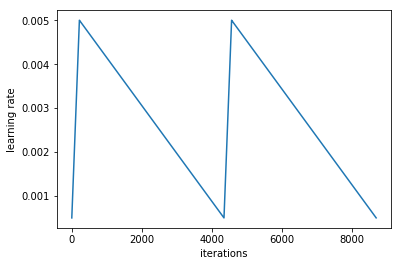

In [23]:
learner.sched.plot_lr()

In [24]:
learner.fit(lrs/16,1,cycle_len=8,use_clr=(5,20))

  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<51:15,  2.83s/it, loss=0.0158]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<41:03,  2.27s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<35:05,  1.94s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:44,  1.65s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:07<27:06,  1.51s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:08<24:38,  1.37s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:09<22:56,  1.28s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:10<21:14,  1.18s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:11<20:47,  1.16s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:12<19:49,  1.11s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:13<18:58,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:14<18:09,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:15<18:24,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:16<17:46,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:17<18:41,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:18<17:58,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:19<18:14,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:20<17:34,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:21<17:39,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:22<17:20,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<27:31,  1.55s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<24:10,  1.36s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<21:50,  1.23s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:11,  1.14s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:04,  1.08s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:25,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:18,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:36,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:20,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<18:03,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<18:07,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:27,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<17:20,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<16:56,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:53,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:15,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<17:25,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<16:56,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<17:16,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<16:47,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<27:01,  1.55s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<23:36,  1.36s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<21:39,  1.25s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:49<19:53,  1.15s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<19:20,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:51<18:15,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:52<18:28,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:53<17:38,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:54<18:01,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:55<17:27,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:56<18:00,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:57<17:16,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:58<17:12,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:59<16:42,  1.03it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [01:00<17:05,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:01<16:36,  1.03it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:02<16:49,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:03<16:52,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:04<17:38,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:05<16:54,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<26:18,  1.54s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<23:04,  1.35s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:10<22:22,  1.31s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:11<20:25,  1.20s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:12<19:30,  1.15s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<18:16,  1.07s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<17:28,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<16:50,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<17:03,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<16:32,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<16:35,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:18<16:11,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<16:25,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:20<16:04,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<16:05,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:22<15:50,  1.06it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<16:15,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:24<15:56,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<15:57,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<15:41,  1.07it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:28<24:31,  1.46s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<22:06,  1.32s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<20:01,  1.20s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<18:32,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<17:53,  1.07s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:04,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<16:48,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<16:17,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<16:42,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<16:17,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:55,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<16:48,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<17:05,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<16:26,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<16:46,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<16:37,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<16:22,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<15:52,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<15:51,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<15:45,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<25:01,  1.52s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:51<21:56,  1.34s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:52<20:43,  1.27s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<19:06,  1.17s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:54<18:03,  1.10s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:32,  1.07s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<17:05,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:24,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<16:39,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<16:12,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:59<16:05,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:00<15:39,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:01<16:10,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:02<15:50,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:04<16:38,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:04<16:02,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:06<16:22,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:06<16:13,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:07<15:49,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:22,  1.05it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:11<23:55,  1.49s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:12<21:02,  1.31s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:13<19:39,  1.22s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:14<18:28,  1.15s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:15<17:28,  1.09s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:16<16:45,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:17<16:41,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:18<16:12,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:19<15:57,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:20<15:55,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:21<16:31,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:22<16:04,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:23<16:07,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:24<15:34,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:25<15:43,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:26<15:24,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:27<15:45,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:28<15:18,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:29<15:36,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:30<15:12,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:32<24:06,  1.53s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:33<21:08,  1.34s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:35<20:34,  1.31s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:36<19:11,  1.22s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:37<18:00,  1.15s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:38<17:13,  1.10s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:39<17:09,  1.10s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:40<16:22,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:41<15:53,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:41<15:21,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:42<15:22,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:43<14:58,  1.04it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:44<15:08,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:45<14:48,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:46<14:56,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:47<14:42,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:48<15:19,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:49<14:54,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:50<15:05,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:51<14:40,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:54<22:50,  1.48s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:55<20:10,  1.31s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:56<18:32,  1.21s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:57<17:08,  1.12s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:58<16:40,  1.09s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:58<15:50,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:00<16:17,  1.06s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:01<15:53,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:02<16:16,  1.06s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:03<15:38,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:04<15:27,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:05<14:59,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:06<15:37,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:07<15:03,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:08<14:47,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:08<14:26,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:09<14:44,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:10<14:24,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:11<14:42,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:12<14:19,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:15<22:32,  1.49s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:16<20:08,  1.34s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:17<18:59,  1.26s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:18<17:22,  1.16s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:19<16:44,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:20<15:50,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:21<15:20,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:22<14:50,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:23<15:06,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:24<14:37,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:25<14:40,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:26<14:18,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:27<14:54,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:28<14:34,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:29<14:20,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:30<14:04,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:31<14:34,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:32<15:26,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:33<15:12,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:34<14:36,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:37<23:26,  1.59s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:38<20:38,  1.40s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:39<18:28,  1.26s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:39<16:54,  1.15s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:40<16:17,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:41<15:20,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:42<15:30,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:43<14:48,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:45<15:27,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:45<14:43,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:46<14:44,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:47<14:15,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:48<14:59,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:49<14:25,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:50<14:27,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:51<14:01,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:52<14:22,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:53<13:59,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:54<13:42,  1.05it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:55<13:40,  1.05it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:58<22:27,  1.56s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:59<19:55,  1.38s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:00<18:50,  1.31s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:01<17:12,  1.20s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:02<16:09,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:03<15:11,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:04<15:14,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:05<14:32,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:06<14:47,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:07<14:12,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:08<14:06,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:09<13:42,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:10<14:06,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:11<13:43,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:12<14:11,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:13<13:47,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:14<14:09,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:15<14:06,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:16<14:07,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:17<13:45,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:20<21:40,  1.54s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:21<19:10,  1.36s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:22<17:33,  1.25s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:22<16:08,  1.15s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:24<15:39,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:25<15:08,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:26<14:52,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:26<14:11,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:28<14:17,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:28<13:47,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:29<13:45,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:30<13:23,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:31<13:48,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:32<13:25,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:33<13:41,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:34<13:23,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:35<13:24,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:36<13:06,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:37<13:39,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:38<13:17,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:41<21:22,  1.55s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:42<18:39,  1.36s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:43<16:49,  1.23s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:44<15:28,  1.13s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:45<15:16,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:46<14:23,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:47<14:16,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:48<13:40,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:49<13:45,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:50<13:18,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:51<13:27,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:52<13:05,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:53<13:06,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:53<12:50,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:54<12:54,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:55<12:42,  1.06it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:56<13:14,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:57<12:54,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:58<13:11,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:59<12:51,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:02<20:17,  1.51s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:03<17:47,  1.33s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:04<16:25,  1.23s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:05<15:06,  1.13s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:06<14:34,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:07<13:49,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:08<13:36,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:09<13:07,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:10<13:12,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:11<12:51,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:12<13:07,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:12<12:45,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:14<13:01,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:14<12:41,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:15<12:53,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:16<12:35,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:17<12:48,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:18<12:31,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:19<12:28,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:20<12:27,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:23<19:40,  1.50s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:24<17:26,  1.33s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:25<15:57,  1.22s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:26<14:41,  1.13s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:27<14:24,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:28<13:37,  1.05s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:29<13:59,  1.08s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:30<13:18,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:31<13:29,  1.04s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:32<12:59,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:33<12:48,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:34<12:28,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:35<12:35,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:36<12:18,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:37<13:03,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:38<12:38,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:39<12:56,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:40<12:31,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:41<12:47,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:42<12:22,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:44<19:16,  1.51s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:45<17:11,  1.35s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:46<15:38,  1.23s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:47<14:23,  1.13s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:48<14:07,  1.11s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:49<13:18,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:50<12:55,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:51<12:48,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:52<12:39,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:53<12:19,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:54<12:54,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:55<12:34,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:56<12:17,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:57<12:00,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [05:58<12:22,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [05:59<12:02,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:00<12:11,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:01<11:57,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:02<12:16,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:03<12:15,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:06<19:10,  1.54s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:07<16:52,  1.36s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:08<16:16,  1.31s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:09<14:45,  1.19s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:10<14:08,  1.15s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:11<13:17,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:12<13:02,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:13<12:38,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:14<12:48,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:15<12:31,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:16<13:03,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:17<12:27,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:18<12:21,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:19<11:57,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:20<12:04,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:21<11:45,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:22<11:46,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:22<11:32,  1.05it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:24<11:53,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:24<11:33,  1.05it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:27<18:29,  1.53s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:28<16:24,  1.36s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:29<15:38,  1.30s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:30<14:11,  1.18s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:31<13:18,  1.11s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:32<12:35,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:33<12:33,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:34<12:00,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:35<12:16,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:36<11:48,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:37<12:04,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:38<11:58,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:39<12:01,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:40<11:37,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:41<11:42,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:42<11:35,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:43<11:32,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:44<11:30,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:45<12:22,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:46<11:50,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:49<17:57,  1.53s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:50<15:56,  1.36s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:51<15:02,  1.28s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:52<13:42,  1.17s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:53<13:00,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:54<12:15,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:55<12:13,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:56<12:27,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:57<12:12,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:58<11:56,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [06:59<11:47,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:00<11:23,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:01<11:34,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:02<11:14,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:03<11:38,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:04<11:39,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:05<11:15,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:06<10:57,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:07<11:22,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:08<11:01,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:11<17:38,  1.55s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:12<15:42,  1.38s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:12<14:11,  1.25s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:13<13:18,  1.17s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:15<12:52,  1.13s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:15<12:04,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:16<11:48,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:17<11:19,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:18<11:11,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:19<10:53,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:20<11:34,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:21<11:21,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:22<11:26,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:23<11:21,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:24<11:26,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:25<11:01,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:26<11:18,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:27<10:57,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:28<11:13,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:29<10:51,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:32<16:33,  1.49s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:33<14:53,  1.35s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:34<13:35,  1.23s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:35<12:30,  1.13s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:36<12:10,  1.10s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:37<11:30,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:38<11:11,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:39<10:48,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:40<10:57,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:41<10:37,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:42<10:51,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:43<10:32,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:44<10:52,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:45<10:38,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:46<10:40,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:46<10:23,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:47<10:35,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:48<10:18,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:50<11:15,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:51<10:45,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:53<16:27,  1.53s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:54<14:26,  1.35s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:55<13:38,  1.27s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:56<12:24,  1.16s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:57<12:02,  1.13s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [07:58<11:18,  1.06s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [07:59<11:13,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:00<10:50,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:01<11:09,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:02<10:39,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:03<10:27,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:04<10:09,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:05<10:19,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:06<10:03,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:07<10:07,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:08<09:54,  1.06it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:09<09:58,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:10<09:48,  1.07it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:11<09:55,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:12<10:03,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:14<15:54,  1.53s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:15<13:57,  1.34s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:16<12:56,  1.25s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:17<11:51,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:18<11:30,  1.11s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:19<10:50,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:20<10:45,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:21<10:18,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:22<10:34,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:23<10:10,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:24<10:34,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:25<10:09,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:26<10:03,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:27<09:47,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:28<10:23,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:29<10:18,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:30<10:11,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:31<09:52,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:32<09:48,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:33<09:34,  1.05it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:36<15:18,  1.52s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:37<13:30,  1.34s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:38<12:41,  1.26s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:39<11:34,  1.15s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:40<11:05,  1.11s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:41<11:02,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:42<11:00,  1.10s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:43<10:23,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:44<09:59,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:45<09:41,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:46<09:40,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:47<09:26,  1.05it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:48<09:41,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:49<09:38,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:50<09:43,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:51<09:44,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:51<09:32,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:52<09:30,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:53<09:32,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:54<09:18,  1.05it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [08:57<14:20,  1.47s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [08:58<12:55,  1.33s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [08:59<11:52,  1.22s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:00<10:56,  1.13s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:01<10:41,  1.10s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:02<10:04,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:03<09:57,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:04<09:40,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:05<09:54,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:06<09:48,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:07<10:01,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:08<09:51,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:09<09:39,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:10<09:19,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:11<09:25,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:12<09:09,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:13<09:17,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:14<09:03,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:15<09:17,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:16<09:03,  1.04it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:19<14:38,  1.56s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:20<12:48,  1.36s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:21<11:43,  1.25s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:21<10:48,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:22<10:27,  1.12s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:23<09:53,  1.06s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:25<10:13,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:25<09:40,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:26<09:29,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:27<09:09,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:28<09:11,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:29<09:03,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:30<09:16,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:31<09:10,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:33<09:34,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:33<09:13,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:34<09:16,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:35<08:57,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:36<08:54,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:37<08:40,  1.05it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:40<13:40,  1.51s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:41<12:02,  1.33s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:42<11:06,  1.23s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:43<10:13,  1.13s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:44<09:57,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:45<10:20,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:46<09:52,  1.10s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:47<09:29,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:48<10:09,  1.13s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:49<09:37,  1.08s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:50<09:47,  1.10s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:51<09:14,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:52<09:06,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:53<08:45,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:54<08:57,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:55<08:38,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:56<08:38,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [09:57<08:24,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [09:58<08:46,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [09:59<08:27,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:02<13:34,  1.55s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:03<11:50,  1.36s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:04<10:53,  1.25s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:05<09:59,  1.15s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:06<09:57,  1.15s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:07<09:21,  1.08s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:08<08:55,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:09<08:34,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:10<08:46,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:11<08:28,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:12<08:27,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:13<08:26,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:14<08:28,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:15<08:15,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:16<08:21,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:17<08:09,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:18<08:32,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:19<08:18,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:20<08:28,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:21<08:23,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:23<13:04,  1.55s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:24<11:24,  1.36s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:25<10:34,  1.26s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:26<09:38,  1.15s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:27<09:14,  1.11s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:28<08:43,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:29<09:00,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:30<08:32,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:31<08:35,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:32<08:14,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:33<08:14,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:34<08:03,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:35<08:28,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:36<08:09,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:37<08:01,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:38<07:49,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:39<08:01,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:40<07:48,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:41<07:51,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:42<07:40,  1.06it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:45<12:32,  1.55s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:46<11:01,  1.37s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:47<10:22,  1.29s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:48<09:26,  1.17s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:49<09:10,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:50<08:55,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:51<08:36,  1.08s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:52<08:10,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:53<08:01,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:54<08:00,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:55<08:33,  1.08s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:56<08:06,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [10:57<07:58,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [10:58<07:41,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [10:59<07:47,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:00<07:43,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:01<07:49,  1.00s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:02<07:34,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:03<07:25,  1.05it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:04<07:23,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:07<11:59,  1.55s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:08<10:30,  1.36s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:09<09:38,  1.25s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:09<08:49,  1.15s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:10<08:29,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:11<08:10,  1.07s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:12<07:58,  1.04s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:13<07:39,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:14<07:46,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:15<07:29,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:16<07:31,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:17<07:26,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:18<07:51,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:19<07:44,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:20<07:40,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:21<07:24,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:22<07:29,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:23<07:15,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:24<07:32,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:25<07:15,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:28<11:24,  1.54s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:29<09:58,  1.35s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:30<09:16,  1.26s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:31<08:44,  1.19s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:32<08:15,  1.12s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:33<07:45,  1.06s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:34<07:26,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:35<07:10,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:36<08:24,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:37<07:50,  1.08s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:38<07:27,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:39<07:10,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:40<07:10,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:41<06:56,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:42<07:02,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:43<06:56,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:44<07:03,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:45<06:52,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:46<07:18,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:47<07:05,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:50<10:55,  1.54s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:51<09:44,  1.38s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:52<09:03,  1.28s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:53<08:17,  1.18s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:54<08:14,  1.17s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:55<07:39,  1.09s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [11:56<07:46,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [11:57<07:19,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [11:58<07:00,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [11:59<06:46,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:00<06:52,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:01<06:39,  1.04it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:02<07:06,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:03<06:48,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:04<06:48,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:05<06:44,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:06<06:57,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:07<06:41,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:08<06:44,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:09<06:39,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:12<10:46,  1.60s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:13<09:27,  1.40s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:14<08:42,  1.30s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:15<07:54,  1.18s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:16<07:30,  1.12s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:17<07:03,  1.06s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:18<06:57,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:18<06:40,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:19<06:41,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:20<06:40,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:21<06:29,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:22<06:18,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:23<06:29,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:24<06:18,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:25<06:18,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:26<06:13,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:27<06:34,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:28<06:19,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:29<06:20,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:30<06:08,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:33<09:39,  1.50s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:34<08:30,  1.33s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:35<07:44,  1.21s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:36<07:08,  1.12s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:37<06:50,  1.08s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:38<06:30,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:39<06:30,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:39<06:14,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:41<06:19,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:41<06:06,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:42<06:17,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:44<06:16,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:45<06:24,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:45<06:09,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:47<06:09,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:48<06:10,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:49<06:15,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:49<06:04,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:50<06:01,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:51<05:51,  1.04it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:54<09:27,  1.55s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [12:55<08:15,  1.36s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [12:56<07:29,  1.24s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [12:57<06:52,  1.14s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [12:58<06:41,  1.11s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [12:59<06:16,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:00<06:10,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:01<05:57,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:02<06:15,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:03<05:59,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:04<06:04,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:05<05:49,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:06<05:59,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:07<05:52,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:08<05:46,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:09<05:42,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:10<05:46,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:11<05:36,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:12<05:38,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:13<05:29,  1.05it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:15<08:28,  1.47s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:16<07:28,  1.30s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:17<07:03,  1.24s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:18<06:28,  1.14s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:19<06:17,  1.11s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:20<06:04,  1.07s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:21<06:03,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:22<05:52,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:23<05:45,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:24<05:41,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:25<05:43,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:26<05:29,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:27<05:27,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:28<05:17,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:29<05:22,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:30<05:15,  1.05it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:31<05:30,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:32<05:19,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:33<05:27,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:34<05:16,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:37<08:31,  1.57s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:38<07:27,  1.38s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:39<06:50,  1.27s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:40<06:13,  1.16s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:41<05:48,  1.09s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:42<05:29,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:43<05:29,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:44<05:16,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:45<05:09,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:46<05:01,  1.05it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:47<05:16,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:48<05:14,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:49<05:05,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:50<04:57,  1.05it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:51<05:08,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:52<05:09,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:53<05:00,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:53<04:53,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [13:54<05:03,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [13:55<04:54,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [13:58<07:48,  1.54s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [13:59<06:49,  1.35s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:00<06:25,  1.27s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:01<05:50,  1.16s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:02<05:33,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:03<05:14,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:04<05:10,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:05<04:57,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:06<04:57,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:07<04:53,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:08<04:52,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:09<04:52,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:10<04:51,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:11<04:42,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:12<04:48,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:13<04:40,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:14<04:40,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:15<04:33,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:16<04:50,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:17<04:39,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:20<07:28,  1.57s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:21<06:32,  1.38s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:22<05:59,  1.27s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:23<05:27,  1.16s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:24<05:15,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:25<04:55,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:26<05:13,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:27<04:53,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:28<05:08,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:29<04:55,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:30<04:49,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:31<04:41,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:32<04:41,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:33<04:38,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:34<04:35,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:35<04:27,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:36<04:20,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:37<04:14,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:38<04:15,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:39<04:09,  1.07it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:41<06:40,  1.51s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:42<05:50,  1.33s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:43<05:19,  1.21s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:44<04:54,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:45<04:44,  1.09s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:46<04:28,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:47<04:25,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:48<04:15,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:49<04:16,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:50<04:16,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:51<04:24,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:52<04:15,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:53<04:21,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [14:54<04:14,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [14:55<04:14,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [14:56<04:12,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [14:57<04:16,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [14:58<04:05,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [14:59<04:07,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:00<04:01,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:03<06:10,  1.51s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:04<05:24,  1.33s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:05<04:57,  1.22s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:06<04:32,  1.13s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:07<04:20,  1.08s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:07<04:06,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:09<04:06,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:09<03:55,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:11<04:05,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:12<04:23,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:13<04:09,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:14<04:02,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:15<03:52,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:16<03:44,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:17<03:44,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:18<03:44,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:19<03:50,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:20<03:42,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:21<03:52,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:22<03:42,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:24<05:46,  1.54s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:25<05:03,  1.35s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:26<04:41,  1.26s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:27<04:16,  1.15s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:28<04:07,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:29<03:54,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:30<03:51,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:31<03:41,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:32<03:46,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:33<03:45,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:35<03:58,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:36<03:45,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:36<03:35,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:37<03:27,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:38<03:27,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:39<03:22,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:40<03:28,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:41<03:21,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:42<03:25,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:43<03:18,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:46<05:07,  1.50s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:47<04:35,  1.35s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:48<04:18,  1.27s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:49<03:55,  1.17s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:50<03:57,  1.18s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:51<03:39,  1.10s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:52<03:41,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [15:53<03:28,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [15:54<03:24,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [15:55<03:15,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [15:56<03:16,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [15:57<03:09,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [15:58<03:05,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [15:59<03:00,  1.06it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:00<03:10,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:01<03:07,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:02<03:12,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:03<03:05,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:04<03:03,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:05<02:57,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:07<04:32,  1.47s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:08<04:04,  1.33s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:10<03:50,  1.26s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:10<03:33,  1.17s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:12<03:35,  1.19s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:13<03:18,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:14<03:20,  1.12s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:15<03:11,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:16<03:15,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:17<03:10,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:18<03:08,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:19<02:59,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:20<03:00,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:21<02:52,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:22<03:00,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:23<02:54,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:24<02:58,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:25<02:50,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:26<02:45,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:27<02:39,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:30<04:08,  1.51s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:31<03:40,  1.35s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:32<03:21,  1.24s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:33<03:05,  1.14s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:34<03:03,  1.14s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:35<02:51,  1.07s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:36<02:46,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:37<02:38,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:38<02:38,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:38<02:32,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:39<02:32,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:40<02:33,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:42<02:40,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:43<02:34,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:44<02:32,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:45<02:27,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:46<02:28,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:47<02:26,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:48<02:27,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:48<02:21,  1.03it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:51<03:41,  1.52s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:52<03:13,  1.34s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [16:53<02:56,  1.24s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [16:54<02:41,  1.14s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [16:55<02:39,  1.13s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [16:56<02:29,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [16:57<02:26,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [16:58<02:19,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [16:59<02:19,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:00<02:14,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:01<02:12,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:02<02:12,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:03<02:15,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:04<02:10,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:05<02:15,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:06<02:11,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:07<02:13,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:08<02:10,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:09<02:10,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:10<02:04,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:13<03:10,  1.52s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:14<02:45,  1.34s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:15<02:33,  1.25s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:16<02:23,  1.18s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:17<02:17,  1.14s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:18<02:07,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:19<02:06,  1.06s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:20<02:13,  1.13s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:21<02:06,  1.08s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:22<02:00,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:23<01:57,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:24<01:54,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:25<02:00,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:26<01:53,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:27<01:53,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:28<01:48,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:29<01:53,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:30<01:50,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:31<01:52,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:32<01:48,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:35<02:42,  1.55s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:36<02:23,  1.38s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:37<02:11,  1.28s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:38<01:59,  1.17s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:39<01:55,  1.14s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:40<01:47,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:41<01:47,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:42<01:43,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:43<01:46,  1.10s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:44<01:41,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:45<01:41,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:46<01:35,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:47<01:35,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:48<01:31,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:49<01:32,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:50<01:30,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:51<01:27,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:52<01:26,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:53<01:27,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [17:54<01:24,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [17:57<02:10,  1.53s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [17:58<01:52,  1.34s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [17:59<01:43,  1.25s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:00<01:34,  1.15s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:01<01:28,  1.09s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:02<01:23,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:03<01:20,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:04<01:16,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:05<01:16,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:05<01:13,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:07<01:15,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:08<01:13,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:09<01:14,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:10<01:10,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:11<01:11,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:11<01:08,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:12<01:07,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:14<01:09,  1.02s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:15<01:07,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:15<01:04,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:18<01:39,  1.54s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:19<01:27,  1.37s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:20<01:19,  1.27s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:21<01:11,  1.16s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:22<01:07,  1.10s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:23<01:02,  1.04s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:24<01:02,  1.06s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:25<00:58,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:26<00:58,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:27<00:55,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:28<00:54,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:29<00:52,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:30<00:52,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:31<00:50,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:32<00:49,  1.03it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:33<00:47,  1.05it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:34<00:48,  1.00it/s, loss=0.0137]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:35<00:46,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:36<00:46,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:37<00:46,  1.02s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:40<01:11,  1.58s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:41<01:00,  1.37s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:42<00:55,  1.29s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:43<00:49,  1.17s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:44<00:44,  1.10s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:45<00:42,  1.06s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:46<00:40,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:47<00:38,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:48<00:37,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:48<00:35,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:50<00:34,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:50<00:32,  1.04it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:51<00:32,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:52<00:31,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [18:53<00:30,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [18:54<00:28,  1.04it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [18:55<00:28,  1.00it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [18:56<00:27,  1.03it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [18:57<00:26,  1.01it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [18:58<00:25,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:01<00:37,  1.50s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:02<00:32,  1.36s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:03<00:30,  1.32s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:04<00:26,  1.22s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:05<00:23,  1.13s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:06<00:21,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:07<00:20,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:08<00:18,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:09<00:18,  1.08s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:10<00:16,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:11<00:15,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:12<00:13,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:13<00:12,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:14<00:11,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:15<00:10,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:16<00:09,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:17<00:09,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:18<00:08,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:19<00:07,  1.03s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:20<00:05,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:23<00:07,  1.50s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:24<00:05,  1.32s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:25<00:03,  1.23s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:26<00:02,  1.13s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:27<00:01,  1.11s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


epoch      trn_loss   val_loss   acc                            
    0      0.013529   0.013434   0.972389  
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<49:17,  2.73s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<39:25,  2.18s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<32:50,  1.82s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<28:03,  1.56s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:14,  1.46s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:24,  1.30s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:43,  1.26s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:45,  1.15s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:31,  1.09s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:33,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:38,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:53,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:03,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:27,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<17:51,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:20,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:25,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:06,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:36,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:21,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:38,  1.50s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:43,  1.34s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<21:53,  1.24s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:25,  1.15s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<20:35,  1.16s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<19:34,  1.11s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:37,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<18:06,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<17:55,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:32<17:16,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:24,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:34<16:56,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:35<17:32,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:36<17:01,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:44,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:38<17:25,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:39<17:26,  1.00it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:40<17:03,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:41<17:38,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:42<17:03,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<26:10,  1.50s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<23:22,  1.34s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<22:03,  1.27s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<20:06,  1.16s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<19:18,  1.11s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<18:13,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<17:58,  1.04s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<17:18,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<18:10,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<17:24,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:24,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:54,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<17:14,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:47,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<16:58,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:31,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<16:43,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:22,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<16:37,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:14,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:06<25:42,  1.51s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:07<22:46,  1.33s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:08<20:54,  1.23s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:09<19:34,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:10<18:44,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:11<17:45,  1.04s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:12<17:16,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:13<16:40,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:14<17:02,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:15<16:30,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:16<16:41,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:17<16:35,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:18<17:02,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:19<16:46,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:20<16:56,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:21<16:46,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:22<17:00,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:23<16:27,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:24<16:43,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:25<16:15,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:28<25:14,  1.51s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<22:22,  1.34s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<21:25,  1.28s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<19:33,  1.17s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<19:06,  1.15s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:53,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<17:19,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<16:37,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<16:49,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<16:17,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:43,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<16:17,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:39<16:05,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:40<16:01,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<17:07,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<17:03,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<18:36,  1.13s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<17:25,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<16:41,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<16:06,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:49<24:12,  1.47s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:50<21:21,  1.30s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:51<20:08,  1.23s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:52<18:32,  1.13s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:53<18:17,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:54<17:12,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:55<16:48,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:56<16:09,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:57<16:17,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:58<15:48,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:59<16:08,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:00<15:43,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:01<16:07,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:02<15:54,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:03<15:55,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:04<15:32,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:05<15:36,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:06<15:16,  1.06it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:07<15:29,  1.04it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:26,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:10<24:16,  1.51s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:11<21:17,  1.33s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:12<19:56,  1.24s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:13<18:17,  1.14s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:14<17:27,  1.09s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:15<16:32,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:16<16:44,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:17<16:05,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:18<16:02,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:19<15:32,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:20<15:41,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:21<15:18,  1.04it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:22<15:31,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:23<15:09,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:24<15:37,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:25<15:13,  1.04it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:26<15:24,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:27<15:19,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:28<16:02,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:29<15:29,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:32<24:20,  1.55s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:33<21:16,  1.35s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:34<19:32,  1.24s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:35<17:55,  1.14s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:36<17:42,  1.13s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:37<16:37,  1.06s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:37<15:57,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:38<15:24,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:39<15:19,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:40<15:00,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:41<15:18,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:42<14:56,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:43<15:21,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:44<14:59,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:45<15:14,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:46<14:53,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:47<14:58,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:48<14:39,  1.06it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:49<14:54,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:50<14:34,  1.06it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:53<23:13,  1.51s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:54<20:49,  1.35s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:55<18:58,  1.23s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:56<17:30,  1.14s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:57<17:11,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:58<16:11,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:59<16:25,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:00<15:41,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:01<16:00,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:02<15:23,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:03<16:05,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:04<15:22,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:05<15:30,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:06<14:57,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:07<14:45,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:07<14:27,  1.05it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:09<14:57,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:09<14:43,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:10<14:55,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:11<14:30,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:14<22:34,  1.50s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:15<19:58,  1.33s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:16<18:50,  1.25s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:17<17:36,  1.17s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:18<17:27,  1.16s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:19<16:16,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:20<16:05,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:21<15:20,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:22<15:03,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:23<14:36,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:24<15:05,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:25<14:37,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:26<14:36,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:27<14:17,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:28<14:35,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:29<14:15,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:30<14:32,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:31<14:13,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:32<14:20,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:33<14:00,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:36<22:25,  1.52s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:36<19:40,  1.34s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:37<17:49,  1.21s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:38<16:27,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:39<15:35,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:40<14:54,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:41<15:33,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:42<15:17,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:43<14:56,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:44<14:22,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:45<14:35,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:46<14:35,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:47<14:57,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:48<14:24,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:49<14:48,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:50<14:17,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:51<14:37,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:52<14:10,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:53<14:00,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:54<13:39,  1.06it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:57<21:13,  1.47s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:58<18:43,  1.30s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [03:59<17:29,  1.22s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:00<16:11,  1.13s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:01<15:59,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:02<15:25,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:03<15:30,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:04<14:49,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:05<15:03,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:06<14:25,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:07<14:56,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:08<14:18,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:09<14:11,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:10<13:46,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:11<14:00,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:11<13:38,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:13<13:58,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:13<13:37,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:14<13:49,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:15<13:30,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:18<21:21,  1.52s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:19<18:52,  1.34s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:20<17:15,  1.23s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:21<15:51,  1.13s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:22<15:16,  1.09s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:23<14:29,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:24<14:30,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:25<13:55,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:26<14:06,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:27<13:39,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:28<14:12,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:29<13:45,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:30<13:53,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:31<13:28,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:32<13:45,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:33<13:21,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:34<13:40,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:35<13:20,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:36<13:44,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:37<13:19,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:39<20:59,  1.53s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:40<18:38,  1.36s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:42<17:42,  1.29s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:43<16:24,  1.20s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:43<15:13,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:44<14:20,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:45<13:49,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:46<13:32,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:47<13:36,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:48<13:10,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:49<13:26,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:50<13:13,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:51<13:54,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:52<13:42,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:53<13:32,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:54<13:11,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:55<13:40,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:56<13:36,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:57<13:26,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:58<13:01,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:01<20:27,  1.52s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:02<18:14,  1.36s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:03<16:29,  1.23s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:04<15:07,  1.13s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:05<14:16,  1.07s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:06<13:37,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:06<13:10,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:08<13:40,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:09<13:09,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:10<13:17,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:10<12:53,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:11<13:12,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:12<12:50,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:13<13:06,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:14<12:44,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:15<13:05,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:16<13:04,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:17<12:55,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:18<12:33,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:19<12:28,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:22<20:26,  1.56s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:23<17:56,  1.37s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:24<16:16,  1.25s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:25<14:53,  1.14s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:26<14:55,  1.15s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:27<13:58,  1.07s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:28<13:37,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:29<13:04,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:30<13:00,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:31<12:44,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:32<13:49,  1.07s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:33<13:09,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:34<13:04,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:35<12:42,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:36<12:37,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:37<12:19,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:38<12:24,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:39<12:09,  1.05it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:40<12:28,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:41<12:10,  1.05it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:44<19:39,  1.54s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:45<17:18,  1.36s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:45<15:46,  1.24s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:46<14:35,  1.15s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:48<14:37,  1.15s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:48<13:38,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:49<13:00,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:50<12:31,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:51<12:52,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:52<12:42,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:54<13:16,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:54<12:45,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:56<13:04,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:56<12:35,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [05:58<12:58,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [05:59<12:44,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:00<13:40,  1.10s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:01<13:12,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:02<13:34,  1.09s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:03<12:54,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:06<19:30,  1.57s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:07<17:15,  1.39s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:08<16:18,  1.32s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:09<14:45,  1.19s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:10<14:25,  1.17s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:11<13:41,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:12<13:30,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:13<12:53,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:14<13:20,  1.09s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:15<12:39,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:16<12:49,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:17<12:15,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:18<12:36,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:19<12:07,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:20<12:29,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:21<12:04,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:22<12:36,  1.04s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:23<12:06,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:24<12:42,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:25<12:11,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:28<19:00,  1.57s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:29<16:45,  1.39s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:30<15:18,  1.27s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:31<14:24,  1.20s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:32<13:31,  1.13s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:33<12:51,  1.07s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:34<12:33,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:35<12:03,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:36<12:42,  1.06s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:37<12:08,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:38<12:21,  1.04s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:39<11:54,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:40<12:34,  1.06s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:41<12:15,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:42<13:13,  1.12s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:43<12:44,  1.08s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:44<13:09,  1.11s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:45<12:38,  1.07s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:47<12:38,  1.07s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:47<12:04,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:50<19:04,  1.62s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:51<16:41,  1.42s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:53<15:30,  1.32s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:53<14:14,  1.22s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:55<14:15,  1.22s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:56<13:19,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:57<13:09,  1.13s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:58<12:22,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:59<13:05,  1.13s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:00<12:25,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:01<12:31,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:02<11:54,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:03<11:53,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:04<11:28,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:05<11:33,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:06<11:12,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:07<11:19,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:08<11:03,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:09<10:58,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:10<10:46,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:12<17:01,  1.49s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:13<15:12,  1.33s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:14<14:25,  1.27s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:15<13:20,  1.17s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:17<13:26,  1.18s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:18<12:34,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:18<12:06,  1.07s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:19<11:45,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:21<12:09,  1.08s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:22<11:32,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:23<11:52,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:24<11:32,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:25<11:34,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:26<11:08,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:27<11:17,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:28<10:56,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:29<11:05,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:29<10:46,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:30<10:53,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:31<10:36,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:34<16:51,  1.52s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:35<14:53,  1.35s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:36<13:51,  1.25s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:37<12:41,  1.15s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:38<12:11,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:39<11:29,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:40<11:21,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:41<10:55,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:42<10:59,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:43<10:39,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:44<11:07,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:45<10:42,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:46<11:07,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:47<11:01,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:48<11:08,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:49<10:43,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:50<11:01,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:51<10:44,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:52<10:52,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:53<10:30,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:56<16:39,  1.55s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:57<14:32,  1.35s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:58<13:06,  1.22s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:58<12:03,  1.13s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:00<11:46,  1.10s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:01<11:22,  1.07s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:02<11:35,  1.09s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:03<10:59,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:03<10:36,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:04<10:16,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:05<10:22,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:06<10:13,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:07<10:16,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:08<10:01,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:09<10:19,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:10<10:03,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:11<10:12,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:12<10:15,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:13<10:12,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:14<09:55,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:17<15:43,  1.51s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:18<13:47,  1.33s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:19<13:00,  1.25s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:20<11:54,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:21<11:30,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:22<10:51,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:23<10:58,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:24<10:28,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:25<10:36,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:26<10:11,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:27<10:05,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:28<10:02,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:29<09:57,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:29<09:43,  1.05it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:31<10:17,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:31<09:54,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:32<10:02,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:33<09:45,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:34<09:56,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:35<09:39,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:38<15:16,  1.52s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:39<13:31,  1.34s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:40<12:26,  1.24s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:41<11:28,  1.14s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:42<11:18,  1.13s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:43<10:37,  1.06s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:44<10:30,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:45<10:02,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:46<10:05,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:47<10:00,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:48<09:58,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:49<09:45,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:50<09:48,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:51<09:31,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:52<09:42,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:53<09:27,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:54<09:34,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:55<09:20,  1.05it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:56<09:38,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:57<09:22,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:00<15:02,  1.54s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:00<13:10,  1.35s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:01<12:09,  1.25s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:02<11:07,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:03<10:41,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:04<10:06,  1.05s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:05<10:05,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:06<09:40,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:07<09:36,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:08<09:19,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:09<09:32,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:10<09:16,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:11<09:18,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:12<09:06,  1.05it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:13<09:25,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:14<09:09,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:15<09:30,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:16<09:33,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:17<09:41,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:18<09:18,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:21<14:09,  1.50s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:22<12:26,  1.32s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:23<11:37,  1.24s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:24<10:40,  1.14s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:25<10:25,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:26<09:52,  1.06s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:27<10:01,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:28<09:31,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:29<09:33,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:30<09:11,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:31<09:13,  1.00it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:31<08:58,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:33<09:10,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:33<08:54,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:34<08:58,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:35<08:45,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:36<09:10,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:37<08:53,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:38<09:07,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:39<08:49,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:42<13:45,  1.51s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:43<12:14,  1.35s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:44<11:10,  1.24s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:45<10:19,  1.14s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:46<09:52,  1.10s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:47<09:20,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:48<09:20,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:49<08:57,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:50<09:08,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:51<08:48,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:52<08:51,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:53<08:49,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:54<09:15,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:55<09:10,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:56<09:13,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:57<08:50,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:58<09:25,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [09:59<08:58,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:00<09:01,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:01<08:39,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:04<13:40,  1.56s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:05<11:59,  1.37s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:06<11:12,  1.29s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:07<10:12,  1.17s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:08<09:43,  1.12s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:09<09:09,  1.06s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:10<09:21,  1.08s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:11<08:51,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:12<08:47,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:13<08:29,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:14<08:25,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:15<08:13,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:16<08:29,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:17<08:16,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:18<08:33,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:19<08:17,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:20<08:23,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:20<08:10,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:22<08:39,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:23<08:19,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:25<13:08,  1.56s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:26<11:28,  1.37s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:27<10:21,  1.24s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:28<09:30,  1.14s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:29<09:14,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:30<08:50,  1.06s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:31<08:56,  1.08s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:32<08:41,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:33<08:21,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:34<08:07,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:35<08:11,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:36<07:56,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:37<08:07,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:38<07:54,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:39<08:22,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:40<08:04,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:41<08:13,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:42<07:57,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:43<07:57,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:44<07:47,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:47<12:04,  1.49s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:48<10:48,  1.34s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:49<09:55,  1.23s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:49<09:07,  1.13s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:51<08:50,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:51<08:20,  1.04s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:52<08:07,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:53<07:49,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:54<07:49,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:55<07:35,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:56<07:35,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:57<07:26,  1.06it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [10:58<07:37,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [10:59<07:27,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:00<07:38,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:01<07:28,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:02<07:51,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:03<07:40,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:04<07:39,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:05<07:28,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:08<11:39,  1.50s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:09<10:12,  1.32s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:10<09:35,  1.24s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:10<08:47,  1.14s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:12<08:33,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:12<08:03,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:13<07:47,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:14<07:30,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:15<07:31,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:16<07:19,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:17<07:31,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:18<07:18,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:19<07:26,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:20<07:27,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:21<07:33,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:22<07:19,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:23<07:22,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:24<07:10,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:25<07:09,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:26<07:00,  1.06it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:29<11:05,  1.50s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:30<09:55,  1.34s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:31<08:57,  1.21s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:31<08:15,  1.12s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:33<08:11,  1.11s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:33<07:43,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:35<07:46,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:35<07:25,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:37<07:33,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:37<07:14,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:39<07:23,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:39<07:07,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:41<07:16,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:41<07:01,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:42<07:05,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:43<06:53,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:44<06:59,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:45<06:49,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:46<07:01,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:47<06:48,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:50<10:40,  1.51s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:51<09:34,  1.36s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:52<09:08,  1.30s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:53<08:17,  1.18s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:54<08:10,  1.16s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:55<07:37,  1.09s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [11:56<07:41,  1.10s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [11:57<07:16,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [11:58<07:13,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [11:59<06:55,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:00<06:53,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:01<06:40,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:02<06:54,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:03<06:42,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:04<06:48,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:05<06:35,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:06<06:37,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:07<06:38,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:08<06:42,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:09<06:31,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:12<10:10,  1.51s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:12<08:56,  1.33s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:13<08:15,  1.23s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:14<07:35,  1.13s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:16<07:36,  1.14s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:16<07:06,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:18<07:09,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:18<06:48,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:19<06:49,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:21<06:47,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:22<06:47,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:22<06:36,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:24<06:51,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:25<06:40,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:26<06:55,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:27<06:36,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:28<06:41,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:29<06:25,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:30<06:39,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:31<06:22,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:33<09:48,  1.53s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:34<08:35,  1.34s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:35<07:57,  1.25s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:36<07:24,  1.16s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:37<07:06,  1.12s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:38<06:40,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:39<06:35,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:40<06:28,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:41<06:19,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:42<06:07,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:43<06:09,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:44<05:58,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:45<06:08,  1.01it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:46<05:57,  1.04it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:47<05:57,  1.04it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:48<05:50,  1.06it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:49<05:57,  1.03it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:50<05:48,  1.05it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:51<05:45,  1.06it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:52<05:40,  1.07it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:55<09:13,  1.52s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [12:55<08:13,  1.36s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [12:56<07:28,  1.24s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [12:57<06:51,  1.14s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [12:58<06:36,  1.10s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [12:59<06:15,  1.04s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:00<06:17,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:01<06:01,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:02<06:13,  1.05s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:03<06:19,  1.07s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:04<06:03,  1.03s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:05<05:53,  1.00it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:06<05:53,  1.00s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:07<05:45,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:08<05:43,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:09<05:34,  1.05it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:10<05:52,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:11<05:42,  1.02it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:12<05:52,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:13<05:38,  1.02it/s, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:16<08:43,  1.52s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:17<07:44,  1.35s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:18<07:20,  1.28s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:19<06:48,  1.20s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:20<06:36,  1.16s/it, loss=0.0136]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:21<06:15,  1.10s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:23<06:42,  1.19s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:23<06:12,  1.10s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:24<05:53,  1.05s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:25<05:39,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:26<05:37,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:27<05:27,  1.02it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:28<05:31,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:29<05:31,  1.00it/s, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:30<05:35,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:31<05:31,  1.01s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:32<05:37,  1.02s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:33<05:28,  1.00s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:34<05:31,  1.01s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:35<05:23,  1.01it/s, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:38<08:18,  1.53s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:39<07:26,  1.38s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:40<06:46,  1.26s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:41<06:13,  1.16s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:42<06:22,  1.19s/it, loss=0.0135]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:43<05:54,  1.11s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:44<05:47,  1.09s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:45<05:29,  1.04s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:46<05:25,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:47<05:13,  1.01it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:48<05:16,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:49<05:08,  1.02it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:50<05:23,  1.03s/it, loss=0.0134]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:51<05:18,  1.02s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:52<05:30,  1.06s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:53<05:15,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:54<05:23,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:55<05:10,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [13:56<05:27,  1.07s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [13:57<05:11,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:00<07:58,  1.57s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:01<06:59,  1.38s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:02<06:34,  1.30s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:03<06:02,  1.20s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:04<05:58,  1.19s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:05<05:32,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:06<05:29,  1.10s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:07<05:16,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:08<05:20,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:09<05:04,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:10<05:09,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:12<05:07,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:13<05:15,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:14<05:07,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:15<05:05,  1.05s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:16<04:58,  1.03s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:17<04:55,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:18<04:45,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:19<04:46,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:20<04:39,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:22<07:19,  1.54s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:23<06:28,  1.37s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:25<06:11,  1.31s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:25<05:36,  1.19s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:27<05:22,  1.15s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:27<05:01,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:28<04:55,  1.06s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:29<04:42,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:30<04:50,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:31<04:40,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:33<04:57,  1.08s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:34<04:48,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:35<04:54,  1.08s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:36<04:40,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:37<04:30,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:38<04:22,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:39<04:32,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:40<04:37,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:41<04:27,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:42<04:19,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:44<06:39,  1.51s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:45<05:55,  1.35s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:46<05:25,  1.24s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:47<05:04,  1.16s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:48<04:59,  1.15s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:49<04:39,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:50<04:36,  1.07s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:51<04:23,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:52<04:25,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:53<04:20,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:54<04:27,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:55<04:16,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:56<04:20,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [14:57<04:15,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [14:59<04:28,  1.07s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [14:59<04:14,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:00<04:12,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:01<04:03,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:02<04:07,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:03<04:01,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:06<06:09,  1.51s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:07<05:30,  1.35s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:08<04:58,  1.23s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:09<04:33,  1.13s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:10<04:16,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:11<04:04,  1.02s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:12<04:10,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:13<04:11,  1.06s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:14<04:01,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:15<03:52,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:16<03:50,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:17<03:44,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:18<03:48,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:19<03:42,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:20<03:46,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:21<03:42,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:22<03:50,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:23<03:42,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:24<03:41,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:24<03:34,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:27<05:33,  1.48s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:28<04:58,  1.33s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:29<04:31,  1.22s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:30<04:09,  1.12s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:31<04:07,  1.12s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:32<03:59,  1.09s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:33<03:51,  1.06s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:34<03:40,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:35<03:47,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:36<03:36,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:37<03:32,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:38<03:26,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:39<03:30,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:40<03:24,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:41<03:32,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:42<03:24,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:43<03:23,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:44<03:18,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:45<03:20,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:46<03:14,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:48<05:07,  1.50s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:49<04:29,  1.32s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:50<04:19,  1.28s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:51<03:54,  1.16s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:52<03:45,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:53<03:30,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:54<03:31,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [15:55<03:20,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [15:56<03:18,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [15:57<03:11,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [15:58<03:18,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [15:59<03:13,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:00<03:18,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:01<03:10,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:02<03:09,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:03<03:03,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:04<03:07,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:05<03:01,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:06<03:02,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:07<03:01,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:10<04:53,  1.59s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:11<04:18,  1.40s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:12<03:52,  1.27s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:13<03:34,  1.18s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:14<03:20,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:15<03:08,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:16<03:03,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:17<03:00,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:18<02:58,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:19<02:51,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:20<02:51,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:21<02:50,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:22<02:51,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:23<02:45,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:24<02:43,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:24<02:39,  1.06it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:26<02:46,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:26<02:41,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:28<02:48,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:28<02:41,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:31<04:13,  1.54s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:32<03:44,  1.37s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:33<03:26,  1.27s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:34<03:11,  1.18s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:35<03:07,  1.16s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:36<02:53,  1.08s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:37<02:48,  1.06s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:38<02:39,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:39<02:40,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:40<02:33,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:41<02:38,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:42<02:35,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:43<02:32,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:44<02:30,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:45<02:33,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:46<02:27,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:47<02:31,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:48<02:29,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:49<02:31,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:50<02:25,  1.00it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:53<03:43,  1.54s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:54<03:19,  1.38s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [16:55<03:01,  1.27s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [16:56<02:44,  1.16s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [16:57<02:32,  1.08s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [16:58<02:24,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [16:59<02:21,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:00<02:15,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:01<02:20,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:02<02:14,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:03<02:11,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:04<02:07,  1.05it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:05<02:09,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:05<02:05,  1.05it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:06<02:05,  1.05it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:07<02:05,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:08<02:05,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:09<02:02,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:10<02:04,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:11<02:01,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:14<03:05,  1.49s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:15<02:42,  1.31s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:16<02:30,  1.22s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:17<02:17,  1.13s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:18<02:12,  1.09s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:19<02:04,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:20<02:07,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:21<02:00,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:22<02:01,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:23<01:55,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:24<02:00,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:25<01:54,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:26<01:54,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:27<01:49,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:28<01:47,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:29<01:44,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:30<01:49,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:31<01:45,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:32<01:42,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:32<01:40,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:35<02:42,  1.55s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:36<02:23,  1.38s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:37<02:09,  1.25s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:38<01:58,  1.17s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:39<01:55,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:40<01:47,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:41<01:45,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:42<01:42,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:43<01:40,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:44<01:36,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:45<01:39,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:46<01:36,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:48<01:38,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:49<01:34,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:50<01:31,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:50<01:27,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:51<01:27,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:52<01:27,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:53<01:27,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [17:54<01:23,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [17:57<02:09,  1.53s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [17:58<01:55,  1.37s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [17:59<01:47,  1.29s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:00<01:36,  1.17s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:01<01:30,  1.12s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:02<01:25,  1.06s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:03<01:23,  1.06s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:04<01:21,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:05<01:19,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:06<01:16,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:07<01:16,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:08<01:12,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:09<01:13,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:10<01:09,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:11<01:11,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:12<01:10,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:13<01:14,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:14<01:10,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:15<01:09,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:16<01:05,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:19<01:39,  1.54s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:20<01:26,  1.35s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:21<01:18,  1.24s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:22<01:10,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:23<01:07,  1.10s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:24<01:02,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:25<01:00,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:26<00:57,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:27<00:56,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:28<00:54,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:29<00:54,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:29<00:51,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:31<00:52,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:31<00:50,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:32<00:50,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:33<00:47,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:34<00:48,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:35<00:46,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:36<00:46,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:37<00:44,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:40<01:10,  1.57s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:41<01:01,  1.39s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:42<00:53,  1.25s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:43<00:47,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:44<00:44,  1.08s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:45<00:42,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:46<00:40,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:47<00:38,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:48<00:37,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:49<00:35,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:50<00:34,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:51<00:33,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:52<00:34,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:53<00:32,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [18:54<00:31,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [18:55<00:29,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [18:56<00:29,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [18:57<00:27,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [18:58<00:28,  1.04s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [18:59<00:25,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:02<00:39,  1.57s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:03<00:33,  1.39s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:04<00:29,  1.27s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:05<00:25,  1.16s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:06<00:24,  1.16s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:07<00:21,  1.10s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:08<00:20,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:09<00:18,  1.00s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:10<00:16,  1.00it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:11<00:15,  1.03it/s, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:12<00:15,  1.01s/it, loss=0.0133]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:13<00:14,  1.00s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:14<00:13,  1.06s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:15<00:12,  1.04s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:16<00:11,  1.08s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:17<00:10,  1.03s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:18<00:09,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:19<00:07,  1.02it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:20<00:06,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:21<00:05,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:24<00:07,  1.51s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:24<00:05,  1.34s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:26<00:03,  1.27s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:27<00:02,  1.16s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:28<00:01,  1.17s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    1      0.013122   0.013297   0.972389                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<51:53,  2.87s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<41:19,  2.29s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<33:57,  1.88s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:07,  1.62s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:22,  1.46s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:41,  1.32s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:33,  1.25s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:38,  1.15s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:35,  1.09s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:34,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:30,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:53,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<17:57,  1.00s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:24,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:21,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:36,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<18:46,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<18:07,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:34,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:06,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:58,  1.52s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<24:10,  1.36s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<21:53,  1.24s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:30,  1.16s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<20:20,  1.15s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<19:01,  1.08s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:50,  1.07s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:59,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:08,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:26,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:42,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:27,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<18:31,  1.06s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<18:05,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:58,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:19,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<17:30,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<17:27,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<18:00,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<17:19,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<26:40,  1.53s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<23:23,  1.34s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<21:27,  1.23s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<19:42,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<18:53,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<17:54,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<17:30,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<16:57,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<17:15,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<16:45,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:07,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:38,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<17:04,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:34,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<16:52,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:26,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<17:01,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:44,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<17:18,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:56,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<25:25,  1.49s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<22:27,  1.32s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<21:29,  1.26s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:59,  1.17s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<19:51,  1.17s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<18:31,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<18:33,  1.09s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<17:34,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<17:39,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<17:09,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<18:32,  1.10s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:18<17:34,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<17:51,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:20<17:03,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<17:16,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:22<16:37,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<16:36,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:24<16:29,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<16:36,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<16:09,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:28<24:40,  1.47s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<22:12,  1.33s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<20:22,  1.22s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<19:04,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<18:57,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:45,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<17:03,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<16:24,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<16:17,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<15:54,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:01,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<15:40,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<16:15,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<16:02,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<16:05,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<15:44,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<15:50,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<15:30,  1.06it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<15:45,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<15:26,  1.06it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:49<23:47,  1.45s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:50<21:05,  1.29s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:51<19:22,  1.18s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:52<19:04,  1.17s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:53<18:09,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:54<17:23,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:55<16:34,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:56<16:03,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:57<16:19,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:58<16:10,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:59<16:48,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:00<16:16,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:01<16:11,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:02<16:04,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:03<16:35,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:04<16:08,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:05<16:40,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:06<16:27,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:07<16:20,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:45,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:11<24:34,  1.53s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:12<21:32,  1.34s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:13<19:43,  1.23s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:14<18:20,  1.14s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:15<17:13,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:16<16:22,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:17<16:27,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:17<15:46,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:19<16:02,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:19<15:49,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:21<16:12,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:21<15:38,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:23<16:05,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:23<15:33,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:24<15:52,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:25<15:40,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:26<15:40,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:27<15:13,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:28<15:05,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:29<14:44,  1.07it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:32<22:33,  1.43s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:33<20:02,  1.27s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:34<19:32,  1.24s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:35<18:05,  1.15s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:36<17:18,  1.10s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:37<16:24,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:38<16:56,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:39<16:05,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:40<16:11,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:41<15:33,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:42<15:32,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:43<15:17,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:44<16:21,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:45<15:36,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:46<15:23,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:47<14:58,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:48<15:27,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:49<14:59,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:50<15:00,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:50<14:38,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:53<23:29,  1.52s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:54<20:49,  1.35s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:55<19:14,  1.25s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:56<17:54,  1.17s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:57<17:50,  1.16s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:58<16:36,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:59<16:49,  1.10s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:00<15:52,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:01<15:59,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:02<15:45,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:03<15:12,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:04<14:51,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:05<15:08,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:06<14:43,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:07<15:04,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:08<14:40,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:09<14:50,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:10<14:52,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:11<15:22,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:12<14:48,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:15<23:03,  1.53s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:16<20:20,  1.35s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:17<19:14,  1.28s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:18<17:47,  1.18s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:19<16:57,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:20<15:59,  1.07s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:21<15:42,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:22<15:04,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:23<15:27,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:24<14:50,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:25<15:07,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:26<14:38,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:27<14:59,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:28<14:31,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:29<14:53,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:30<14:34,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:31<15:18,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:32<14:57,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:33<14:55,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:34<14:24,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:37<23:06,  1.57s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:38<20:21,  1.38s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:39<18:34,  1.26s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:40<17:20,  1.18s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:41<16:15,  1.11s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:41<15:21,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:42<14:42,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:43<14:13,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:44<14:16,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:45<13:54,  1.05it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:46<14:08,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:47<13:48,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:48<14:15,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:49<13:52,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:50<14:00,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:51<13:42,  1.06it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:52<14:08,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:53<14:02,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:54<13:56,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:55<13:39,  1.06it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:58<21:45,  1.51s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:58<19:03,  1.32s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [03:59<17:31,  1.22s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:00<16:13,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:02<16:48,  1.17s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:03<15:37,  1.09s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:03<14:50,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:04<14:13,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:05<14:31,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:06<13:56,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:07<13:55,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:08<13:43,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:09<13:58,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:10<13:33,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:11<13:23,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:12<13:22,  1.06it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:13<13:32,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:14<13:19,  1.06it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:15<13:34,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:16<13:14,  1.06it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:19<21:19,  1.51s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:20<18:59,  1.35s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:21<17:09,  1.22s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:21<15:48,  1.13s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:23<15:31,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:23<14:38,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:24<14:44,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:25<14:04,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:26<14:20,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:27<13:48,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:28<14:05,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:29<13:36,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:30<13:44,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:31<13:21,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:32<13:36,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:33<13:20,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:34<13:18,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:35<13:02,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:36<13:06,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:37<12:52,  1.07it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:40<20:22,  1.48s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:41<18:04,  1.32s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:42<16:24,  1.20s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:42<15:15,  1.11s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:43<14:29,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:44<13:48,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:45<13:50,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:46<13:21,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:47<13:20,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:48<13:20,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:49<13:16,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:50<13:10,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:51<12:53,  1.05it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:52<13:36,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:53<13:17,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:54<13:43,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:55<13:12,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:56<13:37,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:57<13:08,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:58<12:58,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:01<20:47,  1.55s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:02<18:19,  1.37s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:03<16:38,  1.24s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:04<15:15,  1.14s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:05<14:54,  1.12s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:06<14:01,  1.05s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:07<14:18,  1.07s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:08<13:35,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:09<13:14,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:09<12:49,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:10<12:53,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:11<12:35,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:12<12:51,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:13<12:33,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:14<12:55,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:15<12:34,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:16<12:33,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:17<12:21,  1.06it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:18<12:44,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:19<12:25,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:22<19:29,  1.49s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:23<17:21,  1.33s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:24<15:56,  1.22s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:25<14:40,  1.13s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:26<14:41,  1.13s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:27<13:49,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:28<14:04,  1.08s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:29<13:19,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:30<13:07,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:31<12:39,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:32<12:51,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:33<12:31,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:34<12:48,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:34<12:25,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:36<12:44,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:36<12:37,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:38<12:53,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:39<12:56,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:40<13:08,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:41<12:38,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:44<20:40,  1.62s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:45<17:51,  1.40s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:45<15:58,  1.26s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:46<14:38,  1.15s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:47<13:46,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:48<13:03,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:49<12:35,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:50<12:15,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:51<12:33,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:52<12:12,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:53<12:33,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:54<12:11,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:55<12:20,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:56<12:01,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [05:57<12:07,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [05:58<11:52,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [05:59<12:04,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:00<11:55,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:01<12:32,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:02<12:07,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:04<18:35,  1.50s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:05<16:27,  1.33s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:06<15:39,  1.26s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:07<14:33,  1.18s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:09<14:19,  1.16s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:09<13:24,  1.09s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:11<13:05,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:11<12:32,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:12<12:39,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:13<12:28,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:15<12:47,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:15<12:13,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:16<12:09,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:17<11:49,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:18<11:52,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:19<11:37,  1.05it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:20<12:00,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:21<11:40,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:22<11:50,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:23<11:41,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:26<18:29,  1.53s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:27<16:42,  1.38s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:28<15:21,  1.27s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:29<13:59,  1.16s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:30<13:30,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:31<12:42,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:32<12:53,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:33<12:16,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:34<12:20,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:35<11:52,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:36<12:02,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:37<11:55,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:38<12:07,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:39<11:41,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:40<11:42,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:41<11:22,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:42<11:51,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:43<11:29,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:44<11:31,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:45<11:14,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:48<18:02,  1.53s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:48<15:46,  1.34s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:49<14:34,  1.24s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:50<13:22,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:51<12:59,  1.11s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:52<12:32,  1.08s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:53<12:16,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:54<11:44,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:55<11:37,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:56<11:16,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [06:57<11:26,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [06:58<11:07,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [06:59<11:26,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:00<11:09,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:01<11:48,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:02<11:34,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:03<11:22,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:04<11:03,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:05<11:14,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:06<10:56,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:09<17:36,  1.54s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:10<15:40,  1.38s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:11<14:24,  1.27s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:12<13:08,  1.16s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:13<12:26,  1.10s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:14<11:44,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:15<12:02,  1.06s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:16<11:29,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:17<11:39,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:18<11:36,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:19<11:27,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:20<11:03,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:21<11:18,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:22<10:57,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:23<11:31,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:24<11:10,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:25<11:19,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:26<10:54,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:27<10:56,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:28<10:47,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:30<16:40,  1.50s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:31<14:44,  1.33s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:32<14:05,  1.28s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:33<12:55,  1.17s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:34<12:13,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:35<11:30,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:36<11:23,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:37<10:55,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:38<10:56,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:39<10:36,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:40<11:01,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:41<10:57,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:42<10:42,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:43<10:27,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:44<10:40,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:45<10:26,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:46<10:26,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:47<10:16,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:48<10:21,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:49<10:28,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:52<16:11,  1.51s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:53<14:27,  1.35s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:54<13:43,  1.28s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:55<12:33,  1.17s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:56<11:47,  1.10s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [07:56<11:08,  1.04s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [07:58<11:34,  1.09s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [07:59<10:58,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:00<10:49,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:01<10:39,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:02<10:52,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:03<10:33,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:03<10:15,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:04<10:02,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:05<10:27,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:06<10:11,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:07<10:28,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:08<10:15,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:09<10:39,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:10<10:15,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:13<16:15,  1.56s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:14<14:17,  1.37s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:15<13:01,  1.25s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:16<12:12,  1.18s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:17<12:14,  1.18s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:18<11:35,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:19<11:13,  1.09s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:20<10:38,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:21<10:24,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:22<10:22,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:23<10:19,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:24<10:05,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:25<10:21,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:26<10:05,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:27<10:28,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:28<10:04,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:29<09:52,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:30<09:55,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:31<10:21,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:32<10:06,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:35<15:41,  1.56s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:36<13:44,  1.37s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:37<12:35,  1.25s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:38<12:37,  1.26s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:39<11:35,  1.16s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:40<10:51,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:41<10:22,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:42<10:15,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:43<10:17,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:44<09:54,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:45<09:50,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:46<09:36,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:47<09:50,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:48<09:33,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:49<09:38,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:50<09:39,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:51<09:31,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:52<09:19,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:53<09:46,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:54<09:29,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [08:56<14:41,  1.51s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [08:57<13:11,  1.35s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [08:59<12:20,  1.27s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [08:59<11:21,  1.17s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:01<10:58,  1.13s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:01<10:18,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:03<10:18,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:03<09:48,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:04<09:40,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:05<09:23,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:06<09:23,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:07<09:30,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:08<09:24,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:09<09:09,  1.04it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:10<09:20,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:11<09:21,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:12<09:17,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:13<09:23,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:14<09:05,  1.04it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:15<08:54,  1.06it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:18<15:00,  1.59s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:19<13:00,  1.38s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:20<11:40,  1.24s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:21<10:42,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:22<10:04,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:23<09:50,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:24<10:04,  1.08s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:25<09:36,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:26<09:53,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:27<09:26,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:28<09:33,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:29<09:13,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:30<09:46,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:31<09:19,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:32<10:07,  1.10s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:33<09:37,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:34<09:15,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:35<08:58,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:36<08:44,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:37<08:34,  1.06it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:40<13:49,  1.52s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:41<12:13,  1.35s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:42<11:02,  1.22s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:43<10:17,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:44<10:05,  1.12s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:45<09:39,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:46<09:53,  1.10s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:47<09:30,  1.06s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:48<09:56,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:49<09:29,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:50<09:36,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:51<09:27,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:52<09:22,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:53<09:00,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:54<09:01,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:55<08:42,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:56<08:43,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [09:57<08:33,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [09:58<09:01,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [09:59<08:40,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:02<13:13,  1.51s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:03<11:49,  1.35s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:04<11:26,  1.31s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:05<10:21,  1.19s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:06<09:51,  1.13s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:07<09:14,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:08<09:22,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:09<08:54,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:10<08:54,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:11<08:54,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:12<09:02,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:13<08:38,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:14<08:33,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:15<08:18,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:16<08:30,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:17<08:16,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:18<08:32,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:19<08:16,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:20<08:13,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:20<08:01,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:23<12:52,  1.53s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:24<11:17,  1.34s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:25<10:22,  1.24s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:26<09:32,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:27<09:21,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:28<08:47,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:29<09:00,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:30<08:42,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:31<08:45,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:32<08:21,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:33<08:06,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:34<07:53,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:35<08:10,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:36<07:55,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:37<08:01,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:38<07:48,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:39<08:04,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:40<07:51,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:41<08:32,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:42<08:08,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:45<13:00,  1.61s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:46<11:20,  1.41s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:47<10:21,  1.29s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:48<09:36,  1.20s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:49<09:24,  1.17s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:50<08:45,  1.10s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:51<08:41,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:52<08:13,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:53<08:07,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:54<07:49,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:56<09:15,  1.17s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:57<08:48,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [10:57<08:19,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [10:58<07:57,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [10:59<07:43,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:00<07:32,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:01<07:40,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:02<07:28,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:03<07:36,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:04<07:24,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:07<11:27,  1.48s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:08<10:12,  1.32s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:09<09:22,  1.22s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:10<08:38,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:11<08:14,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:11<07:50,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:13<08:03,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:13<07:44,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:15<08:00,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:16<07:40,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:17<07:47,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:18<07:30,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:18<07:20,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:19<07:11,  1.05it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:20<07:19,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:21<07:21,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:22<07:23,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:23<07:25,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:24<07:23,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:25<07:09,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:28<11:26,  1.54s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:29<10:06,  1.37s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:30<09:10,  1.24s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:31<08:24,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:32<08:12,  1.12s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:33<07:44,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:34<07:48,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:35<07:27,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:36<07:35,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:37<07:16,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:38<07:20,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:39<07:21,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:40<07:27,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:41<07:10,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:42<07:08,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:43<06:55,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:44<07:10,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:45<06:56,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:46<07:08,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:47<06:54,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:50<11:05,  1.56s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:51<09:40,  1.37s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:52<09:01,  1.28s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:53<08:35,  1.22s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:54<08:15,  1.18s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:55<07:41,  1.10s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [11:56<07:40,  1.10s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [11:57<07:25,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [11:58<07:20,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [11:59<07:00,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:00<07:07,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:01<06:53,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:02<06:55,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:03<06:42,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:04<06:33,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:05<06:26,  1.06it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:06<06:30,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:07<06:24,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:08<06:35,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:09<06:30,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:11<10:17,  1.52s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:12<09:01,  1.34s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:13<08:29,  1.26s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:14<07:44,  1.16s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:15<07:22,  1.10s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:16<06:56,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:17<06:52,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:18<06:47,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:19<06:41,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:20<06:29,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:21<06:48,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:22<06:35,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:23<06:32,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:24<06:40,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:25<06:27,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:26<06:30,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:27<06:32,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:28<06:19,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:29<06:31,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:30<06:18,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:33<09:49,  1.53s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:34<08:34,  1.34s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:35<07:55,  1.24s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:36<07:15,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:37<06:58,  1.10s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:38<06:35,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:39<06:42,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:40<06:23,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:41<06:31,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:42<06:32,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:43<06:22,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:44<06:08,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:45<06:14,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:46<06:15,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:47<06:24,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:48<06:08,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:49<06:07,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:50<05:55,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:51<06:01,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:52<05:51,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:54<09:18,  1.53s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [12:55<08:13,  1.36s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [12:56<07:30,  1.24s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [12:57<06:51,  1.14s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [12:58<06:40,  1.11s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [12:59<06:17,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:00<06:14,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:01<06:03,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:02<06:15,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:03<06:10,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:04<06:10,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:05<05:54,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:06<05:54,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:07<05:43,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:08<05:54,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:09<05:42,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:10<05:58,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:11<05:44,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:12<05:35,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:13<05:26,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:16<08:43,  1.52s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:17<07:44,  1.35s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:18<07:11,  1.26s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:19<06:34,  1.15s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:20<06:16,  1.10s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:21<05:56,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:22<05:52,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:23<05:38,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:24<05:59,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:25<05:55,  1.06s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:26<05:42,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:27<05:30,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:28<05:40,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:29<05:39,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:30<05:48,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:31<05:31,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:32<05:34,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:33<05:22,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:34<05:32,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:35<05:20,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:38<08:20,  1.54s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:39<07:16,  1.35s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:40<06:50,  1.27s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:41<06:15,  1.17s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:42<06:20,  1.19s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:43<05:56,  1.11s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:44<05:37,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:45<05:20,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:46<05:31,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:47<05:23,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:48<05:24,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:49<05:19,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:50<05:26,  1.04s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:51<05:18,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:52<05:29,  1.06s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:53<05:19,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:54<05:08,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:55<04:59,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [13:56<05:01,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [13:57<04:51,  1.05it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [13:59<07:34,  1.49s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:00<06:45,  1.33s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:01<06:22,  1.26s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:02<05:53,  1.17s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:03<05:40,  1.13s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:04<05:30,  1.10s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:06<05:34,  1.12s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:07<05:21,  1.08s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:08<05:11,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:09<05:06,  1.03s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:10<05:01,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:11<04:59,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:12<04:51,  1.00it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:12<04:42,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:13<04:37,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:14<04:31,  1.07it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:15<04:46,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:16<04:37,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:17<04:39,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:18<04:35,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:21<07:12,  1.52s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:22<06:19,  1.34s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:23<05:55,  1.25s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:24<05:30,  1.17s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:25<05:14,  1.12s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:26<04:55,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:27<04:51,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:28<04:42,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:29<04:47,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:30<04:36,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:31<04:37,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:32<04:35,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:33<04:29,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:34<04:21,  1.04it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:35<04:23,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:36<04:17,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:37<04:18,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:37<04:12,  1.06it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:39<04:20,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:39<04:17,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:43<07:02,  1.59s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:43<06:05,  1.38s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:44<05:27,  1.24s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:45<04:59,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:46<04:41,  1.08s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:47<04:27,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:48<04:21,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:49<04:14,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:50<04:10,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:51<04:04,  1.05it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:52<04:06,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:53<04:03,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:54<04:09,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [14:55<04:05,  1.03it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [14:56<04:17,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [14:57<04:07,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [14:58<04:14,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [14:59<04:04,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:00<04:09,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:01<04:02,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:04<06:34,  1.61s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:05<05:41,  1.40s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:06<05:04,  1.25s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:07<04:38,  1.15s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:08<04:20,  1.08s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:08<04:06,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:09<04:04,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:10<03:55,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:11<03:54,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:12<03:47,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:13<03:51,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:14<03:47,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:15<03:50,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:16<03:43,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:17<03:55,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:18<03:46,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:19<04:02,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:20<03:51,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:21<03:56,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:22<03:45,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:25<05:52,  1.57s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:26<05:11,  1.39s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:27<04:47,  1.29s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:28<04:20,  1.17s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:29<04:12,  1.14s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:30<03:55,  1.07s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:31<03:52,  1.06s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:32<03:41,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:33<03:40,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:34<03:32,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:35<03:35,  1.00s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:36<03:40,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:37<03:38,  1.02s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:38<03:29,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:39<03:26,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:40<03:21,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:41<03:23,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:42<03:18,  1.05it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:43<03:30,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:44<03:22,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:47<05:16,  1.55s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:48<04:36,  1.36s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:49<04:18,  1.27s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:50<03:55,  1.16s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:51<03:46,  1.13s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:52<03:32,  1.06s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:53<03:29,  1.05s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [15:54<03:20,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [15:55<03:21,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [15:56<03:13,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [15:57<03:13,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [15:57<03:07,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [15:59<03:11,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [15:59<03:05,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:00<03:08,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:01<03:02,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:02<03:09,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:03<03:03,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:05<03:14,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:06<03:08,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:08<04:54,  1.59s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:09<04:14,  1.39s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:10<03:48,  1.25s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:11<03:32,  1.17s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:12<03:30,  1.16s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:13<03:16,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:14<03:09,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:15<03:00,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:16<03:00,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:17<02:54,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:18<02:58,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:19<02:52,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:20<02:52,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:21<02:56,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:23<03:03,  1.07s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:23<02:53,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:25<02:58,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:25<02:49,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:27<02:53,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:27<02:45,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:30<04:22,  1.59s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:31<03:47,  1.38s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:32<03:22,  1.24s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:33<03:07,  1.16s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:34<03:01,  1.13s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:35<02:49,  1.06s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:36<02:52,  1.09s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:37<02:43,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:38<02:40,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:39<02:34,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:40<02:33,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:41<02:28,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:42<02:33,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:43<02:27,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:44<02:34,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:45<02:28,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:46<02:26,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:47<02:22,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:48<02:23,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:49<02:20,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:52<03:41,  1.53s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:53<03:12,  1.34s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [16:54<03:05,  1.30s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [16:55<02:48,  1.18s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [16:56<02:42,  1.15s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [16:57<02:34,  1.10s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [16:58<02:25,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [16:59<02:18,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:00<02:16,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:01<02:11,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:02<02:11,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:02<02:08,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:03<02:10,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:04<02:06,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:05<02:08,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:06<02:04,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:07<02:09,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:08<02:04,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:09<02:04,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:10<02:01,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:13<03:11,  1.53s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:14<02:46,  1.34s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:15<02:32,  1.24s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:16<02:18,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:17<02:15,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:18<02:14,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:19<02:09,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:20<02:01,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:21<01:59,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:22<01:54,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:23<01:53,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:24<01:53,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:25<01:54,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:26<01:53,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:27<01:51,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:28<01:46,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:29<01:45,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:30<01:42,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:31<01:44,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:32<01:41,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:34<02:38,  1.51s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:35<02:17,  1.33s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:37<02:11,  1.27s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:38<02:02,  1.20s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:39<02:01,  1.20s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:40<01:51,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:41<01:49,  1.10s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:42<01:44,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:43<01:43,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:44<01:40,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:45<01:39,  1.05s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:46<01:36,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:47<01:38,  1.06s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:48<01:33,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:49<01:34,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:50<01:32,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:51<01:33,  1.05s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:52<01:28,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:53<01:35,  1.10s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [17:54<01:29,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [17:57<02:12,  1.56s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [17:58<01:56,  1.39s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [17:59<01:44,  1.26s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:00<01:36,  1.18s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:01<01:32,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:02<01:25,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:03<01:24,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:04<01:21,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:05<01:21,  1.06s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:06<01:17,  1.02s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:07<01:15,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:08<01:12,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:09<01:14,  1.02s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:10<01:10,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:11<01:13,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:12<01:09,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:13<01:08,  1.00it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:14<01:06,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:15<01:06,  1.01it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:16<01:03,  1.04it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:19<01:37,  1.50s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:20<01:26,  1.35s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:21<01:21,  1.29s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:22<01:13,  1.18s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:23<01:09,  1.14s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:24<01:04,  1.07s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:25<01:01,  1.05s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:25<00:58,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:27<00:58,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:27<00:55,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:28<00:55,  1.01s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:29<00:52,  1.02it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:30<00:52,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:31<00:50,  1.04it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:32<00:50,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:33<00:48,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:34<00:48,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:35<00:47,  1.02it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:36<00:48,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:37<00:45,  1.01it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:40<01:09,  1.54s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:41<00:59,  1.35s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:42<00:53,  1.24s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:43<00:47,  1.14s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:44<00:45,  1.11s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:45<00:41,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:46<00:40,  1.05s/it, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:47<00:38,  1.01s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:48<00:36,  1.00it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:49<00:35,  1.01it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:50<00:36,  1.03s/it, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:51<00:33,  1.00it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:52<00:32,  1.03it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:53<00:30,  1.05it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [18:54<00:29,  1.04it/s, loss=0.0132]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [18:55<00:28,  1.06it/s, loss=0.0131]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [18:56<00:28,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [18:57<00:31,  1.11s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [18:58<00:28,  1.06s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [18:59<00:26,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:02<00:40,  1.64s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:03<00:34,  1.42s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:04<00:29,  1.26s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:05<00:26,  1.18s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:06<00:23,  1.10s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:07<00:21,  1.08s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:08<00:19,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:09<00:18,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:10<00:17,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:11<00:16,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:12<00:15,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:13<00:13,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:14<00:12,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:14<00:11,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:15<00:10,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:16<00:09,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:17<00:08,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:18<00:07,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:19<00:06,  1.03it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:20<00:05,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:23<00:07,  1.51s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:24<00:05,  1.33s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:25<00:03,  1.21s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:26<00:02,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:27<00:01,  1.10s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    2      0.012669   0.01326    0.972518                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<51:36,  2.85s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<41:10,  2.28s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<33:56,  1.88s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:02,  1.61s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:51,  1.49s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:51,  1.33s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:09<23:03,  1.28s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<21:05,  1.17s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:11<21:50,  1.22s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:12<20:13,  1.13s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:13<19:14,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:14<18:24,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:15<18:14,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:16<17:41,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:17<17:46,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:28,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:30,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:20<18:04,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:31,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:20,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:51,  1.51s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:42,  1.34s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<22:22,  1.26s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:51,  1.18s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<20:00,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:51,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<19:07,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<18:08,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<17:55,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:38,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<18:02,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:22,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<17:35,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<17:20,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:45,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:49,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<17:36,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<17:18,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<16:50,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<16:29,  1.06it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<26:08,  1.50s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<23:31,  1.35s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<21:12,  1.22s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:49<19:49,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<18:56,  1.09s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:51<18:13,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:52<17:53,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<17:18,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<16:58,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<16:32,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<16:54,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:31,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<17:22,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:53,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<16:44,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<17:20,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<17:06,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<18:06,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<17:18,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<17:25,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<26:53,  1.57s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<23:24,  1.37s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<21:28,  1.26s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:39,  1.15s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<19:17,  1.13s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<18:05,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<18:01,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<17:11,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<17:15,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<16:40,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<17:11,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:18<16:38,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<17:06,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:20<16:32,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<16:46,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:22<16:19,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<16:40,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:24<16:13,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<16:27,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<16:03,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:28<24:50,  1.48s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<22:28,  1.34s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<20:32,  1.23s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<18:51,  1.13s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<18:10,  1.09s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:12,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<17:15,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<16:34,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<16:33,  1.00it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<16:05,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:28,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<15:59,  1.04it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<16:29,  1.00it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<16:01,  1.03it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<16:31,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<16:00,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<16:56,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<16:41,  1.01s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<16:42,  1.02s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<16:05,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<25:26,  1.55s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:51<22:33,  1.38s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:52<20:19,  1.24s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<18:48,  1.15s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:54<18:04,  1.11s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:02,  1.04s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<16:43,  1.03s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:06,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<16:26,  1.01s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<16:02,  1.01it/s, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:00<16:16,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:00<15:48,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:02<16:26,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:03<16:19,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:04<16:15,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:05<15:55,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:05<15:33,  1.04it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:06<15:56,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:08<16:12,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:50,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:11<24:35,  1.53s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:12<21:35,  1.34s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:13<20:22,  1.27s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:14<18:44,  1.17s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:15<18:09,  1.13s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:16<17:03,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:17<17:04,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:18<16:18,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:19<16:27,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:20<16:02,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:21<16:20,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:22<15:47,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:23<16:09,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:24<15:35,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:25<16:00,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:26<15:29,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:27<15:45,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:28<15:18,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:29<15:29,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:30<15:04,  1.05it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:33<24:10,  1.53s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:34<21:12,  1.35s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:35<20:29,  1.30s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:36<18:34,  1.18s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:37<17:18,  1.10s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:38<16:23,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:39<16:09,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:40<15:34,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:41<16:07,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:42<15:29,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:43<15:39,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:44<15:10,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:45<15:28,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:45<15:02,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:47<15:41,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:48<15:11,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:49<15:37,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:49<15:06,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:51<15:20,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:51<14:53,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:54<23:32,  1.53s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:55<20:35,  1.34s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:56<18:57,  1.23s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:57<17:25,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:58<17:15,  1.12s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:59<16:17,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:00<16:12,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:01<15:32,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:02<15:28,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:03<14:59,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:04<15:36,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:05<15:07,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:06<15:24,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:07<14:51,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:08<15:08,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:09<14:44,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:10<14:47,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:11<14:26,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:12<15:05,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:13<14:37,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:16<23:18,  1.55s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:17<20:40,  1.37s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:18<19:04,  1.27s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:19<17:34,  1.17s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:20<17:31,  1.17s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:21<16:38,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:22<16:21,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:23<15:29,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:24<16:04,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:25<15:17,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:26<15:40,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:27<15:09,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:28<14:59,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:29<14:35,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:30<14:30,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:31<14:08,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:32<14:33,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:33<14:09,  1.05it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:34<14:39,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:35<14:14,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:37<22:16,  1.51s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:38<20:05,  1.36s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:39<18:49,  1.28s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:40<17:27,  1.19s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:41<16:24,  1.12s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:42<15:27,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:43<15:48,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:44<15:02,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:45<14:52,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:46<14:31,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:47<14:59,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:48<14:27,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:49<15:02,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:50<14:38,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:51<14:52,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:52<14:44,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:53<14:34,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:54<14:43,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:55<14:16,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:56<14:23,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:59<21:57,  1.52s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:00<19:32,  1.36s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:01<18:18,  1.27s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:02<16:56,  1.18s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:03<16:17,  1.14s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:04<15:25,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:05<16:09,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:06<15:26,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:07<15:29,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:08<14:55,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:10<15:29,  1.09s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:10<14:36,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:11<14:29,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:12<13:59,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:13<14:10,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:14<13:47,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:15<13:59,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:16<13:37,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:17<13:40,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:18<13:21,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:21<21:02,  1.49s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:22<18:31,  1.32s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:23<16:57,  1.21s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:24<15:40,  1.12s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:25<15:35,  1.11s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:26<15:04,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:27<15:59,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:28<15:03,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:29<15:04,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:30<14:30,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:31<14:29,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:32<13:54,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:33<14:06,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:34<13:38,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:35<14:28,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:36<13:52,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:37<14:01,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:38<13:33,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:39<13:32,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:40<13:24,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:43<21:06,  1.53s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:44<18:31,  1.35s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:45<17:03,  1.24s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:45<15:39,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:47<15:12,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:47<14:21,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:48<14:15,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:49<13:39,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:50<13:39,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:51<13:14,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:52<13:57,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:53<13:25,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:54<13:46,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:55<13:17,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:56<13:23,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:57<13:01,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:58<13:37,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:59<13:10,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:00<13:14,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:01<12:53,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:04<20:11,  1.50s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:05<17:51,  1.33s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:06<16:31,  1.23s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:07<15:11,  1.14s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:08<14:40,  1.10s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:09<13:53,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:10<14:17,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:11<13:37,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:12<13:31,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:13<13:06,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:14<13:16,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:15<12:53,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:16<13:01,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:17<12:42,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:18<13:29,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:19<13:00,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:20<13:45,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:21<13:15,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:22<13:52,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:23<13:14,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:26<20:32,  1.57s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:27<17:53,  1.37s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:28<16:32,  1.27s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:29<15:05,  1.16s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:30<14:40,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:30<13:47,  1.06s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:32<14:01,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:32<13:18,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:34<13:41,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:35<13:19,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:36<13:28,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:37<12:55,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:38<13:03,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:39<12:38,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:40<12:52,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:40<12:28,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:42<12:56,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:43<12:53,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:44<12:52,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:44<12:27,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:48<20:19,  1.59s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:48<17:51,  1.40s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:49<15:59,  1.26s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:50<14:37,  1.15s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:51<14:14,  1.12s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:52<13:24,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:53<13:23,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:54<12:46,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:55<12:47,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:56<12:25,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:57<12:38,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:58<12:14,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:59<12:52,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:00<12:23,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:01<12:34,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:02<12:10,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:03<13:01,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:04<12:29,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:05<12:38,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:06<12:21,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:09<19:28,  1.57s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:10<16:59,  1.37s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:11<15:18,  1.24s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:12<14:04,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:13<13:16,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:14<12:38,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:15<12:53,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:16<12:22,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:17<12:41,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:18<12:12,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:19<12:21,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:20<11:59,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:21<12:18,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:22<11:55,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:23<11:54,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:24<11:40,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:25<11:55,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:26<11:47,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:26<11:45,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:27<11:28,  1.06it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:30<18:08,  1.50s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:31<15:56,  1.32s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:32<15:06,  1.25s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:33<13:48,  1.15s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:34<13:32,  1.13s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:35<12:42,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:36<12:42,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:37<12:07,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:38<12:04,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:39<11:40,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:40<12:13,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:41<12:25,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:42<12:12,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:43<11:46,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:44<12:11,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:45<11:44,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:46<11:55,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:47<11:34,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:48<11:49,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:49<11:26,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:52<18:19,  1.56s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:53<16:13,  1.38s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:54<14:35,  1.25s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:55<13:22,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:56<13:15,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:57<12:38,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:58<12:11,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:59<11:40,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:00<11:45,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:01<11:21,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:02<11:33,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:03<11:28,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:04<12:03,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:05<11:34,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:06<11:33,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:07<11:14,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:08<11:45,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:09<11:22,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:10<11:34,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:11<11:11,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:13<17:39,  1.55s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:14<15:22,  1.35s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:15<14:36,  1.28s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:16<13:20,  1.17s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:17<12:45,  1.12s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:18<12:18,  1.09s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:19<11:59,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:20<11:28,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:21<11:44,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:22<11:17,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:23<11:21,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:24<10:58,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:25<11:15,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:26<10:54,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:27<11:03,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:29<12:19,  1.10s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:30<11:41,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:30<11:12,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:32<11:22,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:32<11:00,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:35<16:56,  1.53s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:36<14:49,  1.34s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:37<13:42,  1.24s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:38<12:36,  1.14s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:39<12:33,  1.14s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:40<11:45,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:41<11:27,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:42<10:59,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:43<10:58,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:44<10:38,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:45<10:43,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:46<10:27,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:47<10:42,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:48<10:30,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:49<11:07,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:50<10:43,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:51<10:42,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:52<10:25,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:53<10:23,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:54<10:09,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:56<16:17,  1.52s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:57<14:16,  1.33s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:58<13:29,  1.26s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:59<12:30,  1.17s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:01<12:35,  1.18s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:02<11:56,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:03<11:26,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:03<10:53,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:05<11:34,  1.09s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:06<11:07,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:07<11:34,  1.09s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:08<11:14,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:09<11:11,  1.06s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:10<10:57,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:11<11:28,  1.09s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:12<11:03,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:13<11:16,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:14<10:49,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:15<11:00,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:16<10:29,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:19<15:56,  1.53s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:20<14:18,  1.38s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:21<13:10,  1.27s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:22<12:24,  1.20s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:23<11:58,  1.16s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:24<11:11,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:25<11:01,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:26<10:40,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:27<10:40,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:28<10:15,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:29<10:22,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:30<10:01,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:31<10:13,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:32<10:03,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:33<10:14,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:34<09:55,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:35<10:17,  1.01s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:36<09:58,  1.02it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:37<10:03,  1.01it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:38<09:45,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:40<15:13,  1.51s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:41<13:19,  1.32s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:42<12:40,  1.26s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:43<11:35,  1.16s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:44<11:25,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:45<10:44,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:46<10:36,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:47<10:07,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:48<10:13,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:49<09:50,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:51<10:58,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:52<10:36,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:53<10:12,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:54<09:49,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:55<10:07,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:56<09:47,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:57<09:53,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:58<09:45,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:59<10:31,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [09:00<10:07,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:03<15:14,  1.56s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:03<13:23,  1.38s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:05<12:27,  1.28s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:05<11:19,  1.17s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:06<10:55,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:07<10:15,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:08<10:07,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:09<09:55,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:10<09:36,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:11<09:19,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:12<09:30,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:13<09:15,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:14<09:51,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:15<09:41,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:16<09:35,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:17<09:16,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:18<09:40,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:19<09:17,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:20<09:21,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:21<09:03,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:24<14:34,  1.55s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:25<12:44,  1.36s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:26<11:41,  1.25s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:27<10:45,  1.15s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:28<10:29,  1.12s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:29<10:01,  1.07s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:30<10:11,  1.09s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:31<09:37,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:32<09:35,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:33<09:12,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:34<09:22,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:35<09:04,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:36<09:12,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:37<08:55,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:38<09:01,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:39<08:57,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:40<09:22,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:41<08:58,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:42<09:01,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:43<08:45,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:45<13:42,  1.51s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:46<12:01,  1.33s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:47<11:24,  1.26s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:48<10:25,  1.15s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:49<10:06,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:50<09:37,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:51<09:22,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:52<09:04,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:53<09:04,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:54<08:46,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:55<09:03,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:56<09:02,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:57<08:48,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:58<08:36,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:59<08:51,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:00<08:35,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:01<08:43,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:02<08:28,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:03<08:32,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:04<08:23,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:07<13:15,  1.52s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:08<11:44,  1.34s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:09<10:57,  1.26s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:10<10:15,  1.18s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:11<09:40,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:12<09:06,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:13<09:14,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:14<08:48,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:15<08:56,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:16<08:35,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:17<08:37,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:18<08:39,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:19<09:25,  1.10s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:20<08:53,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:21<08:52,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:22<08:39,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:23<08:22,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:24<08:08,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:25<08:25,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:26<08:09,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:29<12:44,  1.51s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:29<11:09,  1.33s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:30<10:23,  1.24s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:31<09:30,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:33<09:27,  1.13s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:33<09:00,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:34<08:42,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:35<08:20,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:36<08:38,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:37<08:16,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:38<08:28,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:39<08:15,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:41<08:38,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:42<08:20,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:42<08:04,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:43<07:51,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:44<08:05,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:45<07:58,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:46<08:19,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:47<07:59,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:50<12:23,  1.53s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:51<10:57,  1.36s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:52<10:14,  1.27s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:53<09:24,  1.17s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:54<08:50,  1.10s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:55<08:24,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:56<08:25,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:57<08:11,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:58<08:12,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:59<07:53,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:00<08:00,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:01<07:45,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:02<08:01,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:03<07:43,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:04<07:49,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:05<07:35,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:06<07:36,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:07<07:25,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:08<07:45,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:09<07:32,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:12<11:54,  1.54s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:13<10:28,  1.35s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:14<09:39,  1.25s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:15<08:54,  1.16s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:16<08:38,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:16<08:08,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:18<08:20,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:19<07:53,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:20<08:10,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:21<07:46,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:22<07:57,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:23<07:37,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:24<07:53,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:25<07:33,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:26<07:47,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:27<07:28,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:28<07:39,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:29<07:21,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:30<07:34,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:31<07:17,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:33<11:22,  1.53s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:34<10:06,  1.37s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:36<09:24,  1.27s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:36<08:34,  1.16s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:38<08:29,  1.16s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:38<07:55,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:39<07:40,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:40<07:21,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:41<07:23,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:42<07:09,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:43<07:18,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:44<07:17,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:46<07:34,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:47<07:24,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:48<07:24,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:48<07:10,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:50<07:18,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:50<07:06,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:52<07:15,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:52<06:59,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:55<11:00,  1.55s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:56<09:41,  1.37s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:57<09:00,  1.28s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:58<08:12,  1.17s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:59<07:48,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:00<07:21,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:01<07:16,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:02<06:59,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:03<07:06,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:04<06:50,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:05<07:08,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:06<06:51,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:07<06:59,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:08<06:45,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:09<07:04,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:10<06:59,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:11<06:54,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:12<06:48,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:13<07:00,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:14<06:42,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:17<10:08,  1.50s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:18<09:04,  1.35s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:19<08:27,  1.26s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:20<07:44,  1.16s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:21<07:20,  1.10s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:22<06:56,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:23<06:50,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:24<06:43,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:25<06:53,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:26<06:40,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:27<06:40,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:28<06:44,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:29<07:02,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:30<06:42,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:31<06:44,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:32<06:38,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:33<06:30,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:34<06:18,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:35<06:19,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:36<06:16,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:39<10:02,  1.57s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:40<08:45,  1.37s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:41<07:54,  1.24s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:41<07:14,  1.14s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:42<06:58,  1.10s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:43<06:43,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:44<06:40,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:45<06:28,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:47<06:36,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:48<06:23,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:49<06:36,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:50<06:20,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:51<06:20,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:52<06:08,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:53<06:19,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:54<06:06,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:55<06:05,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:56<06:40,  1.09s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:57<06:24,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:58<06:09,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:01<09:29,  1.56s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:01<08:16,  1.36s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:02<07:35,  1.26s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:03<07:05,  1.17s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:05<06:58,  1.16s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:05<06:28,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:06<06:17,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:07<06:10,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:09<06:17,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:09<06:00,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:10<05:58,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:11<05:46,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:12<05:49,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:13<05:39,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:14<05:39,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:15<05:31,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:16<05:44,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:17<05:35,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:18<05:55,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:19<05:46,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:22<08:56,  1.55s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:23<07:52,  1.37s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:24<07:22,  1.29s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:25<06:41,  1.17s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:26<06:15,  1.10s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:27<05:53,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:28<05:51,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:29<05:36,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:30<05:41,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:31<05:29,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:32<05:36,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:33<05:25,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:34<05:28,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:35<05:27,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:36<05:24,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:37<05:17,  1.04it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:38<05:26,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:39<05:27,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:40<05:31,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:41<05:18,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:44<08:23,  1.55s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:44<07:19,  1.36s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:45<06:46,  1.26s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:47<06:22,  1.19s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:48<06:19,  1.18s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:49<05:52,  1.10s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:50<05:41,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:50<05:24,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:52<05:38,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:53<05:22,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:54<05:28,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:55<05:13,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:56<05:18,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:57<05:07,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:58<05:13,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:59<05:03,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:00<05:06,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:00<04:58,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:02<05:08,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:02<04:58,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:05<07:56,  1.56s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:06<06:58,  1.38s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:07<06:16,  1.24s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:08<05:51,  1.16s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:09<05:34,  1.11s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:10<05:15,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:11<05:11,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:12<04:58,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:13<05:07,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:14<04:55,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:15<04:53,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:16<05:15,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:17<05:00,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:18<04:49,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:19<04:41,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:20<04:34,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:21<04:35,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:22<04:30,  1.07it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:23<04:34,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:24<04:29,  1.06it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:27<07:07,  1.50s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:27<06:15,  1.32s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:29<05:52,  1.25s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:29<05:26,  1.16s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:31<05:16,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:32<05:03,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:33<04:58,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:33<04:43,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:34<04:41,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:35<04:38,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:36<04:39,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:37<04:29,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:39<04:41,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:40<04:37,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:41<04:38,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:41<04:27,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:42<04:27,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:43<04:19,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:44<04:27,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:45<04:20,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:48<06:42,  1.52s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:49<05:55,  1.35s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:50<05:32,  1.26s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:51<05:07,  1.17s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:52<04:51,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:53<04:40,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:54<04:37,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:55<04:22,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:56<04:25,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:57<04:23,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:58<04:24,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:59<04:14,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:00<04:20,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:01<04:11,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:02<04:13,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:03<04:06,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:04<04:19,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:05<04:11,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:06<04:13,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:07<04:02,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:10<06:20,  1.55s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:11<05:37,  1.38s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:12<05:06,  1.26s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:13<04:39,  1.16s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:14<04:36,  1.15s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:15<04:18,  1.08s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:16<04:19,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:17<04:13,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:18<04:11,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:19<04:07,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:20<04:07,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:21<03:56,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:22<04:00,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:23<03:50,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:24<03:54,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:25<03:46,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:26<03:53,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:27<03:50,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:28<03:46,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:29<03:40,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:32<05:57,  1.59s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:33<05:10,  1.39s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:34<04:42,  1.27s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:35<04:17,  1.16s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:36<04:00,  1.09s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:37<03:47,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:38<03:43,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:39<03:35,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:40<03:43,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:41<03:34,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:42<03:36,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:43<03:41,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:44<03:43,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:45<03:42,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:46<03:43,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:47<03:35,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:48<03:42,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:49<03:31,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:50<03:28,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:51<03:20,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:54<05:13,  1.53s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:55<04:34,  1.34s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:56<04:10,  1.24s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:57<03:49,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:58<03:43,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:59<03:31,  1.06s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:00<03:29,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:01<03:21,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:02<03:21,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:02<03:13,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:04<03:23,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:05<03:14,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:06<03:13,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:06<03:06,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:07<03:08,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:09<03:10,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:10<03:20,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:11<03:11,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:12<03:11,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:13<03:03,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:15<04:42,  1.53s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:16<04:10,  1.36s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:17<03:51,  1.26s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:18<03:36,  1.19s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:19<03:26,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:20<03:12,  1.07s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:21<03:12,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:22<03:01,  1.02s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:24<03:12,  1.09s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:24<03:02,  1.03s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:25<03:02,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:26<02:54,  1.00s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:27<02:55,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:28<02:51,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:30<02:57,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:30<02:49,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:31<02:51,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:32<02:44,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:33<02:47,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:34<02:41,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:37<04:09,  1.51s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:38<03:39,  1.34s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:39<03:24,  1.25s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:40<03:06,  1.15s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:41<02:59,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:42<02:48,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:43<02:44,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:44<02:37,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:45<02:39,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:46<02:32,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:47<02:31,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:48<02:27,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:49<02:32,  1.01it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:50<02:45,  1.09s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:51<02:40,  1.06s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:52<02:36,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:53<02:30,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:54<02:25,  1.02it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:55<02:27,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:56<02:24,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:59<03:37,  1.50s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:00<03:13,  1.34s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:01<02:56,  1.24s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:02<02:41,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:03<02:34,  1.10s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:03<02:25,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:04<02:25,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:05<02:18,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:06<02:20,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:07<02:14,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:09<02:24,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:10<02:19,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:11<02:20,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:12<02:17,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:13<02:17,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:14<02:11,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:15<02:16,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:16<02:09,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:17<02:08,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:18<02:03,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:20<03:07,  1.50s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:21<02:48,  1.36s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:22<02:34,  1.26s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:23<02:20,  1.15s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:24<02:14,  1.11s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:25<02:09,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:26<02:04,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:27<01:58,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:28<01:59,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:29<01:54,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:30<01:58,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:31<01:53,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:32<01:56,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:33<01:52,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:34<01:53,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:35<01:51,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:36<01:50,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:37<01:45,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:38<01:51,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:39<01:45,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:42<02:41,  1.54s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:43<02:23,  1.38s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:44<02:12,  1.29s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:45<01:59,  1.17s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:46<01:55,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:47<01:46,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:48<01:43,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:49<01:38,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:50<01:41,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:51<01:36,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:52<01:36,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:53<01:32,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:54<01:33,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:55<01:30,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:56<01:30,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:57<01:39,  1.11s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:58<01:33,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:59<01:28,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:00<01:25,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:01<01:22,  1.05it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:04<02:08,  1.51s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:05<01:51,  1.33s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:06<01:42,  1.24s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:07<01:35,  1.16s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:08<01:32,  1.14s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:09<01:25,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:10<01:20,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:11<01:16,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:12<01:17,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:13<01:14,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:14<01:14,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:15<01:12,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:16<01:13,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:17<01:10,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:18<01:10,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:18<01:07,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:20<01:09,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:20<01:06,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:21<01:06,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:22<01:04,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:25<01:39,  1.52s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:26<01:25,  1.34s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:27<01:18,  1.25s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:28<01:11,  1.15s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:29<01:08,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:30<01:03,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:31<01:03,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:32<00:59,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:33<01:00,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:34<00:56,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:35<00:56,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:36<00:53,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:37<00:54,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:38<00:51,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:39<00:50,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:40<00:48,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:41<00:49,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:42<00:47,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:43<00:46,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:44<00:44,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:47<01:06,  1.49s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:48<00:57,  1.31s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:49<00:52,  1.23s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:50<00:48,  1.15s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:51<00:45,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:52<00:44,  1.12s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:53<00:43,  1.11s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:54<00:39,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:55<00:38,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:56<00:37,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:57<00:37,  1.07s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:58<00:34,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:59<00:33,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:00<00:31,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:01<00:31,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:02<00:29,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:03<00:30,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:04<00:28,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:05<00:27,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:06<00:25,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:09<00:38,  1.53s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:09<00:32,  1.34s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:10<00:28,  1.23s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:11<00:25,  1.14s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:12<00:23,  1.12s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:13<00:21,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:14<00:20,  1.06s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:15<00:18,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:16<00:17,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:17<00:15,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:18<00:15,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:19<00:14,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:20<00:13,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:21<00:11,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:22<00:11,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:23<00:09,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:24<00:09,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:25<00:07,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:26<00:07,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:27<00:05,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:30<00:07,  1.52s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:31<00:05,  1.36s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:32<00:03,  1.27s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:33<00:02,  1.18s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:34<00:01,  1.18s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    3      0.01229    0.013074   0.97279                        
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<49:52,  2.76s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<39:50,  2.21s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<34:12,  1.90s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<28:55,  1.60s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:18,  1.46s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:18,  1.30s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:20,  1.24s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:32,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<20:30,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:12<20:12,  1.13s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:13<19:17,  1.08s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<18:26,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:15<18:44,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:57,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<17:47,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:17,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:11,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<16:51,  1.06it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:15,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<16:55,  1.05it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<26:10,  1.48s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:07,  1.30s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<21:23,  1.21s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<19:46,  1.12s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:16,  1.09s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:27,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:27,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:40,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<17:34,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:32<17:03,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:50,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:34<17:24,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:35<17:26,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:36<16:53,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:37<17:38,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:38<17:02,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:39<17:41,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:40<17:04,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:41<17:33,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:42<16:57,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<26:35,  1.53s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<23:21,  1.34s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<21:58,  1.26s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<20:35,  1.19s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<19:42,  1.14s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<18:50,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<19:10,  1.11s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<18:04,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<17:25,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<16:52,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:01,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:35,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<16:57,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:32,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<16:33,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:16,  1.06it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<17:31,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:54,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<17:02,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:27,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<25:49,  1.51s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<23:05,  1.35s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<21:34,  1.27s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:43,  1.16s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<19:14,  1.13s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:11<18:05,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<17:53,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:13<17:09,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<18:12,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<17:18,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:16<16:44,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:17<16:17,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:18<16:26,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:19<16:03,  1.05it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:20<16:13,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:21<16:02,  1.05it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:22<16:07,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:23<15:47,  1.06it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:24<17:20,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:25<16:39,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:28<26:41,  1.59s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<23:26,  1.40s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<21:24,  1.28s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<19:29,  1.17s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<18:28,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:26,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<17:08,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<16:28,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<16:35,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<16:06,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:13,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<15:49,  1.05it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<16:15,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<16:22,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<16:55,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<16:41,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<17:10,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:45<16:33,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<16:59,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:47<16:31,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<26:58,  1.64s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:51<23:40,  1.44s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:52<21:06,  1.29s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<19:34,  1.20s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:54<18:15,  1.12s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:09,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<16:51,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:11,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<16:27,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<15:54,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:00<16:02,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:00<15:34,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:01<15:51,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:02<15:26,  1.05it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:03<16:15,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:04<15:46,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:05<16:04,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:06<15:52,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:07<15:38,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:31,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:11<24:39,  1.53s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:12<21:42,  1.35s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:13<20:47,  1.30s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:14<18:55,  1.18s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:15<18:18,  1.14s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:16<17:08,  1.07s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:17<17:38,  1.10s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:18<16:39,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:19<16:40,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:20<15:57,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:21<16:18,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:22<15:42,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:23<15:52,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:24<15:59,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:25<16:24,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:26<16:09,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:27<16:55,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:28<16:08,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:29<16:28,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:30<15:44,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:33<24:08,  1.53s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:34<21:21,  1.36s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:35<20:05,  1.28s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:36<18:17,  1.17s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:37<18:26,  1.18s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:38<17:18,  1.10s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:39<17:12,  1.10s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:40<16:16,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:41<16:21,  1.05s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:42<15:48,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:43<16:18,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:44<15:37,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:45<15:24,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:46<14:59,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:47<15:10,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:48<14:55,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:49<15:23,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:50<14:57,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:51<15:13,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:52<14:51,  1.04it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:55<24:12,  1.57s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:56<21:18,  1.38s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:57<19:05,  1.24s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:58<17:28,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:59<16:39,  1.08s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:00<15:47,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:01<15:36,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:01<15:02,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:02<15:15,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:03<14:48,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:04<15:32,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:05<14:59,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:06<15:19,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:07<14:55,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:08<15:13,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:09<14:45,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:10<15:00,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:11<15:30,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:12<15:08,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:13<14:40,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:16<23:29,  1.56s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:17<20:28,  1.36s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:18<19:13,  1.28s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:19<19:08,  1.27s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:20<17:37,  1.17s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:21<16:30,  1.10s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:22<16:11,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:23<15:33,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:24<15:14,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:25<14:43,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:26<15:23,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:27<14:48,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:28<15:10,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:29<14:39,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:30<14:45,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:31<14:21,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:32<14:32,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:33<14:38,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:34<14:39,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:35<14:14,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:38<22:13,  1.51s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:39<19:32,  1.33s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:40<17:55,  1.22s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:41<16:31,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:42<16:13,  1.11s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:43<15:35,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:44<15:55,  1.09s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:45<15:24,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:46<15:55,  1.09s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:47<15:06,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:48<14:52,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:49<14:21,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:50<14:44,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:51<14:13,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:52<14:28,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:53<14:03,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:54<14:35,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:55<14:10,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:56<15:11,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:57<14:29,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [04:00<21:51,  1.52s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:00<19:30,  1.35s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:02<18:15,  1.27s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:02<16:39,  1.16s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:04<16:19,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:04<15:19,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:06<15:53,  1.11s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:07<14:59,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:08<16:14,  1.14s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:09<15:24,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:10<14:59,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:11<14:20,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:12<14:34,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:13<14:06,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:14<14:15,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:15<13:57,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:16<14:35,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:17<14:02,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:18<14:17,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:19<13:46,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:21<21:19,  1.51s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:22<19:12,  1.37s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:24<18:00,  1.28s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:24<16:24,  1.17s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:25<15:34,  1.11s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:26<14:40,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:27<14:46,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:28<14:07,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:29<14:15,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:30<13:45,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:31<13:54,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:32<14:07,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:34<14:57,  1.08s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:35<14:25,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:36<14:35,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:37<14:04,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:38<13:50,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:38<13:27,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:40<13:48,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:40<13:23,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:43<21:21,  1.55s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:44<18:39,  1.36s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:45<17:27,  1.27s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:46<16:17,  1.19s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:47<15:59,  1.17s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:48<14:52,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:49<14:55,  1.09s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:50<14:07,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:51<14:01,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:52<13:30,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:53<13:42,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:54<13:19,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:55<13:33,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:56<13:08,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:57<13:27,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:58<13:07,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:59<13:08,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:00<12:59,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:01<13:02,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:02<12:54,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:05<20:48,  1.55s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:06<18:12,  1.36s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:07<16:25,  1.23s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:08<15:07,  1.13s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:09<14:21,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:09<13:40,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:11<13:47,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:11<13:15,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:12<13:15,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:13<13:04,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:15<13:48,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:15<13:16,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:17<13:24,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:17<13:00,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:19<13:20,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:19<12:54,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:21<13:15,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:21<12:51,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:22<13:05,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:23<12:42,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:26<20:08,  1.54s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:27<17:37,  1.35s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:28<16:14,  1.24s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:29<14:56,  1.15s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:30<14:33,  1.12s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:31<13:44,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:32<13:45,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:33<13:11,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:34<13:26,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:35<12:53,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:36<13:27,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:37<12:54,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:38<12:45,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:39<12:24,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:40<13:01,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:41<12:36,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:42<12:44,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:43<12:24,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:44<13:31,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:45<13:03,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:48<20:16,  1.59s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:49<18:03,  1.42s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:50<16:49,  1.32s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:51<15:12,  1.20s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:52<14:53,  1.17s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:53<13:54,  1.10s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:54<13:35,  1.07s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:55<13:08,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:56<13:20,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:57<12:54,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:58<12:49,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:59<12:43,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:00<12:46,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:01<12:27,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:02<12:49,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:03<12:43,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:04<13:13,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:05<12:42,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:06<12:37,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:07<12:09,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:10<18:54,  1.52s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:11<16:50,  1.36s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:12<16:08,  1.30s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:13<14:40,  1.19s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:14<14:25,  1.17s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:15<13:24,  1.09s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:16<13:09,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:17<12:31,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:18<13:19,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:19<12:51,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:20<12:41,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:21<13:04,  1.07s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:22<12:43,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:23<12:11,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:24<12:06,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:25<11:47,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:26<12:08,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:27<11:47,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:28<12:02,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:29<11:39,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:32<17:58,  1.49s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:33<16:14,  1.35s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:34<15:16,  1.27s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:35<13:57,  1.16s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:36<13:38,  1.13s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:37<12:48,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:38<13:06,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:39<12:24,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:40<12:28,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:41<11:58,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:42<12:09,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:43<11:46,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:44<12:04,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:45<11:40,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:46<12:02,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:47<12:03,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:48<11:54,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:49<11:31,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:50<11:49,  1.00s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:51<11:36,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:54<18:27,  1.57s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:55<16:05,  1.37s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:56<14:46,  1.26s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:56<13:29,  1.15s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:57<13:02,  1.12s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:58<12:16,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:59<12:08,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [07:00<11:38,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:01<11:55,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:02<11:29,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:03<11:35,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:04<11:15,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:05<11:21,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:06<11:13,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:07<11:13,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:08<11:10,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:09<11:17,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:10<10:59,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:11<11:14,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:12<11:03,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:15<17:49,  1.56s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:16<15:33,  1.36s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:17<14:26,  1.27s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:18<13:10,  1.16s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:19<12:57,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:20<12:07,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:21<11:52,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:22<11:22,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:23<11:08,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:24<10:51,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:25<10:59,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:25<10:42,  1.05it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:27<11:09,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:27<10:49,  1.03it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:29<11:05,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:29<10:46,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:30<11:00,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:31<10:58,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:33<11:29,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:33<11:00,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:36<17:04,  1.54s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:37<14:56,  1.35s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:38<13:59,  1.27s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:39<12:47,  1.16s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:40<12:25,  1.13s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:41<11:40,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:42<12:00,  1.09s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:43<11:31,  1.05s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:44<11:20,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:45<11:17,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:46<10:59,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:47<10:37,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:48<11:04,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:49<10:41,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:50<11:07,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:51<10:42,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:52<10:39,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:53<10:24,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:54<11:04,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:55<10:50,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:58<16:31,  1.54s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:59<14:25,  1.34s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [08:00<13:20,  1.24s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:01<12:14,  1.14s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:02<11:48,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:03<11:15,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:04<11:43,  1.10s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:05<11:08,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:06<11:29,  1.08s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:07<10:57,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:08<10:43,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:09<10:23,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:10<10:31,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:11<10:16,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:12<10:37,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:13<10:24,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:14<10:24,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:15<10:05,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:16<10:16,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:17<09:58,  1.05it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:19<15:39,  1.50s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:20<13:52,  1.33s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:21<13:02,  1.26s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:22<11:55,  1.15s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:23<11:28,  1.11s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:24<10:48,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:25<11:12,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:26<10:37,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:27<10:44,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:28<10:17,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:29<10:20,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:30<10:03,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:31<10:25,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:32<10:03,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:33<10:19,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:34<09:58,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:35<10:05,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:36<09:50,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:37<10:00,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:38<09:42,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:41<15:21,  1.52s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:42<13:27,  1.34s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:43<12:14,  1.22s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:44<11:17,  1.13s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:45<11:06,  1.11s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:46<10:35,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:47<10:27,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:48<10:09,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:49<10:09,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:50<09:46,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:51<10:02,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:52<09:41,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:53<09:40,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:54<09:26,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:55<09:36,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:55<09:24,  1.05it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:57<09:45,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:58<09:51,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:59<09:46,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:59<09:26,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:02<14:42,  1.51s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:03<12:56,  1.33s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:04<12:12,  1.26s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:05<11:07,  1.15s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:06<10:48,  1.12s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:07<10:10,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:08<09:55,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:09<09:33,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:10<09:40,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:11<09:21,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:12<09:28,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:13<09:13,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:14<09:46,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:15<09:33,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:16<09:32,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:17<09:17,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:18<09:40,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:19<09:37,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:20<09:44,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:21<09:20,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:24<14:59,  1.59s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:25<13:15,  1.41s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:26<11:53,  1.27s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:27<10:50,  1.16s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:28<10:21,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:29<09:46,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:30<09:45,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:31<09:39,  1.04s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:32<09:29,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:33<09:19,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:34<09:29,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:35<09:22,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:36<09:18,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:37<09:00,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:38<09:27,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:39<09:30,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:40<09:28,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:41<09:18,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:42<09:08,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:43<08:49,  1.03it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:46<14:01,  1.54s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:47<12:29,  1.38s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:48<11:46,  1.30s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:49<10:42,  1.19s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:50<09:58,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:51<09:35,  1.07s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:52<09:41,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:53<09:27,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:54<09:35,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:55<09:06,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:56<09:08,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:57<08:47,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:58<09:01,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:59<08:46,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [10:00<09:02,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:01<08:42,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:02<08:43,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:03<08:36,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:04<08:37,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:04<08:24,  1.04it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:07<13:27,  1.54s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:08<11:46,  1.35s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:09<11:02,  1.27s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:10<10:06,  1.16s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:11<09:47,  1.13s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:12<09:11,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:13<09:06,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:14<08:57,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:15<09:05,  1.06s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:16<08:55,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:17<08:41,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:18<08:35,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:19<08:48,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:20<08:27,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:21<08:19,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:22<08:07,  1.05it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:23<08:26,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:24<08:13,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:25<08:26,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:26<08:10,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:29<13:09,  1.56s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:30<11:38,  1.39s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:31<10:43,  1.28s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:32<09:45,  1.17s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:33<09:26,  1.13s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:34<08:51,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:35<08:54,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:36<08:41,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:37<09:07,  1.10s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:38<08:35,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:39<08:49,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:40<08:35,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:41<08:47,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:42<08:25,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:43<08:24,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:44<08:17,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:45<08:31,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:46<08:10,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:47<08:14,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:48<07:56,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:51<12:59,  1.61s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:52<11:23,  1.41s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:53<10:10,  1.26s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:54<09:17,  1.16s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:55<08:58,  1.12s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:56<08:26,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:57<08:23,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:58<08:01,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:59<08:06,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [11:00<07:54,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:01<07:56,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:02<07:56,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:03<07:53,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:04<07:39,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:05<07:59,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:06<07:42,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:07<07:46,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:08<07:32,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:09<07:45,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:10<07:30,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:13<11:49,  1.53s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:13<10:19,  1.34s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:15<09:50,  1.27s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:16<09:08,  1.19s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:17<08:42,  1.13s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:18<08:10,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:19<07:59,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:19<07:40,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:21<07:46,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:21<07:30,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:23<07:56,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:24<07:36,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:25<07:56,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:26<07:36,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:27<07:50,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:28<08:08,  1.09s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:29<07:48,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:30<07:28,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:31<07:24,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:32<07:15,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:34<11:15,  1.52s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:35<09:51,  1.33s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:36<09:12,  1.25s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:37<08:26,  1.15s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:38<08:18,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:39<07:49,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:40<07:44,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:41<07:23,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:42<07:24,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:43<07:09,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:44<07:17,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:45<07:03,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:46<07:11,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:47<06:58,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:48<07:15,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:49<07:03,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:50<06:56,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:51<06:49,  1.05it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:52<07:17,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:53<07:07,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:56<10:53,  1.54s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:57<09:41,  1.37s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:58<08:50,  1.25s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:59<08:05,  1.15s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [12:00<07:52,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:01<07:24,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:02<07:14,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:03<06:56,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:04<06:58,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:05<06:59,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:06<07:12,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:07<06:56,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:08<07:03,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:09<06:50,  1.00it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:10<06:55,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:11<06:41,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:12<06:53,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:13<06:40,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:14<06:52,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:15<06:36,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:17<10:02,  1.49s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:18<08:51,  1.32s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:19<08:20,  1.24s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:20<07:40,  1.15s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:21<07:32,  1.13s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:22<07:09,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:23<06:57,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:24<06:45,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:25<06:41,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:26<06:28,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:27<06:30,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:28<06:19,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:29<06:25,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:30<06:16,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:31<06:27,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:32<06:16,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:33<06:22,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:34<06:14,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:35<06:25,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:36<06:13,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:39<09:52,  1.54s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:40<08:36,  1.34s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:41<07:52,  1.23s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:41<07:13,  1.14s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:43<07:04,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:43<06:40,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:44<06:37,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:45<06:26,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:46<06:27,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:47<06:12,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:49<06:24,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:49<06:17,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:51<06:34,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:52<06:17,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:53<06:24,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:54<06:10,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:55<06:15,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:56<06:02,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:57<06:10,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:58<06:01,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:00<09:05,  1.50s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:01<08:02,  1.33s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:02<07:19,  1.21s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:03<06:45,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:04<06:39,  1.11s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:05<06:16,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:06<06:20,  1.06s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:07<06:02,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:08<06:08,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:09<06:03,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:10<06:04,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:11<05:51,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:12<06:01,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:13<05:48,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:14<05:55,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:15<05:47,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:16<05:46,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:17<05:42,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:18<05:43,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:19<05:38,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:22<09:05,  1.58s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:23<08:02,  1.40s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:24<07:21,  1.29s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:25<06:49,  1.20s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:26<06:27,  1.14s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:27<06:03,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:28<06:02,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:29<05:44,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:30<05:41,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:31<05:29,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:32<05:31,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:33<05:31,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:34<05:31,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:35<05:22,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:36<05:28,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:37<05:18,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:38<05:30,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:39<05:19,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:40<05:23,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:40<05:13,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:43<08:23,  1.55s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:44<07:24,  1.37s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:46<07:03,  1.31s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:46<06:22,  1.19s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:48<06:10,  1.16s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:48<05:46,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:50<05:53,  1.11s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:50<05:33,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:52<05:41,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:53<05:23,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:54<05:33,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:55<05:16,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:56<05:20,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:57<05:18,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:58<05:23,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:59<05:09,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:00<05:15,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:01<05:03,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:02<05:07,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:03<04:56,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:05<07:49,  1.54s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:06<06:53,  1.36s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:07<06:12,  1.23s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:08<05:42,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:09<05:33,  1.11s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:10<05:13,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:11<05:11,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:12<05:02,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:13<04:54,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:14<04:46,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:15<05:04,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:16<04:51,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:17<04:56,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:18<04:46,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:19<04:48,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:20<04:41,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:21<04:48,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:22<04:40,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:23<04:45,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:24<04:36,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:27<07:12,  1.52s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:28<06:20,  1.34s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:29<05:55,  1.26s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:30<05:24,  1.15s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:31<05:24,  1.16s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:32<05:02,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:33<04:47,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:34<04:45,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:35<04:56,  1.07s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:36<04:45,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:37<04:47,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:38<04:36,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:39<04:53,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:40<04:45,  1.05s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:41<04:40,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:42<04:33,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:43<04:31,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:44<04:21,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:45<04:21,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:46<04:16,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:48<06:39,  1.51s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:49<05:56,  1.35s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:50<05:30,  1.26s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:51<05:02,  1.15s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:52<04:46,  1.10s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:53<04:30,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:54<04:25,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:55<04:15,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:56<04:18,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:57<04:10,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:58<04:13,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:59<04:11,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:00<04:35,  1.09s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:01<04:20,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:03<04:29,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:03<04:15,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:04<04:17,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:05<04:09,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:06<04:05,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:07<03:57,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:10<06:11,  1.51s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:11<05:24,  1.33s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:12<05:00,  1.24s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:13<04:35,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:14<04:26,  1.11s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:15<04:14,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:16<04:11,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:17<04:02,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:18<03:56,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:19<03:48,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:20<03:57,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:21<03:49,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:22<03:53,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:23<03:45,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:24<03:58,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:25<03:48,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:26<03:52,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:27<03:43,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:28<03:43,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:29<03:37,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:31<05:42,  1.52s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:32<05:03,  1.35s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:33<04:41,  1.26s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:34<04:16,  1.16s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:36<04:14,  1.15s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:36<03:57,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:38<03:54,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:38<03:42,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:39<03:42,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:40<03:33,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:41<03:34,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:42<03:27,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:43<03:30,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:44<03:23,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:45<03:27,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:46<03:21,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:47<03:25,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:48<03:23,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:49<03:23,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:50<03:16,  1.05it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:53<05:12,  1.52s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:54<04:32,  1.34s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:55<04:15,  1.26s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:56<04:20,  1.29s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:57<04:01,  1.20s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:58<03:43,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:59<03:37,  1.09s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:00<03:31,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:01<03:27,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:02<03:18,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:03<03:20,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:04<03:12,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:05<03:15,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:06<03:08,  1.02it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:07<03:04,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:08<03:07,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:09<03:07,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:10<03:01,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:11<02:59,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:12<02:55,  1.06it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:15<04:39,  1.51s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:16<04:04,  1.33s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:16<03:43,  1.22s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:17<03:25,  1.13s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:18<03:18,  1.10s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:19<03:07,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:20<03:05,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:21<02:57,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:22<02:57,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:23<02:50,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:24<02:53,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:25<02:47,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:26<02:56,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:27<02:49,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:28<02:49,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:29<02:47,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:30<02:51,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:31<02:45,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:32<02:51,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:33<02:44,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:36<04:21,  1.58s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:37<03:51,  1.41s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:38<03:32,  1.30s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:39<03:11,  1.18s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:40<03:09,  1.18s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:41<02:55,  1.09s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:42<02:52,  1.09s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:43<02:43,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:44<02:41,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:45<02:35,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:46<02:43,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:47<02:36,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:48<02:36,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:49<02:29,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:50<02:31,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:51<02:26,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:52<02:27,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:53<02:32,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:54<02:27,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:55<02:21,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:58<03:46,  1.56s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:59<03:16,  1.37s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:00<03:00,  1.26s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:01<02:50,  1.20s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:02<02:46,  1.18s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:03<02:34,  1.10s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:04<02:35,  1.12s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:05<02:25,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:06<02:21,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:07<02:20,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:08<02:18,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:09<02:17,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:10<02:18,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:11<02:13,  1.01s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:12<02:11,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:13<02:06,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:14<02:08,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:15<02:04,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:16<02:09,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:17<02:04,  1.02it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:20<03:18,  1.59s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:21<02:51,  1.38s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:22<02:33,  1.25s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:23<02:19,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:24<02:12,  1.10s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:25<02:04,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:26<02:03,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:27<01:57,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:28<01:56,  1.00it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:29<01:54,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:30<02:04,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:31<01:58,  1.04s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:32<01:59,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:33<01:53,  1.01s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:34<01:53,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:35<01:48,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:36<01:48,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:37<01:44,  1.03it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:38<01:46,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:39<01:42,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:42<02:43,  1.56s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:42<02:21,  1.36s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:43<02:07,  1.24s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:44<01:56,  1.14s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:45<01:51,  1.11s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:46<01:44,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:47<01:43,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:48<01:44,  1.06s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:50<01:45,  1.08s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:50<01:38,  1.03s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:52<01:39,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:52<01:34,  1.01s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:54<01:36,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:55<01:31,  1.00it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:56<01:31,  1.00s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:56<01:27,  1.03it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:57<01:26,  1.02it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:58<01:23,  1.05it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:59<01:23,  1.04it/s, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:00<01:20,  1.07it/s, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:03<02:05,  1.47s/it, loss=0.013] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:04<01:49,  1.30s/it, loss=0.013]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:05<01:42,  1.23s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:06<01:32,  1.13s/it, loss=0.0129]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:07<01:30,  1.12s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:08<01:24,  1.05s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:09<01:27,  1.11s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:10<01:21,  1.05s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:11<01:19,  1.04s/it, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:12<01:27,  1.15s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:13<01:20,  1.08s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:14<01:15,  1.03s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:15<01:12,  1.01it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:16<01:09,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:17<01:07,  1.05it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:18<01:05,  1.07it/s, loss=0.0128]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:19<01:06,  1.04it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:20<01:04,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:21<01:05,  1.03it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:22<01:02,  1.06it/s, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:24<01:36,  1.49s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:25<01:25,  1.33s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:26<01:18,  1.24s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:27<01:11,  1.15s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:28<01:08,  1.12s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:29<01:04,  1.08s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:30<01:03,  1.07s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:31<00:59,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:33<01:02,  1.09s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:34<00:59,  1.05s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:35<00:57,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:35<00:54,  1.00s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:37<00:55,  1.04s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:38<00:53,  1.03s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:39<00:52,  1.02s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:40<00:50,  1.00s/it, loss=0.0127]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:41<00:50,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:42<00:49,  1.02s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:43<00:48,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:44<00:45,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:46<01:09,  1.54s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:47<00:59,  1.36s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:48<00:54,  1.26s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:49<00:49,  1.18s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:50<00:46,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:51<00:42,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:52<00:41,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:53<00:38,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:54<00:37,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:55<00:35,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:56<00:35,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:57<00:33,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:58<00:32,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:59<00:30,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:00<00:33,  1.09s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:01<00:31,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:03<00:31,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:03<00:28,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:04<00:27,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:05<00:25,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:08<00:39,  1.59s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:09<00:33,  1.41s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:10<00:29,  1.28s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:11<00:26,  1.19s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:12<00:24,  1.15s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:13<00:21,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:14<00:20,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:15<00:18,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:16<00:17,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:17<00:16,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:18<00:15,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:19<00:14,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:21<00:13,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:22<00:12,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:22<00:11,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:23<00:10,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:24<00:09,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:25<00:07,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:26<00:06,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:27<00:05,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:30<00:07,  1.48s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:31<00:05,  1.33s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:32<00:03,  1.23s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:33<00:02,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:34<00:01,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    4      0.012315   0.013021   0.972708                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<52:42,  2.92s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<41:52,  2.32s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<34:48,  1.93s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:15,  1.62s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:20,  1.46s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:19,  1.30s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:11,  1.23s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:23,  1.14s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:42,  1.10s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:40,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:47,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<18:01,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:18,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:40,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:09,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:32,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:58,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:44,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<18:02,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:35,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<28:22,  1.60s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<24:50,  1.40s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<22:14,  1.26s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:23,  1.15s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<19:26,  1.10s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<18:22,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<18:03,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<17:24,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<17:31,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:02,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<17:27,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<16:59,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<17:11,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:36<16:49,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:29,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:38<16:59,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:39<17:01,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:40<16:51,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:41<17:09,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:42<16:43,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<25:37,  1.47s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<23:06,  1.33s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<20:57,  1.21s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<19:24,  1.12s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<19:06,  1.10s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<18:07,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<18:09,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:52<17:27,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:53<18:04,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:54<17:25,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:55<17:18,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:56<16:45,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:57<17:15,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:58<16:47,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:59<17:21,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:00<16:48,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:01<17:29,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:53,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<17:08,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:32,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:06<25:56,  1.52s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:07<22:46,  1.33s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:08<20:53,  1.23s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:09<19:14,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:10<18:43,  1.10s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:11<17:40,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:12<17:40,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:13<16:57,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:14<17:21,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:15<16:44,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:16<17:22,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:17<16:43,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:18<17:08,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:19<16:33,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:20<16:59,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:21<16:34,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:22<17:10,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:23<16:33,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:24<16:23,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:25<16:08,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:28<25:30,  1.52s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<22:54,  1.37s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<20:59,  1.26s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<19:12,  1.15s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<18:41,  1.12s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:39,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<17:40,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<16:51,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<17:02,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<16:24,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<16:56,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<16:19,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<16:32,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<16:04,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:42<16:30,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<16:01,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:44<16:21,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:44<15:58,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:46<16:22,  1.00it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:46<15:52,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:49<24:58,  1.52s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:50<21:57,  1.34s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:51<20:32,  1.25s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:52<19:00,  1.16s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:53<19:07,  1.17s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:54<18:12,  1.11s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<19:28,  1.19s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<18:51,  1.16s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<17:35,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<16:42,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:00<16:07,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:00<15:40,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:01<15:50,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:02<15:29,  1.05it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:03<16:28,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:04<16:03,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:05<15:46,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:06<15:24,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:07<15:36,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:11,  1.06it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:11<24:46,  1.54s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:12<21:38,  1.35s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:13<19:30,  1.22s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:14<18:07,  1.13s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:15<17:04,  1.07s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:16<16:16,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:17<15:58,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:18<15:30,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:19<15:56,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:19<15:30,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:21<16:01,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:21<15:29,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:22<15:20,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:23<15:34,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:24<15:47,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:25<15:18,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:26<15:41,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:27<15:16,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:28<15:30,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:29<15:05,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:32<23:45,  1.51s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:33<20:50,  1.32s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:34<20:00,  1.27s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:35<18:18,  1.17s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:36<17:48,  1.14s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:37<16:43,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:38<16:50,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:39<16:26,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:40<16:07,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:41<15:31,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:42<15:55,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:43<15:21,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:44<15:32,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:45<15:07,  1.03it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:46<15:27,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:47<15:03,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:48<15:47,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:49<15:17,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:50<15:43,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:51<15:10,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:54<23:21,  1.52s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:55<20:28,  1.33s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:56<18:48,  1.22s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:56<17:22,  1.13s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:57<17:00,  1.11s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:58<16:02,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:59<15:59,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:00<15:21,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:01<15:41,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:02<15:07,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:03<15:53,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:04<15:15,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:05<15:21,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:06<14:55,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:07<15:20,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:08<14:52,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:09<15:20,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:10<14:59,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:11<15:32,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:12<15:00,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:15<23:24,  1.55s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:16<20:40,  1.37s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:17<18:58,  1.26s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:18<17:21,  1.15s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:19<16:47,  1.12s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:20<15:49,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:21<16:56,  1.13s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:22<15:55,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:23<15:44,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:24<15:07,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:25<15:17,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:26<14:51,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:27<15:28,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:28<14:51,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:29<14:49,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:30<14:24,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:31<14:46,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:32<14:20,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:33<14:21,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:34<14:11,  1.04it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:37<22:27,  1.52s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:38<19:56,  1.35s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:39<17:57,  1.22s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:40<16:33,  1.13s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:41<15:59,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:42<15:10,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:43<15:13,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:43<14:38,  1.00s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:45<15:02,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:45<14:28,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:47<15:00,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:48<14:27,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:49<14:38,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:49<14:11,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:51<14:29,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:51<14:04,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:52<14:22,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:53<13:59,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:54<14:25,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:55<13:58,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:58<21:28,  1.49s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:59<18:52,  1.31s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:00<17:36,  1.22s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:01<16:13,  1.13s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:02<15:57,  1.11s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:03<15:03,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:04<14:58,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:05<14:20,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:06<14:28,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:07<13:59,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:08<14:22,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:09<13:55,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:10<14:12,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:11<13:48,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:12<14:03,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:13<13:42,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:14<14:02,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:15<13:40,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:16<14:04,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:17<13:45,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:20<22:25,  1.59s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:21<19:48,  1.41s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:21<17:41,  1.26s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:22<16:10,  1.15s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:23<15:29,  1.10s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:24<14:39,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:25<14:39,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:26<14:02,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:27<14:00,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:28<13:38,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:29<14:36,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:30<13:59,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:32<15:07,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:32<14:19,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:34<14:30,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:34<13:53,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:36<14:12,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:36<13:42,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:38<14:07,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:38<13:35,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:41<21:30,  1.56s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:42<18:47,  1.37s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:43<17:11,  1.25s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:44<15:45,  1.15s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:45<15:24,  1.13s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:46<14:33,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:47<14:23,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:48<14:08,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:49<14:04,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:50<13:33,  1.00it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:51<14:02,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:52<13:29,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:53<14:01,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:54<13:28,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:55<13:34,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:56<13:11,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:57<13:36,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:58<13:12,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:59<13:21,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:00<13:09,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:03<20:42,  1.54s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:04<18:33,  1.39s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:05<16:47,  1.25s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:06<15:36,  1.17s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:07<14:50,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:08<14:00,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:09<14:07,  1.06s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:10<13:28,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:11<13:27,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:12<13:00,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:13<13:18,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:14<12:53,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:15<13:10,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:16<12:47,  1.03it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:17<12:59,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:18<12:38,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:19<13:04,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:20<12:45,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:21<13:19,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:22<12:52,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:24<19:54,  1.52s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:25<17:43,  1.36s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:26<16:33,  1.27s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:27<15:18,  1.17s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:29<15:36,  1.20s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:30<14:36,  1.12s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:31<14:20,  1.10s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:31<13:32,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:33<13:50,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:34<13:11,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:35<13:13,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:36<13:12,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:37<13:23,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:38<13:13,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:39<13:31,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:40<12:55,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:41<13:31,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:42<12:54,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:43<12:58,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:44<12:30,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:46<19:30,  1.53s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:47<17:28,  1.37s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:48<15:56,  1.25s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:49<14:46,  1.16s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:50<14:05,  1.11s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:51<13:16,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:52<13:27,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:53<12:49,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:54<12:36,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:55<12:14,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:56<12:52,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:57<12:21,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:58<12:42,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:59<12:16,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:00<12:50,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:01<12:36,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:02<12:55,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:03<12:34,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:04<12:41,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:05<12:11,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:08<19:07,  1.54s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:09<16:47,  1.35s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:10<15:36,  1.26s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:11<14:37,  1.18s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:12<13:54,  1.13s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:13<13:06,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:14<13:38,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:15<12:51,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:16<12:49,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:17<12:17,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:18<12:51,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:19<12:18,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:20<12:37,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:21<12:07,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:22<12:27,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:23<12:18,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:24<12:43,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:25<12:19,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:26<12:15,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:27<11:48,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:30<18:36,  1.54s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:31<16:20,  1.35s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:32<15:35,  1.29s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:33<14:10,  1.18s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:34<14:02,  1.17s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:35<13:15,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:36<13:57,  1.16s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:37<12:58,  1.08s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:38<12:21,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:39<11:54,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:40<11:58,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:41<11:35,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:42<11:50,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:43<11:59,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:44<12:09,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:45<11:42,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:46<12:02,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:47<11:55,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:48<12:14,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:49<11:44,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:52<18:45,  1.60s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:53<16:16,  1.39s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:54<14:36,  1.25s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:55<13:22,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:56<12:33,  1.08s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:57<11:57,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:58<11:54,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:59<11:28,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:00<11:46,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:01<11:22,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:02<11:18,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:03<11:23,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:04<11:40,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:05<11:17,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:06<11:29,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:07<11:13,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:08<11:39,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:09<11:15,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:10<11:37,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:11<11:12,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:14<18:01,  1.58s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:14<15:41,  1.38s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:15<14:18,  1.26s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:16<13:05,  1.15s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:18<13:36,  1.20s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:19<13:08,  1.16s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:20<12:15,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:20<11:36,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:22<11:38,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:22<11:12,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:24<11:35,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:24<11:09,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:25<11:20,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:26<10:57,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:27<11:07,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:28<10:49,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:29<11:16,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:30<10:53,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:31<11:03,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:32<10:42,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:35<17:00,  1.53s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:36<14:51,  1.34s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:37<13:55,  1.26s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:38<12:43,  1.15s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:39<12:22,  1.12s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:40<11:38,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:41<11:46,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:42<11:14,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:43<11:20,  1.04s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:44<11:12,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:45<11:31,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:46<11:12,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:47<11:11,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:48<10:57,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:49<11:26,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:50<10:55,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:51<10:58,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:52<10:35,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:53<11:02,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:54<10:36,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:57<17:00,  1.58s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:58<14:48,  1.38s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:59<13:21,  1.25s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [08:00<12:17,  1.15s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:01<11:39,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:02<11:21,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:03<11:38,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:04<11:17,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:05<11:00,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:06<10:38,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:07<10:52,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:08<10:28,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:09<10:45,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:10<10:35,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:11<10:33,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:12<10:22,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:13<11:00,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:14<10:33,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:15<11:21,  1.09s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:16<10:45,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:19<16:34,  1.59s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:20<14:31,  1.40s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:21<13:18,  1.28s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:22<12:24,  1.20s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:23<11:52,  1.15s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:24<11:07,  1.08s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:25<11:07,  1.08s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:26<10:52,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:27<10:36,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:28<10:13,  1.00it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:29<10:25,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:30<10:03,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:31<10:05,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:32<10:12,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:33<10:19,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:34<10:05,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:35<10:24,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:36<10:00,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:37<10:18,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:38<10:03,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:41<15:43,  1.56s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:42<13:54,  1.38s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:43<12:57,  1.29s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:44<11:52,  1.18s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:45<11:16,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:46<10:35,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:47<10:26,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:48<10:00,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:49<10:13,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:50<09:50,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:51<10:01,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:52<09:40,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:53<09:55,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:54<09:36,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:55<09:43,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:55<09:26,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:57<09:59,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:58<09:37,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:59<09:40,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:59<09:21,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:02<14:53,  1.53s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:03<13:16,  1.36s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:04<12:11,  1.25s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:05<11:10,  1.15s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:06<11:03,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:07<10:20,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:09<11:20,  1.17s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:10<10:32,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:10<10:06,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:11<09:40,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:12<09:25,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:13<09:12,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:14<09:19,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:15<09:06,  1.05it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:16<09:34,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:17<09:15,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:18<09:29,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:19<09:29,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:20<09:33,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:21<09:13,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:24<14:19,  1.52s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:25<12:58,  1.38s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:26<12:00,  1.28s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:27<11:07,  1.19s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:28<10:56,  1.17s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:29<10:23,  1.11s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:30<10:17,  1.10s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:31<09:44,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:32<09:49,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:33<09:22,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:34<09:29,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:35<09:16,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:36<09:23,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:37<09:02,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:38<09:05,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:39<08:49,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:40<09:00,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:41<08:44,  1.05it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:42<09:03,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:43<08:45,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:46<13:46,  1.52s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:47<12:13,  1.35s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:48<11:18,  1.25s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:49<10:23,  1.15s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:50<10:10,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:51<09:40,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:52<09:40,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:53<09:10,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:54<09:04,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:54<08:45,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:56<09:03,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:56<08:43,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:57<08:44,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:58<08:37,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:59<08:46,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [10:00<08:31,  1.04it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:01<08:43,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:02<08:29,  1.04it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:03<08:40,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:04<08:28,  1.03it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:07<13:48,  1.58s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:08<12:13,  1.40s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:09<11:08,  1.28s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:10<10:26,  1.20s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:11<09:53,  1.14s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:12<09:15,  1.07s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:13<09:10,  1.06s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:14<08:59,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:15<08:54,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:16<08:47,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:17<09:12,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:18<08:47,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:19<08:46,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:20<08:26,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:21<08:38,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:22<08:20,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:23<08:24,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:24<08:09,  1.04it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:25<08:15,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:26<08:01,  1.05it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:29<12:37,  1.50s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:30<11:05,  1.32s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:31<10:27,  1.25s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:32<09:45,  1.17s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:33<09:57,  1.19s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:34<09:17,  1.11s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:35<08:54,  1.07s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:36<08:28,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:37<08:44,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:38<08:20,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:39<08:47,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:40<08:23,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:41<08:10,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:42<07:56,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:43<08:19,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:44<08:09,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:45<08:07,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:46<07:59,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:47<08:05,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:48<07:50,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:51<12:35,  1.56s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:52<10:56,  1.36s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:53<10:19,  1.28s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:54<09:23,  1.17s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:55<08:57,  1.12s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:56<08:26,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:57<08:23,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:57<08:01,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:59<08:13,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:59<07:53,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [11:00<07:56,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:01<07:41,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:02<07:50,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:03<07:36,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:04<07:47,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:05<07:39,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:06<07:48,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:07<07:34,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:08<07:34,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:09<07:34,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:12<12:04,  1.56s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:13<10:31,  1.36s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:14<09:50,  1.28s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:15<08:58,  1.17s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:16<08:41,  1.13s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:17<08:09,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:18<08:07,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:19<07:44,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:20<07:59,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:21<07:39,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:22<07:35,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:23<07:21,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:24<07:22,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:25<07:24,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:26<07:21,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:27<07:10,  1.05it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:28<07:29,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:29<07:15,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:30<07:24,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:31<07:10,  1.04it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:34<11:13,  1.51s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:35<10:07,  1.37s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:36<09:52,  1.34s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:37<09:06,  1.24s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:38<08:21,  1.14s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:39<08:04,  1.10s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:40<08:05,  1.11s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:41<07:37,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:42<07:28,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:43<07:11,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:44<07:16,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:45<07:02,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:46<07:16,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:47<07:04,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:48<07:19,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:49<07:04,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:50<07:23,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:51<07:06,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:52<07:02,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:53<06:54,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:55<10:46,  1.52s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:56<09:38,  1.37s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:57<08:45,  1.24s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:58<08:01,  1.14s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:59<08:08,  1.16s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [12:00<07:35,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:01<07:29,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:02<07:07,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:03<07:04,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:04<06:53,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:05<06:54,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:06<06:42,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:07<06:47,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:08<06:36,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:09<06:44,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:10<06:33,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:11<07:01,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:12<06:44,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:13<06:48,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:14<06:34,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:17<10:31,  1.56s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:18<09:20,  1.39s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:19<08:37,  1.28s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:20<07:50,  1.17s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:21<07:25,  1.11s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:22<07:10,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:23<07:10,  1.08s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:24<06:48,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:25<06:46,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:26<06:31,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:27<06:37,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:28<06:25,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:29<06:38,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:30<06:32,  1.00s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:31<06:38,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:32<06:28,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:33<06:35,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:34<06:22,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:35<06:27,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:36<06:15,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:39<09:56,  1.55s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:40<08:40,  1.35s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:40<07:48,  1.22s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:41<07:11,  1.13s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:42<06:55,  1.09s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:43<06:33,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:44<06:35,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:45<06:18,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:46<06:18,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:47<06:06,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:48<06:11,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:49<06:01,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:50<06:25,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:51<06:12,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:52<06:20,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:53<06:05,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:54<06:19,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:55<06:25,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:56<06:29,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:57<06:11,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [13:00<09:54,  1.63s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:01<08:34,  1.41s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:02<07:42,  1.27s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:03<07:13,  1.20s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:04<06:41,  1.11s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:05<06:17,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:06<06:13,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:07<05:57,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:08<05:56,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:09<05:46,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:10<05:53,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:11<05:42,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:12<05:57,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:13<06:16,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:14<06:00,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:15<05:51,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:16<05:46,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:17<05:42,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:18<05:52,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:19<05:39,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:22<08:49,  1.54s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:23<07:43,  1.35s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:24<07:35,  1.33s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:25<07:06,  1.25s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:26<06:33,  1.16s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:27<06:07,  1.08s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:28<05:54,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:29<05:39,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:30<05:50,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:31<05:35,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:32<05:40,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:33<05:33,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:34<05:45,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:35<05:31,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:36<05:42,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:37<05:29,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:38<05:58,  1.09s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:39<05:44,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:40<05:41,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:41<05:26,  1.00s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:44<08:36,  1.59s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:45<07:37,  1.41s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:46<07:03,  1.31s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:47<06:25,  1.20s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:48<06:17,  1.18s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:49<05:53,  1.10s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:50<05:49,  1.09s/it, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:51<05:31,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:52<05:31,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:53<05:17,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:54<05:22,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:55<05:09,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:56<05:21,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:57<05:16,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:58<05:26,  1.05s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:59<05:11,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [14:00<05:18,  1.03s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [14:01<05:05,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:02<05:19,  1.04s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:03<05:05,  1.00it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:06<07:49,  1.54s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:07<06:50,  1.35s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:08<06:22,  1.26s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:09<05:48,  1.15s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:10<05:40,  1.13s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:11<05:44,  1.15s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:12<05:45,  1.15s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:13<05:22,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:14<05:05,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:15<04:53,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:16<04:53,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:17<04:44,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:18<04:49,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:19<04:50,  1.01it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:20<04:52,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:21<04:42,  1.03it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:22<04:44,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:23<04:45,  1.01it/s, loss=0.0126]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:24<04:49,  1.01s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:25<04:39,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:28<07:34,  1.59s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:29<06:39,  1.41s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:30<06:00,  1.27s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:31<05:27,  1.16s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:32<05:05,  1.09s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:33<04:49,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:34<04:37,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:34<04:29,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:35<04:30,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:36<04:24,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:37<04:32,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:38<04:28,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:40<04:39,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:40<04:28,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:41<04:29,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:42<04:21,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:44<04:40,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:45<04:32,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:46<04:30,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:46<04:20,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:49<06:37,  1.50s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:50<05:51,  1.33s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:51<05:21,  1.22s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:52<05:11,  1.19s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:53<04:53,  1.12s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:54<04:35,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:55<04:36,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:56<04:22,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:57<04:25,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:58<04:14,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:59<04:22,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [15:00<04:11,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [15:01<04:17,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:02<04:17,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:03<04:16,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:04<04:24,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:05<04:25,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:06<04:12,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:07<04:14,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:08<04:04,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:11<06:17,  1.54s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:12<05:28,  1.35s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:13<05:07,  1.27s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:14<04:40,  1.16s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:15<04:33,  1.13s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:16<04:18,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:17<04:09,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:18<03:58,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:19<04:00,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:20<03:52,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:21<04:08,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:22<04:03,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:23<04:03,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:24<03:52,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:25<03:57,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:26<03:48,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:27<03:48,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:28<03:47,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:29<03:49,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:30<03:41,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:33<05:38,  1.50s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:34<05:04,  1.36s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:35<04:44,  1.28s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:36<04:18,  1.17s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:37<04:12,  1.14s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:38<04:22,  1.19s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:39<04:05,  1.12s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:40<03:50,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:41<03:43,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:42<03:34,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:43<03:37,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:44<03:30,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:45<03:37,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:46<03:29,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:47<03:33,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:48<03:26,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:49<03:26,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:50<03:22,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:51<03:28,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:52<03:20,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:55<05:20,  1.56s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:56<04:39,  1.37s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:57<04:14,  1.25s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:57<03:51,  1.15s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:59<03:47,  1.13s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:59<03:33,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [16:01<03:33,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [16:01<03:21,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:02<03:19,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:04<03:41,  1.13s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:05<03:28,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:06<03:17,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:07<03:11,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:08<03:08,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:09<03:09,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:10<03:08,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:11<03:11,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:12<03:11,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:13<03:14,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:14<03:05,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:17<04:50,  1.57s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:17<04:11,  1.37s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:18<03:47,  1.25s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:19<03:28,  1.14s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:20<03:23,  1.13s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:21<03:10,  1.06s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:22<03:12,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:23<03:09,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:25<03:09,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:25<02:59,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:26<02:54,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:27<02:51,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:28<02:57,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:29<02:50,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:30<02:53,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:31<02:50,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:33<02:52,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:33<02:47,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:35<02:50,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:35<02:43,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:38<04:15,  1.55s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:39<03:47,  1.39s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:40<03:36,  1.33s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:41<03:14,  1.20s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:42<03:05,  1.15s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:43<02:57,  1.11s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:45<02:59,  1.13s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:46<02:50,  1.08s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:47<02:47,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:48<02:38,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:49<02:37,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:49<02:31,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:50<02:30,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:51<02:26,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:52<02:34,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:53<02:28,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:54<02:24,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:55<02:20,  1.05it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:56<02:20,  1.05it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:57<02:16,  1.07it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [17:00<03:43,  1.54s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [17:01<03:18,  1.38s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [17:02<02:58,  1.25s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:03<02:46,  1.17s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:04<02:38,  1.12s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:05<02:28,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:06<02:26,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:07<02:19,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:08<02:19,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:09<02:22,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:10<02:23,  1.06s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:11<02:17,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:12<02:15,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:13<02:10,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:14<02:12,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:15<02:07,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:16<02:10,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:17<02:05,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:18<02:09,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:19<02:03,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:22<03:17,  1.58s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:23<02:50,  1.38s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:24<02:41,  1.31s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:25<02:28,  1.22s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:26<02:17,  1.13s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:27<02:08,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:28<02:06,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:29<02:00,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:30<02:01,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:31<01:55,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:32<02:00,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:33<01:57,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:34<01:55,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:35<01:51,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:36<01:51,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:37<01:47,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:38<01:45,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:39<01:42,  1.05it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:40<01:44,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:41<01:41,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:43<02:39,  1.52s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:44<02:20,  1.35s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:45<02:10,  1.27s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:46<01:58,  1.16s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:47<01:54,  1.13s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:48<01:46,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:49<01:45,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:50<01:39,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:51<01:40,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:52<01:35,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:53<01:36,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:54<01:32,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:55<01:33,  1.00s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:57<01:39,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:58<01:36,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:59<01:32,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [18:00<01:29,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [18:00<01:26,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [18:02<01:29,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [18:02<01:25,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:05<02:15,  1.60s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:06<01:57,  1.40s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:07<01:45,  1.27s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:08<01:35,  1.16s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:09<01:28,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:10<01:23,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:11<01:23,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:12<01:19,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:13<01:16,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:14<01:13,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:15<01:16,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:16<01:13,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:17<01:13,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:18<01:09,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:19<01:16,  1.07s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:20<01:12,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:21<01:11,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:22<01:07,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:23<01:09,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:24<01:05,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:27<01:39,  1.54s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:28<01:29,  1.40s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:29<01:21,  1.29s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:30<01:12,  1.17s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:31<01:09,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:32<01:05,  1.09s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:33<01:02,  1.07s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:34<00:59,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:35<00:58,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:36<00:55,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:37<00:55,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:38<00:53,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:39<00:53,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:40<00:50,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:41<00:50,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:42<00:48,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:43<00:48,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:44<00:46,  1.04it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:45<00:47,  1.00s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:46<00:44,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:49<01:08,  1.53s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:50<00:58,  1.34s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:51<00:55,  1.28s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:52<00:49,  1.17s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:53<00:47,  1.16s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:54<00:43,  1.08s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:55<00:42,  1.09s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:56<00:39,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:57<00:38,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:58<00:36,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:59<00:37,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [19:00<00:34,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [19:01<00:33,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [19:02<00:31,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [19:03<00:31,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:04<00:29,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:05<00:29,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:06<00:27,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:07<00:27,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:08<00:25,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:11<00:38,  1.54s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:11<00:32,  1.35s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:13<00:29,  1.30s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:14<00:26,  1.20s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:15<00:24,  1.18s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:16<00:22,  1.10s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:17<00:21,  1.11s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:18<00:19,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:19<00:18,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:20<00:16,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:21<00:15,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:22<00:14,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:23<00:13,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:24<00:12,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:25<00:11,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:26<00:09,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:27<00:09,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:28<00:08,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:29<00:07,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:30<00:05,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:33<00:07,  1.59s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:34<00:05,  1.40s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:35<00:03,  1.25s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:36<00:02,  1.15s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:37<00:01,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    5      0.012033   0.012896   0.973176                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<49:09,  2.72s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<39:22,  2.18s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<32:58,  1.83s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<28:16,  1.57s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:28,  1.47s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:35,  1.31s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<21:40,  1.21s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:12,  1.12s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:19,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:32,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<17:50,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:27,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<17:34,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:16,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<17:56,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:32,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<17:14,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:01,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<16:55,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<16:56,  1.05it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:23<26:31,  1.49s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:24<23:37,  1.33s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:25<21:32,  1.22s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:26<19:54,  1.12s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:27<19:36,  1.11s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:28<18:33,  1.05s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:29<18:38,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:30<18:01,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:31<17:47,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:32<17:21,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:33<17:53,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:34<17:14,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:35<17:06,  1.03it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:36<17:10,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:37<17:34,  1.00s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:38<17:08,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:39<17:13,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:40<16:54,  1.03it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:41<16:36,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:42<16:22,  1.07it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:45<27:47,  1.60s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:46<24:20,  1.40s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:47<21:48,  1.25s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:48<19:57,  1.15s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:49<18:50,  1.09s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:50<17:54,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:51<18:03,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:51<17:16,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:52<16:48,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:53<16:22,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:54<16:48,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:55<16:28,  1.05it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:56<16:58,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:57<16:38,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [00:58<16:56,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [00:59<16:28,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:00<16:39,  1.03it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:01<16:17,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:02<17:03,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:03<16:35,  1.03it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:06<25:38,  1.50s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:07<22:51,  1.34s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:08<21:27,  1.26s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:09<19:49,  1.16s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:10<19:19,  1.14s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:11<18:20,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:12<18:45,  1.10s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:13<17:42,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:14<17:34,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:15<16:52,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:16<17:02,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:17<16:29,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:18<16:37,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:19<16:09,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:20<16:27,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:21<16:28,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:22<16:35,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:23<16:22,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:24<16:40,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:25<16:13,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:27<25:26,  1.52s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:28<22:40,  1.35s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:29<21:04,  1.26s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:30<19:27,  1.16s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:31<19:07,  1.15s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:32<18:11,  1.09s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:33<18:10,  1.09s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:34<17:22,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:35<16:59,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:36<16:32,  1.00it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:37<16:16,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:38<16:00,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:39<15:52,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:40<16:00,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:41<16:45,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:42<16:22,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:43<16:20,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:44<16:27,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:45<17:27,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:46<16:44,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:49<26:15,  1.60s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:50<22:56,  1.40s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:51<20:39,  1.26s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:52<18:52,  1.15s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:53<18:10,  1.11s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:54<17:06,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:55<17:00,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:56<16:19,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:57<16:34,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:58<16:14,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [01:59<17:04,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:00<16:27,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:01<16:31,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:02<16:04,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:03<15:45,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:04<15:30,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:05<15:34,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:06<15:33,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:07<15:39,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:08<15:17,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:10<24:13,  1.51s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:11<21:36,  1.35s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:12<20:18,  1.27s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:13<18:36,  1.16s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:14<18:11,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:15<17:04,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:16<17:01,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:17<16:16,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:18<16:23,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:19<15:50,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:20<16:06,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:21<15:35,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:22<15:59,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:23<15:29,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:24<15:26,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:25<15:07,  1.05it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:26<15:31,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:27<15:09,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:28<15:15,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:29<14:56,  1.06it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:32<24:01,  1.52s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:33<21:03,  1.34s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:34<19:01,  1.21s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:35<17:34,  1.12s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:35<16:35,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:36<15:51,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:37<16:11,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:38<15:33,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:39<15:58,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:40<15:23,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:41<15:56,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:42<15:20,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:43<15:29,  1.00it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:44<15:01,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:45<15:28,  1.00it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:46<15:00,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:47<15:41,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:48<15:10,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:49<15:32,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:50<15:00,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:53<23:13,  1.51s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:54<20:40,  1.34s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:55<19:29,  1.27s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:56<17:51,  1.16s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [02:57<17:05,  1.11s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [02:58<16:13,  1.06s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [02:59<16:07,  1.05s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:00<15:26,  1.01s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:01<15:37,  1.02s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:02<15:04,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:03<15:24,  1.01s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:04<14:56,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:05<14:50,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:06<14:31,  1.05it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:07<15:08,  1.00it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:08<15:11,  1.00s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:09<15:07,  1.00it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:10<14:40,  1.03it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:11<15:01,  1.01it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:12<14:33,  1.04it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:14<22:14,  1.47s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:15<20:03,  1.33s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:16<18:11,  1.21s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:17<16:48,  1.12s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:18<16:21,  1.09s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:19<15:32,  1.04s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:20<15:15,  1.02s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:21<14:44,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:22<14:46,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:23<14:23,  1.04it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:24<14:50,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:25<14:26,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:26<14:46,  1.01it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:27<14:23,  1.03it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:28<14:52,  1.00s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:29<14:40,  1.01it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:30<15:04,  1.02s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:31<14:31,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:32<15:26,  1.04s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:33<14:46,  1.00s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:36<22:27,  1.52s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:37<19:50,  1.35s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:37<18:00,  1.22s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:38<16:57,  1.15s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:39<15:51,  1.08s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:40<15:03,  1.03s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:41<15:08,  1.03s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:42<14:32,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:43<14:39,  1.00s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:44<14:12,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:45<14:30,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:46<14:04,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:47<14:24,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:48<14:00,  1.04it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:49<14:53,  1.03s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:50<14:19,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:51<14:47,  1.02s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:52<14:24,  1.00it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:53<14:50,  1.03s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:54<14:19,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [03:57<22:20,  1.55s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [03:58<19:42,  1.37s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [03:59<17:48,  1.24s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:00<16:26,  1.14s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:01<15:56,  1.11s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:02<15:10,  1.06s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:03<14:38,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:04<14:13,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:05<14:17,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:06<13:59,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:07<13:50,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:07<13:38,  1.04it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:08<13:34,  1.05it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:09<13:28,  1.05it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:10<13:25,  1.06it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:11<13:21,  1.06it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:12<13:18,  1.06it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:13<13:16,  1.06it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:14<13:13,  1.07it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:15<13:06,  1.08it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:18<21:30,  1.53s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:19<19:00,  1.35s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:20<17:15,  1.23s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:21<16:12,  1.16s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:22<15:16,  1.09s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:23<14:35,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:24<14:56,  1.07s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:25<14:20,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:26<14:24,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:27<13:59,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:28<13:47,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:29<13:36,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:30<13:41,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:30<13:26,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:32<14:48,  1.07s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:33<14:04,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:34<14:13,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:35<13:40,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:36<13:44,  1.00it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:37<13:18,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:39<20:26,  1.49s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:40<18:10,  1.32s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:41<16:51,  1.23s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:42<15:30,  1.13s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:43<15:09,  1.11s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:44<14:20,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:45<14:25,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:46<13:53,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:47<14:39,  1.08s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:48<13:53,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:49<13:44,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:50<13:16,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:51<13:19,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:52<13:01,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:53<13:15,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:54<12:55,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:55<13:15,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [04:56<12:56,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [04:57<13:16,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [04:58<13:03,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:01<20:09,  1.50s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:02<18:04,  1.35s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:03<16:26,  1.23s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:03<15:13,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:04<14:30,  1.09s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:05<13:48,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:06<13:55,  1.05s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:07<13:28,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:08<13:32,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:09<13:03,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:10<13:29,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:11<13:04,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:12<13:31,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:13<13:02,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:14<13:24,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:15<13:02,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:16<12:58,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:17<12:44,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:18<13:19,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:19<12:52,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:22<20:17,  1.55s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:23<17:48,  1.36s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:24<17:20,  1.33s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:25<15:45,  1.21s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:26<14:45,  1.13s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:27<14:03,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:28<14:05,  1.09s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:29<13:21,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:30<13:23,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:31<12:50,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:32<13:20,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:33<12:48,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:34<13:03,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:35<12:37,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:36<13:08,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:37<12:49,  1.00it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:38<12:46,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:39<12:30,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:40<13:04,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:41<12:35,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:44<20:07,  1.58s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:45<17:31,  1.38s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:46<15:56,  1.25s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:47<14:47,  1.17s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:48<14:22,  1.13s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:49<13:28,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:50<13:19,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:51<12:56,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:52<13:07,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:53<12:43,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:54<12:26,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:55<12:14,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [05:56<12:06,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [05:57<12:00,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [05:58<12:00,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [05:59<11:56,  1.05it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [05:59<11:57,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:00<11:52,  1.05it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:01<11:46,  1.06it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:02<11:38,  1.07it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:05<18:26,  1.49s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:06<16:28,  1.33s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:07<15:29,  1.25s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:08<14:10,  1.15s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:09<13:44,  1.11s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:10<12:57,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:11<12:56,  1.05s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:12<12:22,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:13<12:40,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:14<12:14,  1.00it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:15<12:24,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:16<12:00,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:17<12:25,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:18<11:59,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:19<12:06,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:20<11:46,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:21<12:12,  1.00s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:22<11:52,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:23<12:00,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:24<11:38,  1.04it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:26<18:02,  1.49s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:27<15:59,  1.32s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:28<14:36,  1.21s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:29<13:35,  1.13s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:30<13:10,  1.10s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:31<12:33,  1.05s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:32<12:22,  1.03s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:33<11:55,  1.00it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:34<11:51,  1.01it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:35<11:41,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:36<11:48,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:37<11:28,  1.04it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:38<11:42,  1.01it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:39<11:26,  1.04it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:40<12:08,  1.02s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:41<11:49,  1.00it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:42<11:39,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:43<11:18,  1.04it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:44<11:23,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:45<11:12,  1.05it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:48<17:58,  1.53s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:49<15:51,  1.35s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:50<14:33,  1.24s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:50<13:22,  1.14s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:51<12:44,  1.09s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:52<12:06,  1.04s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:53<11:59,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:54<11:46,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [06:55<12:13,  1.05s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [06:56<11:44,  1.01s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [06:57<11:30,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [06:58<11:10,  1.04it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [06:59<11:25,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:00<11:12,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:01<11:26,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:02<11:14,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:03<11:31,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:04<11:09,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:05<11:33,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:06<11:07,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:09<17:22,  1.52s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:10<15:31,  1.36s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:11<14:09,  1.24s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:12<13:04,  1.15s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:13<12:29,  1.10s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:14<11:54,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:15<11:52,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:16<11:19,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:17<11:30,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:18<11:08,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:19<11:33,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:20<11:06,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:21<11:08,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:22<10:49,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:23<11:06,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:24<10:56,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:25<11:20,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:26<11:02,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:27<11:04,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:28<10:46,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:30<16:41,  1.51s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:31<14:46,  1.34s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:32<13:27,  1.22s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:33<12:30,  1.13s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:34<11:50,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:35<11:21,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:36<11:22,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:37<10:58,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:38<11:11,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:39<10:46,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:40<11:07,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:41<10:43,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:42<10:47,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:43<10:30,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:44<10:40,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:45<10:24,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:46<10:46,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:47<10:28,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:48<10:52,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:49<10:32,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:52<16:57,  1.58s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:53<14:49,  1.38s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:54<13:19,  1.24s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:55<12:35,  1.18s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [07:56<12:07,  1.13s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [07:57<11:21,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [07:58<11:20,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [07:59<10:48,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:00<11:10,  1.05s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:01<10:40,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:02<10:47,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:03<10:25,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:04<10:36,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:04<10:16,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:06<10:30,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:06<10:11,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:07<10:15,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:08<10:00,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:10<10:39,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:10<10:15,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:13<15:51,  1.52s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:14<14:09,  1.36s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:15<13:18,  1.28s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:16<12:11,  1.18s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:17<11:42,  1.13s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:18<11:05,  1.07s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:19<11:27,  1.11s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:20<10:51,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:21<10:31,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:22<10:13,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:23<10:12,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:24<10:00,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:25<09:59,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:26<09:45,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:27<09:59,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:28<09:44,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:29<10:03,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:30<09:46,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:31<09:46,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:32<09:42,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:35<15:17,  1.52s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:36<13:32,  1.35s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:37<12:23,  1.23s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:37<11:27,  1.14s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:39<11:10,  1.12s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:39<10:31,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:40<10:28,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:41<10:18,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:43<10:21,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:44<10:09,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:45<10:56,  1.10s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:46<10:26,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:47<10:22,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:48<10:01,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:49<09:59,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:50<09:44,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:51<09:41,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:52<09:31,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:53<09:26,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:53<09:18,  1.05it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [08:56<15:04,  1.55s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [08:57<13:24,  1.38s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [08:59<12:41,  1.31s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [08:59<11:30,  1.19s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:00<10:54,  1.13s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:01<10:14,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:02<10:01,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:03<09:36,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:04<10:01,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:05<09:35,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:06<10:13,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:07<09:44,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:08<09:54,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:09<09:36,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:10<09:17,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:11<09:04,  1.05it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:12<09:22,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:13<09:07,  1.04it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:14<09:12,  1.03it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:15<09:01,  1.05it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:18<14:12,  1.51s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:19<12:38,  1.35s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:20<12:03,  1.28s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:21<11:10,  1.19s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:22<10:44,  1.15s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:23<10:01,  1.07s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:24<09:33,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:25<09:12,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:26<09:33,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:27<09:26,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:28<09:19,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:29<09:01,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:30<09:22,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:31<09:02,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:32<09:03,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:33<08:48,  1.04it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:34<09:10,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:35<09:03,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:36<09:21,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:37<09:00,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:40<14:04,  1.55s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:41<12:25,  1.37s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:42<11:28,  1.27s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:42<10:32,  1.17s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:44<10:15,  1.14s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:45<09:42,  1.08s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:46<09:58,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:47<09:32,  1.06s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:48<09:32,  1.07s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:49<09:11,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:50<09:18,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:51<09:03,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:52<09:27,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:53<09:12,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:54<09:13,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:55<08:50,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [09:56<09:04,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [09:57<08:43,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [09:58<08:41,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [09:59<08:26,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:01<13:01,  1.49s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:02<11:35,  1.33s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:03<10:50,  1.24s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:04<10:00,  1.15s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:05<09:33,  1.10s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:06<09:06,  1.05s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:07<09:02,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:08<08:40,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:09<08:59,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:10<08:35,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:11<08:40,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:12<08:23,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:13<08:34,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:14<08:20,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:15<08:24,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:16<08:10,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:17<08:17,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:18<08:04,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:19<08:07,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:20<07:59,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:23<12:33,  1.49s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:24<11:14,  1.34s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:25<10:27,  1.25s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:26<09:38,  1.15s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:27<09:35,  1.15s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:28<09:03,  1.09s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:29<08:46,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:30<08:27,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:31<08:25,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:31<08:07,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:33<08:18,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:33<08:02,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:34<08:09,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:35<07:55,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:36<08:08,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:37<07:54,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:39<08:22,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:39<08:05,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:40<08:09,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:41<07:53,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:44<12:39,  1.57s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:45<11:01,  1.37s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:46<09:55,  1.23s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:47<09:06,  1.13s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:48<08:43,  1.09s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:49<08:16,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:50<08:25,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:51<08:30,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:52<08:21,  1.05s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:53<08:02,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:54<08:08,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [10:55<07:50,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [10:56<07:56,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [10:57<07:40,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [10:58<07:54,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [10:59<07:39,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:00<07:51,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:01<07:35,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:02<08:07,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:03<07:48,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:06<11:56,  1.54s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:07<10:38,  1.38s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:08<10:07,  1.31s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:09<09:19,  1.21s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:10<08:45,  1.14s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:11<08:12,  1.07s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:12<07:58,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:13<07:39,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:14<07:46,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:15<07:30,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:16<07:40,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:17<07:32,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:18<07:22,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:19<07:11,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:20<07:31,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:21<07:29,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:22<07:45,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:23<07:35,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:24<07:28,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:25<07:13,  1.03it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:28<11:29,  1.55s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:29<10:09,  1.37s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:30<09:16,  1.26s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:30<08:28,  1.15s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:32<08:20,  1.14s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:32<07:49,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:33<07:44,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:34<07:24,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:36<07:44,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:36<07:23,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:38<07:31,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:38<07:16,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:40<07:24,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:40<07:07,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:42<07:19,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:43<07:16,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:44<07:14,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:44<07:03,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:45<06:53,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:46<06:46,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:49<10:37,  1.50s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:50<09:24,  1.33s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:51<08:40,  1.23s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:52<07:57,  1.13s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:53<07:46,  1.11s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:54<07:20,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [11:55<07:22,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [11:56<07:01,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [11:57<07:12,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [11:58<06:55,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [11:59<07:16,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:00<07:07,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:01<07:06,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:02<06:55,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:03<06:50,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:04<06:37,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:05<06:45,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:06<06:42,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:07<06:45,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:08<06:32,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:11<10:05,  1.50s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:12<09:00,  1.34s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:12<08:13,  1.22s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:13<07:33,  1.13s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:15<07:32,  1.13s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:15<07:03,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:16<06:49,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:17<06:42,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:19<07:04,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:20<06:50,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:21<06:43,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:21<06:29,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:23<06:55,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:24<06:36,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:25<06:54,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:26<06:42,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:27<07:05,  1.09s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:28<06:42,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:29<06:39,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:30<06:27,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:33<10:28,  1.63s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:34<09:06,  1.42s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:35<08:13,  1.29s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:36<07:31,  1.18s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:37<07:02,  1.11s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:38<06:43,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:39<06:46,  1.07s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:40<06:31,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:41<06:35,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:42<06:21,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:43<06:25,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:44<06:10,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:45<06:21,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:46<06:07,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:47<06:18,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:48<06:04,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:49<06:21,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:50<06:06,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:51<06:11,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:52<06:01,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:54<09:08,  1.50s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [12:55<08:01,  1.32s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [12:56<07:33,  1.25s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [12:57<06:54,  1.14s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [12:58<06:41,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [12:59<06:17,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:00<06:16,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:01<05:59,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:02<06:01,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:03<05:48,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:04<05:56,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:05<05:44,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:06<05:54,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:07<05:43,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:08<05:58,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:09<05:53,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:10<05:49,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:11<05:39,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:12<05:46,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:13<05:35,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:16<08:42,  1.51s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:17<07:40,  1.34s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:18<07:17,  1.27s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:19<06:47,  1.19s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:20<06:22,  1.12s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:21<05:59,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:22<05:56,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:23<05:53,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:24<05:57,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:25<05:40,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:26<05:41,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:27<05:29,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:28<05:37,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:29<05:28,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:30<05:26,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:31<05:20,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:32<05:22,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:33<05:14,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:34<05:21,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:34<05:11,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:37<08:21,  1.54s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:38<07:24,  1.37s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:39<06:59,  1.30s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:40<06:23,  1.19s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:42<06:11,  1.16s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:42<05:49,  1.09s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:44<05:58,  1.12s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:45<05:40,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:46<05:46,  1.09s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:47<05:42,  1.08s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:48<05:52,  1.12s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:49<05:32,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:50<05:43,  1.10s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:51<05:28,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:52<05:38,  1.09s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:53<05:25,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:54<05:27,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:55<05:15,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [13:56<05:20,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [13:57<05:06,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:00<07:48,  1.54s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:01<06:54,  1.36s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:02<06:34,  1.30s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:03<06:04,  1.21s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:04<06:03,  1.21s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:05<05:35,  1.12s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:06<05:40,  1.14s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:07<05:19,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:08<05:07,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:09<05:01,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:10<05:06,  1.04s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:11<04:55,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:12<04:56,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:13<04:46,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:14<04:51,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:15<04:44,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:16<04:52,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:17<04:41,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:18<04:40,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:19<04:34,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:22<07:16,  1.53s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:23<06:29,  1.37s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:24<05:59,  1.27s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:25<05:27,  1.16s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:26<05:28,  1.17s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:27<05:12,  1.12s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:28<05:07,  1.10s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:29<04:54,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:30<04:53,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:31<04:39,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:32<04:38,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:33<04:32,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:34<04:33,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:35<04:25,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:36<04:27,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:37<04:19,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:38<04:21,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:39<04:19,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:40<04:30,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:41<04:21,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:44<07:02,  1.60s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:45<06:12,  1.41s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:46<05:33,  1.27s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:47<05:04,  1.16s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:48<04:54,  1.13s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:49<04:35,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:50<04:38,  1.08s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:51<04:32,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:52<04:30,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:53<04:21,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:54<04:19,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:55<04:09,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:56<04:19,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [14:57<04:20,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [14:58<04:17,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [14:59<04:07,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:00<04:10,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:01<04:01,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:02<04:03,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:03<03:55,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:05<06:15,  1.53s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:06<05:28,  1.35s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:07<04:56,  1.22s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:08<04:38,  1.15s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:09<04:32,  1.13s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:10<04:15,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:11<04:22,  1.10s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:12<04:08,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:13<04:05,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:14<03:55,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:15<03:58,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:16<03:52,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:17<04:01,  1.04s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:18<03:51,  1.00it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:20<04:01,  1.05s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:20<03:50,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:21<03:52,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:22<03:43,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:23<03:47,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:24<03:40,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:27<05:39,  1.51s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:28<05:02,  1.35s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:29<05:06,  1.38s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:31<04:42,  1.27s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:32<04:22,  1.19s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:33<04:09,  1.13s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:33<03:56,  1.08s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:34<03:45,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:35<03:47,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:36<03:37,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:37<03:37,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:38<03:30,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:39<03:30,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:40<03:24,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:41<03:29,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:42<03:22,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:43<03:35,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:44<03:25,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:45<03:33,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:46<03:24,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:49<05:14,  1.53s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:50<04:35,  1.35s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:51<04:14,  1.25s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:52<03:52,  1.15s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:53<03:52,  1.16s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:54<03:36,  1.08s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:55<03:33,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [15:56<03:22,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [15:57<03:26,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [15:58<03:22,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [15:59<03:20,  1.03s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:00<03:11,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:01<03:13,  1.00s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:02<03:13,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:03<03:13,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:04<03:07,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:05<03:07,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:06<03:03,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:07<03:03,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:08<02:57,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:11<04:41,  1.52s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:12<04:12,  1.37s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:13<03:50,  1.26s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:14<03:30,  1.16s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:15<03:25,  1.13s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:16<03:11,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:17<03:11,  1.07s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:18<03:02,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:19<03:05,  1.05s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:20<02:56,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:21<02:55,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:22<02:49,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:23<02:56,  1.02s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:24<02:50,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:25<02:51,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:26<02:45,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:27<02:46,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:27<02:41,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:28<02:41,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:29<02:37,  1.06it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:32<04:19,  1.57s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:33<03:44,  1.37s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:34<03:21,  1.24s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:35<03:06,  1.15s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:36<02:58,  1.11s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:37<02:47,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:38<02:48,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:39<02:43,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:40<02:41,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:41<02:34,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:42<02:34,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:43<02:28,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:44<02:32,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:45<02:27,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:46<02:34,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:47<02:32,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:48<02:36,  1.05s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:49<02:29,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:50<02:30,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:51<02:24,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:54<03:49,  1.58s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:55<03:22,  1.41s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [16:56<03:00,  1.26s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [16:57<02:43,  1.15s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [16:58<02:32,  1.08s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [16:59<02:24,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:00<02:21,  1.02s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:01<02:15,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:02<02:21,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:03<02:15,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:04<02:18,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:05<02:12,  1.01it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:06<02:12,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:07<02:08,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:08<02:10,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:09<02:05,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:10<02:13,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:11<02:07,  1.00it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:12<02:10,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:13<02:04,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:15<03:10,  1.52s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:16<02:45,  1.34s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:17<02:35,  1.26s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:18<02:20,  1.15s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:19<02:12,  1.10s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:20<02:06,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:21<02:07,  1.07s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:22<02:00,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:23<01:59,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:24<01:54,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:25<01:57,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:26<01:52,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:27<01:55,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:28<01:50,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:29<01:53,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:30<01:50,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:31<01:48,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:32<01:44,  1.03it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:33<01:45,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:34<01:42,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:37<02:36,  1.49s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:38<02:20,  1.35s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:39<02:12,  1.28s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:40<02:00,  1.18s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:41<01:53,  1.12s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:42<01:45,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:43<01:44,  1.05s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:44<01:39,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:45<01:39,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:46<01:44,  1.09s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:47<01:40,  1.06s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:48<01:37,  1.04s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:49<01:33,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:50<01:29,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:51<01:27,  1.04it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:52<01:24,  1.06it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:53<01:26,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:54<01:24,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:55<01:25,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [17:56<01:22,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [17:58<02:12,  1.55s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [17:59<01:54,  1.36s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:00<01:41,  1.23s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:01<01:34,  1.16s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:02<01:29,  1.10s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:03<01:23,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:04<01:25,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:05<01:19,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:06<01:18,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:07<01:15,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:08<01:15,  1.00s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:09<01:12,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:10<01:14,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:11<01:11,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:12<01:12,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:13<01:08,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:14<01:11,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:15<01:08,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:16<01:09,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:17<01:06,  1.00s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:20<01:39,  1.53s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:21<01:25,  1.34s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:22<01:19,  1.26s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:23<01:11,  1.16s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:24<01:09,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:25<01:05,  1.09s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:26<01:03,  1.08s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:27<00:59,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:28<00:59,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:29<00:55,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:30<00:55,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:31<00:53,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:32<00:53,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:33<00:53,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:34<00:53,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:35<00:50,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:36<00:50,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:37<00:47,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:38<00:46,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:39<00:44,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:42<01:08,  1.52s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:43<00:59,  1.36s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:44<00:53,  1.24s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:45<00:47,  1.14s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:46<00:45,  1.11s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:47<00:42,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:48<00:40,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:48<00:38,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:49<00:37,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:50<00:35,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:52<00:35,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:52<00:33,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:54<00:33,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:54<00:31,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [18:56<00:31,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [18:57<00:30,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [18:58<00:29,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [18:59<00:28,  1.00s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [18:59<00:26,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:00<00:24,  1.05it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:03<00:38,  1.53s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:04<00:32,  1.34s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:05<00:28,  1.23s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:06<00:24,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:07<00:23,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:08<00:21,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:09<00:20,  1.07s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:10<00:18,  1.04s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:11<00:17,  1.06s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:12<00:16,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:13<00:15,  1.02s/it, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:14<00:15,  1.08s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:15<00:13,  1.03s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:16<00:11,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:17<00:10,  1.02it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:18<00:09,  1.04it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:19<00:08,  1.03it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:20<00:07,  1.05it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:21<00:06,  1.02it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:22<00:05,  1.05it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:25<00:07,  1.50s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:26<00:05,  1.33s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:27<00:03,  1.25s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:28<00:02,  1.19s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:29<00:01,  1.13s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    6      0.012274   0.012797   0.973243                       
  0%|          | 0/1086 [00:00<?, ?it/s]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 1/1086 [00:02<50:37,  2.80s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 2/1086 [00:03<40:20,  2.23s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 3/1086 [00:04<34:17,  1.90s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 4/1086 [00:05<29:15,  1.62s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  0%|          | 5/1086 [00:06<26:10,  1.45s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 6/1086 [00:07<23:12,  1.29s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 7/1086 [00:08<22:09,  1.23s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 8/1086 [00:09<20:23,  1.14s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 9/1086 [00:10<19:58,  1.11s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 10/1086 [00:11<18:51,  1.05s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 11/1086 [00:12<18:27,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 12/1086 [00:13<17:46,  1.01it/s, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|          | 13/1086 [00:14<18:04,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 14/1086 [00:15<17:56,  1.00s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 15/1086 [00:16<18:46,  1.05s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  1%|▏         | 16/1086 [00:17<17:56,  1.01s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 17/1086 [00:18<18:26,  1.04s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 18/1086 [00:19<17:43,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 19/1086 [00:20<17:46,  1.00it/s, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 20/1086 [00:21<17:27,  1.02it/s, loss=0.0125]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 21/1086 [00:24<27:05,  1.53s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 22/1086 [00:25<23:45,  1.34s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 23/1086 [00:26<22:35,  1.28s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 24/1086 [00:27<20:40,  1.17s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 25/1086 [00:28<20:25,  1.16s/it, loss=0.0124]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 26/1086 [00:29<19:13,  1.09s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  2%|▏         | 27/1086 [00:30<19:08,  1.08s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 28/1086 [00:31<18:10,  1.03s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 29/1086 [00:32<18:45,  1.06s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 30/1086 [00:33<17:54,  1.02s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 31/1086 [00:34<18:05,  1.03s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 32/1086 [00:35<17:25,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 33/1086 [00:36<17:55,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 34/1086 [00:37<17:18,  1.01it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 35/1086 [00:38<17:42,  1.01s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 36/1086 [00:39<17:13,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 37/1086 [00:40<17:43,  1.01s/it, loss=0.0123]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  3%|▎         | 38/1086 [00:41<17:07,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 39/1086 [00:42<17:43,  1.02s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▎         | 40/1086 [00:43<17:07,  1.02it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 41/1086 [00:46<26:27,  1.52s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 42/1086 [00:47<24:00,  1.38s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 43/1086 [00:48<21:55,  1.26s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 44/1086 [00:49<20:27,  1.18s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 45/1086 [00:50<19:45,  1.14s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 46/1086 [00:51<18:32,  1.07s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 47/1086 [00:52<18:23,  1.06s/it, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  4%|▍         | 48/1086 [00:53<17:32,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 49/1086 [00:54<17:35,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 50/1086 [00:55<17:25,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 51/1086 [00:56<17:26,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 52/1086 [00:57<16:53,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 53/1086 [00:58<17:10,  1.00it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▍         | 54/1086 [00:59<16:40,  1.03it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 55/1086 [01:00<16:51,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 56/1086 [01:01<16:57,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 57/1086 [01:02<16:49,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 58/1086 [01:02<16:27,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  5%|▌         | 59/1086 [01:03<16:28,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 60/1086 [01:04<16:17,  1.05it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 61/1086 [01:07<25:42,  1.50s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 62/1086 [01:08<22:38,  1.33s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 63/1086 [01:09<21:17,  1.25s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 64/1086 [01:10<19:31,  1.15s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 65/1086 [01:11<18:47,  1.10s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 66/1086 [01:12<17:44,  1.04s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▌         | 67/1086 [01:13<17:19,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 68/1086 [01:14<16:46,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 69/1086 [01:15<17:20,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  6%|▋         | 70/1086 [01:16<16:41,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 71/1086 [01:17<17:14,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 72/1086 [01:18<16:39,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 73/1086 [01:19<16:22,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 74/1086 [01:20<16:03,  1.05it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 75/1086 [01:21<17:06,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 76/1086 [01:22<16:50,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 77/1086 [01:23<17:01,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 78/1086 [01:24<16:30,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 79/1086 [01:25<16:46,  1.00it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 80/1086 [01:26<16:29,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  7%|▋         | 81/1086 [01:29<25:35,  1.53s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 82/1086 [01:29<22:24,  1.34s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 83/1086 [01:30<20:57,  1.25s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 84/1086 [01:31<19:10,  1.15s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 85/1086 [01:32<18:11,  1.09s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 86/1086 [01:33<17:22,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 87/1086 [01:34<17:13,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 88/1086 [01:35<16:35,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 89/1086 [01:36<17:31,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 90/1086 [01:37<17:38,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 91/1086 [01:38<17:21,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  8%|▊         | 92/1086 [01:39<16:56,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 93/1086 [01:40<17:05,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 94/1086 [01:41<16:36,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▊         | 95/1086 [01:43<17:17,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 96/1086 [01:43<16:33,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 97/1086 [01:45<17:11,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 98/1086 [01:46<16:28,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 99/1086 [01:47<16:59,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 100/1086 [01:48<16:22,  1.00it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 101/1086 [01:50<25:01,  1.52s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 102/1086 [01:51<21:57,  1.34s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


  9%|▉         | 103/1086 [01:52<19:50,  1.21s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 104/1086 [01:53<18:20,  1.12s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 105/1086 [01:54<17:55,  1.10s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 106/1086 [01:55<17:26,  1.07s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 107/1086 [01:56<17:05,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|▉         | 108/1086 [01:57<16:51,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 109/1086 [01:58<16:57,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 110/1086 [01:59<16:16,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 111/1086 [02:00<16:27,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 112/1086 [02:01<15:53,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 113/1086 [02:02<16:34,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 10%|█         | 114/1086 [02:03<16:03,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 115/1086 [02:04<16:47,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 116/1086 [02:05<16:09,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 117/1086 [02:06<16:39,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 118/1086 [02:07<16:00,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 119/1086 [02:08<16:00,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 120/1086 [02:09<15:49,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 121/1086 [02:12<25:09,  1.56s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█         | 122/1086 [02:13<22:27,  1.40s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 123/1086 [02:14<21:27,  1.34s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 11%|█▏        | 124/1086 [02:15<19:21,  1.21s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 125/1086 [02:16<18:50,  1.18s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 126/1086 [02:17<17:29,  1.09s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 127/1086 [02:18<17:13,  1.08s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 128/1086 [02:19<16:22,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 129/1086 [02:20<16:27,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 130/1086 [02:21<16:02,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 131/1086 [02:22<16:12,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 132/1086 [02:23<15:42,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 133/1086 [02:24<16:00,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 134/1086 [02:25<15:31,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 12%|█▏        | 135/1086 [02:26<16:33,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 136/1086 [02:27<15:53,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 137/1086 [02:28<15:58,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 138/1086 [02:29<15:30,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 139/1086 [02:30<15:44,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 140/1086 [02:31<15:14,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 141/1086 [02:34<24:28,  1.55s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 142/1086 [02:35<21:32,  1.37s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 143/1086 [02:36<19:24,  1.24s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 144/1086 [02:37<17:51,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 145/1086 [02:38<17:36,  1.12s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 13%|█▎        | 146/1086 [02:39<16:33,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 147/1086 [02:40<16:11,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 148/1086 [02:41<15:56,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▎        | 149/1086 [02:42<16:29,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 150/1086 [02:43<15:44,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 151/1086 [02:44<15:58,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 152/1086 [02:45<15:54,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 153/1086 [02:46<15:54,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 154/1086 [02:47<15:25,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 155/1086 [02:48<15:58,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 156/1086 [02:49<15:23,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 14%|█▍        | 157/1086 [02:50<15:45,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 158/1086 [02:51<15:14,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 159/1086 [02:52<15:31,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 160/1086 [02:53<15:04,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 161/1086 [02:55<23:35,  1.53s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▍        | 162/1086 [02:56<20:41,  1.34s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 163/1086 [02:58<20:00,  1.30s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 164/1086 [02:59<18:40,  1.22s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 165/1086 [03:00<18:37,  1.21s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 166/1086 [03:01<17:11,  1.12s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 167/1086 [03:02<16:37,  1.09s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 15%|█▌        | 168/1086 [03:03<15:48,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 169/1086 [03:04<15:45,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 170/1086 [03:04<15:10,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 171/1086 [03:06<15:25,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 172/1086 [03:06<14:58,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 173/1086 [03:08<15:50,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 174/1086 [03:09<15:11,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 175/1086 [03:10<15:15,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▌        | 176/1086 [03:10<14:47,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 177/1086 [03:12<15:26,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 178/1086 [03:12<14:54,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 16%|█▋        | 179/1086 [03:13<14:53,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 180/1086 [03:14<14:27,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 181/1086 [03:17<22:15,  1.48s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 182/1086 [03:18<19:39,  1.31s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 183/1086 [03:19<18:32,  1.23s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 184/1086 [03:20<17:05,  1.14s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 185/1086 [03:21<17:10,  1.14s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 186/1086 [03:22<16:30,  1.10s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 187/1086 [03:23<15:58,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 188/1086 [03:24<15:13,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 189/1086 [03:25<15:14,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 17%|█▋        | 190/1086 [03:26<15:12,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 191/1086 [03:27<15:18,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 192/1086 [03:28<14:43,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 193/1086 [03:29<14:57,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 194/1086 [03:30<14:28,  1.03it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 195/1086 [03:31<15:10,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 196/1086 [03:32<14:40,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 197/1086 [03:33<15:04,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 198/1086 [03:34<14:45,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 199/1086 [03:35<14:38,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 18%|█▊        | 200/1086 [03:36<14:11,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 201/1086 [03:39<22:42,  1.54s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 202/1086 [03:40<19:52,  1.35s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▊        | 203/1086 [03:41<18:38,  1.27s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 204/1086 [03:42<17:03,  1.16s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 205/1086 [03:43<16:32,  1.13s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 206/1086 [03:44<15:34,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 207/1086 [03:45<15:38,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 208/1086 [03:46<14:54,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 209/1086 [03:47<14:51,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 210/1086 [03:48<14:19,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 19%|█▉        | 211/1086 [03:49<14:55,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 212/1086 [03:50<14:24,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 213/1086 [03:51<14:54,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 214/1086 [03:52<14:22,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 215/1086 [03:53<14:43,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 216/1086 [03:54<14:12,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|█▉        | 217/1086 [03:55<14:14,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 218/1086 [03:55<13:54,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 219/1086 [03:57<14:30,  1.00s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 220/1086 [03:58<14:24,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 221/1086 [04:00<22:27,  1.56s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 20%|██        | 222/1086 [04:01<20:05,  1.40s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 223/1086 [04:02<18:02,  1.25s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 224/1086 [04:03<16:30,  1.15s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 225/1086 [04:04<16:28,  1.15s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 226/1086 [04:05<15:25,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 227/1086 [04:06<14:55,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 228/1086 [04:07<14:19,  1.00s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 229/1086 [04:08<14:46,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██        | 230/1086 [04:09<14:15,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 231/1086 [04:10<14:05,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 232/1086 [04:11<13:54,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 21%|██▏       | 233/1086 [04:12<13:42,  1.04it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 234/1086 [04:13<13:26,  1.06it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 235/1086 [04:14<13:53,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 236/1086 [04:15<13:34,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 237/1086 [04:16<14:28,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 238/1086 [04:17<13:56,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 239/1086 [04:18<14:12,  1.01s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 240/1086 [04:19<13:42,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 241/1086 [04:22<21:08,  1.50s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 242/1086 [04:23<18:48,  1.34s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 243/1086 [04:24<17:58,  1.28s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 22%|██▏       | 244/1086 [04:25<16:22,  1.17s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 245/1086 [04:26<16:23,  1.17s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 246/1086 [04:27<15:17,  1.09s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 247/1086 [04:28<14:43,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 248/1086 [04:29<14:06,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 249/1086 [04:30<14:22,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 250/1086 [04:31<13:48,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 251/1086 [04:32<13:54,  1.00it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 252/1086 [04:33<13:30,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 253/1086 [04:34<14:03,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 254/1086 [04:35<13:35,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 23%|██▎       | 255/1086 [04:36<13:42,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 256/1086 [04:36<13:20,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▎       | 257/1086 [04:37<13:32,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 258/1086 [04:38<13:13,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 259/1086 [04:39<13:21,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 260/1086 [04:40<13:05,  1.05it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 261/1086 [04:43<21:16,  1.55s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 262/1086 [04:44<18:34,  1.35s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 263/1086 [04:45<17:00,  1.24s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 264/1086 [04:46<15:41,  1.15s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 265/1086 [04:47<15:07,  1.11s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 24%|██▍       | 266/1086 [04:48<14:25,  1.06s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 267/1086 [04:49<14:12,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 268/1086 [04:50<13:36,  1.00it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 269/1086 [04:51<13:38,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 270/1086 [04:52<13:12,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▍       | 271/1086 [04:53<13:52,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 272/1086 [04:54<13:22,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 273/1086 [04:55<13:54,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 274/1086 [04:56<13:24,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 275/1086 [04:57<13:47,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 25%|██▌       | 276/1086 [04:58<13:17,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 277/1086 [04:59<13:27,  1.00it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 278/1086 [05:00<13:21,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 279/1086 [05:01<13:30,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 280/1086 [05:02<13:12,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 281/1086 [05:05<20:36,  1.54s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 282/1086 [05:06<18:21,  1.37s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 283/1086 [05:07<16:57,  1.27s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 284/1086 [05:08<15:29,  1.16s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▌       | 285/1086 [05:09<14:39,  1.10s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 286/1086 [05:09<14:05,  1.06s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 26%|██▋       | 287/1086 [05:11<14:36,  1.10s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 288/1086 [05:12<13:57,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 289/1086 [05:13<13:35,  1.02s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 290/1086 [05:13<13:05,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 291/1086 [05:14<13:14,  1.00it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 292/1086 [05:15<12:50,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 293/1086 [05:16<13:20,  1.01s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 294/1086 [05:18<13:55,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 295/1086 [05:19<13:35,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 296/1086 [05:20<13:03,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 297/1086 [05:21<12:59,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 27%|██▋       | 298/1086 [05:21<12:37,  1.04it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 299/1086 [05:23<13:09,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 300/1086 [05:23<12:44,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 301/1086 [05:26<20:18,  1.55s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 302/1086 [05:27<17:51,  1.37s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 303/1086 [05:28<16:34,  1.27s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 304/1086 [05:29<15:06,  1.16s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 305/1086 [05:30<14:51,  1.14s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 306/1086 [05:31<14:01,  1.08s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 307/1086 [05:32<13:47,  1.06s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 308/1086 [05:33<13:09,  1.02s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 28%|██▊       | 309/1086 [05:34<13:35,  1.05s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 310/1086 [05:35<13:04,  1.01s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 311/1086 [05:36<13:05,  1.01s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▊       | 312/1086 [05:37<12:40,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 313/1086 [05:38<12:42,  1.01it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 314/1086 [05:39<12:21,  1.04it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 315/1086 [05:40<12:52,  1.00s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 316/1086 [05:41<12:48,  1.00it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 317/1086 [05:42<12:41,  1.01it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 318/1086 [05:43<12:22,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 319/1086 [05:44<13:18,  1.04s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 29%|██▉       | 320/1086 [05:45<12:47,  1.00s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 321/1086 [05:48<19:54,  1.56s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 322/1086 [05:49<17:20,  1.36s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 323/1086 [05:50<16:03,  1.26s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 324/1086 [05:51<14:42,  1.16s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|██▉       | 325/1086 [05:52<14:11,  1.12s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 326/1086 [05:53<13:22,  1.06s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 327/1086 [05:54<14:04,  1.11s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 328/1086 [05:55<13:21,  1.06s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 329/1086 [05:56<13:08,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 330/1086 [05:57<12:47,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 30%|███       | 331/1086 [05:58<13:03,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 332/1086 [05:59<12:52,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 333/1086 [06:00<13:17,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 334/1086 [06:01<12:51,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 335/1086 [06:02<12:45,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 336/1086 [06:03<12:17,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 337/1086 [06:04<12:19,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 338/1086 [06:05<11:59,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███       | 339/1086 [06:06<12:09,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 340/1086 [06:07<11:49,  1.05it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 341/1086 [06:10<18:51,  1.52s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 31%|███▏      | 342/1086 [06:11<16:43,  1.35s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 343/1086 [06:12<15:16,  1.23s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 344/1086 [06:12<14:01,  1.13s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 345/1086 [06:14<13:41,  1.11s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 346/1086 [06:14<12:52,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 347/1086 [06:15<12:46,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 348/1086 [06:16<12:15,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 349/1086 [06:17<12:28,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 350/1086 [06:18<12:00,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 351/1086 [06:19<12:05,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 32%|███▏      | 352/1086 [06:20<11:45,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 353/1086 [06:21<11:43,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 354/1086 [06:22<11:28,  1.06it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 355/1086 [06:23<11:57,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 356/1086 [06:24<11:38,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 357/1086 [06:25<12:14,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 358/1086 [06:26<12:10,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 359/1086 [06:27<12:20,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 360/1086 [06:28<11:52,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 361/1086 [06:31<18:35,  1.54s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 362/1086 [06:32<16:32,  1.37s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 33%|███▎      | 363/1086 [06:33<15:28,  1.28s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 364/1086 [06:34<14:09,  1.18s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 365/1086 [06:35<13:50,  1.15s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▎      | 366/1086 [06:36<13:02,  1.09s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 367/1086 [06:37<12:59,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 368/1086 [06:38<12:18,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 369/1086 [06:39<12:19,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 370/1086 [06:40<11:50,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 371/1086 [06:41<12:03,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 372/1086 [06:42<11:38,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 373/1086 [06:43<11:50,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 34%|███▍      | 374/1086 [06:44<11:28,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 375/1086 [06:45<11:31,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 376/1086 [06:46<11:16,  1.05it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 377/1086 [06:47<11:25,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 378/1086 [06:48<11:10,  1.06it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 379/1086 [06:49<11:35,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▍      | 380/1086 [06:50<11:17,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 381/1086 [06:52<17:41,  1.51s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 382/1086 [06:53<15:35,  1.33s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 383/1086 [06:54<14:45,  1.26s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 384/1086 [06:55<13:29,  1.15s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 35%|███▌      | 385/1086 [06:56<13:09,  1.13s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 386/1086 [06:57<12:23,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 387/1086 [06:58<12:07,  1.04s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 388/1086 [06:59<11:38,  1.00s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 389/1086 [07:00<11:42,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 390/1086 [07:01<11:22,  1.02it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 391/1086 [07:02<11:27,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 392/1086 [07:03<11:29,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▌      | 393/1086 [07:04<11:26,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 394/1086 [07:05<11:49,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 395/1086 [07:06<11:29,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 36%|███▋      | 396/1086 [07:07<11:10,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 397/1086 [07:08<11:17,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 398/1086 [07:09<11:00,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 399/1086 [07:10<11:09,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 400/1086 [07:11<10:51,  1.05it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 401/1086 [07:14<17:26,  1.53s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 402/1086 [07:15<15:25,  1.35s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 403/1086 [07:16<13:51,  1.22s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 404/1086 [07:16<12:45,  1.12s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 405/1086 [07:17<12:29,  1.10s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 406/1086 [07:18<11:47,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 37%|███▋      | 407/1086 [07:19<11:50,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 408/1086 [07:20<11:19,  1.00s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 409/1086 [07:21<11:27,  1.02s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 410/1086 [07:22<11:24,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 411/1086 [07:23<11:20,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 412/1086 [07:24<10:57,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 413/1086 [07:25<10:48,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 414/1086 [07:26<10:35,  1.06it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 415/1086 [07:27<11:00,  1.02it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 416/1086 [07:28<10:43,  1.04it/s, loss=0.0122]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 417/1086 [07:29<10:59,  1.01it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 38%|███▊      | 418/1086 [07:30<10:42,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 419/1086 [07:31<10:39,  1.04it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▊      | 420/1086 [07:32<10:31,  1.06it/s, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 421/1086 [07:35<16:24,  1.48s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 422/1086 [07:36<14:42,  1.33s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 423/1086 [07:37<14:11,  1.28s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 424/1086 [07:38<13:13,  1.20s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 425/1086 [07:39<12:26,  1.13s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 426/1086 [07:40<11:42,  1.06s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 427/1086 [07:41<11:33,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 39%|███▉      | 428/1086 [07:42<11:02,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 429/1086 [07:43<11:07,  1.02s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 430/1086 [07:44<10:45,  1.02it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 431/1086 [07:45<11:10,  1.02s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 432/1086 [07:46<10:57,  1.01s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 433/1086 [07:47<11:16,  1.04s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|███▉      | 434/1086 [07:48<10:53,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 435/1086 [07:49<11:10,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 436/1086 [07:50<10:46,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 437/1086 [07:51<11:01,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 438/1086 [07:52<10:39,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 40%|████      | 439/1086 [07:53<10:45,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 440/1086 [07:54<10:27,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 441/1086 [07:56<16:35,  1.54s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 442/1086 [07:57<14:33,  1.36s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 443/1086 [07:58<13:14,  1.23s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 444/1086 [07:59<12:29,  1.17s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 445/1086 [08:00<12:04,  1.13s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 446/1086 [08:01<11:27,  1.07s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████      | 447/1086 [08:02<11:02,  1.04s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 448/1086 [08:03<10:35,  1.00it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 449/1086 [08:04<10:35,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 41%|████▏     | 450/1086 [08:05<10:16,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 451/1086 [08:06<10:24,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 452/1086 [08:07<10:16,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 453/1086 [08:08<10:17,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 454/1086 [08:09<10:02,  1.05it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 455/1086 [08:10<10:13,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 456/1086 [08:11<09:59,  1.05it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 457/1086 [08:12<10:29,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 458/1086 [08:13<10:20,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 459/1086 [08:14<10:18,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 460/1086 [08:15<10:01,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 42%|████▏     | 461/1086 [08:18<15:39,  1.50s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 462/1086 [08:18<13:45,  1.32s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 463/1086 [08:20<12:51,  1.24s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 464/1086 [08:20<11:48,  1.14s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 465/1086 [08:21<11:25,  1.10s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 466/1086 [08:22<10:47,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 467/1086 [08:23<10:42,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 468/1086 [08:24<10:15,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 469/1086 [08:25<10:39,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 470/1086 [08:26<10:13,  1.00it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 471/1086 [08:27<10:02,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 43%|████▎     | 472/1086 [08:28<09:47,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 473/1086 [08:29<09:59,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 474/1086 [08:30<09:44,  1.05it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▎     | 475/1086 [08:31<09:57,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 476/1086 [08:32<10:01,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 477/1086 [08:33<10:03,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 478/1086 [08:34<09:46,  1.04it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 479/1086 [08:35<09:52,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 480/1086 [08:36<09:46,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 481/1086 [08:39<15:40,  1.56s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 482/1086 [08:40<13:58,  1.39s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 44%|████▍     | 483/1086 [08:41<12:47,  1.27s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 484/1086 [08:42<11:40,  1.16s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 485/1086 [08:43<11:18,  1.13s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 486/1086 [08:44<10:37,  1.06s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 487/1086 [08:45<10:35,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▍     | 488/1086 [08:46<10:08,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 489/1086 [08:47<10:03,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 490/1086 [08:48<09:44,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 491/1086 [08:49<10:00,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 492/1086 [08:50<09:40,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 493/1086 [08:51<09:48,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 45%|████▌     | 494/1086 [08:52<09:31,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 495/1086 [08:53<09:42,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 496/1086 [08:53<09:26,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 497/1086 [08:55<09:39,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 498/1086 [08:55<09:24,  1.04it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 499/1086 [08:57<09:55,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 500/1086 [08:57<09:36,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 501/1086 [09:00<15:11,  1.56s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▌     | 502/1086 [09:01<13:16,  1.36s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 503/1086 [09:02<12:19,  1.27s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 46%|████▋     | 504/1086 [09:03<11:15,  1.16s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 505/1086 [09:04<10:46,  1.11s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 506/1086 [09:05<10:08,  1.05s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 507/1086 [09:06<10:11,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 508/1086 [09:07<09:43,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 509/1086 [09:08<09:46,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 510/1086 [09:09<09:26,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 511/1086 [09:10<09:36,  1.00s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 512/1086 [09:11<09:33,  1.00it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 513/1086 [09:12<09:37,  1.01s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 514/1086 [09:13<09:18,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 47%|████▋     | 515/1086 [09:14<09:56,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 516/1086 [09:15<09:32,  1.00s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 517/1086 [09:16<09:47,  1.03s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 518/1086 [09:17<09:23,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 519/1086 [09:18<09:39,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 520/1086 [09:19<09:19,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 521/1086 [09:22<14:27,  1.54s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 522/1086 [09:23<12:54,  1.37s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 523/1086 [09:24<11:48,  1.26s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 524/1086 [09:25<10:56,  1.17s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 525/1086 [09:26<10:34,  1.13s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 48%|████▊     | 526/1086 [09:27<10:00,  1.07s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 527/1086 [09:28<10:09,  1.09s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 528/1086 [09:29<09:40,  1.04s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▊     | 529/1086 [09:30<10:03,  1.08s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 530/1086 [09:31<09:31,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 531/1086 [09:32<09:50,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 532/1086 [09:33<09:22,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 533/1086 [09:34<09:27,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 534/1086 [09:35<09:13,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 535/1086 [09:36<09:21,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 536/1086 [09:37<09:01,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 49%|████▉     | 537/1086 [09:38<09:16,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 538/1086 [09:39<08:57,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 539/1086 [09:40<09:18,  1.02s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 540/1086 [09:41<09:05,  1.00it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 541/1086 [09:44<14:06,  1.55s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|████▉     | 542/1086 [09:45<12:35,  1.39s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 543/1086 [09:46<11:16,  1.25s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 544/1086 [09:47<10:21,  1.15s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 545/1086 [09:48<10:09,  1.13s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 546/1086 [09:49<09:32,  1.06s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 547/1086 [09:50<09:16,  1.03s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 50%|█████     | 548/1086 [09:51<08:54,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 549/1086 [09:52<09:01,  1.01s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 550/1086 [09:53<08:43,  1.02it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 551/1086 [09:54<09:01,  1.01s/it, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 552/1086 [09:55<08:42,  1.02it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 553/1086 [09:56<08:47,  1.01it/s, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 554/1086 [09:57<08:44,  1.01it/s, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 555/1086 [09:58<09:01,  1.02s/it, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████     | 556/1086 [09:59<08:43,  1.01it/s, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 557/1086 [10:00<08:55,  1.01s/it, loss=0.0112]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 558/1086 [10:01<08:39,  1.02it/s, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 51%|█████▏    | 559/1086 [10:02<08:42,  1.01it/s, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 560/1086 [10:02<08:34,  1.02it/s, loss=0.0112]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 561/1086 [10:05<13:26,  1.54s/it, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 562/1086 [10:06<11:58,  1.37s/it, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 563/1086 [10:07<11:14,  1.29s/it, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 564/1086 [10:08<10:20,  1.19s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 565/1086 [10:10<10:36,  1.22s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 566/1086 [10:11<09:48,  1.13s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 567/1086 [10:12<09:13,  1.07s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 568/1086 [10:12<08:54,  1.03s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 569/1086 [10:14<09:00,  1.05s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 52%|█████▏    | 570/1086 [10:15<09:04,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 571/1086 [10:16<08:49,  1.03s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 572/1086 [10:16<08:29,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 573/1086 [10:17<08:25,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 574/1086 [10:18<08:12,  1.04it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 575/1086 [10:19<08:21,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 576/1086 [10:20<08:23,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 577/1086 [10:22<08:47,  1.04s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 578/1086 [10:22<08:26,  1.00it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 579/1086 [10:24<08:37,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 580/1086 [10:24<08:19,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 53%|█████▎    | 581/1086 [10:27<12:49,  1.52s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 582/1086 [10:28<11:28,  1.37s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▎    | 583/1086 [10:29<10:43,  1.28s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 584/1086 [10:30<09:58,  1.19s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 585/1086 [10:31<09:55,  1.19s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 586/1086 [10:32<09:09,  1.10s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 587/1086 [10:33<08:54,  1.07s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 588/1086 [10:34<08:58,  1.08s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 589/1086 [10:35<08:51,  1.07s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 590/1086 [10:36<08:41,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 54%|█████▍    | 591/1086 [10:38<08:48,  1.07s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 592/1086 [10:39<08:31,  1.04s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 593/1086 [10:40<08:33,  1.04s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 594/1086 [10:41<08:09,  1.00it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 595/1086 [10:42<08:10,  1.00it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 596/1086 [10:42<07:55,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▍    | 597/1086 [10:44<08:25,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 598/1086 [10:45<08:06,  1.00it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 599/1086 [10:46<08:07,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 600/1086 [10:46<07:52,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 601/1086 [10:49<12:13,  1.51s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 55%|█████▌    | 602/1086 [10:50<10:52,  1.35s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 603/1086 [10:51<10:05,  1.25s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 604/1086 [10:52<09:27,  1.18s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 605/1086 [10:53<09:17,  1.16s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 606/1086 [10:54<08:52,  1.11s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 607/1086 [10:55<08:49,  1.11s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 608/1086 [10:56<08:19,  1.04s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 609/1086 [10:57<08:04,  1.02s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▌    | 610/1086 [10:58<07:46,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 611/1086 [10:59<07:42,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 612/1086 [11:00<07:30,  1.05it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 56%|█████▋    | 613/1086 [11:01<07:35,  1.04it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 614/1086 [11:02<07:25,  1.06it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 615/1086 [11:03<07:37,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 616/1086 [11:04<07:27,  1.05it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 617/1086 [11:05<07:25,  1.05it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 618/1086 [11:06<07:34,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 619/1086 [11:07<07:23,  1.05it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 620/1086 [11:08<07:36,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 621/1086 [11:11<12:19,  1.59s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 622/1086 [11:12<10:42,  1.38s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 623/1086 [11:13<09:36,  1.24s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 57%|█████▋    | 624/1086 [11:14<08:48,  1.14s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 625/1086 [11:14<08:15,  1.07s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 626/1086 [11:15<07:51,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 627/1086 [11:16<07:47,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 628/1086 [11:17<07:32,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 629/1086 [11:18<07:51,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 630/1086 [11:19<07:34,  1.00it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 631/1086 [11:20<07:56,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 632/1086 [11:21<07:45,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 633/1086 [11:22<07:40,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 634/1086 [11:23<07:34,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 58%|█████▊    | 635/1086 [11:24<07:37,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 636/1086 [11:25<07:23,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 637/1086 [11:26<07:39,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▊    | 638/1086 [11:27<07:22,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 639/1086 [11:28<07:37,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 640/1086 [11:29<07:20,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 641/1086 [11:32<11:27,  1.54s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 642/1086 [11:33<10:12,  1.38s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 643/1086 [11:34<09:47,  1.33s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 644/1086 [11:35<08:52,  1.20s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 645/1086 [11:36<08:21,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 59%|█████▉    | 646/1086 [11:37<07:51,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 647/1086 [11:38<07:29,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 648/1086 [11:39<07:14,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 649/1086 [11:40<07:18,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 650/1086 [11:41<07:04,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|█████▉    | 651/1086 [11:42<07:23,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 652/1086 [11:43<07:08,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 653/1086 [11:44<07:18,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 654/1086 [11:45<07:07,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 655/1086 [11:46<07:17,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 656/1086 [11:47<07:03,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 60%|██████    | 657/1086 [11:48<07:11,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 658/1086 [11:49<06:57,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 659/1086 [11:50<06:52,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 660/1086 [11:51<06:43,  1.06it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 661/1086 [11:54<10:41,  1.51s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 662/1086 [11:55<09:23,  1.33s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 663/1086 [11:56<08:47,  1.25s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 664/1086 [11:57<08:01,  1.14s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████    | 665/1086 [11:58<07:57,  1.13s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 666/1086 [11:59<07:31,  1.08s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 61%|██████▏   | 667/1086 [12:00<07:25,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 668/1086 [12:01<07:03,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 669/1086 [12:02<07:08,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 670/1086 [12:03<07:12,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 671/1086 [12:04<07:15,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 672/1086 [12:05<07:05,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 673/1086 [12:06<07:11,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 674/1086 [12:07<06:53,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 675/1086 [12:08<06:53,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 676/1086 [12:09<06:38,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 677/1086 [12:10<06:47,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 62%|██████▏   | 678/1086 [12:11<06:36,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 679/1086 [12:12<06:39,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 680/1086 [12:12<06:28,  1.05it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 681/1086 [12:15<10:37,  1.57s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 682/1086 [12:16<09:26,  1.40s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 683/1086 [12:18<08:39,  1.29s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 684/1086 [12:18<07:59,  1.19s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 685/1086 [12:20<07:38,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 686/1086 [12:20<07:10,  1.08s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 687/1086 [12:21<07:06,  1.07s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 688/1086 [12:22<06:49,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 63%|██████▎   | 689/1086 [12:23<06:46,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 690/1086 [12:24<06:31,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 691/1086 [12:25<06:38,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▎   | 692/1086 [12:26<06:30,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 693/1086 [12:27<06:35,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 694/1086 [12:28<06:29,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 695/1086 [12:29<06:31,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 696/1086 [12:30<06:18,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 697/1086 [12:31<06:44,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 698/1086 [12:32<06:27,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 699/1086 [12:33<06:30,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 64%|██████▍   | 700/1086 [12:34<06:17,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 701/1086 [12:37<10:14,  1.60s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 702/1086 [12:38<09:03,  1.42s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 703/1086 [12:39<08:11,  1.28s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 704/1086 [12:40<07:31,  1.18s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▍   | 705/1086 [12:41<07:00,  1.10s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 706/1086 [12:42<06:36,  1.04s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 707/1086 [12:43<06:52,  1.09s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 708/1086 [12:44<06:31,  1.04s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 709/1086 [12:45<06:36,  1.05s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 710/1086 [12:46<06:19,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 65%|██████▌   | 711/1086 [12:47<06:22,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 712/1086 [12:48<06:07,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 713/1086 [12:49<06:21,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 714/1086 [12:50<06:08,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 715/1086 [12:51<06:06,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 716/1086 [12:52<06:07,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 717/1086 [12:53<06:09,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 718/1086 [12:54<05:58,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▌   | 719/1086 [12:55<06:10,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 720/1086 [12:56<05:56,  1.03it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 721/1086 [12:59<09:33,  1.57s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 66%|██████▋   | 722/1086 [13:00<08:18,  1.37s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 723/1086 [13:01<07:37,  1.26s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 724/1086 [13:02<07:02,  1.17s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 725/1086 [13:03<06:35,  1.10s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 726/1086 [13:04<06:14,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 727/1086 [13:05<06:13,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 728/1086 [13:06<06:08,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 729/1086 [13:07<06:10,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 730/1086 [13:08<05:55,  1.00it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 731/1086 [13:09<05:54,  1.00it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 732/1086 [13:10<05:43,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 67%|██████▋   | 733/1086 [13:11<05:57,  1.01s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 734/1086 [13:12<05:47,  1.01it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 735/1086 [13:13<06:27,  1.10s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 736/1086 [13:14<06:07,  1.05s/it, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 737/1086 [13:15<05:52,  1.01s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 738/1086 [13:16<05:40,  1.02it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 739/1086 [13:17<05:31,  1.05it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 740/1086 [13:18<05:24,  1.07it/s, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 741/1086 [13:21<08:52,  1.54s/it, loss=0.0113]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 742/1086 [13:22<07:51,  1.37s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 68%|██████▊   | 743/1086 [13:23<07:11,  1.26s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 744/1086 [13:23<06:38,  1.16s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 745/1086 [13:24<06:21,  1.12s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▊   | 746/1086 [13:25<05:58,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 747/1086 [13:26<05:54,  1.04s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 748/1086 [13:27<05:39,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 749/1086 [13:28<05:42,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 750/1086 [13:29<05:30,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 751/1086 [13:30<05:35,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 752/1086 [13:31<05:24,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 753/1086 [13:32<05:30,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 69%|██████▉   | 754/1086 [13:33<05:25,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 755/1086 [13:34<05:20,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 756/1086 [13:35<05:13,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 757/1086 [13:36<05:22,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 758/1086 [13:37<05:13,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 759/1086 [13:38<05:19,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|██████▉   | 760/1086 [13:39<05:11,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 761/1086 [13:42<08:16,  1.53s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 762/1086 [13:43<07:24,  1.37s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 763/1086 [13:44<06:38,  1.23s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 764/1086 [13:45<06:05,  1.13s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 70%|███████   | 765/1086 [13:46<05:53,  1.10s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 766/1086 [13:47<05:34,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 767/1086 [13:48<05:38,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 768/1086 [13:49<05:23,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 769/1086 [13:50<05:41,  1.08s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 770/1086 [13:51<05:29,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 771/1086 [13:52<05:33,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 772/1086 [13:53<05:19,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████   | 773/1086 [13:54<05:23,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 774/1086 [13:55<05:25,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 775/1086 [13:56<05:28,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 71%|███████▏  | 776/1086 [13:57<05:13,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 777/1086 [13:58<05:11,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 778/1086 [13:59<05:00,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 779/1086 [14:00<05:12,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 780/1086 [14:01<04:59,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 781/1086 [14:04<07:53,  1.55s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 782/1086 [14:05<07:00,  1.38s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 783/1086 [14:06<06:31,  1.29s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 784/1086 [14:07<05:54,  1.17s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 785/1086 [14:08<05:38,  1.12s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 786/1086 [14:09<05:18,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 72%|███████▏  | 787/1086 [14:10<05:17,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 788/1086 [14:11<05:02,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 789/1086 [14:12<05:11,  1.05s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 790/1086 [14:13<05:10,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 791/1086 [14:14<05:09,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 792/1086 [14:15<04:55,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 793/1086 [14:16<04:54,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 794/1086 [14:17<04:44,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 795/1086 [14:18<04:44,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 796/1086 [14:18<04:38,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 797/1086 [14:20<04:46,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 73%|███████▎  | 798/1086 [14:21<04:46,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 799/1086 [14:22<04:49,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▎  | 800/1086 [14:22<04:38,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 801/1086 [14:25<07:24,  1.56s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 802/1086 [14:26<06:34,  1.39s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 803/1086 [14:27<05:54,  1.25s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 804/1086 [14:28<05:26,  1.16s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 805/1086 [14:29<05:07,  1.09s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 806/1086 [14:30<04:56,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 807/1086 [14:31<04:56,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 808/1086 [14:32<04:42,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 74%|███████▍  | 809/1086 [14:33<04:38,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 810/1086 [14:34<04:29,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 811/1086 [14:35<04:41,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 812/1086 [14:36<04:31,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 813/1086 [14:37<04:27,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▍  | 814/1086 [14:38<04:20,  1.05it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 815/1086 [14:39<04:22,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 816/1086 [14:40<04:16,  1.05it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 817/1086 [14:41<04:55,  1.10s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 818/1086 [14:42<04:46,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 75%|███████▌  | 819/1086 [14:43<04:34,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 820/1086 [14:44<04:22,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 821/1086 [14:47<06:48,  1.54s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 822/1086 [14:48<05:59,  1.36s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 823/1086 [14:49<05:27,  1.25s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 824/1086 [14:50<04:59,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 825/1086 [14:51<04:55,  1.13s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 826/1086 [14:52<04:44,  1.09s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 827/1086 [14:53<04:47,  1.11s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▌  | 828/1086 [14:54<04:30,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 829/1086 [14:55<04:40,  1.09s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 76%|███████▋  | 830/1086 [14:56<04:34,  1.07s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 831/1086 [14:57<04:32,  1.07s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 832/1086 [14:58<04:18,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 833/1086 [14:59<04:14,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 834/1086 [15:00<04:04,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 835/1086 [15:01<04:13,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 836/1086 [15:02<04:04,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 837/1086 [15:03<04:13,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 838/1086 [15:04<04:08,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 839/1086 [15:05<04:07,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 840/1086 [15:06<03:59,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 77%|███████▋  | 841/1086 [15:09<06:13,  1.53s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 842/1086 [15:10<05:30,  1.35s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 843/1086 [15:11<05:01,  1.24s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 844/1086 [15:12<04:43,  1.17s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 845/1086 [15:13<04:31,  1.13s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 846/1086 [15:14<04:14,  1.06s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 847/1086 [15:15<04:11,  1.05s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 848/1086 [15:16<03:59,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 849/1086 [15:17<04:03,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 850/1086 [15:18<03:53,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 851/1086 [15:19<03:58,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 78%|███████▊  | 852/1086 [15:20<03:50,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 853/1086 [15:21<04:02,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 854/1086 [15:22<03:58,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▊  | 855/1086 [15:23<03:52,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 856/1086 [15:24<03:43,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 857/1086 [15:25<03:54,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 858/1086 [15:26<03:49,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 859/1086 [15:27<03:48,  1.01s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 860/1086 [15:28<03:40,  1.02it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 861/1086 [15:31<05:52,  1.56s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 862/1086 [15:32<05:11,  1.39s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 79%|███████▉  | 863/1086 [15:32<04:37,  1.24s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 864/1086 [15:33<04:13,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 865/1086 [15:34<04:09,  1.13s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 866/1086 [15:35<04:04,  1.11s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 867/1086 [15:37<03:58,  1.09s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|███████▉  | 868/1086 [15:37<03:45,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 869/1086 [15:38<03:44,  1.04s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 870/1086 [15:39<03:35,  1.00it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 871/1086 [15:40<03:41,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 872/1086 [15:42<03:39,  1.03s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 873/1086 [15:43<03:36,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 80%|████████  | 874/1086 [15:44<03:34,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 875/1086 [15:44<03:28,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 876/1086 [15:45<03:21,  1.04it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 877/1086 [15:46<03:27,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 878/1086 [15:47<03:21,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 879/1086 [15:48<03:27,  1.00s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 880/1086 [15:49<03:20,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 881/1086 [15:52<05:19,  1.56s/it, loss=0.0114]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████  | 882/1086 [15:53<04:37,  1.36s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 883/1086 [15:54<04:15,  1.26s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 884/1086 [15:55<03:52,  1.15s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 81%|████████▏ | 885/1086 [15:56<03:45,  1.12s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 886/1086 [15:57<03:31,  1.06s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 887/1086 [15:58<03:28,  1.05s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 888/1086 [15:59<03:18,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 889/1086 [16:00<03:19,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 890/1086 [16:01<03:14,  1.01it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 891/1086 [16:02<03:17,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 892/1086 [16:03<03:16,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 893/1086 [16:04<03:13,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 894/1086 [16:05<03:08,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 82%|████████▏ | 895/1086 [16:06<03:09,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 896/1086 [16:07<03:03,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 897/1086 [16:08<03:05,  1.02it/s, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 898/1086 [16:09<03:00,  1.04it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 899/1086 [16:10<03:10,  1.02s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 900/1086 [16:11<03:02,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 901/1086 [16:14<04:47,  1.55s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 902/1086 [16:15<04:10,  1.36s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 903/1086 [16:16<03:51,  1.27s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 904/1086 [16:17<03:33,  1.17s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 905/1086 [16:18<03:28,  1.15s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 83%|████████▎ | 906/1086 [16:19<03:13,  1.08s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 907/1086 [16:20<03:08,  1.06s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 908/1086 [16:21<03:00,  1.02s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▎ | 909/1086 [16:22<03:03,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 910/1086 [16:23<02:57,  1.01s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 911/1086 [16:24<02:57,  1.01s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 912/1086 [16:24<02:50,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 913/1086 [16:26<02:52,  1.01it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 914/1086 [16:26<02:49,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 915/1086 [16:28<02:52,  1.01s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 916/1086 [16:28<02:45,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 84%|████████▍ | 917/1086 [16:29<02:44,  1.03it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 918/1086 [16:30<02:40,  1.05it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 919/1086 [16:31<02:44,  1.02it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 920/1086 [16:32<02:39,  1.04it/s, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 921/1086 [16:35<04:12,  1.53s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 922/1086 [16:36<03:41,  1.35s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▍ | 923/1086 [16:37<03:22,  1.24s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 924/1086 [16:38<03:09,  1.17s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 925/1086 [16:39<03:06,  1.16s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 926/1086 [16:40<02:52,  1.08s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 927/1086 [16:41<02:54,  1.10s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 85%|████████▌ | 928/1086 [16:42<02:45,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 929/1086 [16:43<02:43,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 930/1086 [16:44<02:41,  1.03s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 931/1086 [16:45<02:43,  1.06s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 932/1086 [16:46<02:38,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 933/1086 [16:47<02:40,  1.05s/it, loss=0.0115]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 934/1086 [16:48<02:37,  1.04s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 935/1086 [16:49<02:36,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▌ | 936/1086 [16:50<02:30,  1.00s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 937/1086 [16:51<02:29,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 938/1086 [16:52<02:23,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 86%|████████▋ | 939/1086 [16:53<02:26,  1.00it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 940/1086 [16:54<02:21,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 941/1086 [16:57<03:45,  1.56s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 942/1086 [16:58<03:19,  1.39s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 943/1086 [16:59<03:03,  1.28s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 944/1086 [17:00<02:45,  1.17s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 945/1086 [17:01<02:41,  1.15s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 946/1086 [17:02<02:34,  1.10s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 947/1086 [17:03<02:35,  1.12s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 948/1086 [17:04<02:25,  1.05s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 949/1086 [17:05<02:24,  1.06s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 87%|████████▋ | 950/1086 [17:06<02:17,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 951/1086 [17:07<02:15,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 952/1086 [17:08<02:10,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 953/1086 [17:09<02:14,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 954/1086 [17:10<02:08,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 955/1086 [17:11<02:12,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 956/1086 [17:12<02:06,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 957/1086 [17:13<02:11,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 958/1086 [17:14<02:10,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 959/1086 [17:15<02:11,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 960/1086 [17:16<02:05,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 88%|████████▊ | 961/1086 [17:19<03:16,  1.57s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 962/1086 [17:20<02:49,  1.37s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▊ | 963/1086 [17:21<02:35,  1.26s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 964/1086 [17:22<02:21,  1.16s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 965/1086 [17:23<02:16,  1.13s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 966/1086 [17:24<02:11,  1.09s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 967/1086 [17:25<02:09,  1.09s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 968/1086 [17:26<02:01,  1.03s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 969/1086 [17:27<02:05,  1.07s/it, loss=0.0116]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 970/1086 [17:28<01:58,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 89%|████████▉ | 971/1086 [17:29<01:57,  1.02s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 972/1086 [17:30<01:52,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 973/1086 [17:31<01:52,  1.00it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 974/1086 [17:32<01:48,  1.03it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 975/1086 [17:33<01:51,  1.00s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 976/1086 [17:34<01:47,  1.03it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|████████▉ | 977/1086 [17:35<01:48,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 978/1086 [17:36<01:44,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 979/1086 [17:37<01:43,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 980/1086 [17:38<01:39,  1.06it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 981/1086 [17:40<02:38,  1.51s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 90%|█████████ | 982/1086 [17:41<02:21,  1.36s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 983/1086 [17:42<02:08,  1.25s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 984/1086 [17:43<01:57,  1.16s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 985/1086 [17:44<01:50,  1.10s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 986/1086 [17:45<01:43,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 987/1086 [17:46<01:44,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 988/1086 [17:47<01:42,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 989/1086 [17:48<01:40,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████ | 990/1086 [17:49<01:36,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 991/1086 [17:50<01:37,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 992/1086 [17:51<01:33,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 91%|█████████▏| 993/1086 [17:52<01:31,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 994/1086 [17:53<01:28,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 995/1086 [17:54<01:27,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 996/1086 [17:55<01:25,  1.06it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 997/1086 [17:56<01:29,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 998/1086 [17:57<01:26,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 999/1086 [17:58<01:23,  1.04it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1000/1086 [17:59<01:21,  1.06it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1001/1086 [18:02<02:07,  1.50s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1002/1086 [18:03<01:50,  1.32s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1003/1086 [18:04<01:41,  1.22s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 92%|█████████▏| 1004/1086 [18:05<01:32,  1.13s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1005/1086 [18:06<01:31,  1.12s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1006/1086 [18:07<01:24,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1007/1086 [18:08<01:21,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1008/1086 [18:08<01:17,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1009/1086 [18:09<01:16,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1010/1086 [18:10<01:13,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1011/1086 [18:11<01:14,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1012/1086 [18:12<01:11,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1013/1086 [18:13<01:12,  1.00it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1014/1086 [18:14<01:09,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 93%|█████████▎| 1015/1086 [18:15<01:12,  1.02s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1016/1086 [18:16<01:10,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1017/1086 [18:18<01:12,  1.04s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▎| 1018/1086 [18:18<01:08,  1.00s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1019/1086 [18:19<01:06,  1.01it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1020/1086 [18:20<01:03,  1.04it/s, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1021/1086 [18:23<01:40,  1.55s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1022/1086 [18:24<01:28,  1.38s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1023/1086 [18:25<01:20,  1.28s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1024/1086 [18:26<01:12,  1.17s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1025/1086 [18:27<01:09,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 94%|█████████▍| 1026/1086 [18:28<01:06,  1.10s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1027/1086 [18:29<01:03,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1028/1086 [18:30<00:59,  1.03s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1029/1086 [18:31<00:59,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1030/1086 [18:32<00:55,  1.00it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▍| 1031/1086 [18:33<00:56,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1032/1086 [18:34<00:53,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1033/1086 [18:35<00:56,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1034/1086 [18:36<00:52,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1035/1086 [18:37<00:52,  1.03s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1036/1086 [18:38<00:50,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 95%|█████████▌| 1037/1086 [18:39<00:49,  1.01s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1038/1086 [18:40<00:46,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1039/1086 [18:41<00:45,  1.02it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1040/1086 [18:42<00:45,  1.01it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1041/1086 [18:45<01:11,  1.59s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1042/1086 [18:46<01:01,  1.40s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1043/1086 [18:47<00:54,  1.27s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1044/1086 [18:48<00:48,  1.17s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▌| 1045/1086 [18:49<00:46,  1.14s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1046/1086 [18:50<00:43,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 96%|█████████▋| 1047/1086 [18:51<00:40,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1048/1086 [18:52<00:38,  1.00s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1049/1086 [18:53<00:36,  1.01it/s, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1050/1086 [18:54<00:34,  1.04it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1051/1086 [18:55<00:35,  1.00s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1052/1086 [18:56<00:34,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1053/1086 [18:57<00:32,  1.01it/s, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1054/1086 [18:58<00:31,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1055/1086 [18:59<00:31,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1056/1086 [19:00<00:29,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1057/1086 [19:01<00:28,  1.03it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 97%|█████████▋| 1058/1086 [19:02<00:26,  1.05it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1059/1086 [19:03<00:26,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1060/1086 [19:04<00:24,  1.04it/s, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1061/1086 [19:06<00:37,  1.52s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1062/1086 [19:07<00:32,  1.36s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1063/1086 [19:08<00:28,  1.23s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1064/1086 [19:09<00:24,  1.13s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1065/1086 [19:10<00:23,  1.10s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1066/1086 [19:11<00:22,  1.11s/it, loss=0.0121]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1067/1086 [19:13<00:21,  1.14s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1068/1086 [19:14<00:19,  1.08s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 98%|█████████▊| 1069/1086 [19:15<00:18,  1.10s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1070/1086 [19:16<00:16,  1.06s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1071/1086 [19:17<00:15,  1.04s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▊| 1072/1086 [19:18<00:14,  1.00s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1073/1086 [19:19<00:13,  1.05s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1074/1086 [19:20<00:12,  1.01s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1075/1086 [19:21<00:11,  1.03s/it, loss=0.012]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1076/1086 [19:22<00:10,  1.02s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1077/1086 [19:23<00:09,  1.03s/it, loss=0.012] 

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1078/1086 [19:24<00:07,  1.01it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1079/1086 [19:25<00:07,  1.01s/it, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


 99%|█████████▉| 1080/1086 [19:26<00:05,  1.02it/s, loss=0.0119]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1081/1086 [19:29<00:07,  1.57s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1082/1086 [19:30<00:05,  1.37s/it, loss=0.0118]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1083/1086 [19:30<00:03,  1.23s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1084/1086 [19:31<00:02,  1.14s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


100%|█████████▉| 1085/1086 [19:33<00:01,  1.14s/it, loss=0.0117]

/home/admin1/.local/lib/python3.6/site-packages/fastai/model.py:60: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.
  nn.utils.clip_grad_norm(trainable_params_(self.m), self.clip)


    7      0.011684   0.012788   0.97331                        


[0.012787568351186171, 0.9733097270362076]

Save the model for further use or training on higher resolution images.

In [25]:
learner.save('ResNet18_512_hpav18_cw')

### Validation score

Evaluate the score with using TTA (test time augmentation).

In [26]:
def sigmoid_np(x):
    return 1.0/(1.0 + np.exp(-x))

preds,y = learner.TTA(n_aug=16)
preds = np.stack(preds, axis=-1)
preds = sigmoid_np(preds)
pred = preds.max(axis=-1)

Instead of 0.5, one can adjust the values of the threshold for each class individually to boost the score. The code below does it automatically.

In [27]:
def F1_soft(preds,targs,th=0.5,d=50.0):
    preds = sigmoid_np(d*(preds - th))
    targs = targs.astype(np.float)
    score = 2.0*(preds*targs).sum(axis=0)/((preds+targs).sum(axis=0) + 1e-6)
    return score

def fit_val(x,y):
    params = 0.5*np.ones(len(name_label_dict))
    wd = 1e-5
    error = lambda p: np.concatenate((F1_soft(x,y,p) - 1.0,
                                      wd*(p - 0.5)), axis=None)
    p, success = opt.leastsq(error, params)
    return p

In [28]:
th = fit_val(pred,y)
th[th<0.1] = 0.1
print('Thresholds: ',th)
print('F1 macro: ',f1_score(y, pred>th, average='macro'))
print('F1 macro (th = 0.5): ',f1_score(y, pred>0.5, average='macro'))
print('F1 micro: ',f1_score(y, pred>th, average='micro'))

/home/admin1/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


Thresholds:  [0.52766 0.54417 0.51586 0.52472 0.54902 0.50463 0.4922  0.53107 0.56404 0.53786 0.54247 0.51976 0.55126
 0.57784 0.55719 0.60417 0.45712 0.51429 0.45395 0.51147 0.53649 0.49383 0.48134 0.5168  0.61861 0.48954
 0.43097 0.50344]
F1 macro:  0.6288740622504826
F1 macro (th = 0.5):  0.6111189882976519
F1 micro:  0.7497745523253316


/home/admin1/.local/lib/python3.6/site-packages/scipy/optimize/minpack.py:436: RuntimeWarning: Number of calls to function has reached maxfev = 5800.
  warnings.warn(errors[info][0], RuntimeWarning)


In [29]:
print('Fractions: ',(pred > th).mean(axis=0))
print('Fractions (true): ',(y > th).mean(axis=0))

Fractions:  [0.42183 0.02793 0.0918  0.0318  0.04663 0.04904 0.03287 0.06988 0.00254 0.00147 0.00174 0.02539 0.0151
 0.00975 0.02565 0.00013 0.00802 0.00454 0.01978 0.0318  0.00347 0.12386 0.01978 0.08819 0.00414 0.37173
 0.01056 0.00013]
Fractions (true):  [0.39658 0.02966 0.10342 0.03501 0.05064 0.05919 0.03768 0.08365 0.00214 0.00174 0.00214 0.02819 0.02058
 0.01523 0.02579 0.00053 0.01283 0.00468 0.02058 0.03942 0.00481 0.13415 0.02205 0.09166 0.00534 0.33565
 0.00748 0.0012 ]


### Submission

In [30]:
preds_t,y_t = learner.TTA(n_aug=16,is_test=True)
preds_t = np.stack(preds_t, axis=-1)
preds_t = sigmoid_np(preds_t)
pred_t = preds_t.max(axis=-1) #max works better for F1 macro score

**It is very important to keep the same order of ids as in the sample submission** https://www.kaggle.com/c/human-protein-atlas-image-classification/discussion/69366#409041 since the competition metric relies only on the order of recods ignoring IDs.

In [31]:
def save_pred(pred, th=0.5, fname='protein_classification.csv'):
    pred_list = []
    for line in pred:
        s = ' '.join(list([str(i) for i in np.nonzero(line>th)[0]]))
        pred_list.append(s)
        
    sample_df = pd.read_csv(SAMPLE)
    sample_list = list(sample_df.Id)
    pred_dic = dict((key, value) for (key, value) 
                in zip(learner.data.test_ds.fnames,pred_list))
    pred_list_cor = [pred_dic[id] for id in sample_list]
    df = pd.DataFrame({'Id':sample_list,'Predicted':pred_list_cor})
    df.to_csv(fname, header=True, index=False)

Similar to validation, additional adjustment may be done based on the public LB probing results (https://www.kaggle.com/c/human-protein-atlas-image-classification/discussion/68678) to predict approximately the same fraction of images of a particular class as expected from the public LB.

Somehow the thresholds that I found manually for one of the models are working the best.

In [32]:
th_t = np.array([0.565,0.39,0.55,0.345,0.33,0.39,0.33,0.45,0.38,0.39,
               0.34,0.42,0.31,0.38,0.49,0.50,0.38,0.43,0.46,0.40,
               0.39,0.505,0.37,0.47,0.41,0.545,0.32,0.1])
print('Fractions: ',(pred_t > th_t).mean(axis=0))
save_pred(pred_t,th_t)

Fractions:  [0.40959 0.05221 0.08819 0.07828 0.08024 0.11733 0.06409 0.08486 0.00154 0.00197 0.00162 0.04965 0.05324
 0.02316 0.04281 0.00051 0.04649 0.03606 0.03837 0.07392 0.01051 0.15767 0.04059 0.10203 0.0135  0.2403
 0.04179 0.04538]


Automatic fitting the thresholds based on the public LB statistics.

In [33]:
lb_prob = [
 0.362397820,0.043841336,0.075268817,0.059322034,0.075268817,
 0.075268817,0.043841336,0.075268817,0.010000000,0.010000000,
 0.010000000,0.043841336,0.043841336,0.014198783,0.043841336,
 0.010000000,0.028806584,0.014198783,0.028806584,0.059322034,
 0.010000000,0.126126126,0.028806584,0.075268817,0.010000000,
 0.222493880,0.028806584,0.010000000]
# I replaced 0 by 0.01 since there may be a rounding error leading to 0

In [34]:
def Count_soft(preds,th=0.5,d=50.0):
    preds = sigmoid_np(d*(preds - th))
    return preds.mean(axis=0)

def fit_test(x,y):
    params = 0.5*np.ones(len(name_label_dict))
    wd = 1e-5
    error = lambda p: np.concatenate((Count_soft(x,p) - y,
                                      wd*(p - 0.5)), axis=None)
    p, success = opt.leastsq(error, params)
    return p

In [35]:
th_t = fit_test(pred_t,lb_prob)
th_t[th_t<0.1] = 0.1
print('Thresholds: ',th_t)
print('Fractions: ',(pred_t > th_t).mean(axis=0))
print('Fractions (th = 0.5): ',(pred_t > 0.5).mean(axis=0))

Thresholds:  [0.60296 0.46604 0.60629 0.40328 0.35028 0.48024 0.38858 0.48739 0.16775 0.16035 0.14277 0.46259 0.34402
 0.50802 0.48281 0.18028 0.45075 0.64295 0.50342 0.44802 0.40156 0.54311 0.44147 0.55545 0.52804 0.55603
 0.38283 0.18859]
Fractions:  [0.36216 0.04358 0.07494 0.05734 0.07238 0.07349 0.04204 0.07443 0.00769 0.00769 0.00649 0.0435  0.04145
 0.01427 0.04384 0.00743 0.02803 0.01393 0.02794 0.0582  0.00949 0.12425 0.02871 0.07426 0.01    0.21808
 0.0276  0.00761]
Fractions (th = 0.5):  [0.48992 0.04127 0.10502 0.03974 0.03888 0.067   0.02256 0.07127 0.0012  0.0012  0.00077 0.03897 0.01948
 0.01453 0.04196 0.00051 0.02068 0.02717 0.02923 0.0441  0.00547 0.16382 0.02025 0.09186 0.0106  0.32644
 0.0147  0.00009]


In [36]:
save_pred(pred_t,th_t,'protein_classification_f.csv')

Save also predictions for a threshold calculated based on the validation set and constant value 0.5:

In [37]:
save_pred(pred_t,th,'protein_classification_v.csv')
save_pred(pred_t,0.5,'protein_classification_05.csv')

Try using the threshold from validation set for classes not present in the public LB:

In [38]:
class_list = [8,9,10,15,20,24,27]
for i in class_list:
    th_t[i] = th[i]
save_pred(pred_t,th_t,'protein_classification_c.csv')

Try fitting thresholds based on the frequency of classes in the train dataset:

In [39]:
LABELS_train = '../input/train_hpav18.csv'
labels = pd.read_csv(LABELS_train).set_index('Id')
label_count = np.zeros(len(name_label_dict))
for label in labels['Target']:
    l = [int(i) for i in label.split()]
    label_count += np.eye(len(name_label_dict))[l].sum(axis=0)
label_fraction = label_count.astype(np.float)/len(labels)
label_count, label_fraction

(array([40958.,  3072., 10871.,  3329.,  5130.,  5938.,  3725.,  9405.,   217.,   197.,   182.,  2194.,
         2233.,  1458.,  2692.,    63.,  1290.,   446.,  1893.,  3672.,   438., 13809.,  2729., 10345.,
          428., 37366.,   706.,   127.]),
 array([0.38757, 0.02907, 0.10287, 0.0315 , 0.04854, 0.05619, 0.03525, 0.089  , 0.00205, 0.00186, 0.00172,
        0.02076, 0.02113, 0.0138 , 0.02547, 0.0006 , 0.01221, 0.00422, 0.01791, 0.03475, 0.00414, 0.13067,
        0.02582, 0.09789, 0.00405, 0.35358, 0.00668, 0.0012 ]))

In [40]:
th_t = fit_test(pred_t,label_fraction)
th_t[th_t<0.1] = 0.1
print('Thresholds: ',th_t)
print('Fractions: ',(pred_t > th_t).mean(axis=0))
save_pred(pred_t,th_t,'protein_classification_t.csv')

Thresholds:  [0.58257 0.66339 0.50834 0.5613  0.44441 0.54108 0.42276 0.44347 0.32976 0.39793 0.34123 0.70187 0.48376
 0.51643 0.69877 0.46358 0.59149 0.82283 0.55597 0.54688 0.55361 0.53765 0.46261 0.48572 0.80477 0.48746
 0.62788 0.32043]
Fractions:  [0.3878  0.0294  0.10203 0.03153 0.0476  0.05563 0.03375 0.08708 0.00197 0.00188 0.00162 0.02068 0.02085
 0.01376 0.02598 0.0006  0.01196 0.00461 0.01683 0.03393 0.00402 0.12741 0.02581 0.09725 0.0041  0.34917
 0.00632 0.00111]
